In [1]:
import numpy as np
np.__version__

'1.19.5'

In [2]:
import pandas as pd
pd.__version__

'1.1.5'

In [3]:
import matplotlib
matplotlib.__version__

'3.1.0'

In [4]:
import matplotlib.pyplot as plt

In [5]:
# Adjust plot size
#options(repr.plot.width=16, repr.plot.height=6)

# For some reason, if this is in the same cell as the import command, it doesn't work.
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [6]:
import scipy
scipy.__version__

'1.5.4'

In [7]:
from scipy import stats

In [8]:
default_max_columns=pd.get_option('display.max_columns')

In [9]:
default_max_rows=pd.get_option('display.max_rows')

In [10]:
default_precision=pd.get_option('display.precision')

In [11]:
pd.set_option('display.precision', 2)

In [12]:
default_threshold=np.get_printoptions()['threshold']

In [13]:
np.set_printoptions(threshold=10000000)

# Read meta data

In [14]:
meta = pd.read_csv('20210428-EV/metadata.csv')

In [15]:
meta.head()

,Rand 2 Batch_order,D-plex Sequencing ID,Lexogen Sequencing ID,Diagnosis
0,1_1,SFHH005a,SFHH006a,"GBM, IDH1R132H WT,"
1,1_2,SFHH005b,SFHH006b,"Oligodendroglioma, IDH-mutant, 1p19q codeleted"
2,1_3,SFHH005c,SFHH006c,"GBM, IDH-mutant,"
3,1_4,SFHH005d,SFHH006d,"GBM, IDH-mutant,"
4,1_5,SFHH005e,SFHH006e,"GBM, IDH1R132H WT,"


In [16]:
meta.rename(columns={"Rand 2 Batch_order": "subject"},inplace=True)
meta.rename(columns={"D-plex Sequencing ID": "dplex"},inplace=True)
meta.rename(columns={"Lexogen Sequencing ID": "lexogen"},inplace=True)
meta.rename(columns={"Diagnosis": "diag"},inplace=True)
#meta.set_index('subject',inplace=True)

In [17]:
meta

,subject,dplex,lexogen,diag
0,1_1,SFHH005a,SFHH006a,"GBM, IDH1R132H WT,"
1,1_2,SFHH005b,SFHH006b,"Oligodendroglioma, IDH-mutant, 1p19q codeleted"
2,1_3,SFHH005c,SFHH006c,"GBM, IDH-mutant,"
3,1_4,SFHH005d,SFHH006d,"GBM, IDH-mutant,"
4,1_5,SFHH005e,SFHH006e,"GBM, IDH1R132H WT,"
5,1_6,SFHH005f,SFHH006f,"Diffuse Astrocytoma, IDH-mutant,"
6,1_7,SFHH005g,SFHH006g,"Oligodendroglioma, IDH-mutant, 1p19q codeleted"
7,1_8,SFHH005h,SFHH006h,"GBM, IDH1R132H WT,"
8,1_9,SFHH005i,SFHH006i,"GBM, IDH-mutant,"
9,1_10,SFHH005j,SFHH006j,"Diffuse Astrocytoma, IDH-mutant,"


In [18]:
meta[['disease','idh','x1p19q']] = meta['diag'].str.split(",", 2, expand=True)
#meta.drop('diag',axis='columns',inplace=True)

In [19]:
meta

,subject,dplex,lexogen,diag,disease,idh,x1p19q
0,1_1,SFHH005a,SFHH006a,"GBM, IDH1R132H WT,",GBM,IDH1R132H WT,
1,1_2,SFHH005b,SFHH006b,"Oligodendroglioma, IDH-mutant, 1p19q codeleted",Oligodendroglioma,IDH-mutant,1p19q codeleted
2,1_3,SFHH005c,SFHH006c,"GBM, IDH-mutant,",GBM,IDH-mutant,
3,1_4,SFHH005d,SFHH006d,"GBM, IDH-mutant,",GBM,IDH-mutant,
4,1_5,SFHH005e,SFHH006e,"GBM, IDH1R132H WT,",GBM,IDH1R132H WT,
5,1_6,SFHH005f,SFHH006f,"Diffuse Astrocytoma, IDH-mutant,",Diffuse Astrocytoma,IDH-mutant,
6,1_7,SFHH005g,SFHH006g,"Oligodendroglioma, IDH-mutant, 1p19q codeleted",Oligodendroglioma,IDH-mutant,1p19q codeleted
7,1_8,SFHH005h,SFHH006h,"GBM, IDH1R132H WT,",GBM,IDH1R132H WT,
8,1_9,SFHH005i,SFHH006i,"GBM, IDH-mutant,",GBM,IDH-mutant,
9,1_10,SFHH005j,SFHH006j,"Diffuse Astrocytoma, IDH-mutant,",Diffuse Astrocytoma,IDH-mutant,


# Read raw matrix

In [20]:
df = pd.read_csv('20210428-EV/report.csv',index_col=0,header=None)

In [21]:
df.shape

(133, 528)

In [22]:
df.head(12)

,1,2,3,4,5,6,7,8,9,10,...,519,520,521,522,523,524,525,526,527,528
0,,,,,,,,,,,,,,,,,,,,,
,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005ab,SFHH005ab,SFHH005ab,SFHH005ab,...,SFHH006y,SFHH006y,SFHH006y,SFHH006y,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z
---,---,---,---,---,---,---,---,---,---,---,...,---,---,---,---,---,---,---,---,---,---
Subject,3_5,3_5,3_5,3_5,3_5,3_5,3_6,3_6,3_6,3_6,...,3_3,3_3,3_3,3_3,3_4,3_4,3_4,3_4,3_4,3_4
Lab kit,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,...,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen
Trimmer,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,...,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3
Raw Read Count,7706323,7706323,7706323,7706323,7706323,7706323,10555114,10555114,10555114,10555114,...,10323625,10323625,10323625,10323625,13959130,13959130,13959130,13959130,13959130,13959130
Raw Read Length,201,201,201,201,201,201,201,201,201,201,...,201,201,201,201,201,201,201,201,201,201
Trimmed Read Count,4578177,7054912,7067406,4879448,4877655,4877495,8524196,10205171,10212051,8828603,...,3781877,3796529,3738351,3735601,4571854,4941457,4965205,5007069,4953640,4951125
Trimmed Ave Read Length,57.8849,60.3426,60.5684,132.375,131.86,131.853,57.5903,67.8537,67.9501,152.468,...,35.3093,40.5618,36.6429,35.0324,30.66,35.8833,36.3939,42.7485,39.1607,37.2782


In [23]:
df.drop("---",inplace=True)

In [24]:
df.shape

(132, 528)

In [25]:
df.rename({'  ':'sample'},axis='rows',inplace=True)

In [26]:
df

,1,2,3,4,5,6,7,8,9,10,...,519,520,521,522,523,524,525,526,527,528
0,,,,,,,,,,,,,,,,,,,,,
sample,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005ab,SFHH005ab,SFHH005ab,SFHH005ab,...,SFHH006y,SFHH006y,SFHH006y,SFHH006y,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z
Subject,3_5,3_5,3_5,3_5,3_5,3_5,3_6,3_6,3_6,3_6,...,3_3,3_3,3_3,3_3,3_4,3_4,3_4,3_4,3_4,3_4
Lab kit,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,...,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen
Trimmer,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,...,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3
Raw Read Count,7706323,7706323,7706323,7706323,7706323,7706323,10555114,10555114,10555114,10555114,...,10323625,10323625,10323625,10323625,13959130,13959130,13959130,13959130,13959130,13959130
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
hsa-mir-6787-5p-mature,799,33,31,1034,1034,1034,560,11,10,607,...,5011,5114,5168,5169,7729,7714,7691,7699,7755,7763
hsa-mir-1281-hairpin,14186,121,103,20096,20096,20096,1706,11,10,2295,...,79,79,79,79,50,50,50,46,48,48
hsa-mir-6887-hairpin,20494,78,68,15303,15303,15303,5381,24,21,3893,...,245,204,205,205,241,241,242,235,237,238


In [27]:
df=df.T

In [28]:
df.head()

,sample,Subject,Lab kit,Trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,hsa-mir-509-1-hairpin,hsa-mir-892b-hairpin,hsa-mir-509-2-hairpin,hsa-mir-509-3-hairpin,hsa-mir-6787-hairpin,hsa-mir-6787-5p-mature,hsa-mir-1281-hairpin,hsa-mir-6887-hairpin,hsa-mir-6887-5p-mature,hsa-mir-3613-3p-mature
1,SFHH005aa,3_5,D-plex,bbduk1,7706323,201,4578177,57.8849,99328,2.16,...,152,166,152,116,874,799,14186,20494,20259,2
2,SFHH005aa,3_5,D-plex,bbduk2,7706323,201,7054912,60.3426,140222,1.98,...,54,161,54,54,36,33,121,78,76,12246
3,SFHH005aa,3_5,D-plex,bbduk3,7706323,201,7067406,60.5684,138584,1.96,...,52,158,52,52,33,31,103,68,66,12209
4,SFHH005aa,3_5,D-plex,cutadapt1,7706323,201,4879448,132.375,105508,2.16,...,276,268,276,276,1255,1034,20096,15303,15056,35
5,SFHH005aa,3_5,D-plex,cutadapt2,7706323,201,4877655,131.86,119834,2.45,...,276,269,276,276,1255,1034,20096,15303,15056,35


In [29]:
df=df.merge(meta,left_on='Subject',right_on='subject')

In [30]:
df.head()

,sample,Subject,Lab kit,Trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,hsa-mir-6887-hairpin,hsa-mir-6887-5p-mature,hsa-mir-3613-3p-mature,subject,dplex,lexogen,diag,disease,idh,x1p19q
0,SFHH005aa,3_5,D-plex,bbduk1,7706323,201,4578177,57.8849,99328,2.16,...,20494,20259,2,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
1,SFHH005aa,3_5,D-plex,bbduk2,7706323,201,7054912,60.3426,140222,1.98,...,78,76,12246,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
2,SFHH005aa,3_5,D-plex,bbduk3,7706323,201,7067406,60.5684,138584,1.96,...,68,66,12209,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
3,SFHH005aa,3_5,D-plex,cutadapt1,7706323,201,4879448,132.375,105508,2.16,...,15303,15056,35,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
4,SFHH005aa,3_5,D-plex,cutadapt2,7706323,201,4877655,131.86,119834,2.45,...,15303,15056,35,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,


In [31]:
df.columns

Index(['sample', 'Subject', 'Lab kit', 'Trimmer', 'Raw Read Count',
       'Raw Read Length', 'Trimmed Read Count', 'Trimmed Ave Read Length',
       'STAR Aligned to Transcriptome', 'STAR Aligned to Transcriptome %',
       ...
       'hsa-mir-6887-hairpin', 'hsa-mir-6887-5p-mature',
       'hsa-mir-3613-3p-mature', 'subject', 'dplex', 'lexogen', 'diag',
       'disease', 'idh', 'x1p19q'],
      dtype='object', length=139)


---
Subject
Lab kit
Trimmer
Raw Read Count
Raw Read Length
Trimmed Read Count
Trimmed Ave Read Length
STAR Aligned to Transcriptome
STAR Aligned to Transcriptome %
STAR Aligned to Genome
STAR Aligned to Genome %
STAR Unaligned
STAR Unaligned %
STAR Unmapped
STAR Unmapped %
Bowtie2 Aligned to hg38 (1)
Bowtie2 Aligned to hg38 (1) %
STAR Aligned to mirna
STAR Aligned to mirna %
Bowtie Aligned to mirna
Bowtie Aligned to mirna %
Bowtie2 Aligned to mirna
Bowtie2 Aligned to mirna %
Bowtie2 Aligned to phiX
Bowtie2 Aligned to phiX %
Bowtie2 Aligned to Salmonella
Bowtie2 Aligned to Salmonella %
Bowtie2 Aligned to Burkholderia
Bowtie2 Aligned to Burkholderia %
STAR Gene Counts
LOC102724859
RPH3A
PLCE1
ADGRG6
CCDC151
IGF2
P2RX6
PIGG
MAPT
MIR486-1
MIR486-2
RO60
RWDD2A
RARS2
LOC100335030
NAALADL2
HASPIN
NOL4L
GOLGA2P10
KCNN3
RNA45SN2
GREM2
RNA45SN3
RNA45SN4
RNA45SN1
RNA45SN5
PACS2
MECP2
CASP1P2
FGD2
KIF18B
MIRLET7BHG
FRMD4A
ZMYM2
GRB10
RNA28SN2
RNA28SN3
RNA28SN1
RNA28SN5
RNA28SN4
AHDC1
INS-IGF2
MICAL2
NOTCH2NLB
TTN
TTC21A
TUBGCP4
WSB1
EDEM3
NACC2
STAR miRNA Counts
hsa-mir-4329-hairpin
hsa-mir-5588-hairpin
hsa-mir-92b-hairpin
hsa-mir-4271-hairpin
hsa-mir-548u-hairpin
hsa-mir-1260a-hairpin
hsa-mir-944-hairpin
hsa-mir-10226-hairpin
hsa-mir-4538-hairpin
hsa-mir-4538-mature
hsa-mir-552-hairpin
hsa-mir-486-1-hairpin
hsa-mir-486-2-hairpin
hsa-mir-3908-hairpin
hsa-mir-3168-hairpin
hsa-mir-3168-mature
hsa-mir-4314-hairpin
hsa-mir-3613-hairpin
hsa-mir-6735-hairpin
hsa-mir-8086-hairpin
hsa-mir-137-hairpin
hsa-mir-552-3p-mature
hsa-mir-4668-hairpin
hsa-mir-4668-5p-mature
hsa-mir-484-hairpin
hsa-mir-486-5p-mature
hsa-mir-216b-hairpin
hsa-mir-3658-hairpin
hsa-mir-4283-2-hairpin
hsa-mir-4283-1-hairpin
hsa-mir-1273c-hairpin
hsa-mir-567-hairpin
hsa-mir-3183-hairpin
hsa-mir-1303-hairpin
hsa-mir-662-hairpin
hsa-mir-184-hairpin
hsa-mir-7110-hairpin
hsa-mir-8052-hairpin
hsa-mir-3613-5p-mature
hsa-mir-8052-mature
hsa-mir-509-1-hairpin
hsa-mir-892b-hairpin
hsa-mir-509-2-hairpin
hsa-mir-509-3-hairpin
hsa-mir-6787-hairpin
hsa-mir-6787-5p-mature
hsa-mir-1281-hairpin
hsa-mir-6887-hairpin
hsa-mir-6887-5p-mature
hsa-mir-3613-3p-mature

In [32]:
mirnas=df.columns[82:132]

In [33]:
genes=df.columns[31:81]

In [34]:
#df.dtypes[df.columns[82:132]]

In [35]:
#df["normal_"+mirnas]=
#df[mirnas]/df[:,'Raw Read Count']
#tmp['normalized']=
#\df.apply(lambda row: row[mirnas].astype(str).astype(int)/row['Raw Read Count'].astype(str).astype(int), axis=1 )
#df[mirnas]/df.loc[:,'Raw Read Count']

#pd.to_numeric(df[mirna[0]])

#df.apply(lambda row: row[mirnas]/9999, axis=1 )
#df[mirnas].to_numeric()/999


#close but drops non-mirna columns
#df=


#normalize=df.apply(lambda row: 1e9*pd.to_numeric(row[mirnas])/pd.to_numeric(row['Raw Read Count']), axis=1 )


In [36]:
#normalize.columns="normalized_"+normalize[mirnas].columns

In [37]:
#normalize.head()

In [38]:
pd.set_option('display.max_rows',None)

In [39]:
df[['subject','sample','Raw Read Count']].drop_duplicates().sort_values(by='Raw Read Count')

,subject,sample,Raw Read Count
6,3_5,SFHH006aa,10023215
126,4_4,SFHH006ak,10050672
144,4_6,SFHH005am,10062593
270,1_5,SFHH006e,1008964
60,3_10,SFHH005af,10094714
114,4_3,SFHH006aj,10244429
444,2_9,SFHH005t,10263895
84,4_1,SFHH005ah,10278745
246,1_3,SFHH006c,1029133
510,3_3,SFHH006y,10323625


In [40]:
df[['subject','sample','Trimmer','Trimmed Read Count']].drop_duplicates().sort_values(by='Trimmed Read Count')

,subject,sample,Trimmer,Trimmed Read Count
13,3_6,SFHH005ab,bbduk2,10205171
14,3_6,SFHH005ab,bbduk3,10212051
25,3_7,SFHH005ac,bbduk2,10228530
26,3_7,SFHH005ac,bbduk3,10251779
109,4_3,SFHH005aj,bbduk2,10273320
110,4_3,SFHH005aj,bbduk3,10298412
304,1_8,SFHH005h,cutadapt2,10627423
305,1_8,SFHH005h,cutadapt3,10627881
303,1_8,SFHH005h,cutadapt1,10629756
49,3_9,SFHH005ae,bbduk2,10739479


In [41]:
pd.set_option('display.max_rows',default_max_rows)

# Prepping to ttest all items against all other items

In [42]:
df['diag'].unique()

array(['GBM, IDH-mutant,', 'Diffuse Astrocytoma, IDH-mutant,',
       'Oligodendroglioma, IDH-mutant, 1p19q codeleted',
       'V01 control (S1),,', 'GBM, IDH1R132H WT,', 'blank 2 (C1),,',
       'blank1 (C1),,'], dtype=object)

In [43]:
u=df['diag'].unique()
diags=u[0:3]
diags=np.append(diags,u[4])

In [44]:
diags

array(['GBM, IDH-mutant,', 'Diffuse Astrocytoma, IDH-mutant,',
       'Oligodendroglioma, IDH-mutant, 1p19q codeleted',
       'GBM, IDH1R132H WT,'], dtype=object)

In [45]:
type(diags)

numpy.ndarray

In [46]:
diags=diags.tolist()

In [47]:
type(diags)

list

In [48]:
d=diags.copy()

In [49]:
diags

['GBM, IDH-mutant,',
 'Diffuse Astrocytoma, IDH-mutant,',
 'Oligodendroglioma, IDH-mutant, 1p19q codeleted',
 'GBM, IDH1R132H WT,']

In [50]:
d.remove(d[2])

In [51]:
d

['GBM, IDH-mutant,', 'Diffuse Astrocytoma, IDH-mutant,', 'GBM, IDH1R132H WT,']

In [52]:
import warnings
warnings.filterwarnings("ignore", category=np.VisibleDeprecationWarning) 

# Normalize by Raw Read Count

In [53]:
dfn=df.copy()

In [54]:
dfn.head()

,sample,Subject,Lab kit,Trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,hsa-mir-6887-hairpin,hsa-mir-6887-5p-mature,hsa-mir-3613-3p-mature,subject,dplex,lexogen,diag,disease,idh,x1p19q
0,SFHH005aa,3_5,D-plex,bbduk1,7706323,201,4578177,57.8849,99328,2.16,...,20494,20259,2,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
1,SFHH005aa,3_5,D-plex,bbduk2,7706323,201,7054912,60.3426,140222,1.98,...,78,76,12246,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
2,SFHH005aa,3_5,D-plex,bbduk3,7706323,201,7067406,60.5684,138584,1.96,...,68,66,12209,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
3,SFHH005aa,3_5,D-plex,cutadapt1,7706323,201,4879448,132.375,105508,2.16,...,15303,15056,35,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
4,SFHH005aa,3_5,D-plex,cutadapt2,7706323,201,4877655,131.86,119834,2.45,...,15303,15056,35,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,


In [55]:
dfn[mirnas].head()

,hsa-mir-4329-hairpin,hsa-mir-5588-hairpin,hsa-mir-92b-hairpin,hsa-mir-4271-hairpin,hsa-mir-548u-hairpin,hsa-mir-1260a-hairpin,hsa-mir-944-hairpin,hsa-mir-10226-hairpin,hsa-mir-4538-hairpin,hsa-mir-4538-mature,...,hsa-mir-509-1-hairpin,hsa-mir-892b-hairpin,hsa-mir-509-2-hairpin,hsa-mir-509-3-hairpin,hsa-mir-6787-hairpin,hsa-mir-6787-5p-mature,hsa-mir-1281-hairpin,hsa-mir-6887-hairpin,hsa-mir-6887-5p-mature,hsa-mir-3613-3p-mature
0,37,2,337,968,7,355,380,4846,32,28,...,152,166,152,116,874,799,14186,20494,20259,2
1,504505,164998,130955,84567,211982,1300,31,4799,NaN,NaN,...,54,161,54,54,36,33,121,78,76,12246
2,492709,169068,127250,81636,207177,1278,30,4799,NaN,NaN,...,52,158,52,52,33,31,103,68,66,12209
3,178,121,1250,2630,307,1035,694,71,18,15,...,276,268,276,276,1255,1034,20096,15303,15056,35
4,178,121,1251,2630,307,1035,694,71,18,15,...,276,269,276,276,1255,1034,20096,15303,15056,35


In [56]:
dfn[mirnas]=dfn.apply(lambda row: 1e9*pd.to_numeric(row[mirnas])/pd.to_numeric(row['Raw Read Count']), axis=1 )


In [57]:
dfn[mirnas].head()

,hsa-mir-4329-hairpin,hsa-mir-5588-hairpin,hsa-mir-92b-hairpin,hsa-mir-4271-hairpin,hsa-mir-548u-hairpin,hsa-mir-1260a-hairpin,hsa-mir-944-hairpin,hsa-mir-10226-hairpin,hsa-mir-4538-hairpin,hsa-mir-4538-mature,...,hsa-mir-509-1-hairpin,hsa-mir-892b-hairpin,hsa-mir-509-2-hairpin,hsa-mir-509-3-hairpin,hsa-mir-6787-hairpin,hsa-mir-6787-5p-mature,hsa-mir-1281-hairpin,hsa-mir-6887-hairpin,hsa-mir-6887-5p-mature,hsa-mir-3613-3p-mature
0,4.80e+03,2.60e+02,4.37e+04,1.26e+05,9.08e+02,46066.07,49310.16,628834.27,4152.43,3633.38,...,19724.06,21540.75,19724.06,15052.57,113413.36,103681.09,1.84e+06,2.66e+06,2.63e+06,2.60e+02
1,6.55e+07,2.14e+07,1.70e+07,1.10e+07,2.75e+07,168692.64,4022.67,622735.38,NaN,NaN,...,7007.23,20891.94,7007.23,7007.23,4671.49,4282.20,1.57e+04,1.01e+04,9.86e+03,1.59e+06
2,6.39e+07,2.19e+07,1.65e+07,1.06e+07,2.69e+07,165837.85,3892.91,622735.38,NaN,NaN,...,6747.71,20502.64,6747.71,6747.71,4282.20,4022.67,1.34e+04,8.82e+03,8.56e+03,1.58e+06
3,2.31e+04,1.57e+04,1.62e+05,3.41e+05,3.98e+04,134305.30,90055.92,9213.21,2335.74,1946.45,...,35814.75,34776.64,35814.75,35814.75,162853.28,134175.53,2.61e+06,1.99e+06,1.95e+06,4.54e+03
4,2.31e+04,1.57e+04,1.62e+05,3.41e+05,3.98e+04,134305.30,90055.92,9213.21,2335.74,1946.45,...,35814.75,34906.40,35814.75,35814.75,162853.28,134175.53,2.61e+06,1.99e+06,1.95e+06,4.54e+03


In [58]:
dfn[genes].head()

,LOC102724859,RPH3A,PLCE1,ADGRG6,CCDC151,IGF2,P2RX6,PIGG,MAPT,MIR486-1,...,AHDC1,INS-IGF2,MICAL2,NOTCH2NLB,TTN,TTC21A,TUBGCP4,WSB1,EDEM3,NACC2
0,NaN,NaN,2660,481,152,7,67662,NaN,21,NaN,...,336,1,2220,21,2124,5814,48,4,6636,28
1,NaN,NaN,252,NaN,24,39465,2583,NaN,NaN,NaN,...,9848,7893,78,NaN,144,38,30,4270,486,NaN
2,NaN,NaN,252,NaN,24,43385,2520,NaN,NaN,NaN,...,11708,8677,76,NaN,144,38,30,4190,450,NaN
3,34,1,2110,250,NaN,17,55125,NaN,NaN,NaN,...,2662,2,2960,206,4626,4826,216,NaN,7242,34
4,34,1,2110,250,NaN,17,55125,NaN,NaN,NaN,...,2662,2,2960,206,4626,4826,216,NaN,7242,34


In [59]:
dfn[genes]=dfn.apply(lambda row: 1e9*pd.to_numeric(row[genes])/pd.to_numeric(row['Raw Read Count']), axis=1 )


In [60]:
dfn[genes].head()

,LOC102724859,RPH3A,PLCE1,ADGRG6,CCDC151,IGF2,P2RX6,PIGG,MAPT,MIR486-1,...,AHDC1,INS-IGF2,MICAL2,NOTCH2NLB,TTN,TTC21A,TUBGCP4,WSB1,EDEM3,NACC2
0,NaN,NaN,345171.10,62416.28,19724.06,9.08e+02,8.78e+06,NaN,2725.04,NaN,...,4.36e+04,1.30e+02,288075.13,2725.04,275617.83,754445.41,6228.65,519.05,861111.06,3633.38
1,NaN,NaN,32700.42,NaN,3114.33,5.12e+06,3.35e+05,NaN,NaN,NaN,...,1.28e+06,1.02e+06,10121.56,NaN,18685.95,4931.02,3892.91,554090.45,63065.10,NaN
2,NaN,NaN,32700.42,NaN,3114.33,5.63e+06,3.27e+05,NaN,NaN,NaN,...,1.52e+06,1.13e+06,9862.03,NaN,18685.95,4931.02,3892.91,543709.37,58393.61,NaN
3,4411.96,129.76,273801.14,32440.89,NaN,2.21e+03,7.15e+06,NaN,NaN,NaN,...,3.45e+05,2.60e+02,384100.17,26731.30,600286.28,626239.00,28028.93,NaN,939747.79,4411.96
4,4411.96,129.76,273801.14,32440.89,NaN,2.21e+03,7.15e+06,NaN,NaN,NaN,...,3.45e+05,2.60e+02,384100.17,26731.30,600286.28,626239.00,28028.93,NaN,939747.79,4411.96


In [61]:
#dfn.value_counts(['disease','idh','x1p19q'])

In [62]:
#dfn.value_counts(['diag'])

In [63]:
#for mirna in mirnas:
#    #print()
#    for labkit in "D-plex","Lexogen":
#        for trimmer in "bbduk1","bbduk2","bbduk3","cutadapt1","cutadapt2","cutadapt3":
#            t, p = stats.ttest_ind(
#                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
#                    (dfn["diag"]=="Oligodendroglioma, IDH-mutant, 1p19q codeleted"))][mirna],
#                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
#                    (dfn["diag"]=="Diffuse Astrocytoma, IDH-mutant,"))][mirna])
#            if p < 0.08:
#                print(mirna+" "+labkit+" "+trimmer)
#                print("\tt = " + str(t))
#                print("\tp = " + str(p))
#                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer))].boxplot(column=mirna,by=['diag'])
#                plt.title(mirna + " Normalized by Raw Read Count")
#                plt.xticks(rotation=75,ha='right')
#                plt.show()


In [64]:
#for gene in genes:
#    #print()
#    for labkit in "D-plex","Lexogen":
#        for trimmer in "bbduk1","bbduk2","bbduk3","cutadapt1","cutadapt2","cutadapt3":
#            t, p = stats.ttest_ind(
#                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
#                    (dfn["diag"]=="Oligodendroglioma, IDH-mutant, 1p19q codeleted"))][gene],
#                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
#                    (dfn["diag"]=="Diffuse Astrocytoma, IDH-mutant,"))][gene])
#            if p < 0.08:
#                print(gene+" "+labkit+" "+trimmer)
#                print("\tt = " + str(t))
#                print("\tp = " + str(p))
#                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer))].boxplot(column=gene,by=['diag'])
#                plt.title(gene + " Normalized by Raw Read Count")
#                plt.xticks(rotation=75,ha='right')
#                plt.show()


hsa-mir-4329-hairpin D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.5427479688193504
	p = 0.002325114474161144
hsa-mir-4329-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.5427479688193504
	p = 0.002325114474161144
hsa-mir-4329-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.6179227383549017
	p = 0.017429451103692803
hsa-mir-4329-hairpin D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.6179227383549017
	p = 0.017429451103692803


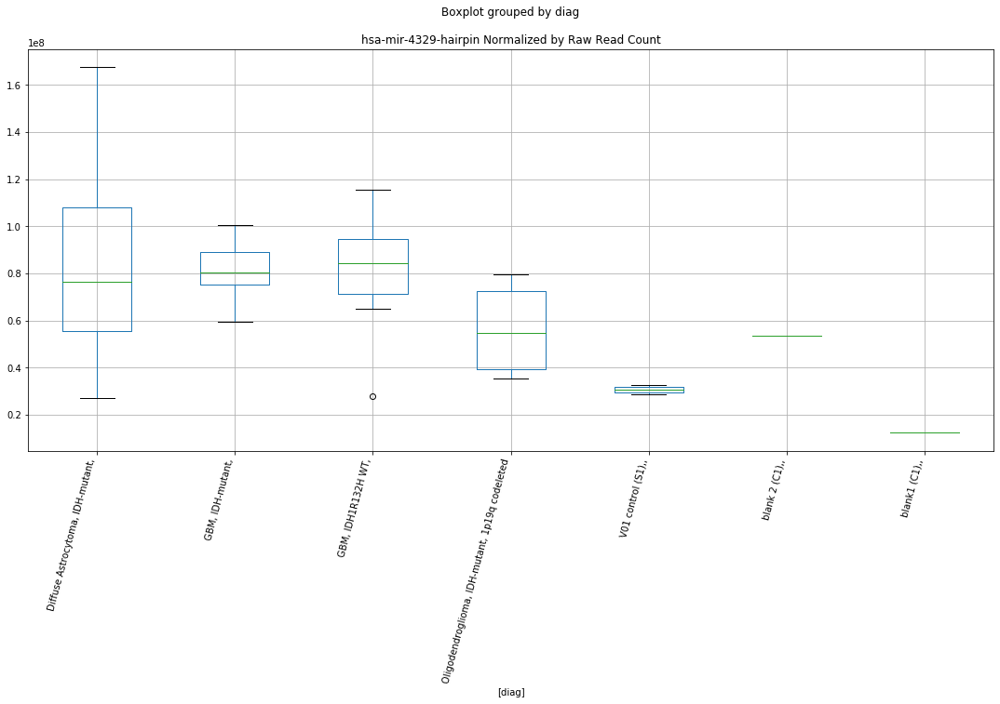

hsa-mir-4329-hairpin D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.5237019363430044
	p = 0.0024256213211028255
hsa-mir-4329-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.5237019363430044
	p = 0.0024256213211028255
hsa-mir-4329-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.6296209090364164
	p = 0.017004972609967986
hsa-mir-4329-hairpin D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.6296209090364164
	p = 0.017004972609967986


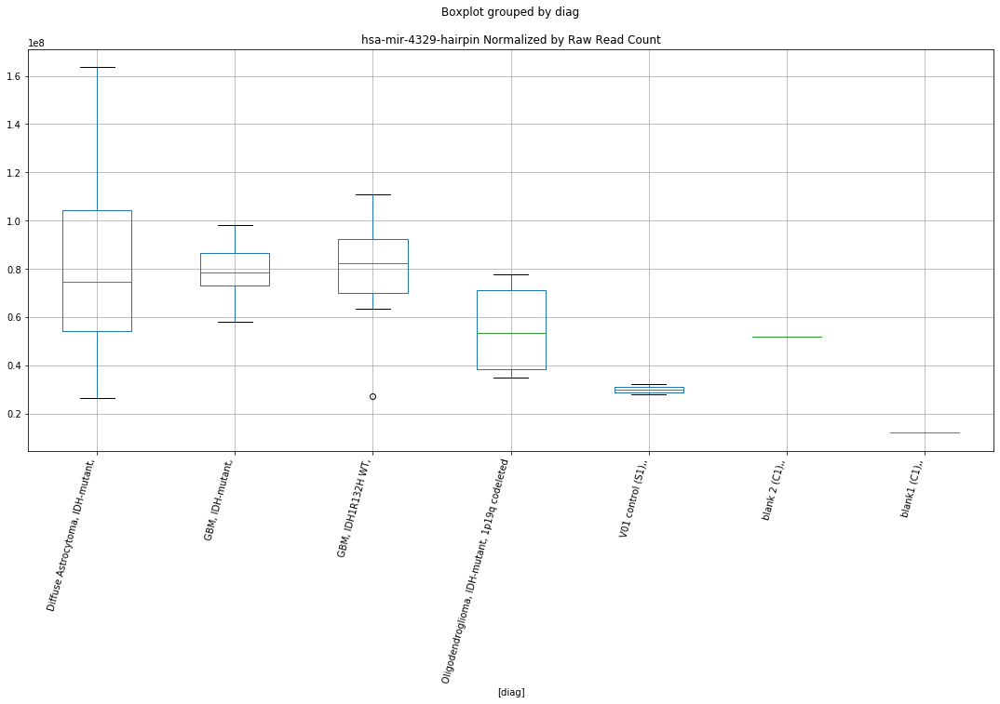

hsa-mir-4329-hairpin D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8737055101916367
	p = 0.07729992256733362
hsa-mir-4329-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8737055101916367
	p = 0.07729992256733362


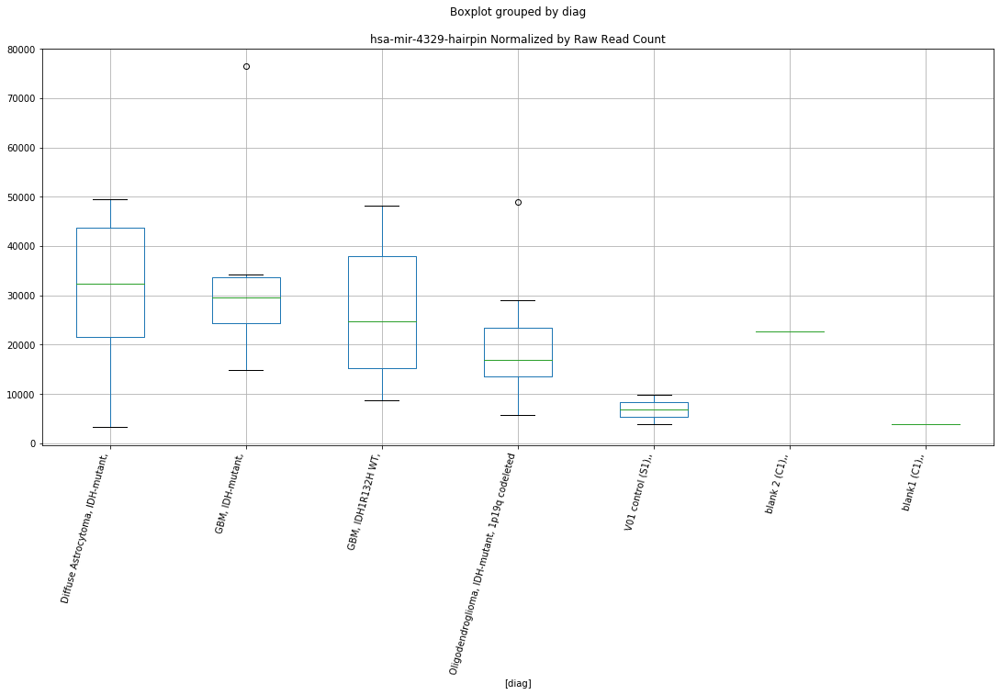

hsa-mir-4329-hairpin D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8723651723755432
	p = 0.07749421863850467
hsa-mir-4329-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8723651723755432
	p = 0.07749421863850467


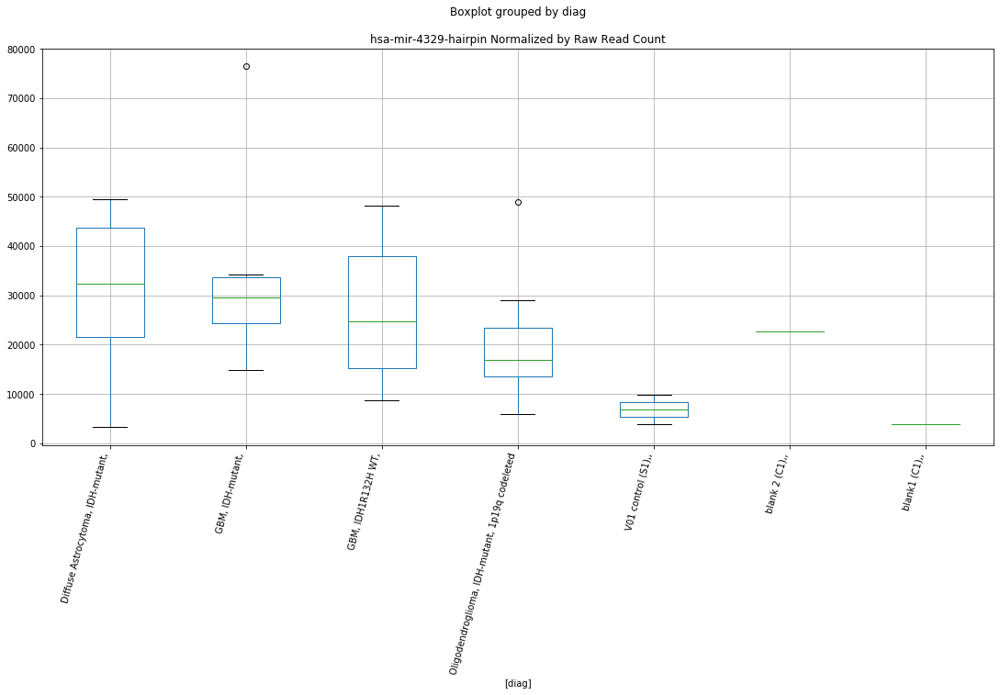

hsa-mir-4329-hairpin D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8723651723755432
	p = 0.07749421863850467
hsa-mir-4329-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8723651723755432
	p = 0.07749421863850467


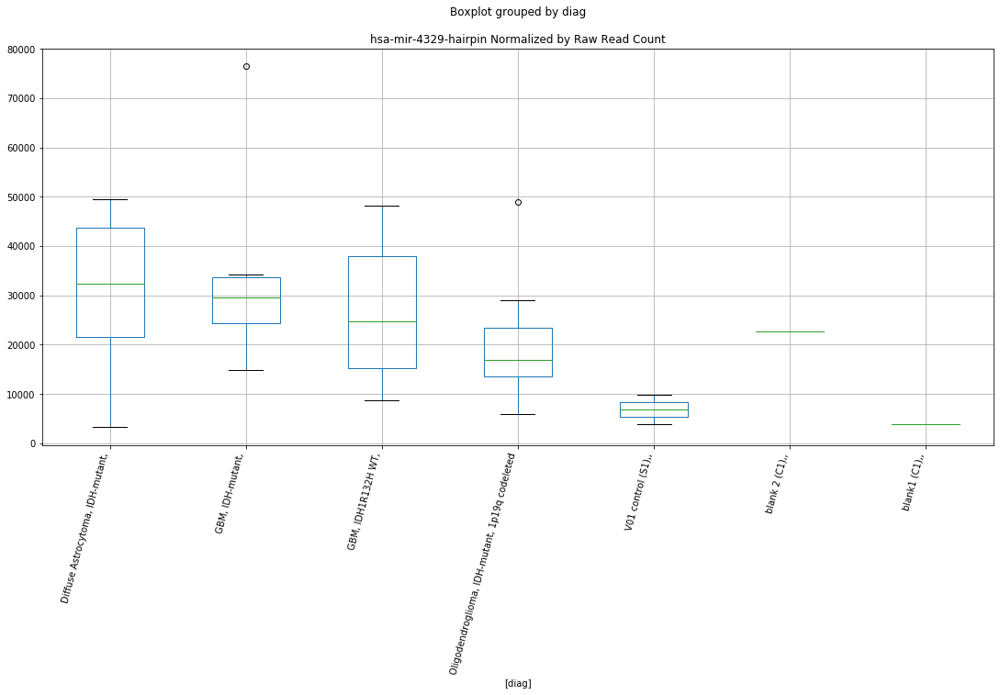

hsa-mir-5588-hairpin D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.14778499356789
	p = 0.00556530288080486
hsa-mir-5588-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.14778499356789
	p = 0.00556530288080486


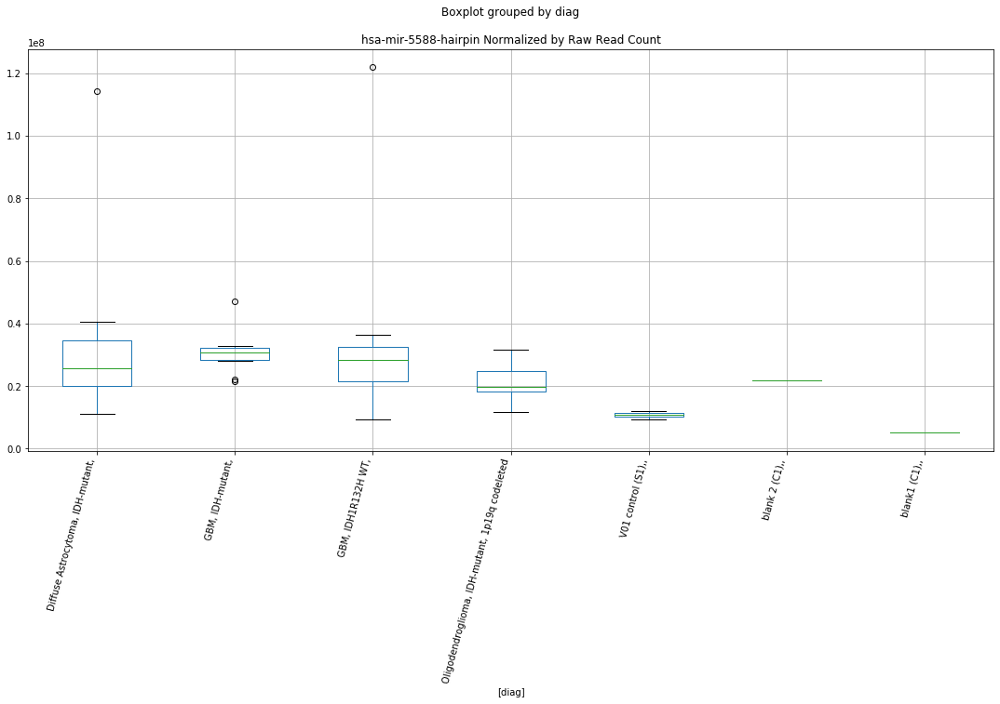

hsa-mir-5588-hairpin D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.1285077149119993
	p = 0.005805483380636262
hsa-mir-5588-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.1285077149119993
	p = 0.005805483380636262


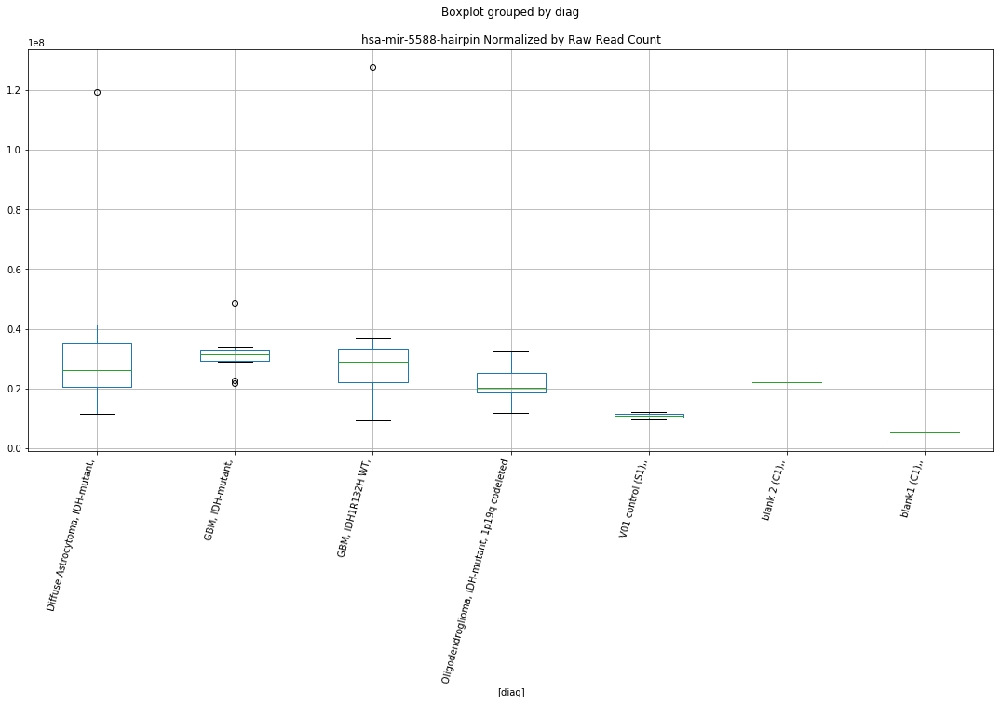

hsa-mir-92b-hairpin D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.6438725472818896
	p = 0.016501117268802438
hsa-mir-92b-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.6438725472818896
	p = 0.016501117268802438


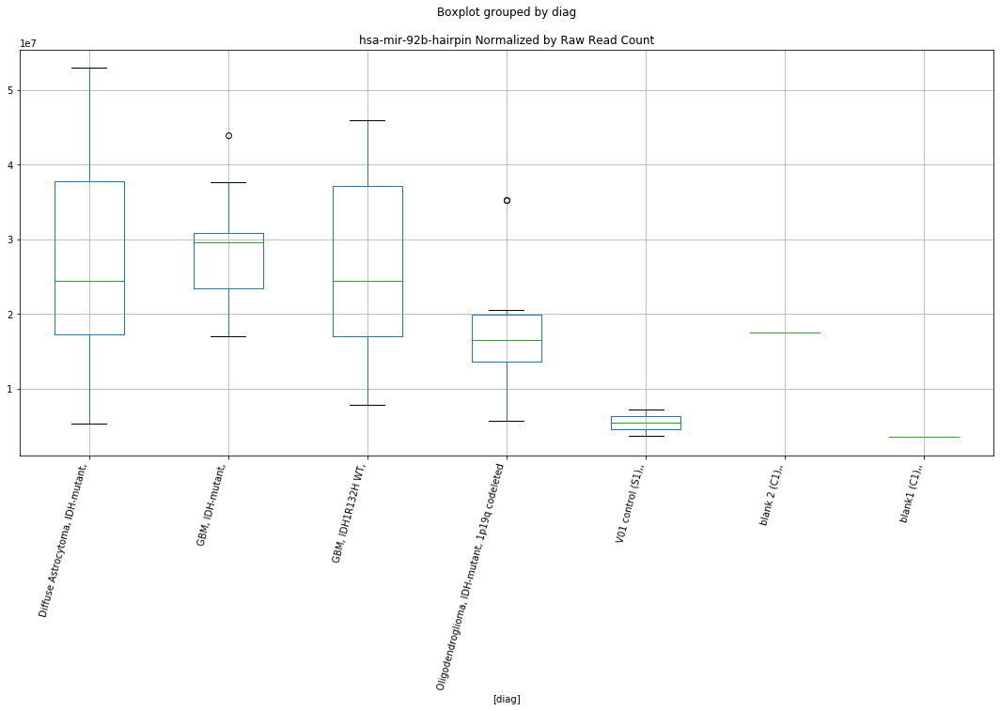

hsa-mir-92b-hairpin D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.6435708296548426
	p = 0.016511635501954013
hsa-mir-92b-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.6435708296548426
	p = 0.016511635501954013


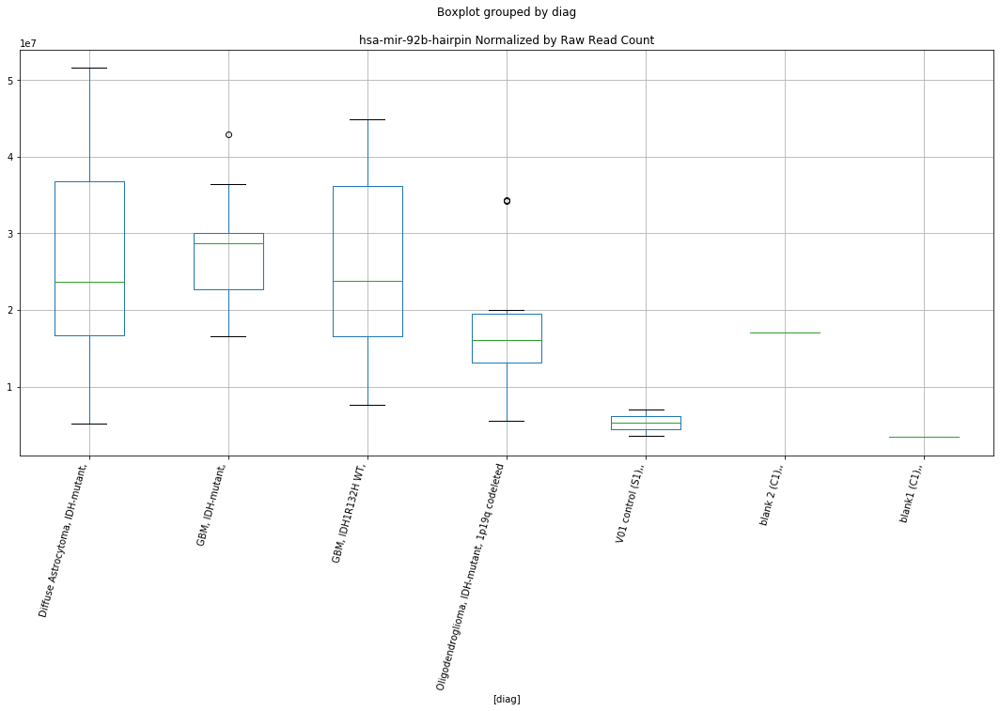

hsa-mir-92b-hairpin D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.8930073793293603
	p = 0.009690609540270947
hsa-mir-92b-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.8930073793293603
	p = 0.009690609540270947


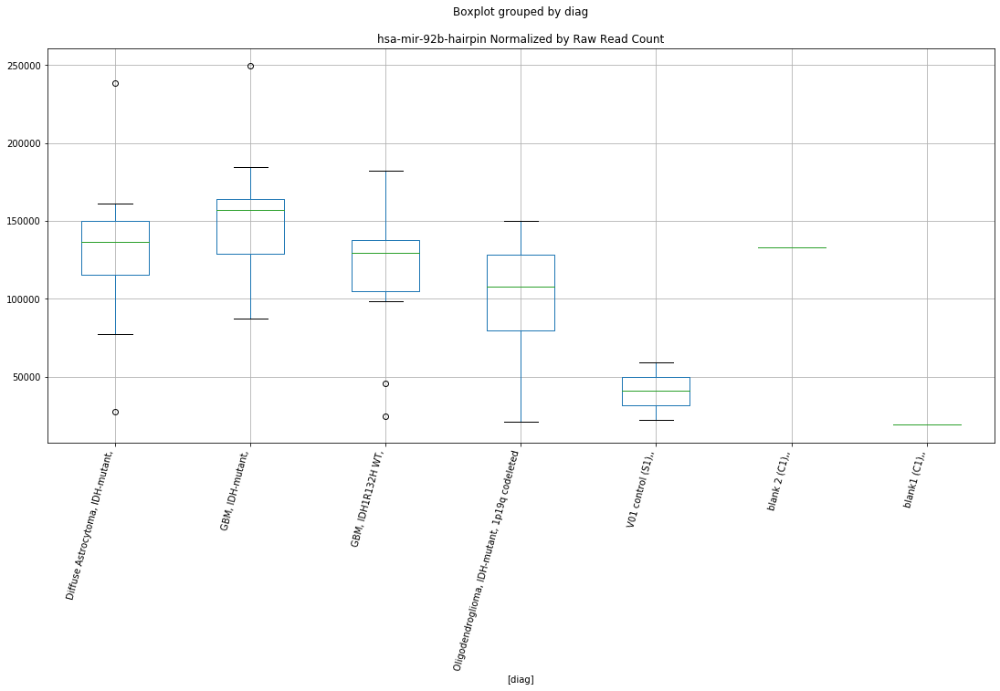

hsa-mir-92b-hairpin D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.8937639832269197
	p = 0.009674794892764868
hsa-mir-92b-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.8937639832269197
	p = 0.009674794892764868


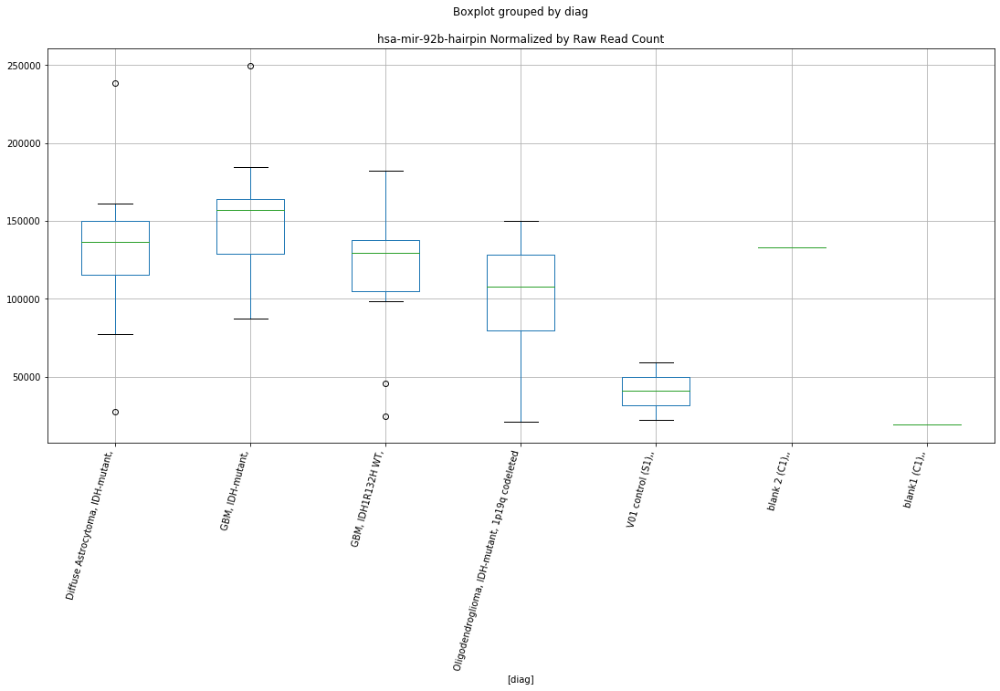

hsa-mir-92b-hairpin D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.8944261128964666
	p = 0.009660975411484167
hsa-mir-92b-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.8944261128964666
	p = 0.009660975411484167


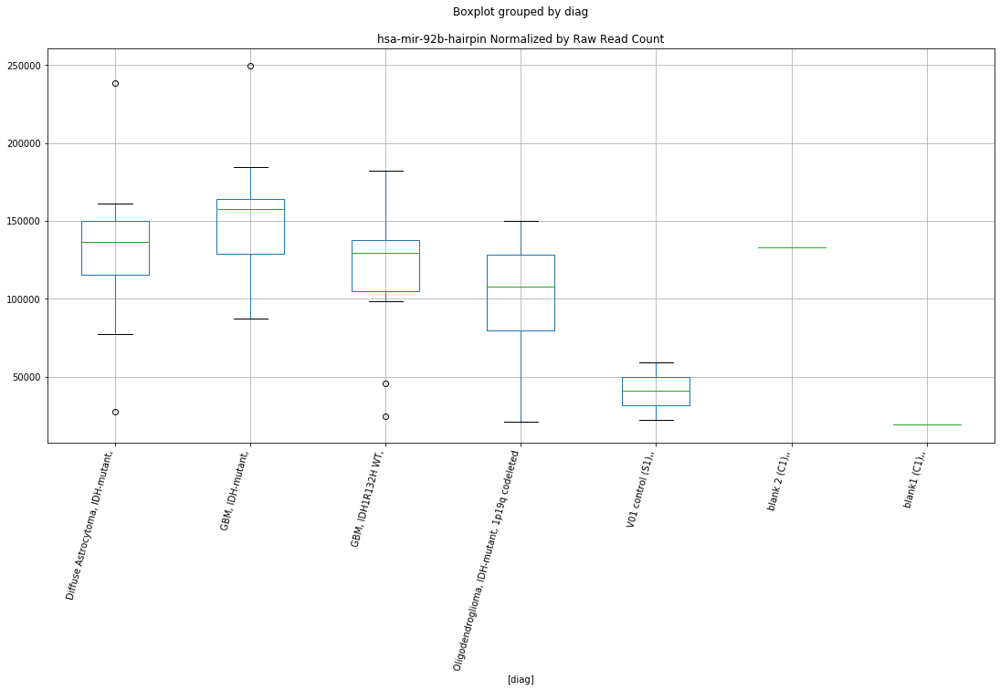

hsa-mir-4271-hairpin D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.887744493798923
	p = 0.0752905533744042
hsa-mir-4271-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.887744493798923
	p = 0.0752905533744042


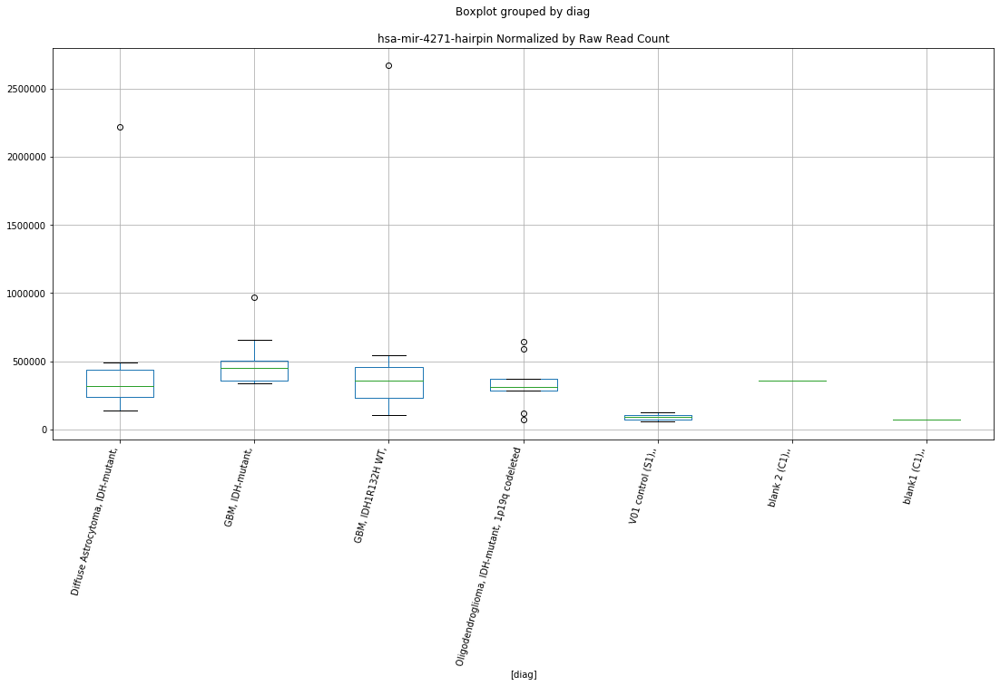

hsa-mir-4271-hairpin D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.887744493798923
	p = 0.0752905533744042
hsa-mir-4271-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.887744493798923
	p = 0.0752905533744042


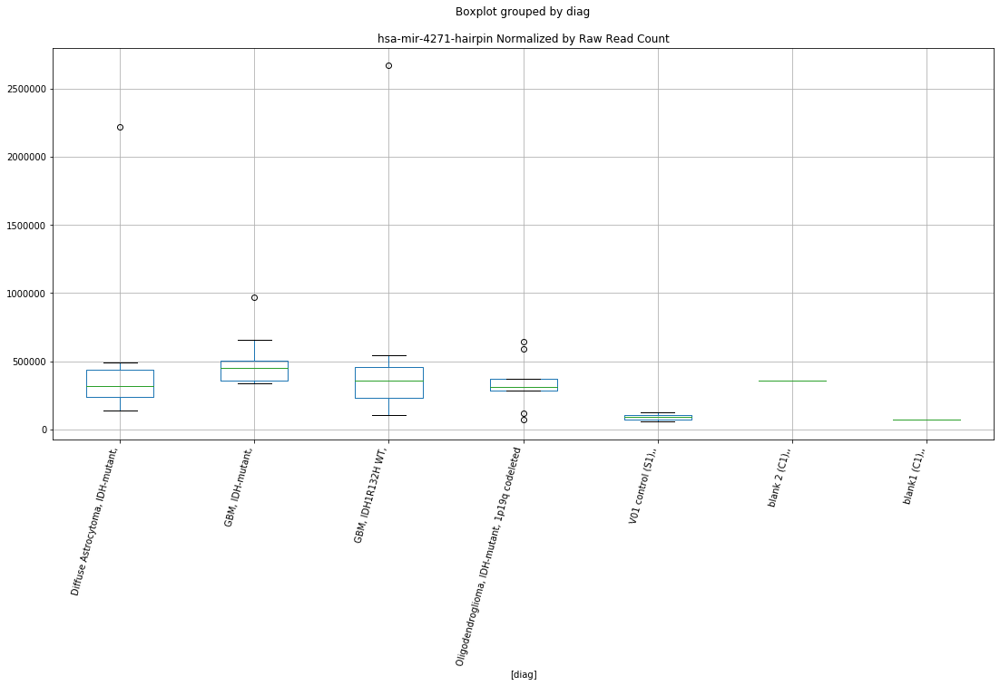

hsa-mir-4271-hairpin D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.887744493798923
	p = 0.0752905533744042
hsa-mir-4271-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.887744493798923
	p = 0.0752905533744042


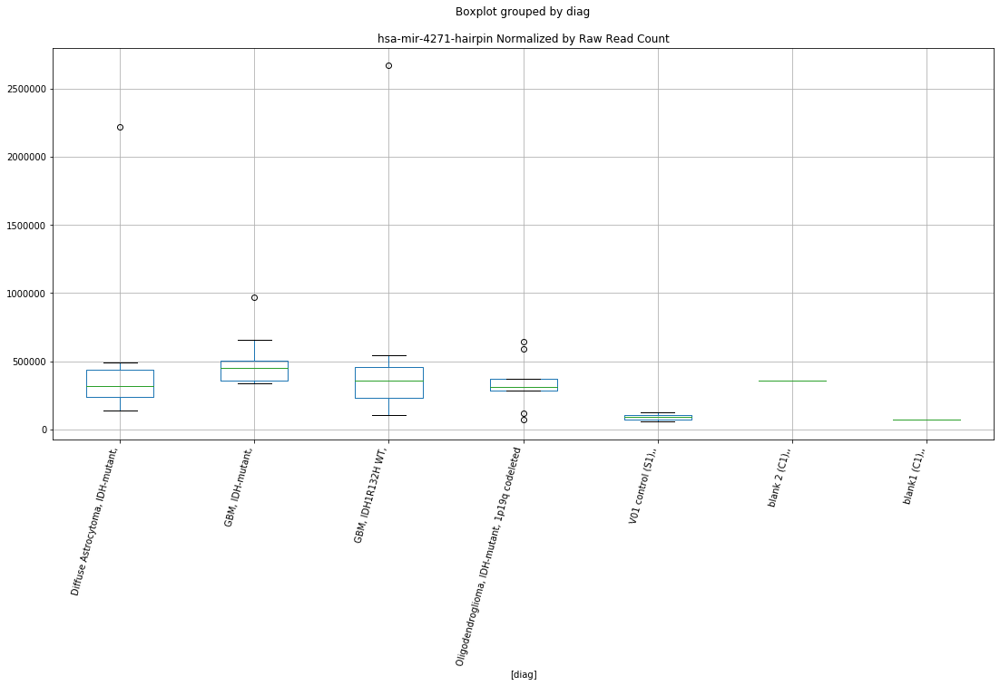

hsa-mir-548u-hairpin D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9083055337899084
	p = 0.07243115896079615
hsa-mir-548u-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.9083055337899084
	p = 0.07243115896079615
hsa-mir-548u-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.355745412259572
	p = 0.030026611726077252
hsa-mir-548u-hairpin D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.355745412259572
	p = 0.030026611726077252


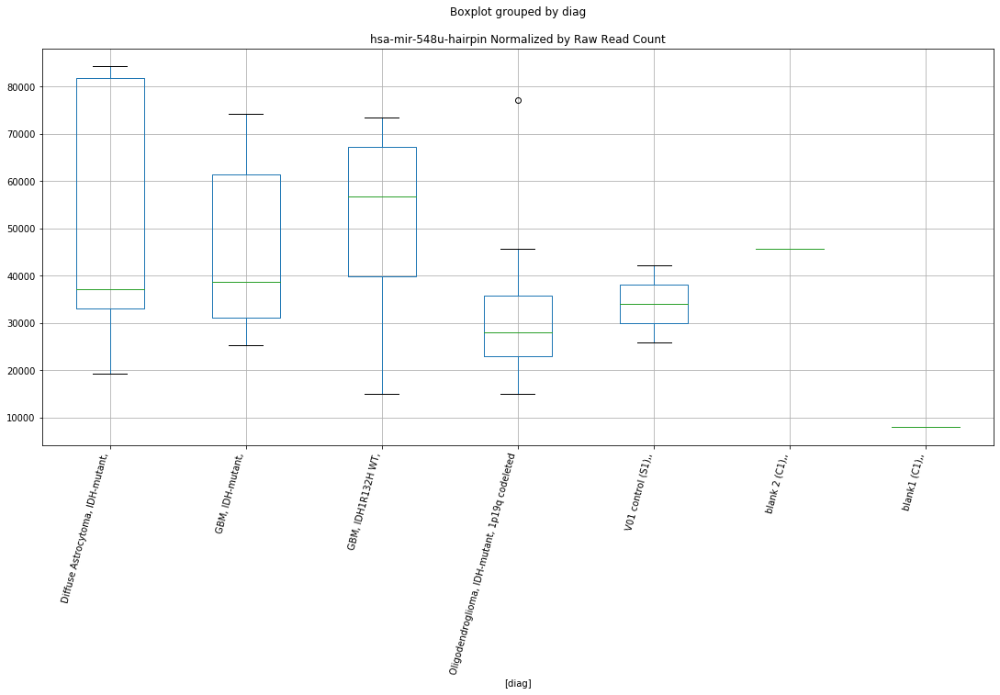

hsa-mir-548u-hairpin D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9083055337899084
	p = 0.07243115896079615
hsa-mir-548u-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.9083055337899084
	p = 0.07243115896079615
hsa-mir-548u-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.355745412259572
	p = 0.030026611726077252
hsa-mir-548u-hairpin D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.355745412259572
	p = 0.030026611726077252


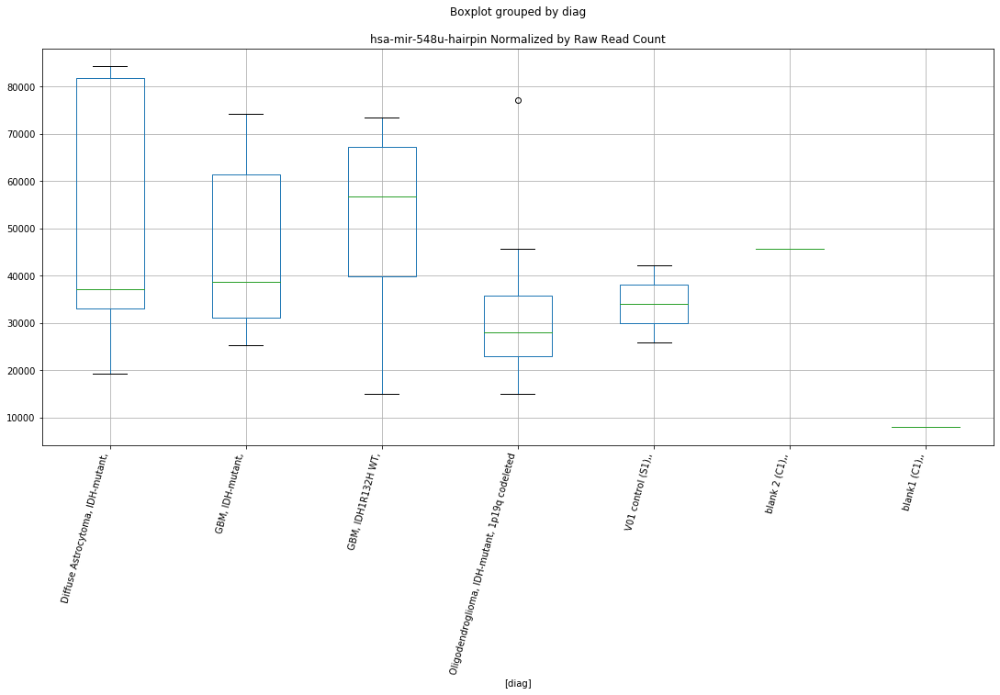

hsa-mir-548u-hairpin D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9083055337899084
	p = 0.07243115896079615
hsa-mir-548u-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.9083055337899084
	p = 0.07243115896079615
hsa-mir-548u-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.355745412259572
	p = 0.030026611726077252
hsa-mir-548u-hairpin D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.355745412259572
	p = 0.030026611726077252


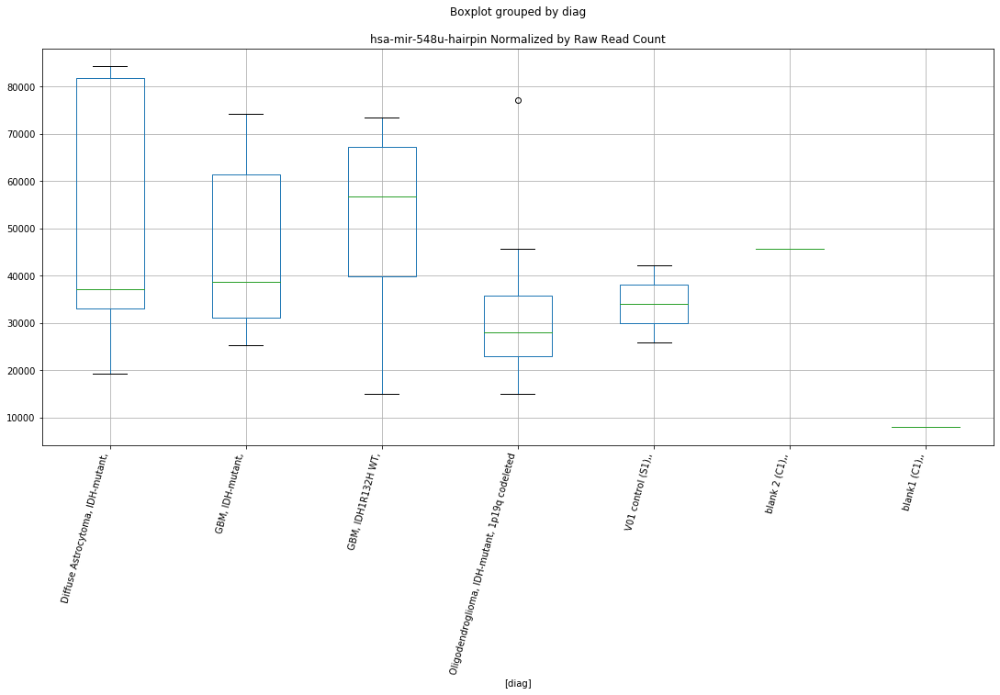

hsa-mir-3908-hairpin D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2787412961772935
	p = 0.03510420011320148
hsa-mir-3908-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.2787412961772935
	p = 0.03510420011320148
hsa-mir-3908-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.2142650039021716
	p = 0.039955146433649155
hsa-mir-3908-hairpin D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2142650039021716
	p = 0.039955146433649155


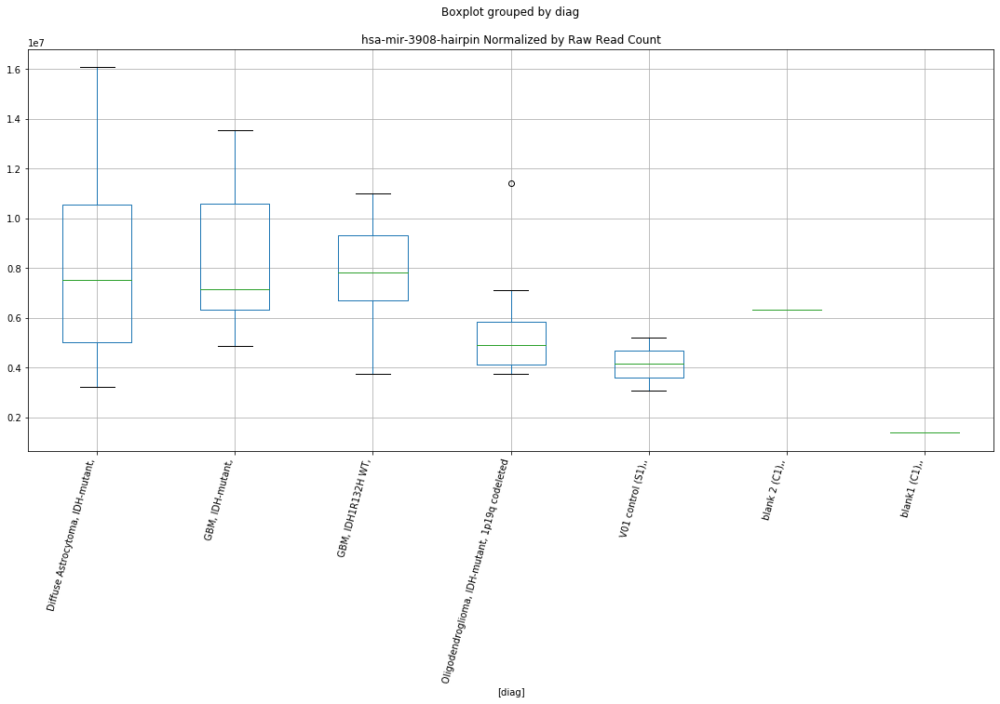

hsa-mir-3908-hairpin D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.386862711201131
	p = 0.028175805880655328
hsa-mir-3908-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.386862711201131
	p = 0.028175805880655328
hsa-mir-3908-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.29339884298453
	p = 0.0340802105172627
hsa-mir-3908-hairpin D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.29339884298453
	p = 0.0340802105172627


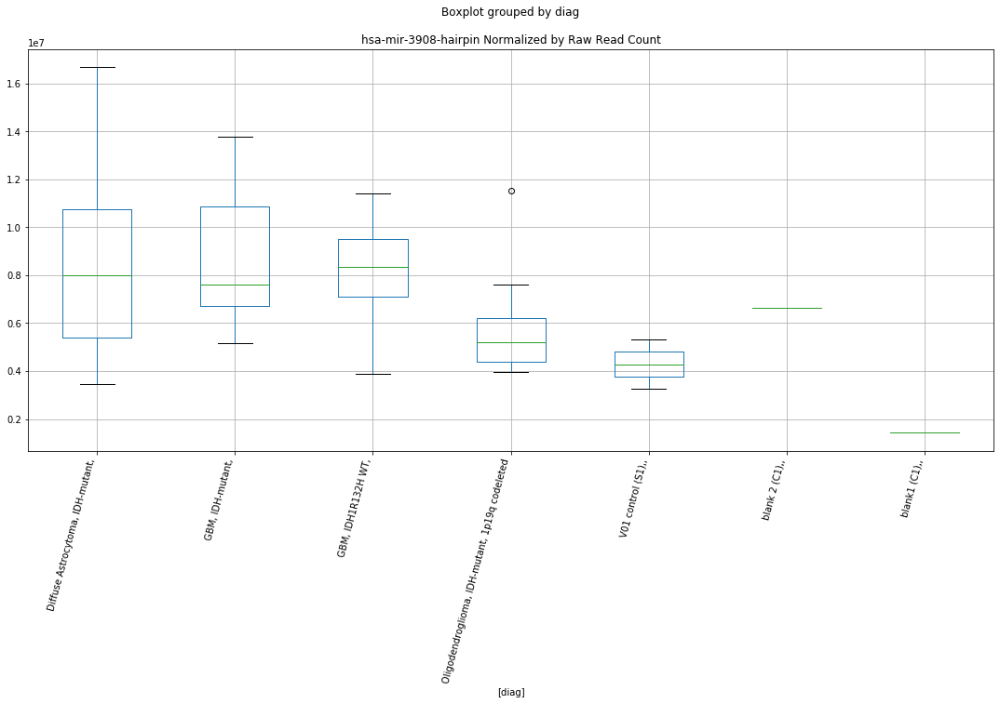

hsa-mir-8086-hairpin D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9585653007337365
	p = 0.06584387980687532
hsa-mir-8086-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9585653007337365
	p = 0.06584387980687532


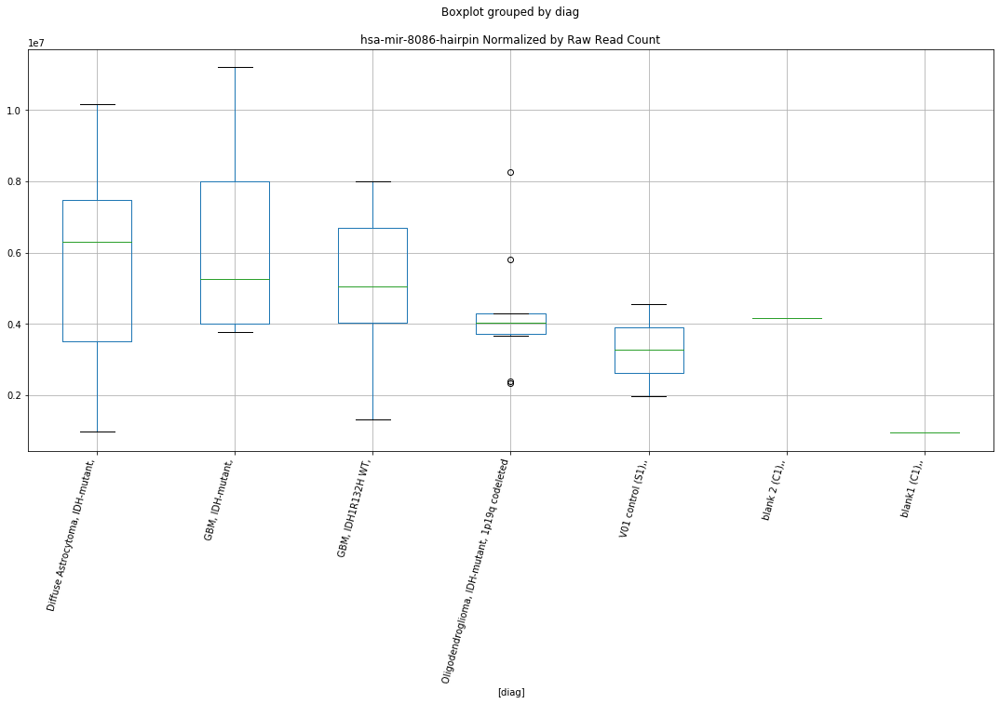

hsa-mir-8086-hairpin D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9587639473531147
	p = 0.06581894146424687
hsa-mir-8086-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9587639473531147
	p = 0.06581894146424687


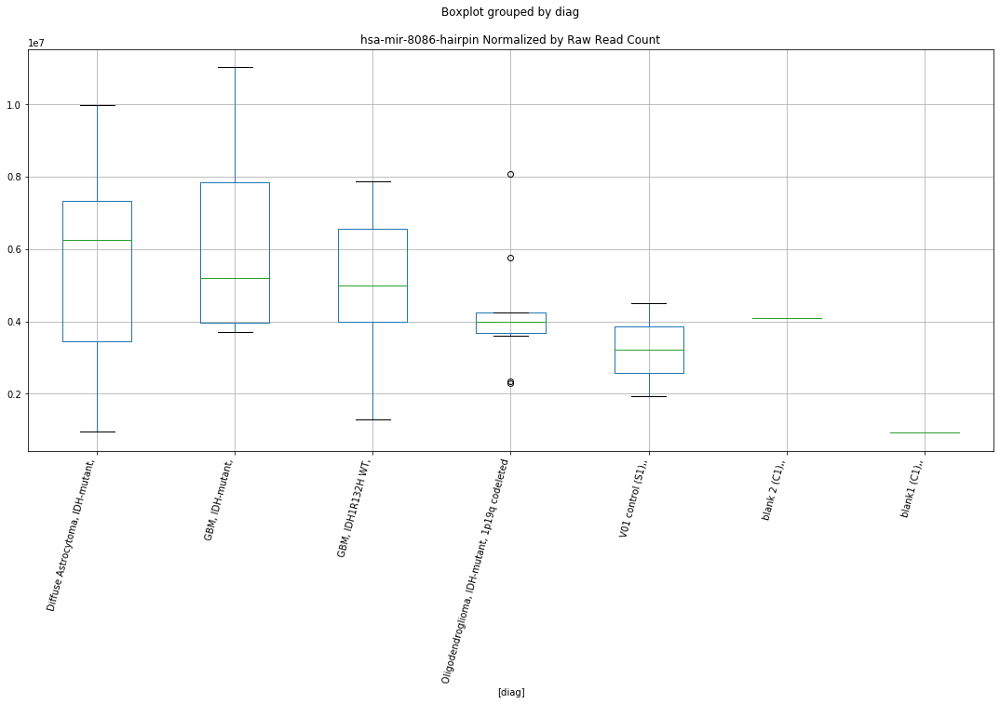

hsa-mir-137-hairpin Lexogen bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = 1.8578552785381084
	p = 0.07962534278396312
hsa-mir-137-hairpin Lexogen bbduk1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -1.8578552785381084
	p = 0.07962534278396312


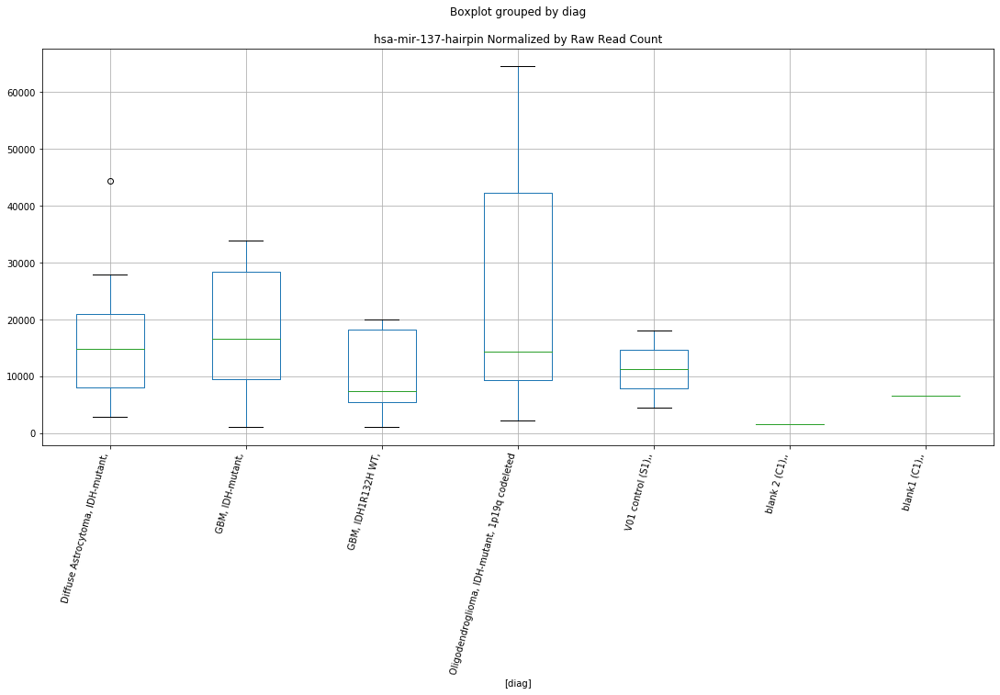

hsa-mir-4668-hairpin D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.712925163648107
	p = 0.01425471255625158
hsa-mir-4668-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.712925163648107
	p = 0.01425471255625158


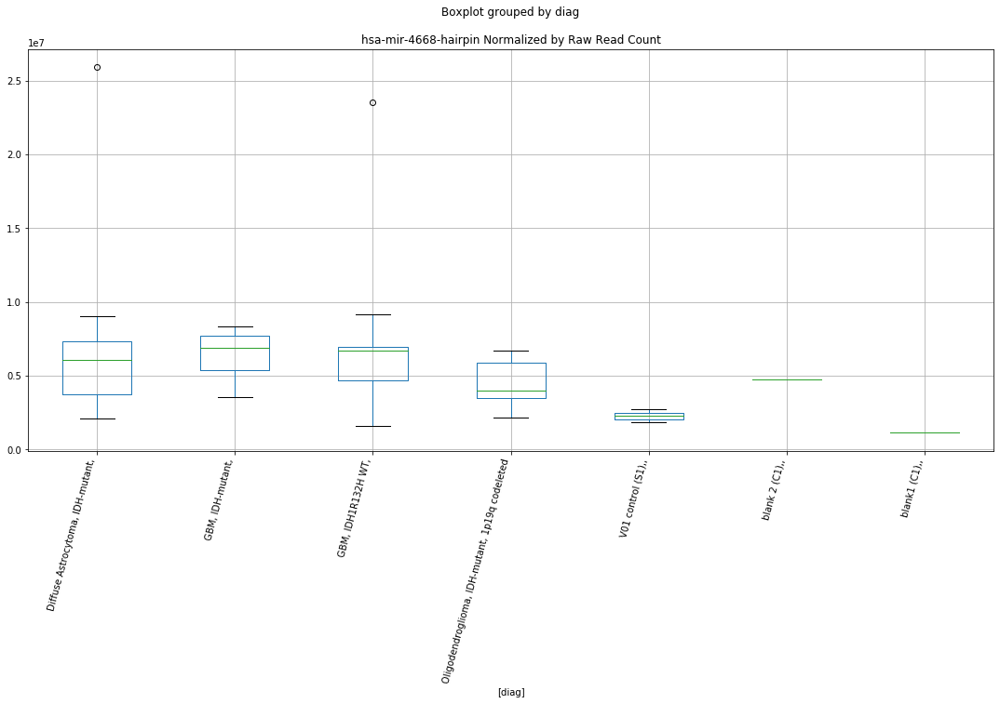

hsa-mir-4668-hairpin D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.7120766073116553
	p = 0.014280454627348343
hsa-mir-4668-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.7120766073116553
	p = 0.014280454627348343


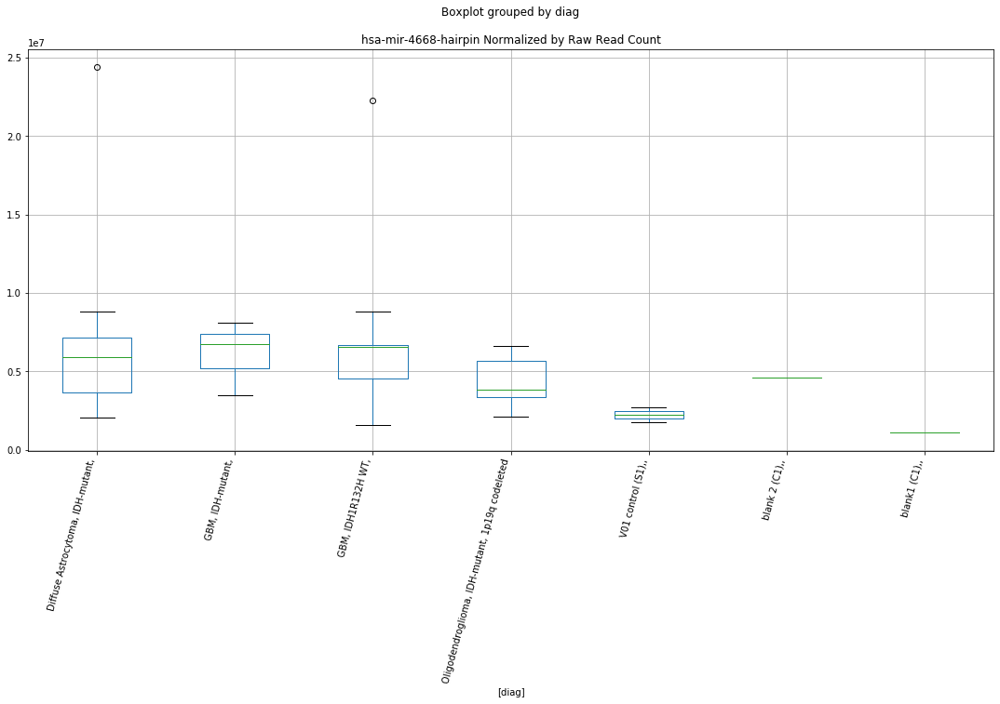

hsa-mir-4668-hairpin D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9550348932360295
	p = 0.06628850223649456
hsa-mir-4668-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9550348932360295
	p = 0.06628850223649456
hsa-mir-4668-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9569336046974835
	p = 0.06604904469440843
hsa-mir-4668-hairpin D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9569336046974835
	p = 0.06604904469440843


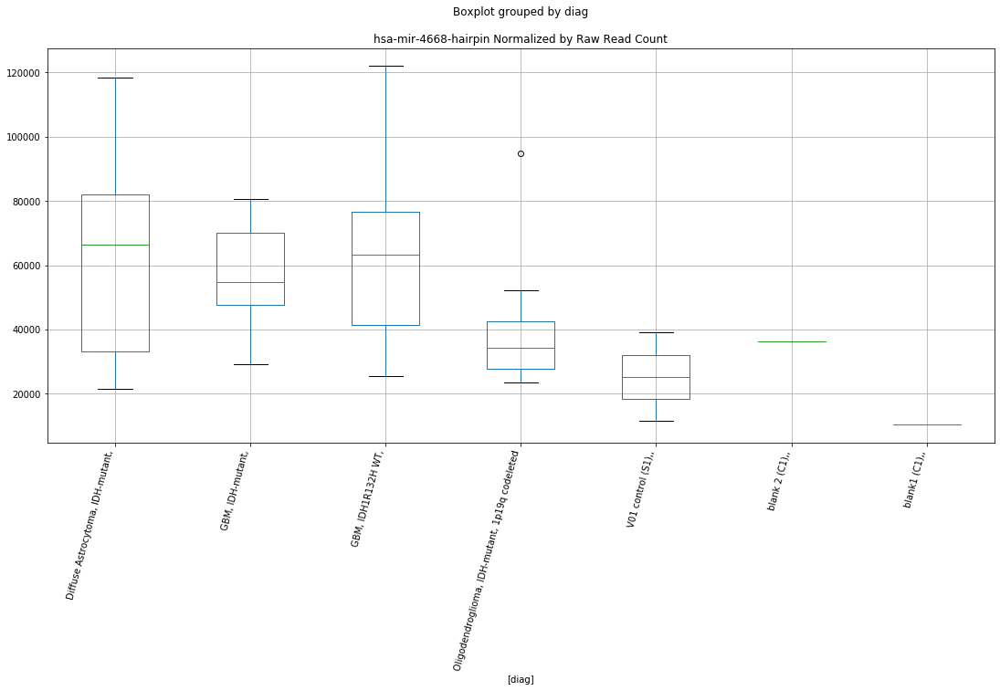

hsa-mir-4668-hairpin D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.95362060758196
	p = 0.06646736965608846
hsa-mir-4668-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.95362060758196
	p = 0.06646736965608846
hsa-mir-4668-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9583849633426769
	p = 0.06586652689856964
hsa-mir-4668-hairpin D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9583849633426769
	p = 0.06586652689856964


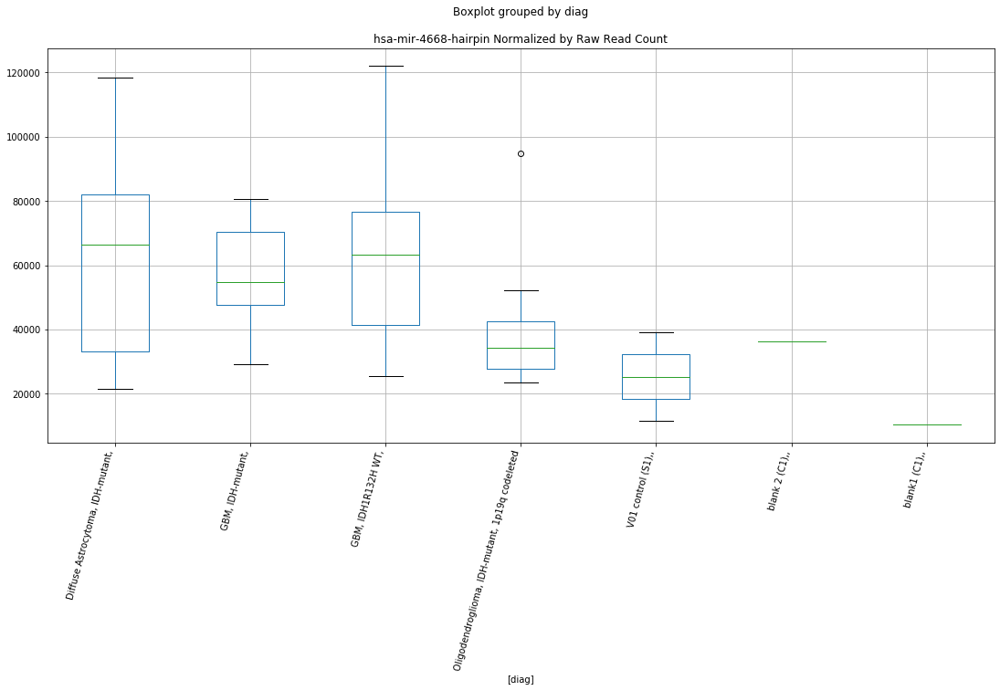

hsa-mir-4668-hairpin D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.953971701912039
	p = 0.06642292590562762
hsa-mir-4668-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.953971701912039
	p = 0.06642292590562762
hsa-mir-4668-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9594242876180654
	p = 0.06573610218821499
hsa-mir-4668-hairpin D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9594242876180654
	p = 0.06573610218821499


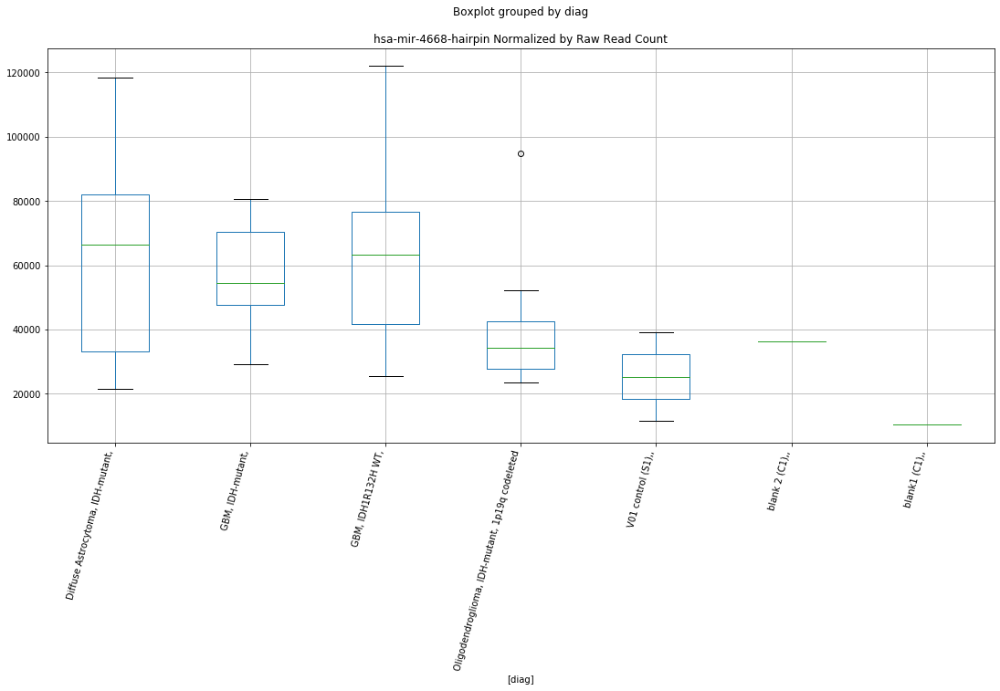

hsa-mir-4668-5p-mature D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.6274342935493644
	p = 0.017083561649108556
hsa-mir-4668-5p-mature D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.6274342935493644
	p = 0.017083561649108556


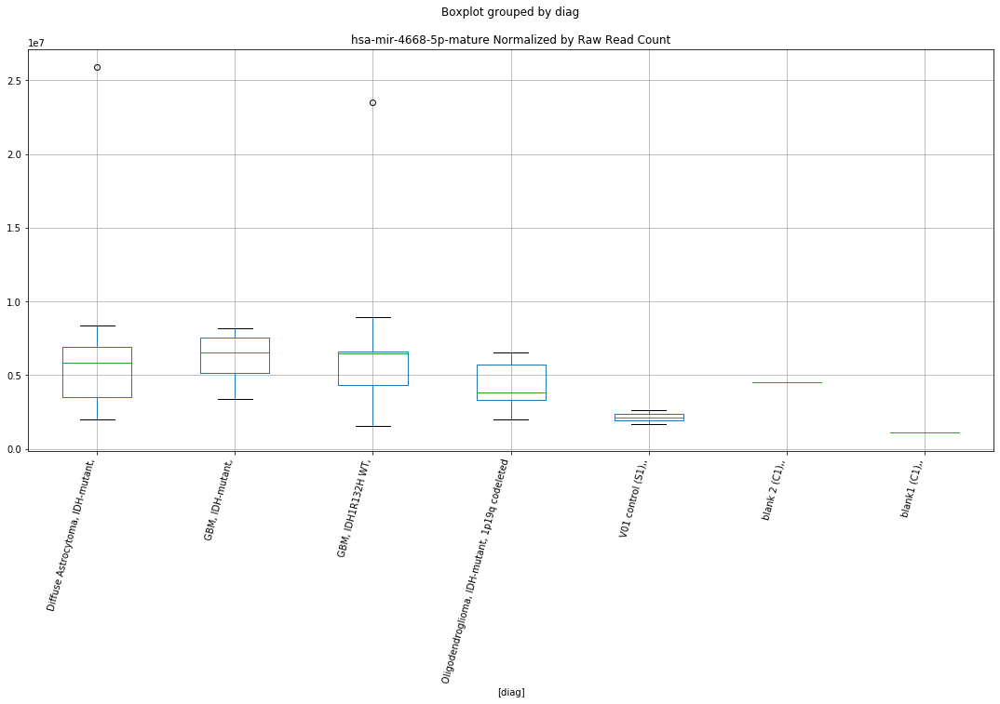

hsa-mir-4668-5p-mature D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.6238096526047254
	p = 0.017214595814596643
hsa-mir-4668-5p-mature D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.6238096526047254
	p = 0.017214595814596643


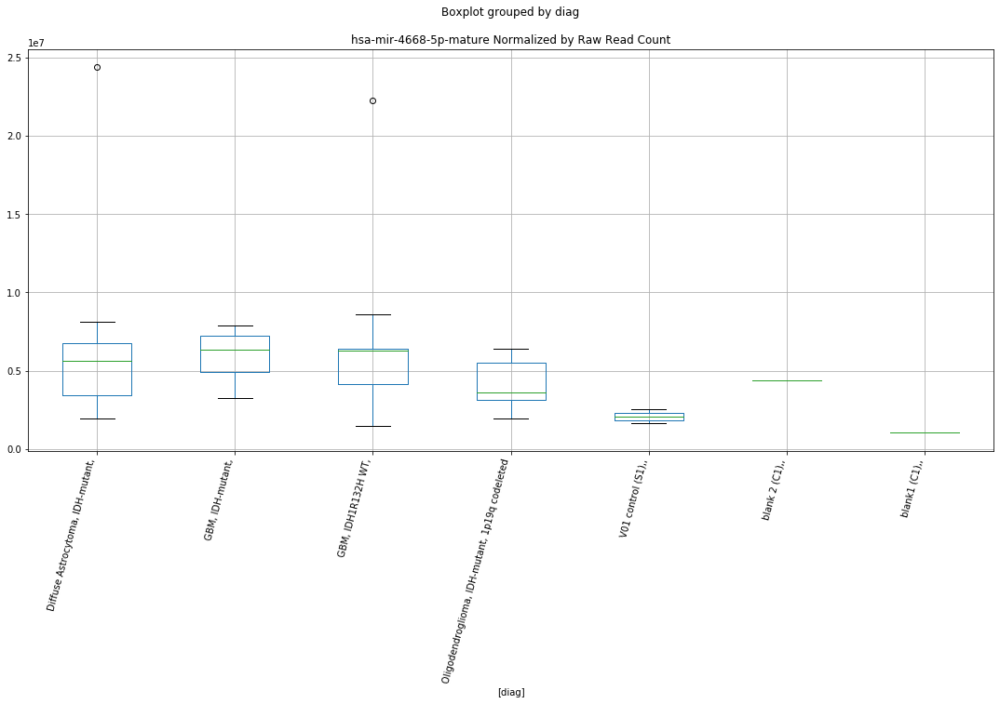

hsa-mir-4668-5p-mature D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.7413071478434095
	p = 0.013418827654261395
hsa-mir-4668-5p-mature D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.890842849591318
	p = 0.07485336934464526
hsa-mir-4668-5p-mature D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.7413071478434095
	p = 0.013418827654261395
hsa-mir-4668-5p-mature D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.890842849591318
	p = 0.07485336934464526


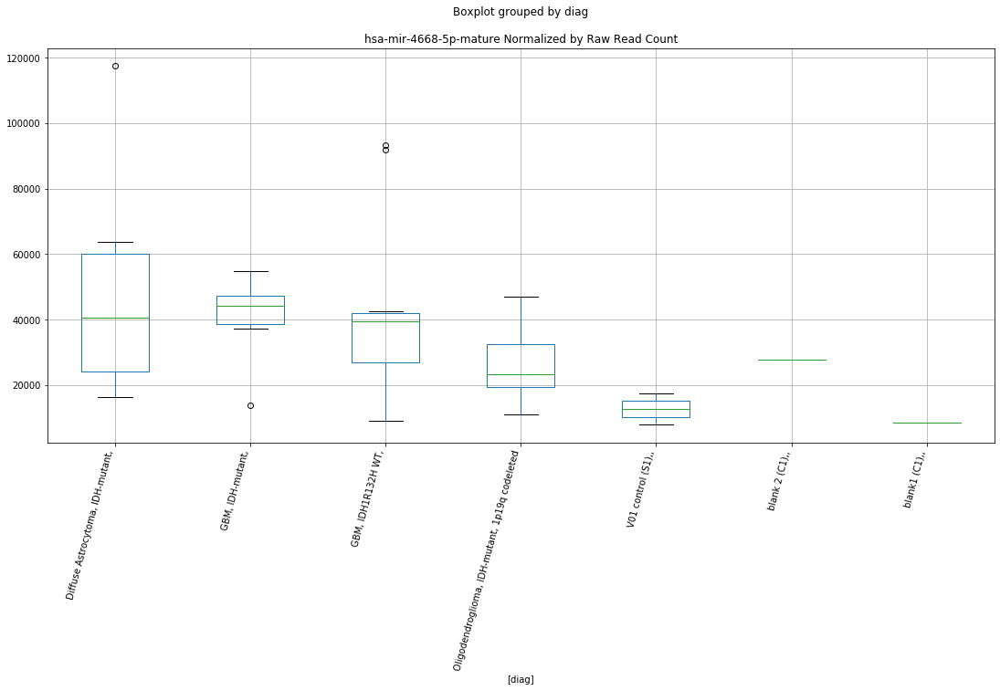

hsa-mir-4668-5p-mature D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.7386496386455965
	p = 0.013495058953980822
hsa-mir-4668-5p-mature D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.890842849591318
	p = 0.07485336934464526
hsa-mir-4668-5p-mature D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.7386496386455965
	p = 0.013495058953980822
hsa-mir-4668-5p-mature D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.890842849591318
	p = 0.07485336934464526


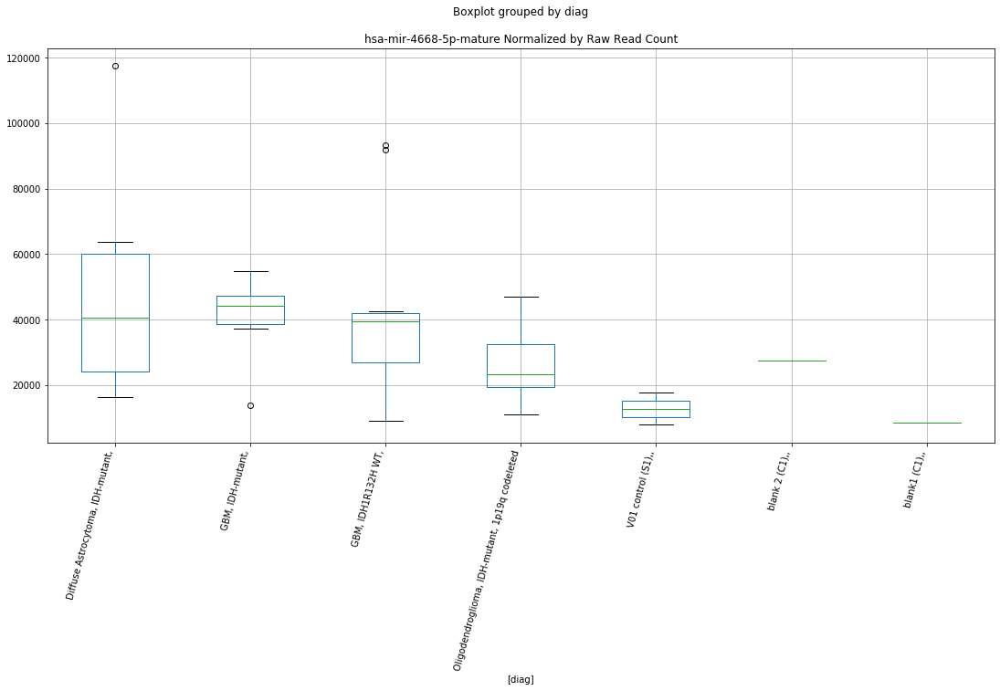

hsa-mir-4668-5p-mature D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.737305040740543
	p = 0.01353378686113515
hsa-mir-4668-5p-mature D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.890842849591318
	p = 0.07485336934464526
hsa-mir-4668-5p-mature D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.737305040740543
	p = 0.01353378686113515
hsa-mir-4668-5p-mature D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.890842849591318
	p = 0.07485336934464526


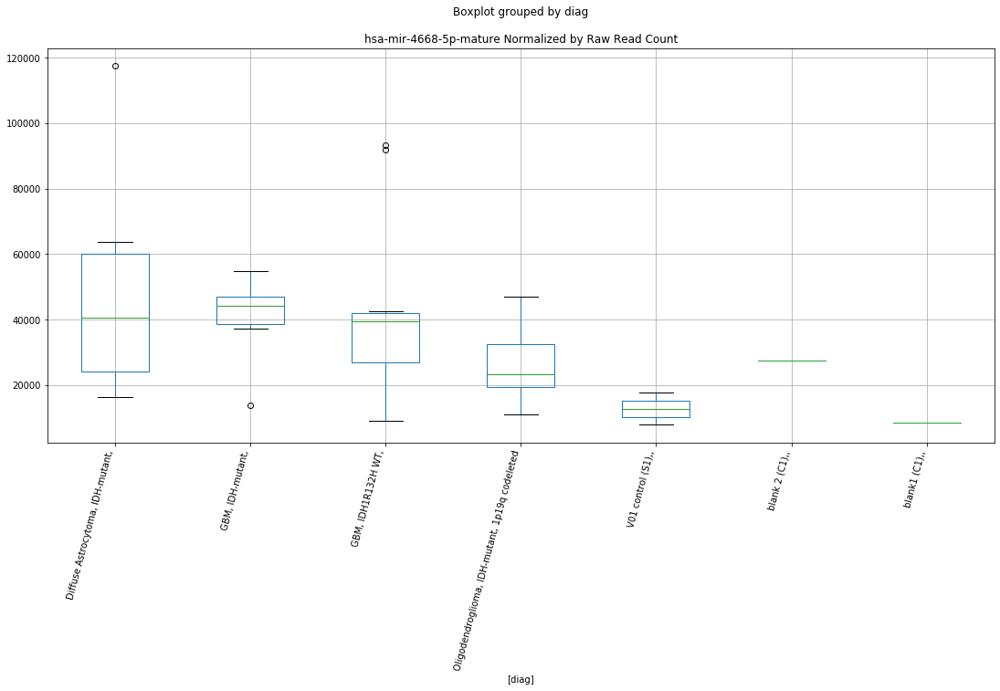

hsa-mir-484-hairpin D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.954376862152662
	p = 0.0663716711377031
hsa-mir-484-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.954376862152662
	p = 0.0663716711377031


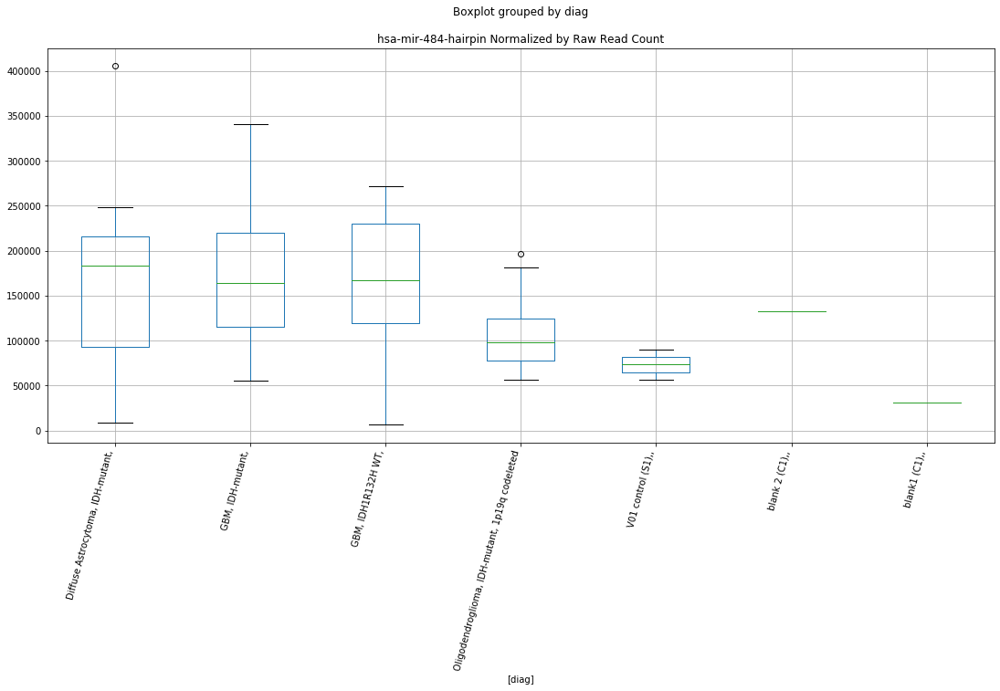

hsa-mir-484-hairpin D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9724783486618274
	p = 0.06411750196270265
hsa-mir-484-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9724783486618274
	p = 0.06411750196270265


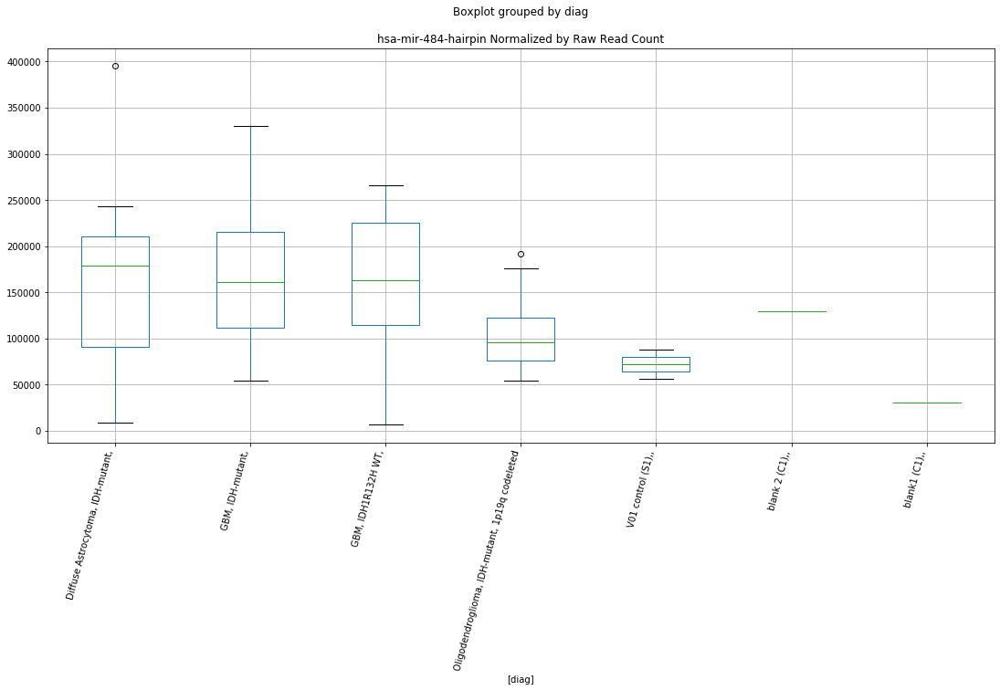

hsa-mir-484-hairpin D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.037293258149569
	p = 0.05659820153680575
hsa-mir-484-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.037293258149569
	p = 0.05659820153680575


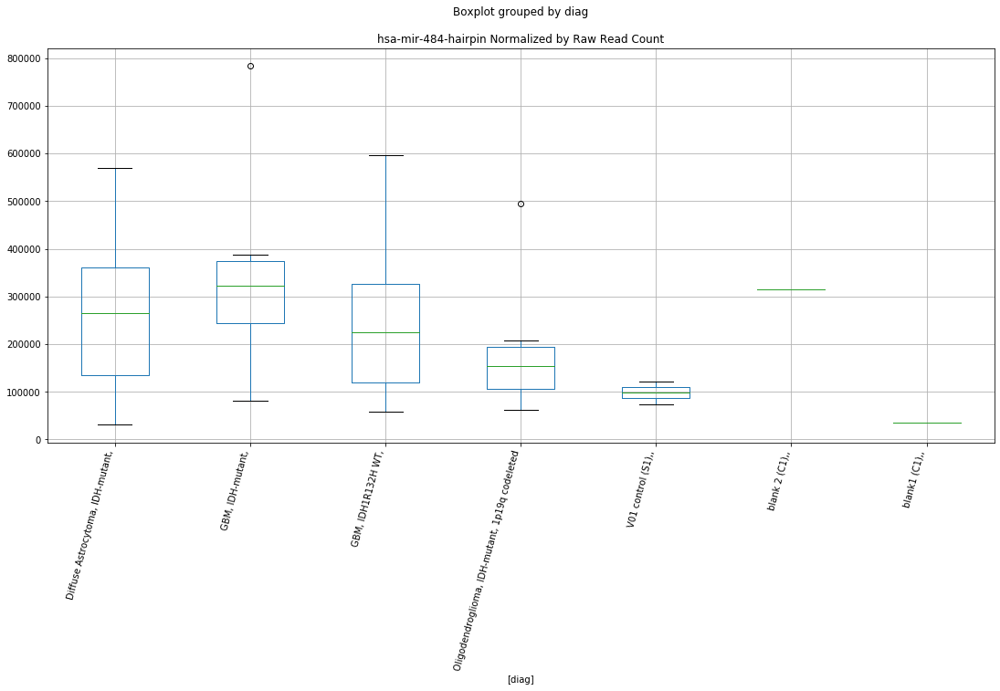

hsa-mir-484-hairpin D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.037267075536865
	p = 0.056601071441939856
hsa-mir-484-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.037267075536865
	p = 0.056601071441939856


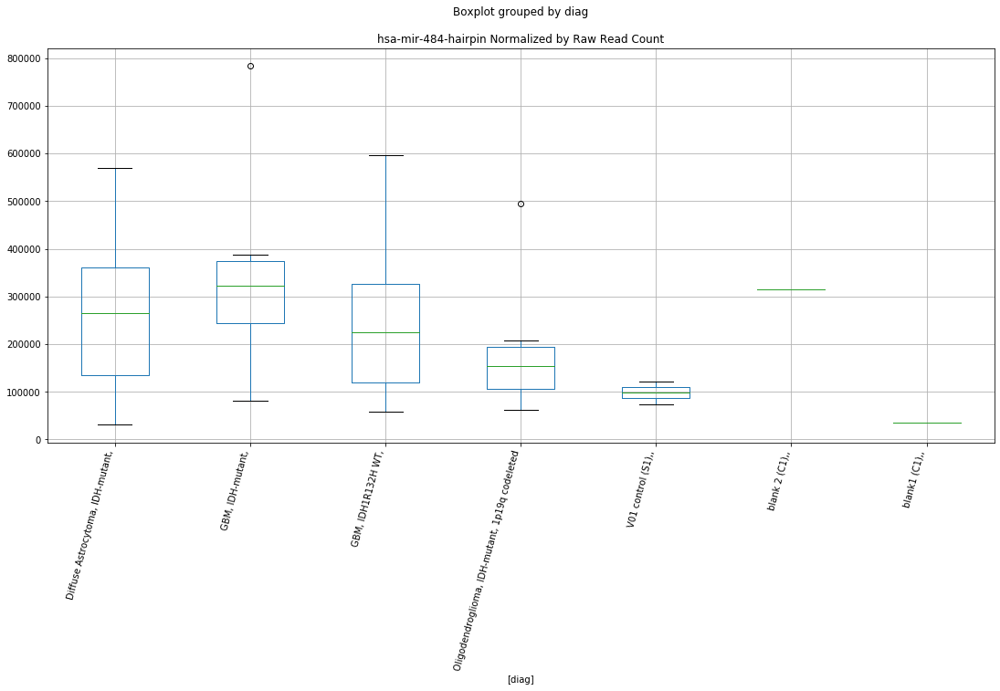

hsa-mir-484-hairpin D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.037584758080059
	p = 0.05656625877480279
hsa-mir-484-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.037584758080059
	p = 0.05656625877480279


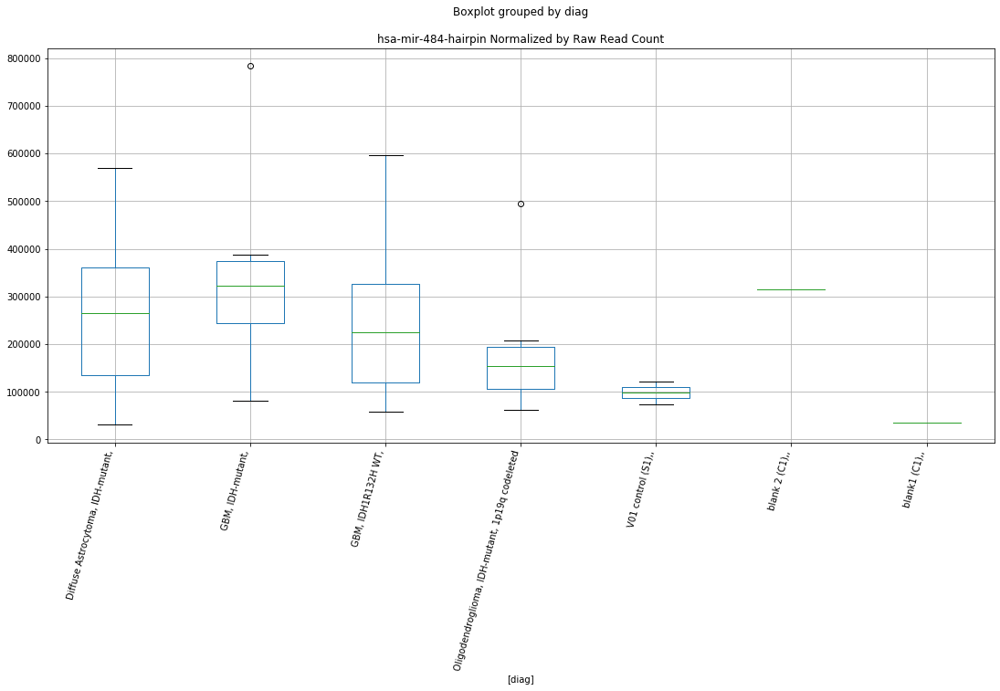

hsa-mir-3658-hairpin D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.328094431653935
	p = 0.031765678179135656
hsa-mir-3658-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.328094431653935
	p = 0.031765678179135656
hsa-mir-3658-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.261721445283831
	p = 0.03632890990291121
hsa-mir-3658-hairpin D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.261721445283831
	p = 0.03632890990291121


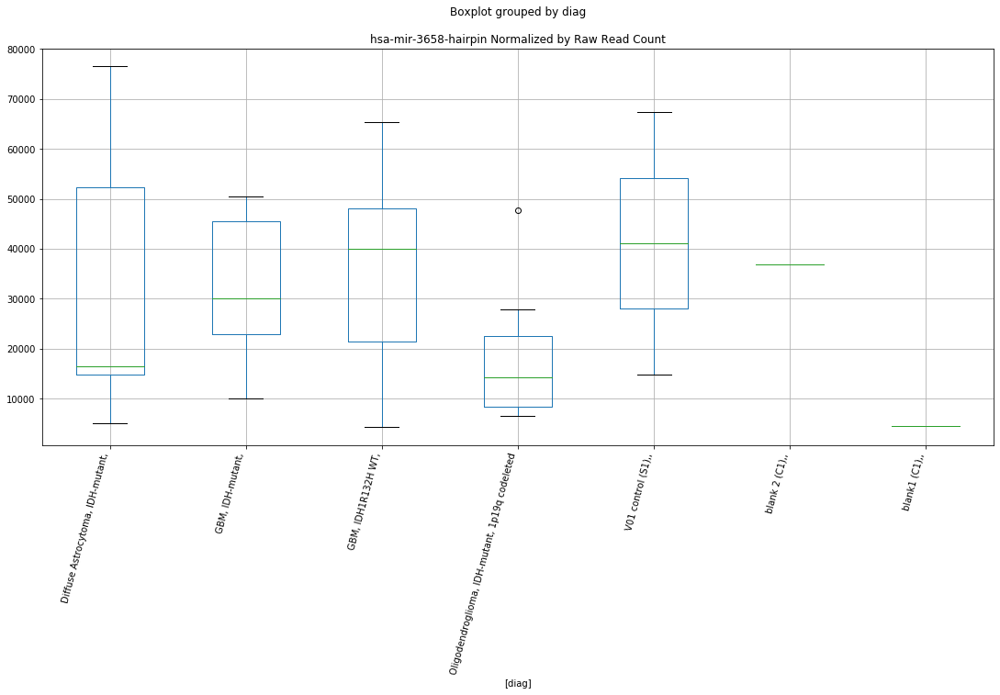

hsa-mir-3658-hairpin D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.3204155216175857
	p = 0.032264989387167195
hsa-mir-3658-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.3204155216175857
	p = 0.032264989387167195
hsa-mir-3658-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.2561709482813566
	p = 0.0367367716516041
hsa-mir-3658-hairpin D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2561709482813566
	p = 0.0367367716516041


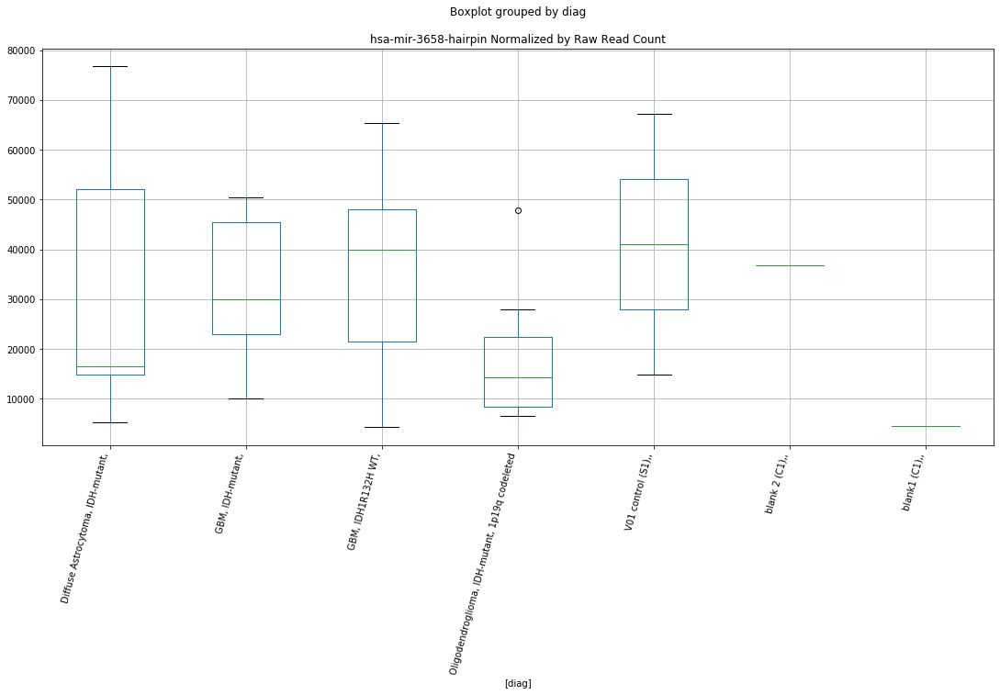

hsa-mir-3658-hairpin D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.328094431653935
	p = 0.031765678179135656
hsa-mir-3658-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.328094431653935
	p = 0.031765678179135656
hsa-mir-3658-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.261721445283831
	p = 0.03632890990291121
hsa-mir-3658-hairpin D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.261721445283831
	p = 0.03632890990291121


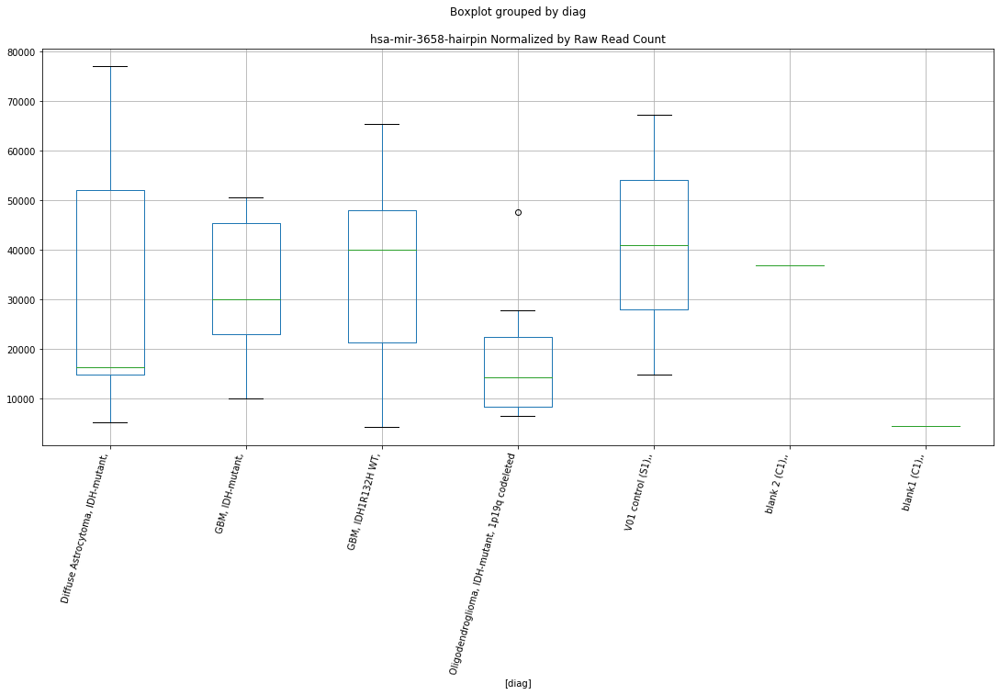

hsa-mir-509-1-hairpin D-plex bbduk2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.3942419776572446
	p = 0.027752804387029602
hsa-mir-509-1-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.3942419776572446
	p = 0.027752804387029602
hsa-mir-509-1-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.1608594870026043
	p = 0.04443217163911739
hsa-mir-509-1-hairpin D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.1608594870026043
	p = 0.04443217163911739


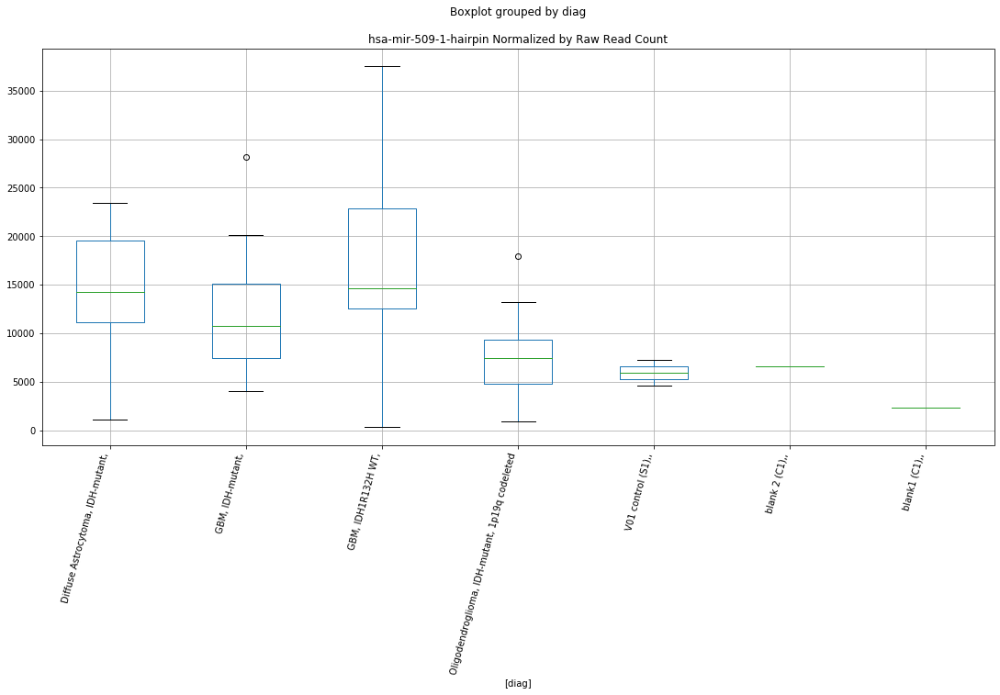

hsa-mir-509-1-hairpin D-plex bbduk3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.3780853592744666
	p = 0.02868678970720762
hsa-mir-509-1-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.3780853592744666
	p = 0.02868678970720762
hsa-mir-509-1-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.176872778620486
	p = 0.043043739379572524
hsa-mir-509-1-hairpin D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.176872778620486
	p = 0.043043739379572524


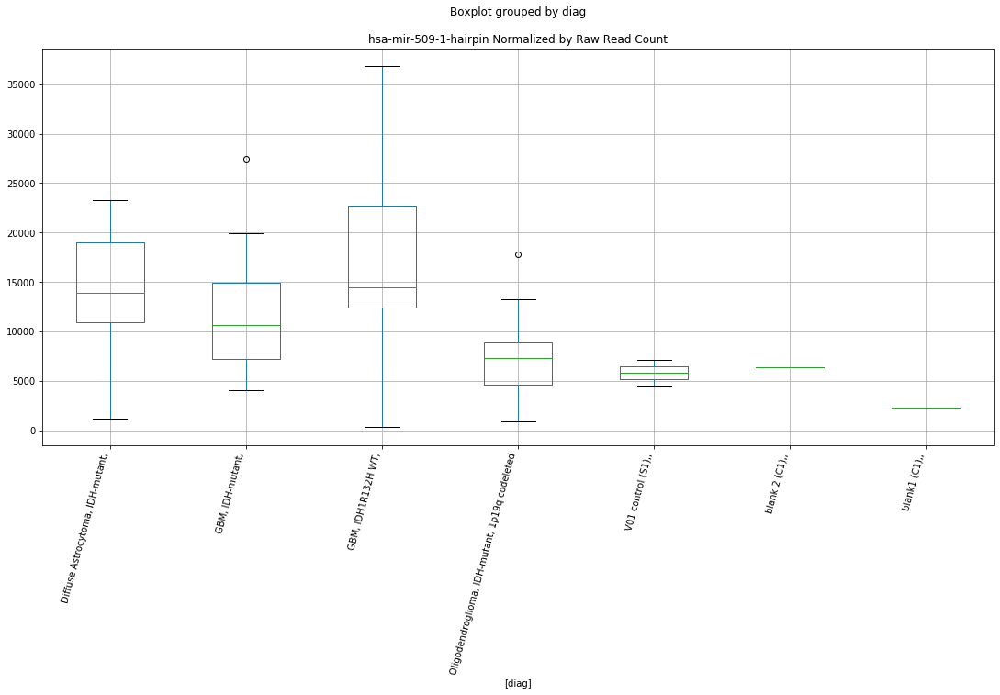

hsa-mir-509-2-hairpin D-plex bbduk2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.3995664602615627
	p = 0.027451283442649858
hsa-mir-509-2-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.3995664602615627
	p = 0.027451283442649858
hsa-mir-509-2-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.1644486520053103
	p = 0.0441174564201983
hsa-mir-509-2-hairpin D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.1644486520053103
	p = 0.0441174564201983


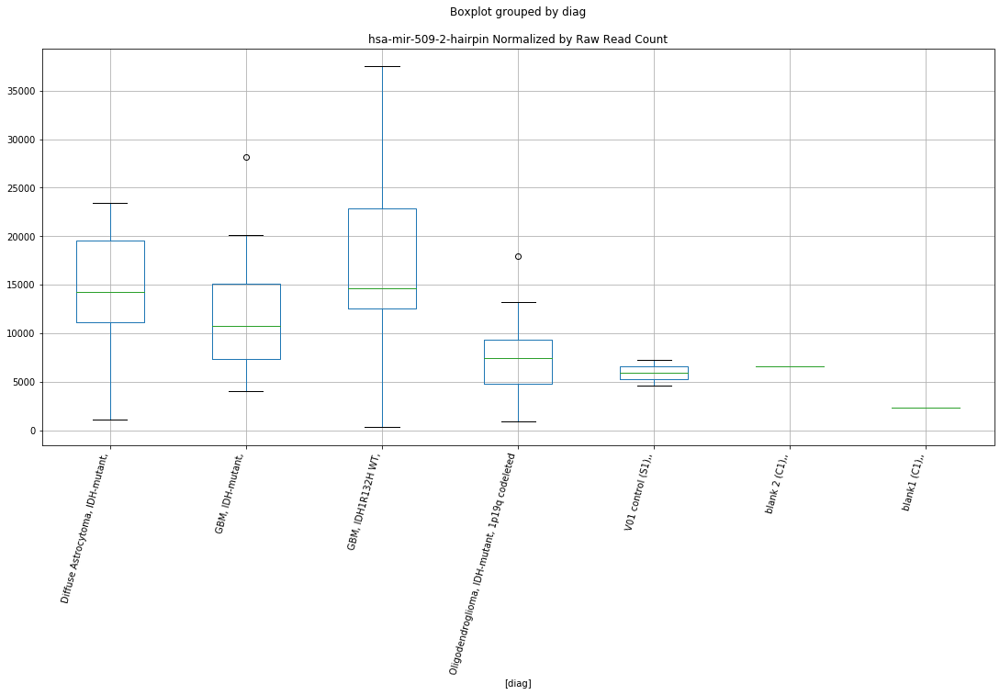

hsa-mir-509-2-hairpin D-plex bbduk3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.3834515392768156
	p = 0.0283733731051158
hsa-mir-509-2-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.3834515392768156
	p = 0.0283733731051158
hsa-mir-509-2-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.1805251804508323
	p = 0.042732675764826124
hsa-mir-509-2-hairpin D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.1805251804508323
	p = 0.042732675764826124


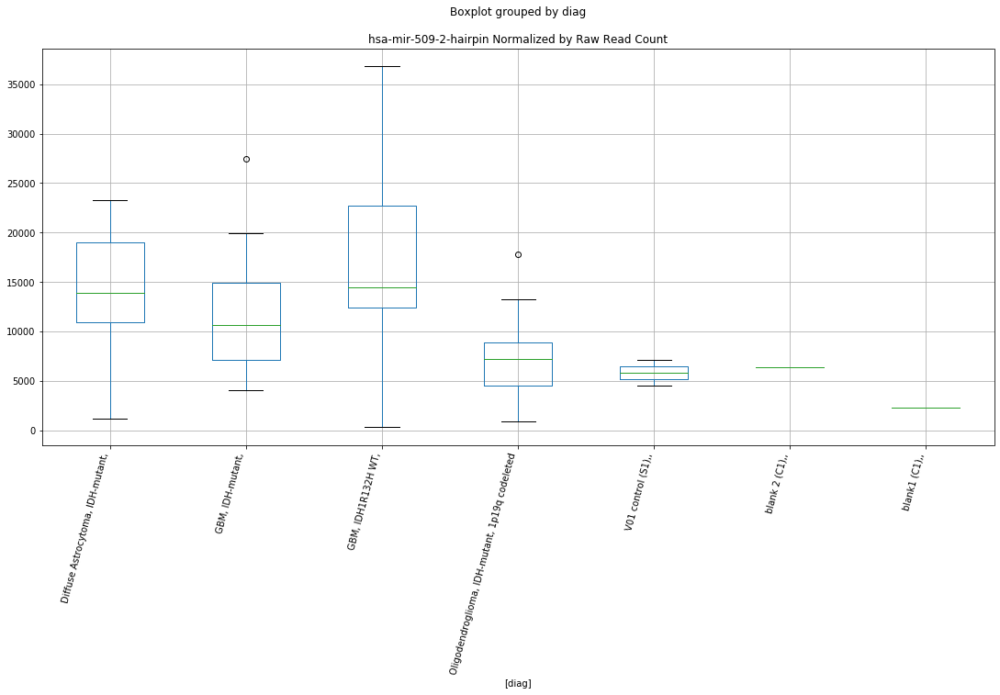

hsa-mir-509-3-hairpin D-plex bbduk2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.4000793212036173
	p = 0.027422402843632045
hsa-mir-509-3-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.4000793212036173
	p = 0.027422402843632045
hsa-mir-509-3-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.2006850667745397
	p = 0.04105250225678581
hsa-mir-509-3-hairpin D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2006850667745397
	p = 0.04105250225678581


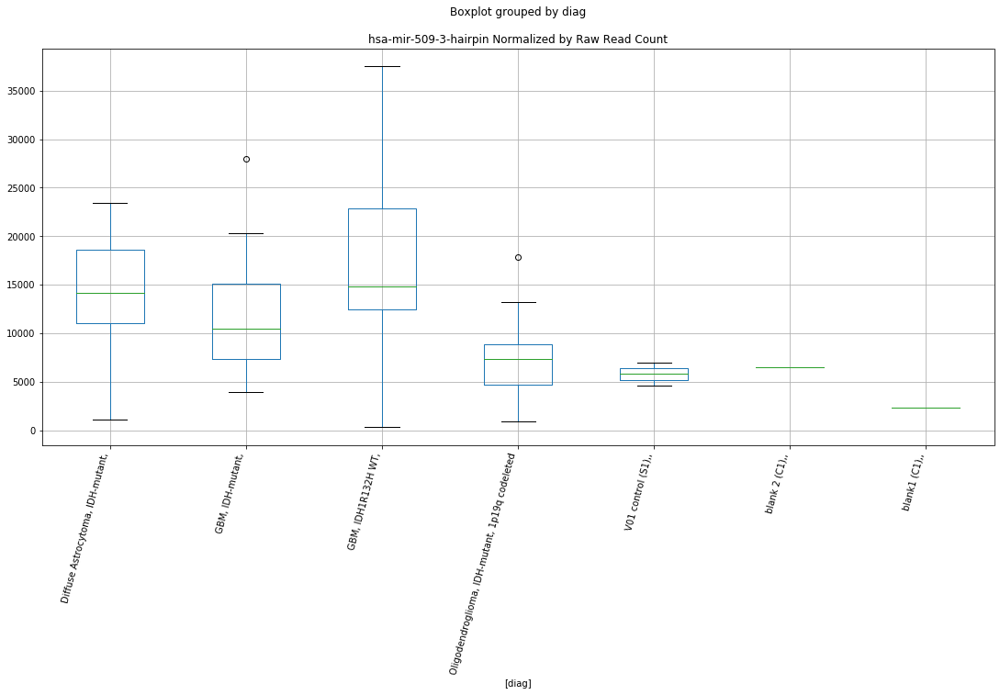

hsa-mir-509-3-hairpin D-plex bbduk3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.368021792863344
	p = 0.02928329051002383
hsa-mir-509-3-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.368021792863344
	p = 0.02928329051002383
hsa-mir-509-3-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.2037883851140028
	p = 0.04079931859941033
hsa-mir-509-3-hairpin D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2037883851140028
	p = 0.04079931859941033


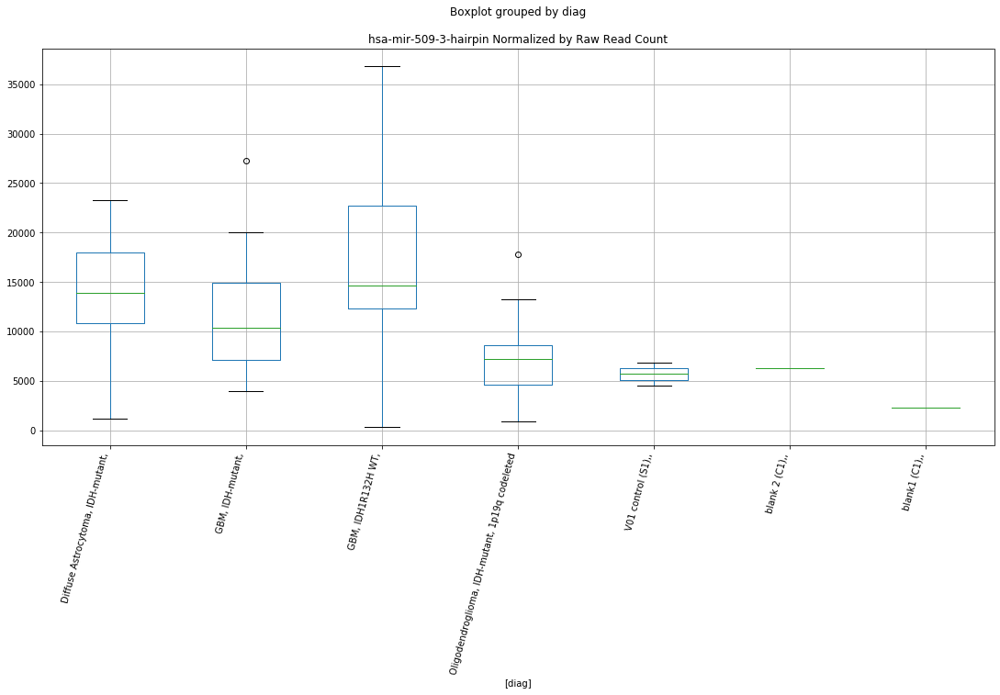

hsa-mir-3613-3p-mature D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.5602389405867334
	p = 0.019673811630988844
hsa-mir-3613-3p-mature D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.5602389405867334
	p = 0.019673811630988844


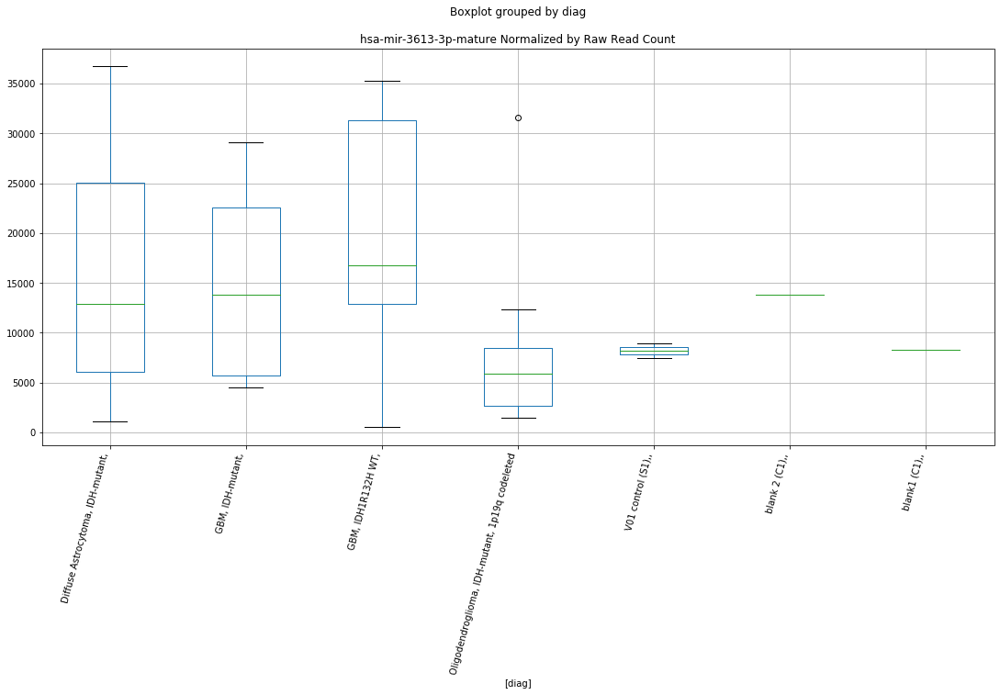

hsa-mir-3613-3p-mature D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.5602389405867334
	p = 0.019673811630988844
hsa-mir-3613-3p-mature D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.5602389405867334
	p = 0.019673811630988844


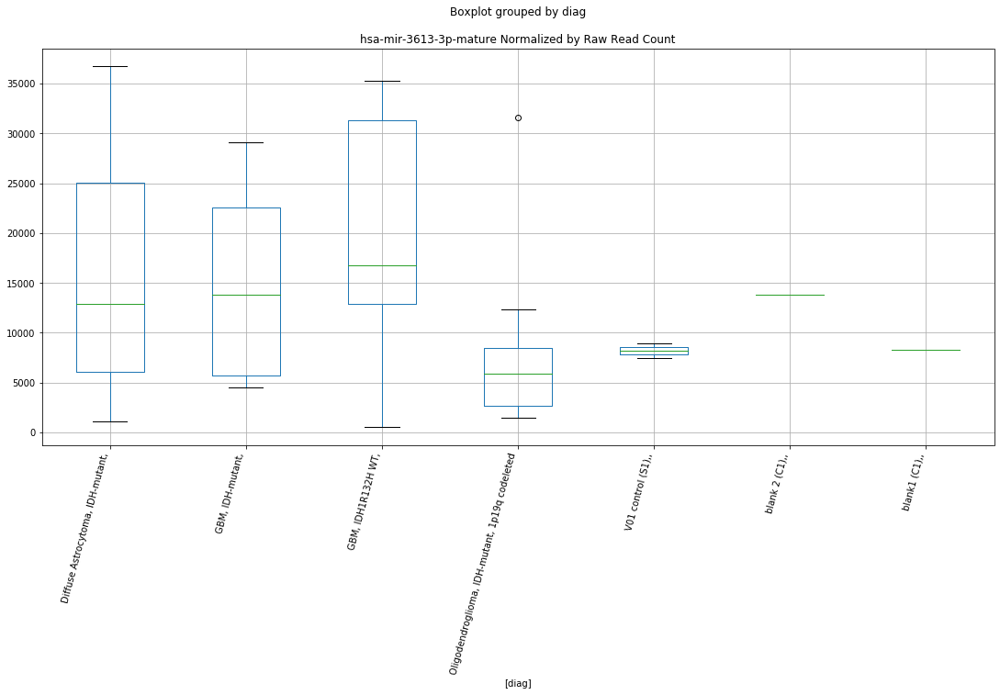

hsa-mir-3613-3p-mature D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.5602389405867334
	p = 0.019673811630988844
hsa-mir-3613-3p-mature D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.5602389405867334
	p = 0.019673811630988844


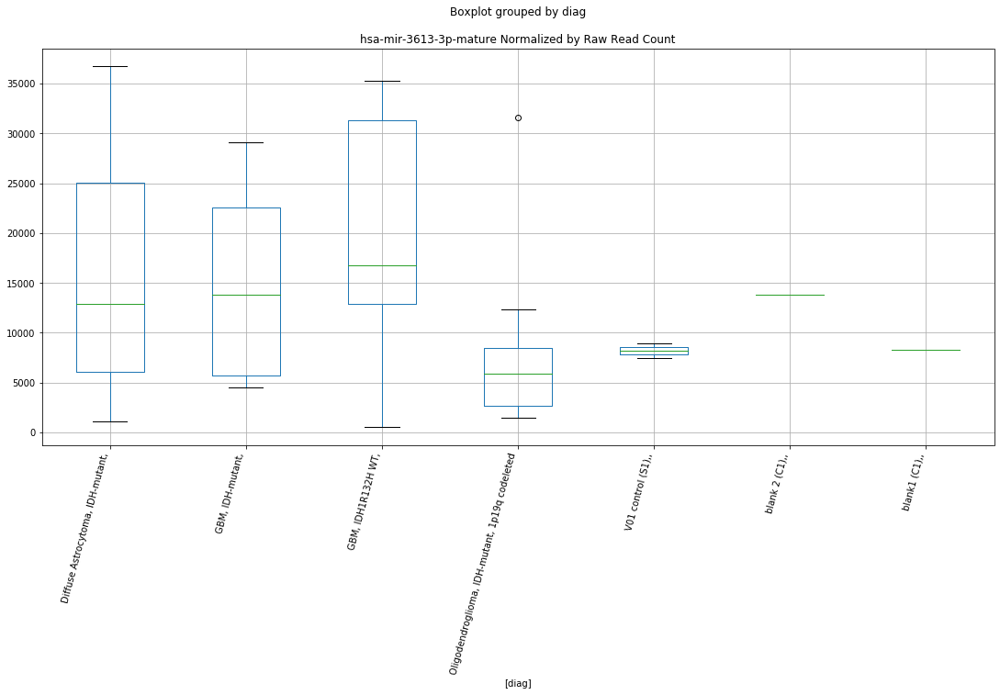

In [65]:
for col in mirnas:
    for labkit in "D-plex","Lexogen":
        for trimmer in "bbduk1","bbduk2","bbduk3","cutadapt1","cutadapt2","cutadapt3":
            ps=[]
            for diag in diags:
                others=diags.copy()
                others.remove(diag)
                for other in others:
                    t, p = stats.ttest_ind(
                        dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
                            (dfn["diag"]==diag))][col],
                        dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
                            (dfn["diag"]==other))][col])
                    if p < 0.08:
                        print(col+" "+labkit+" "+trimmer+" : "+diag+" - "+other)
                        print("\tt = " + str(t))
                        print("\tp = " + str(p))
                    ps=np.append(ps,p)
            if(any(p < 0.08 for p in ps)):
                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer))].boxplot(column=col,by=['diag'])
                plt.title(col + " Normalized by Raw Read Count")
                plt.xticks(rotation=75,ha='right')
                plt.show()


LOC102724859 Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.145673045701987
	p = 0.04578664162150166
LOC102724859 Lexogen bbduk3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.145673045701987
	p = 0.04578664162150166


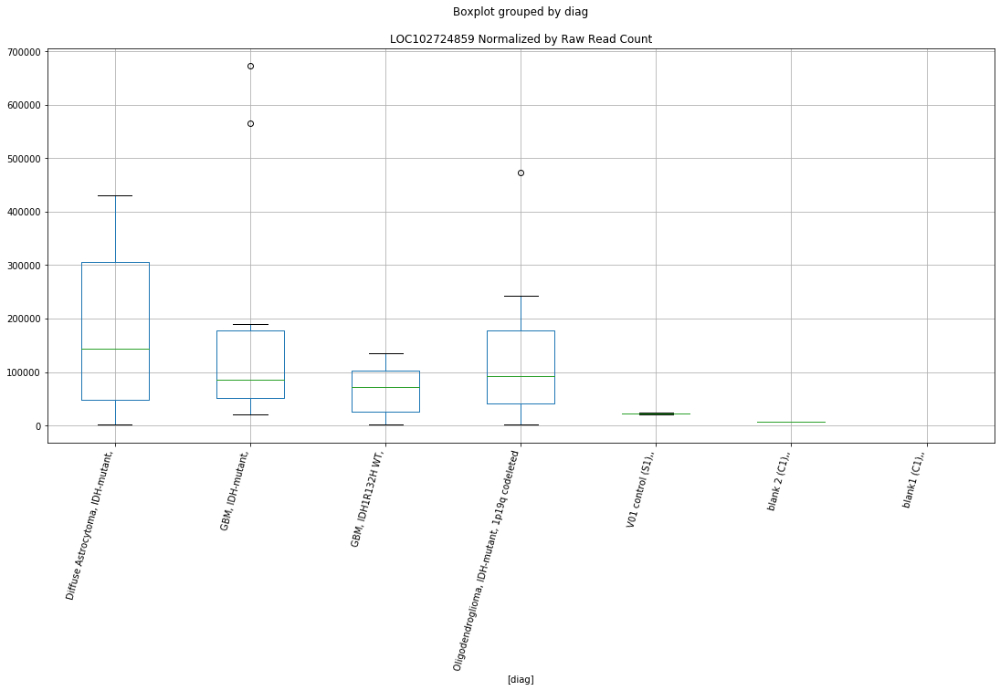

ADGRG6 Lexogen bbduk1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.8604548468261046
	p = 0.07923977533155575
ADGRG6 Lexogen bbduk1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -1.8604548468261046
	p = 0.07923977533155575


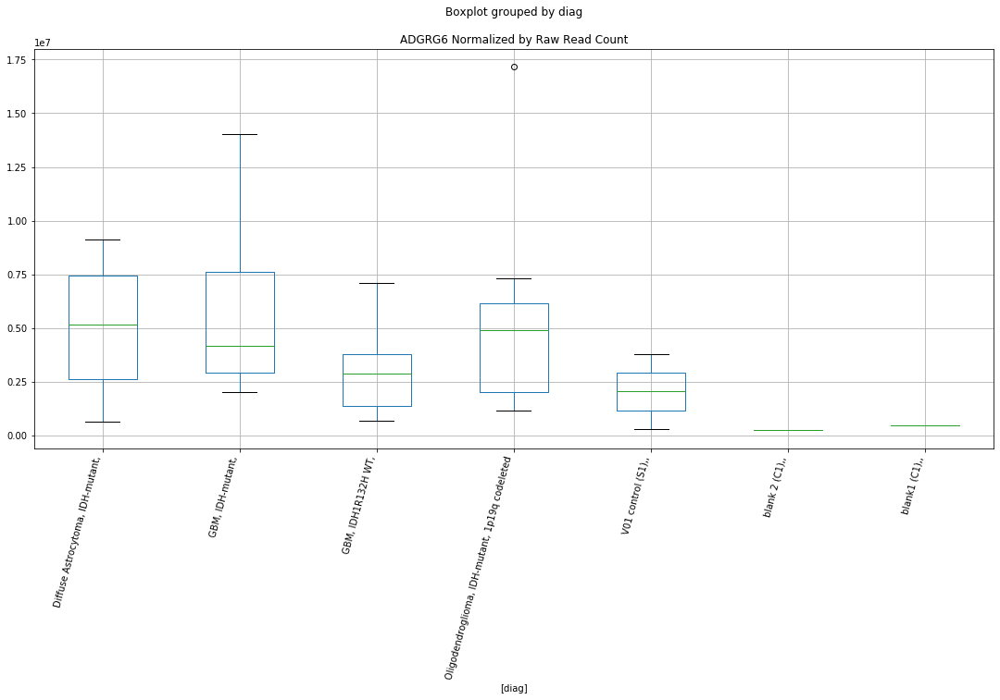

ADGRG6 Lexogen cutadapt1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.8687195974534199
	p = 0.07802486699010505
ADGRG6 Lexogen cutadapt1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -1.8687195974534199
	p = 0.07802486699010505


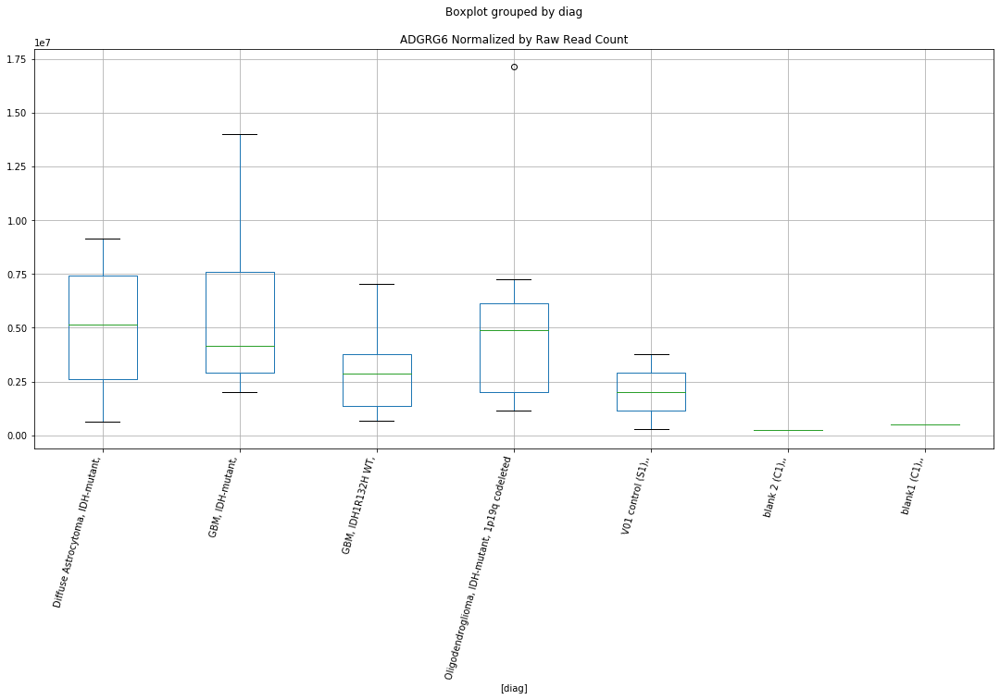

ADGRG6 Lexogen cutadapt2 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.8676482575226072
	p = 0.07818141953306909
ADGRG6 Lexogen cutadapt2 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -1.8676482575226072
	p = 0.07818141953306909


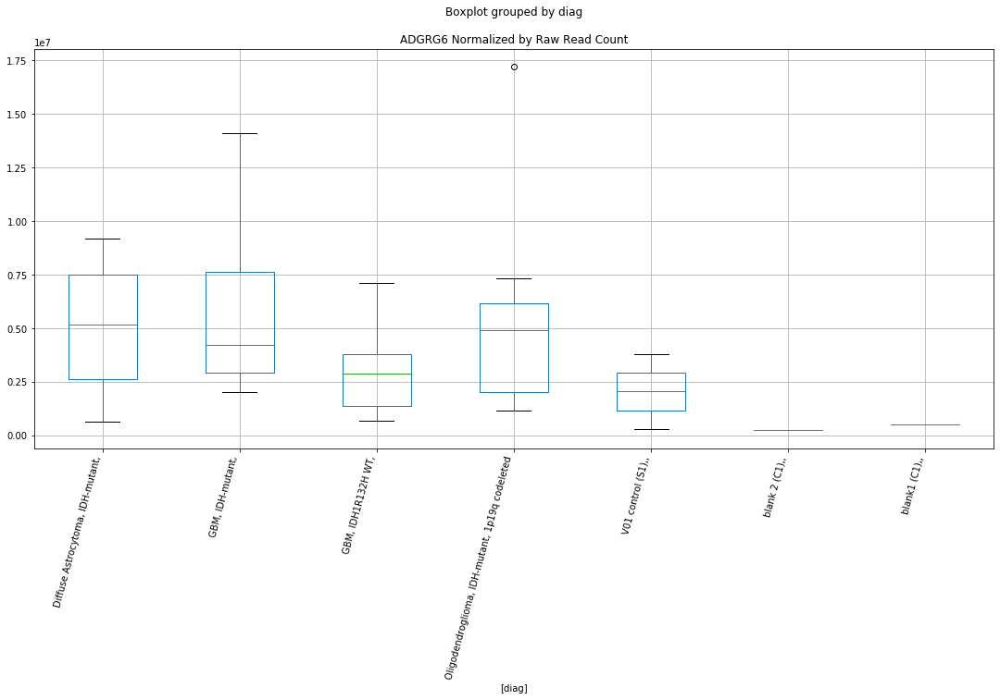

ADGRG6 Lexogen cutadapt3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.866438300710709
	p = 0.07835856121656265
ADGRG6 Lexogen cutadapt3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -1.866438300710709
	p = 0.07835856121656265


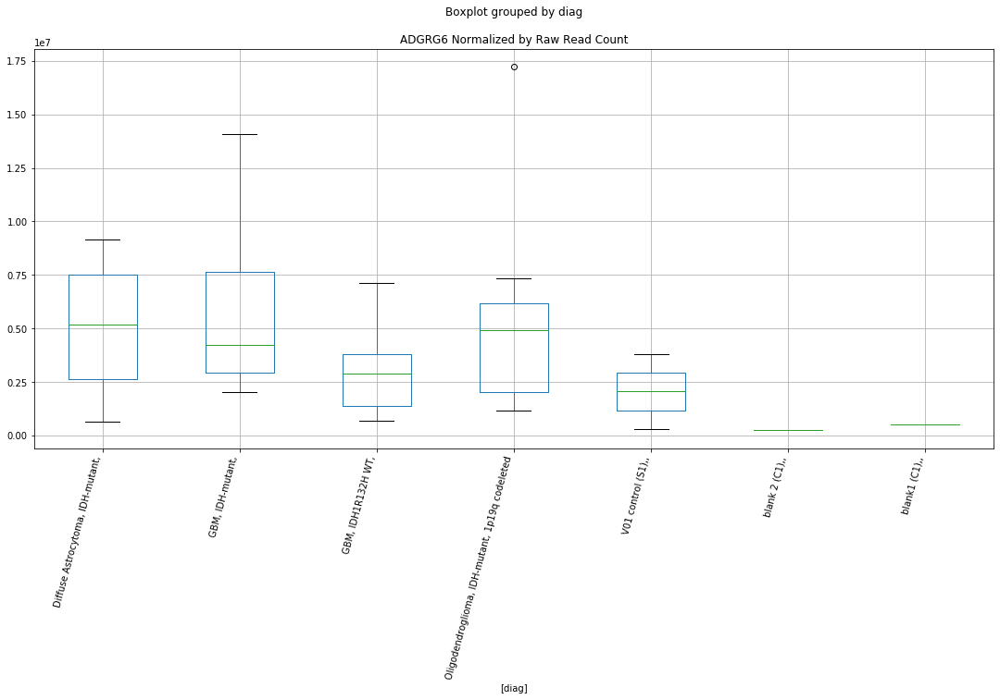

P2RX6 D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.875899858272843
	p = 0.07698275775873166
P2RX6 D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.875899858272843
	p = 0.07698275775873166


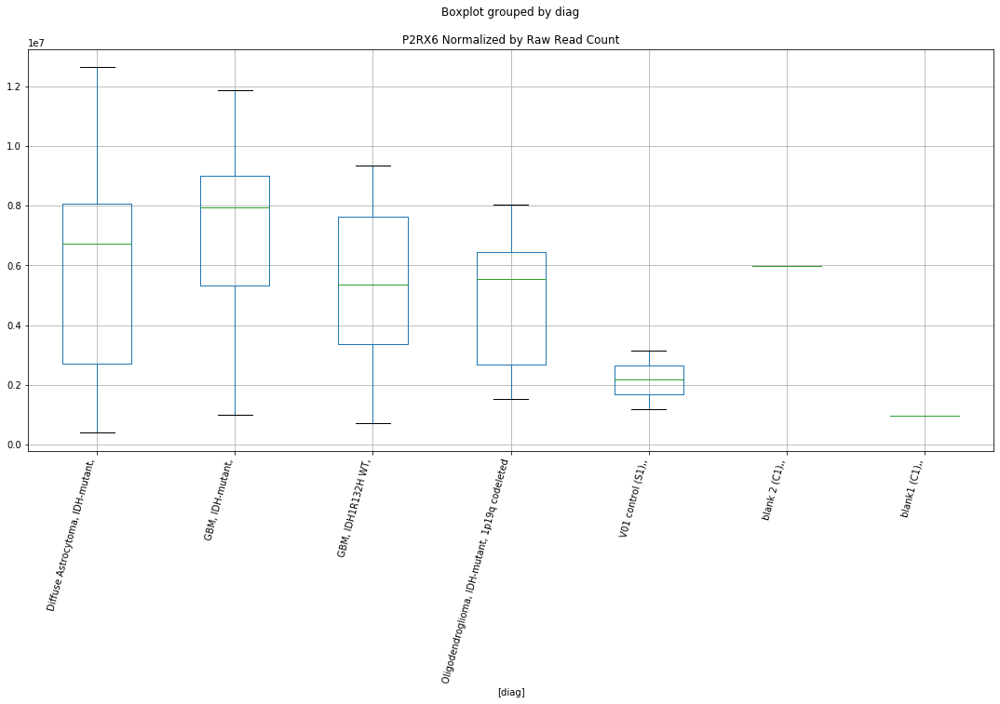

P2RX6 D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.948417495329697
	p = 0.06712913254381679
P2RX6 D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.948417495329697
	p = 0.06712913254381679


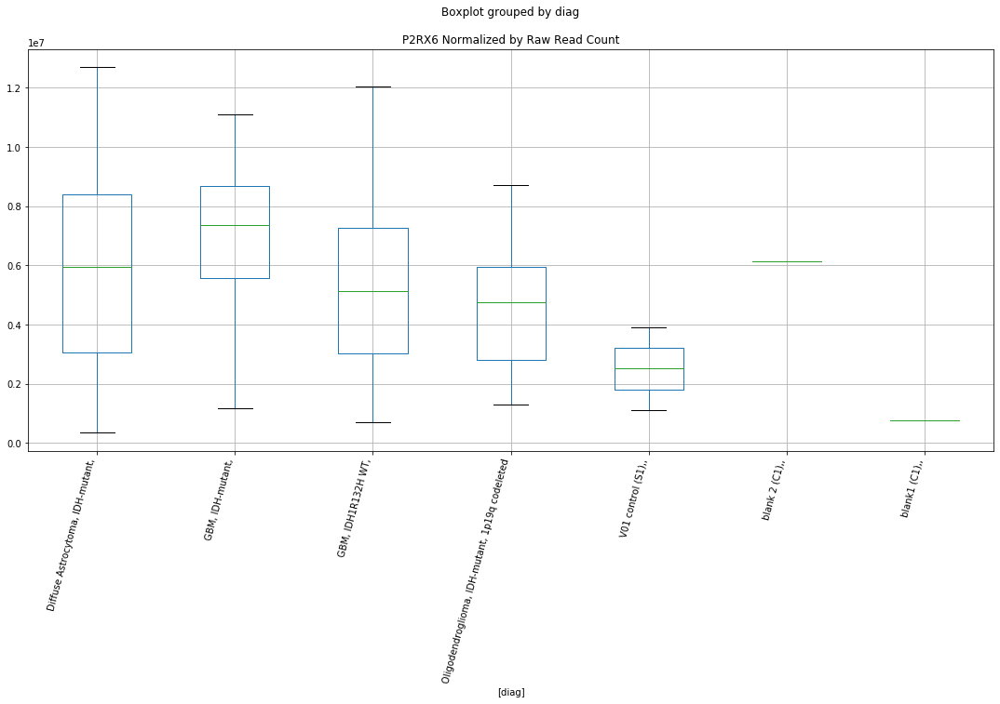

P2RX6 D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.948417495329697
	p = 0.06712913254381679
P2RX6 D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.948417495329697
	p = 0.06712913254381679


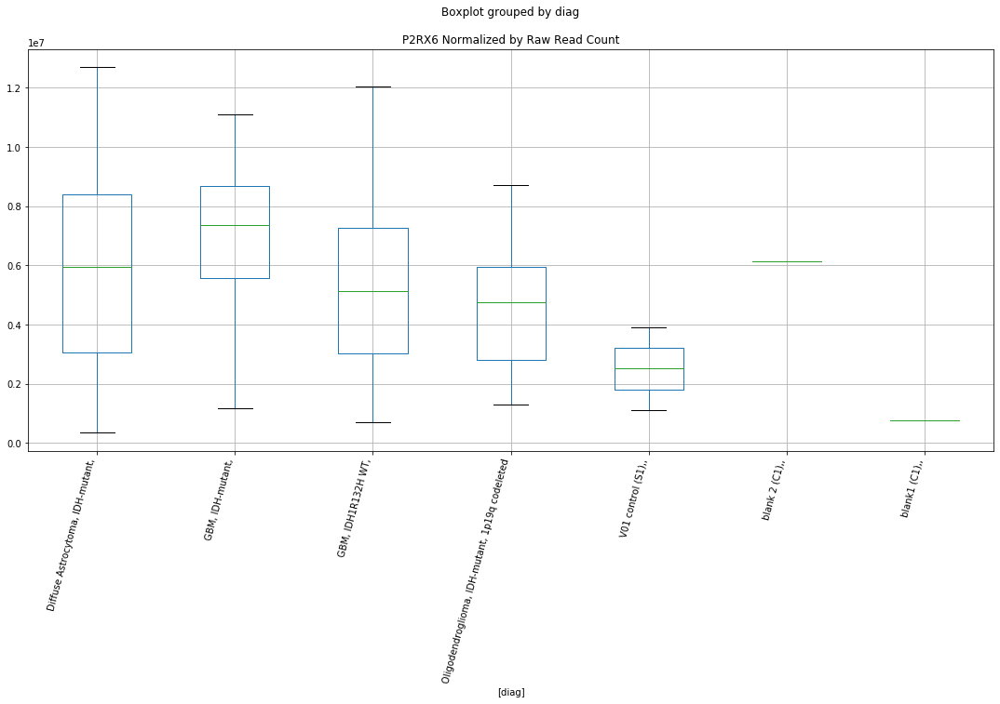

P2RX6 D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.948417495329697
	p = 0.06712913254381679
P2RX6 D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.948417495329697
	p = 0.06712913254381679


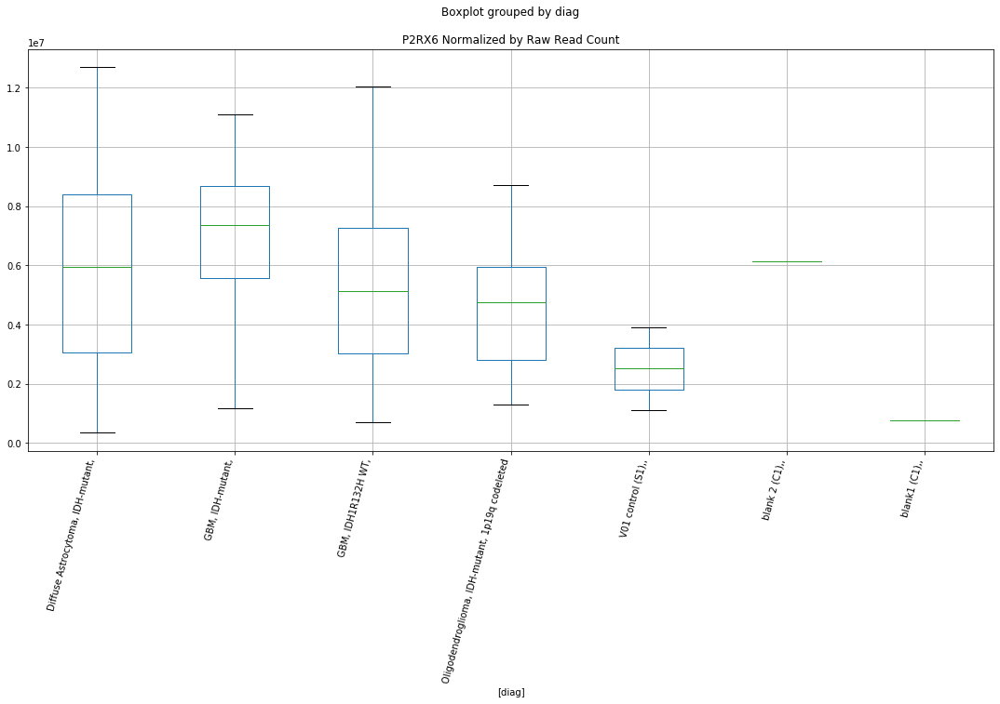

NAALADL2 D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0790258848913514
	p = 0.05218743152237907
NAALADL2 D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.0790258848913514
	p = 0.05218743152237907


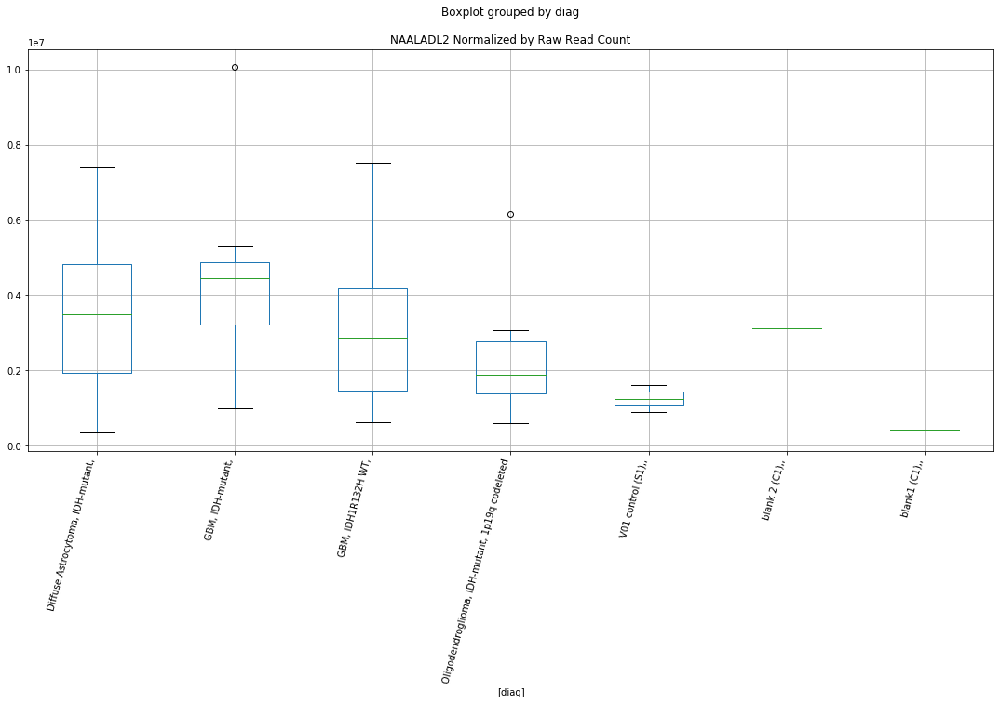

NAALADL2 D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.078756500096289
	p = 0.05221487554415848
NAALADL2 D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.078756500096289
	p = 0.05221487554415848


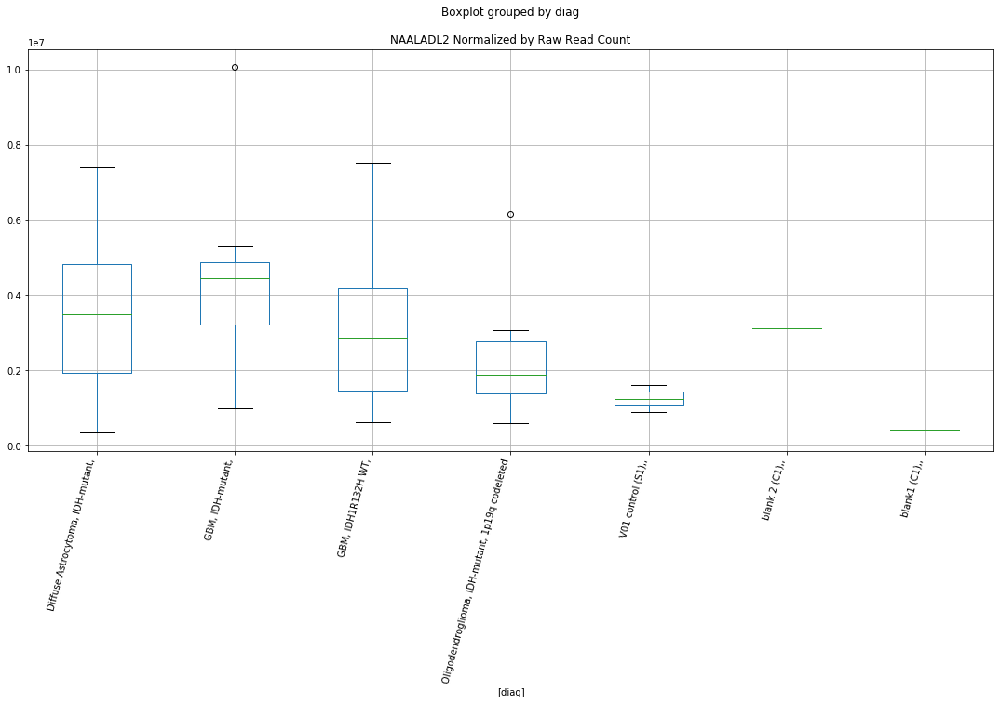

NAALADL2 D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.078756500096289
	p = 0.05221487554415848
NAALADL2 D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.078756500096289
	p = 0.05221487554415848


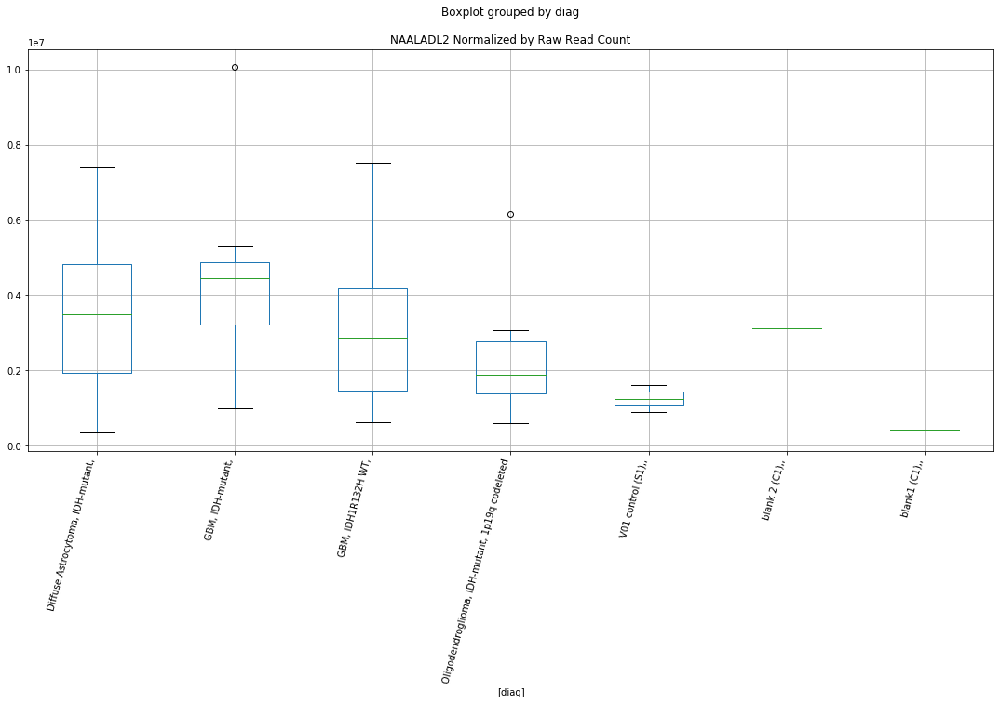

GOLGA2P10 D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9490399587744942
	p = 0.06704965541504554
GOLGA2P10 D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9490399587744942
	p = 0.06704965541504554


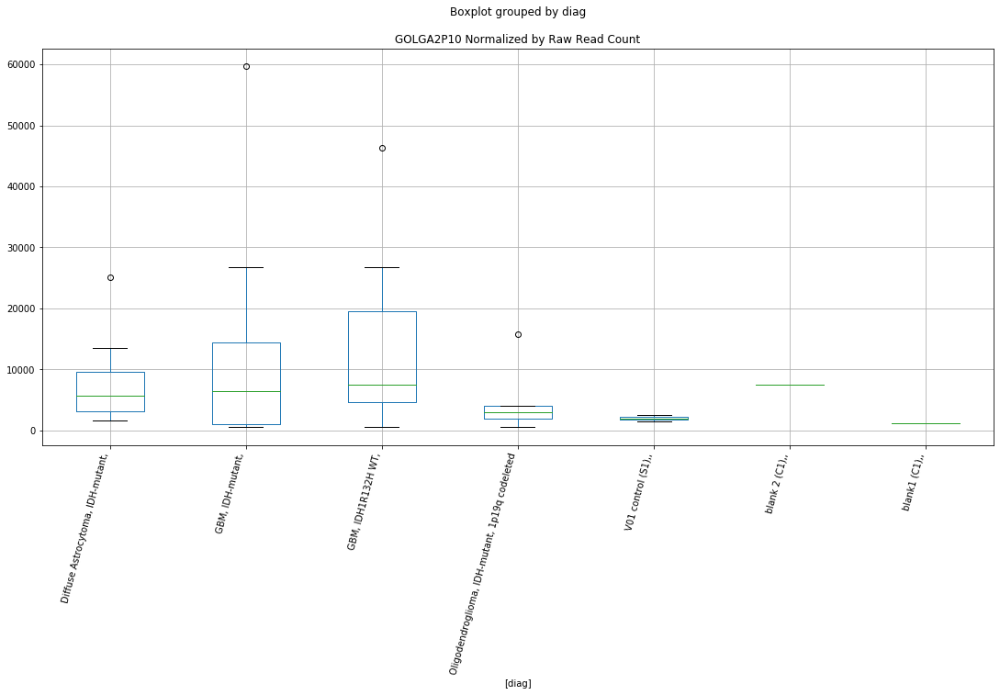

GOLGA2P10 D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.933110107958884
	p = 0.0691102354596846
GOLGA2P10 D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.933110107958884
	p = 0.0691102354596846


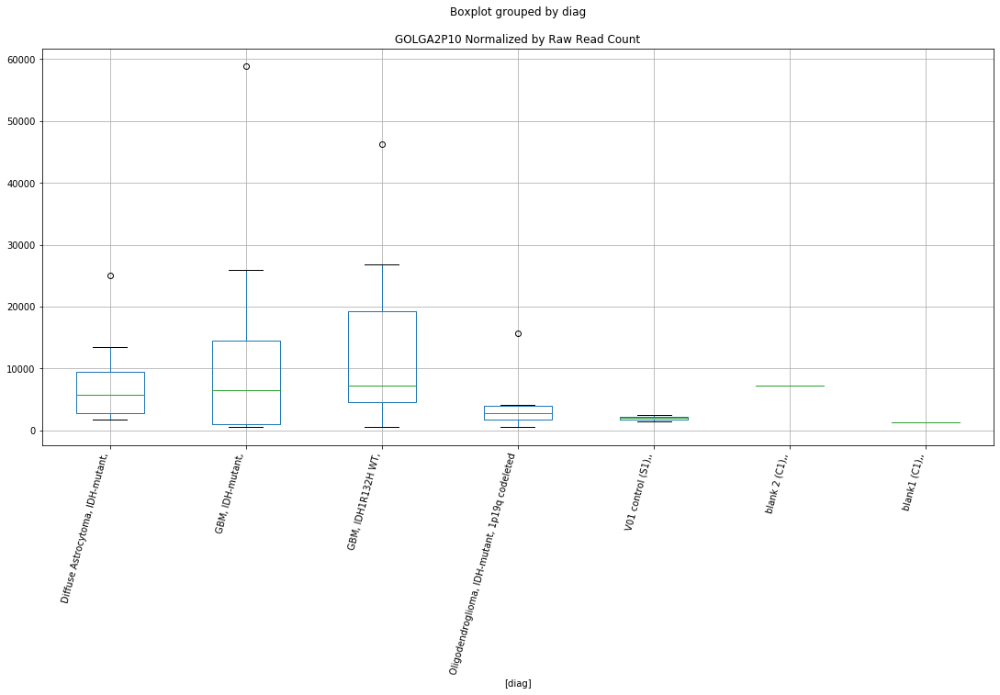

GOLGA2P10 Lexogen bbduk1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.9125329742057533
	p = 0.07185534116207797
GOLGA2P10 Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.3037779104169465
	p = 0.033371931487975764
GOLGA2P10 Lexogen bbduk1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -1.9125329742057533
	p = 0.07185534116207797
GOLGA2P10 Lexogen bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.3037779104169465
	p = 0.033371931487975764


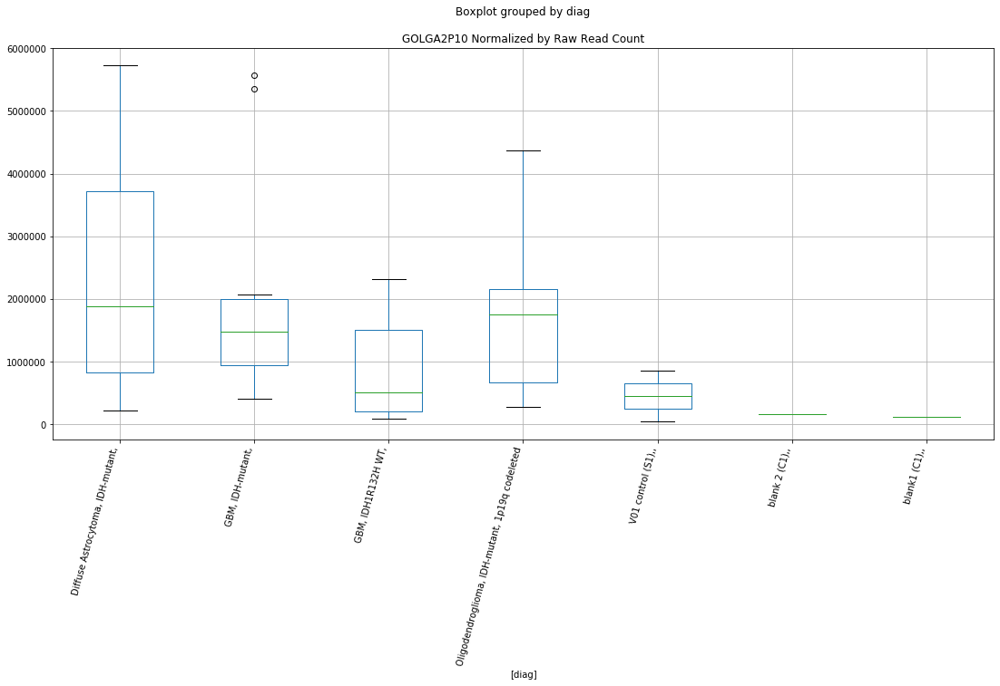

GOLGA2P10 Lexogen bbduk2 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.892037448029271
	p = 0.07468541059687656
GOLGA2P10 Lexogen bbduk2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.3042886695260125
	p = 0.033337431587698495
GOLGA2P10 Lexogen bbduk2 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -1.892037448029271
	p = 0.07468541059687656
GOLGA2P10 Lexogen bbduk2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.3042886695260125
	p = 0.033337431587698495


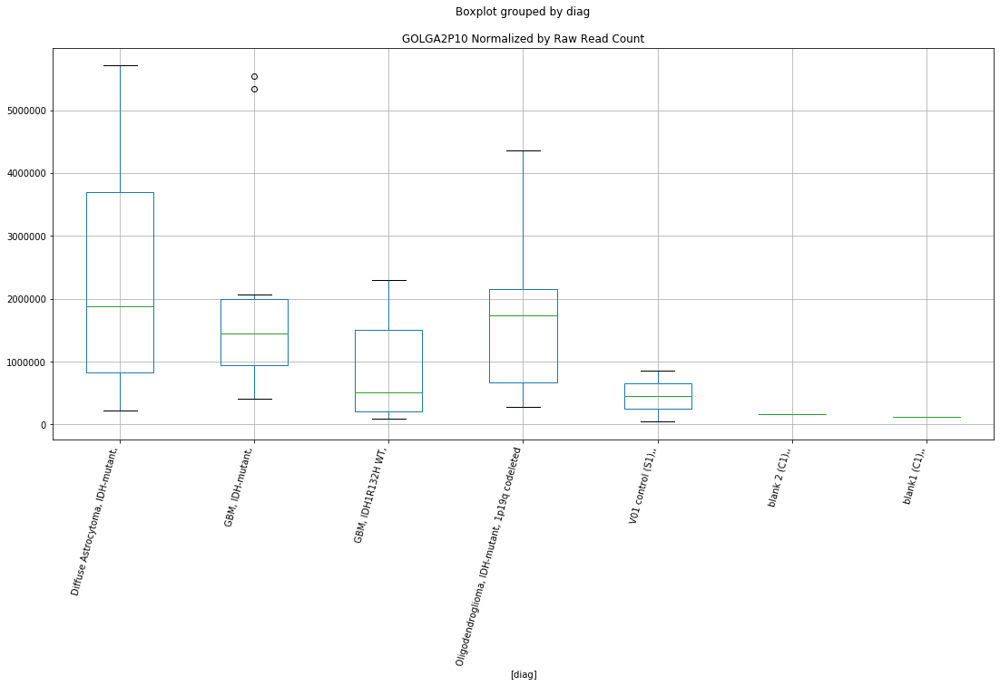

GOLGA2P10 Lexogen bbduk3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.8862587802227706
	p = 0.07550099116686508
GOLGA2P10 Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.303241090565934
	p = 0.03340822738191791
GOLGA2P10 Lexogen bbduk3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -1.8862587802227706
	p = 0.07550099116686508
GOLGA2P10 Lexogen bbduk3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.303241090565934
	p = 0.03340822738191791


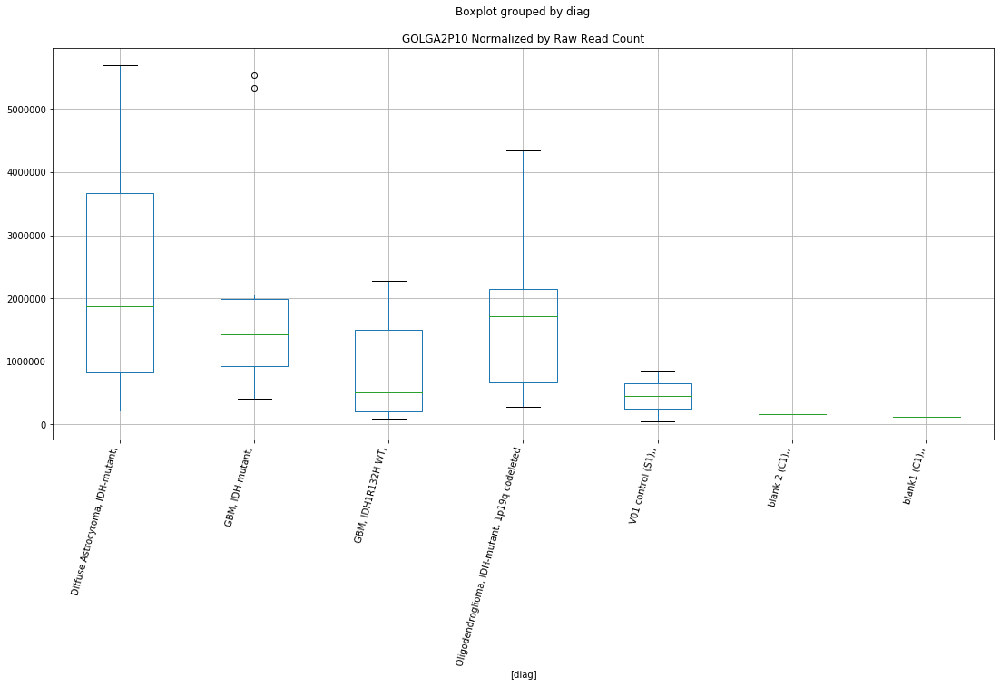

GOLGA2P10 Lexogen cutadapt1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.9164886186630068
	p = 0.07132023072114216
GOLGA2P10 Lexogen cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.304705666468677
	p = 0.033309289507532126
GOLGA2P10 Lexogen cutadapt1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -1.9164886186630068
	p = 0.07132023072114216
GOLGA2P10 Lexogen cutadapt1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.304705666468677
	p = 0.033309289507532126


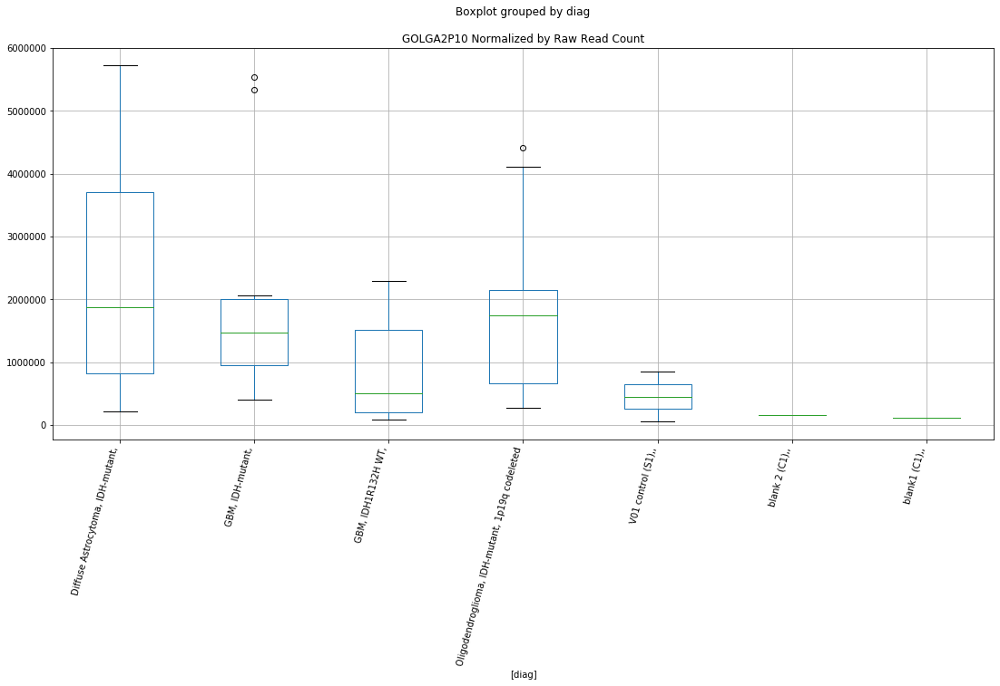

GOLGA2P10 Lexogen cutadapt2 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.91650890737018
	p = 0.07131749526441818
GOLGA2P10 Lexogen cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.304974708353214
	p = 0.033291144239601604
GOLGA2P10 Lexogen cutadapt2 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -1.91650890737018
	p = 0.07131749526441818
GOLGA2P10 Lexogen cutadapt2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.304974708353214
	p = 0.033291144239601604


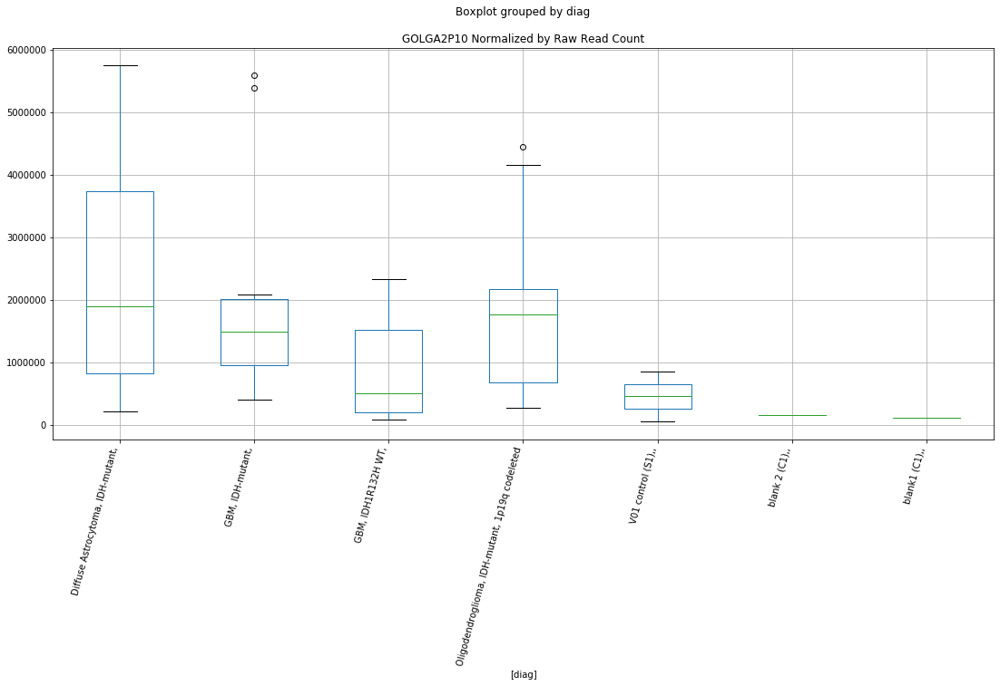

GOLGA2P10 Lexogen cutadapt3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.9175451721890622
	p = 0.07117790318781965
GOLGA2P10 Lexogen cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.3045779711996195
	p = 0.033317905000303516
GOLGA2P10 Lexogen cutadapt3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -1.9175451721890622
	p = 0.07117790318781965
GOLGA2P10 Lexogen cutadapt3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.3045779711996195
	p = 0.033317905000303516


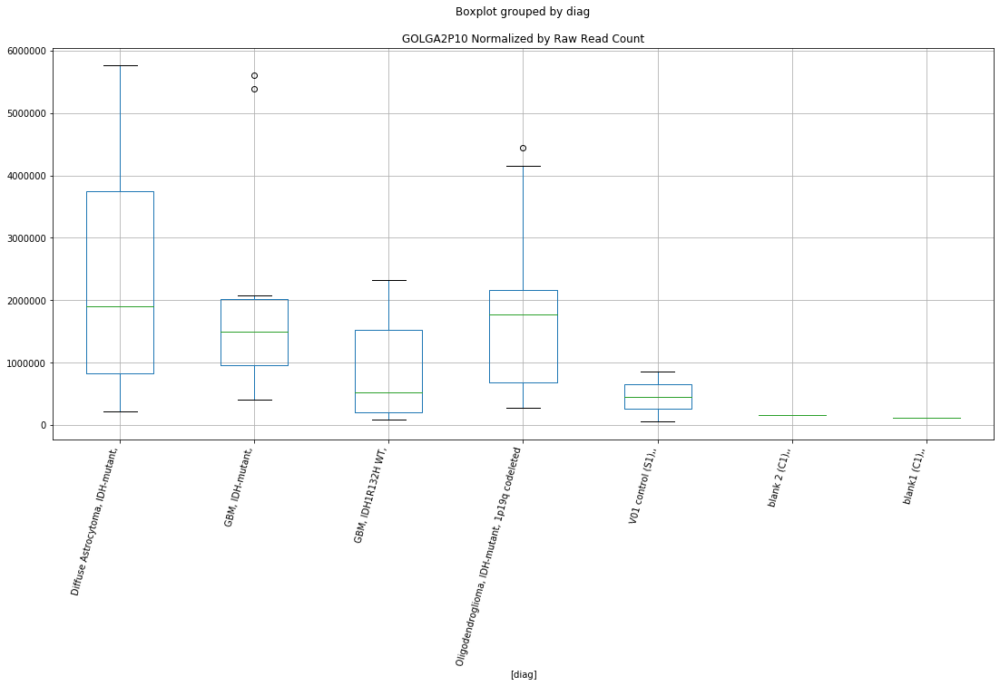

AHDC1 D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2153040061066793
	p = 0.03987230834119789
AHDC1 D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.2153040061066793
	p = 0.03987230834119789
AHDC1 D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.902747654397758
	p = 0.07319442640671962
AHDC1 D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.902747654397758
	p = 0.07319442640671962


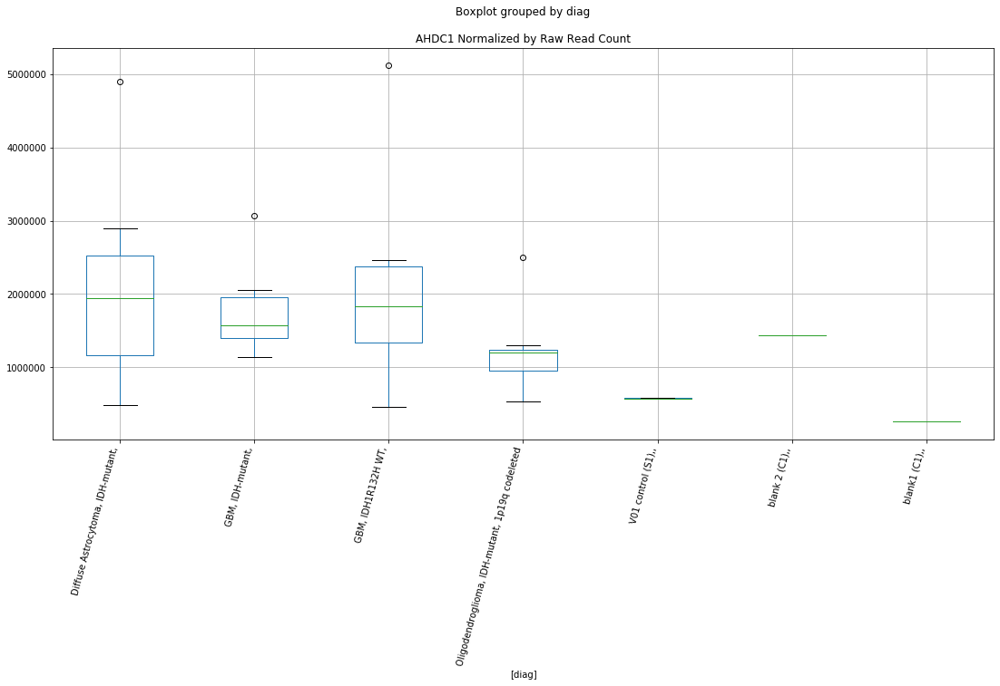

AHDC1 D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.181932455485182
	p = 0.042613373429048716
AHDC1 D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.181932455485182
	p = 0.042613373429048716


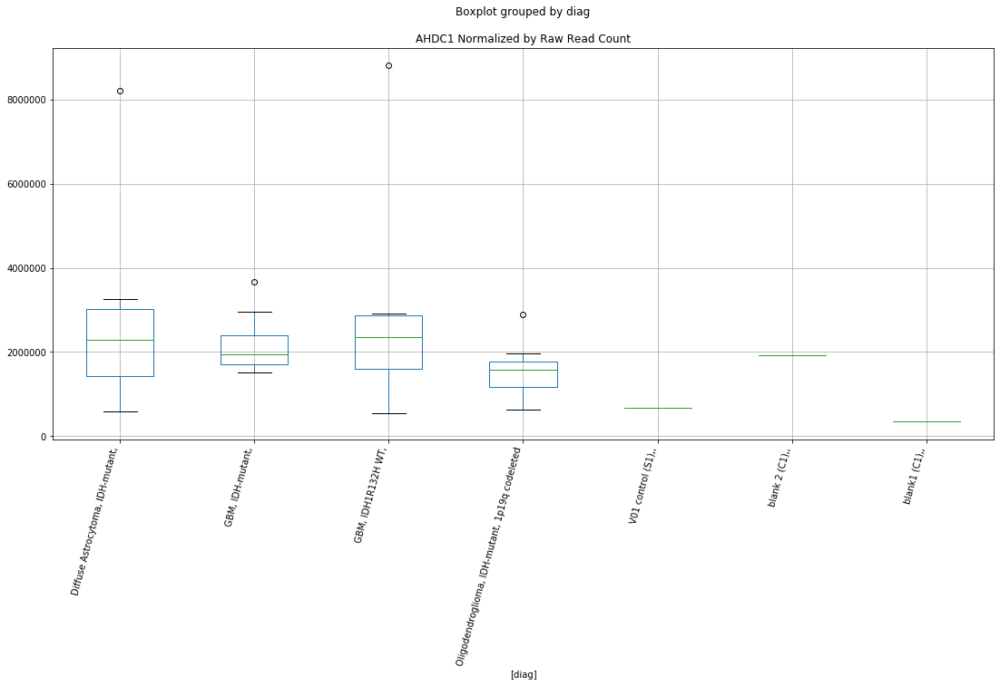

NOTCH2NLB Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.8869533965342138
	p = 0.07540254037978504
NOTCH2NLB Lexogen bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -1.8869533965342138
	p = 0.07540254037978504


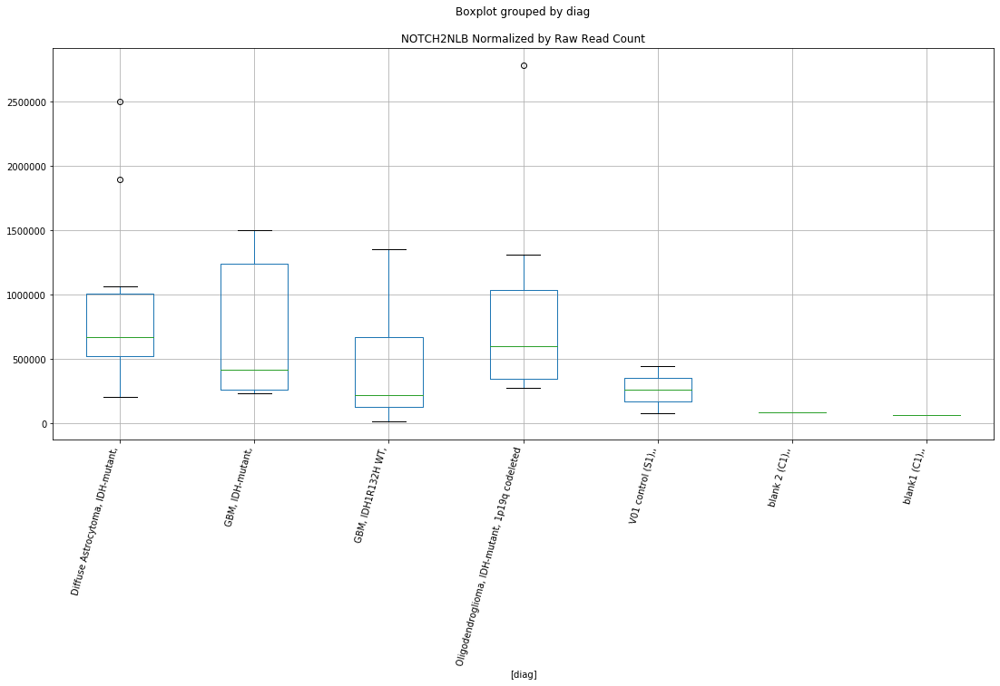

NOTCH2NLB Lexogen bbduk2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.882901064190165
	p = 0.07597849969136859
NOTCH2NLB Lexogen bbduk2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -1.882901064190165
	p = 0.07597849969136859


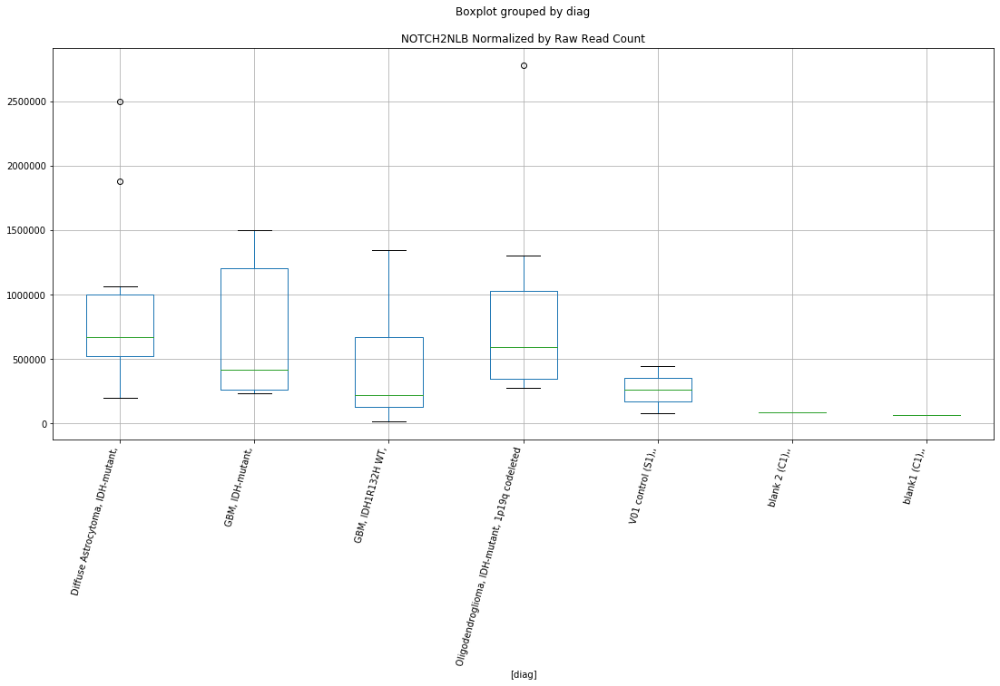

NOTCH2NLB Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.8839888345485512
	p = 0.07582351358293732
NOTCH2NLB Lexogen bbduk3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -1.8839888345485512
	p = 0.07582351358293732


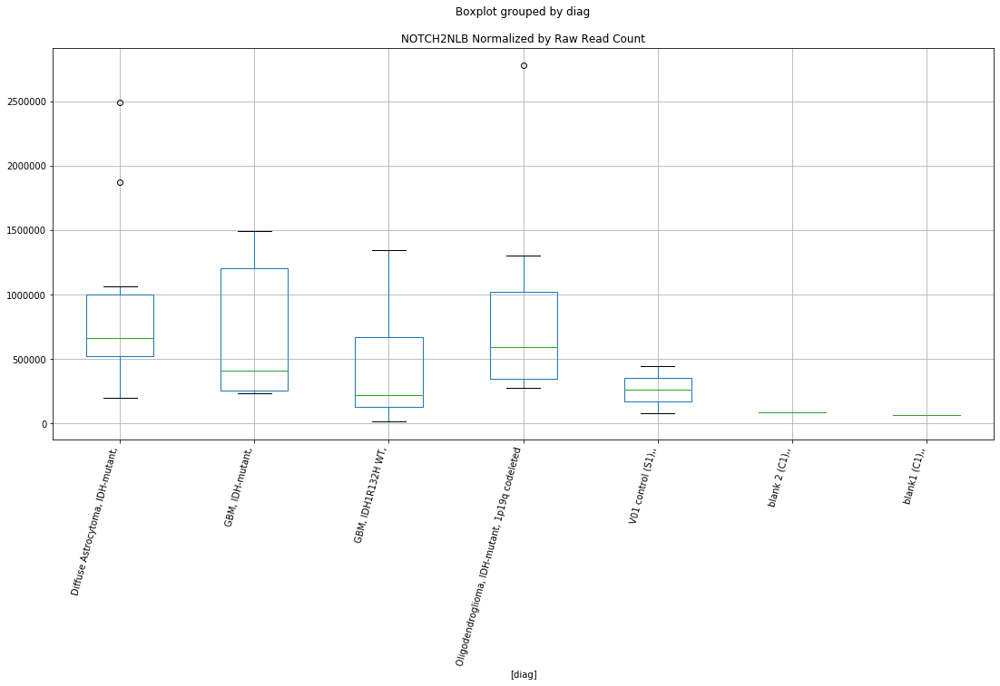

NOTCH2NLB Lexogen cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.9324970731146087
	p = 0.06919064917371083
NOTCH2NLB Lexogen cutadapt1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -1.9324970731146087
	p = 0.06919064917371083


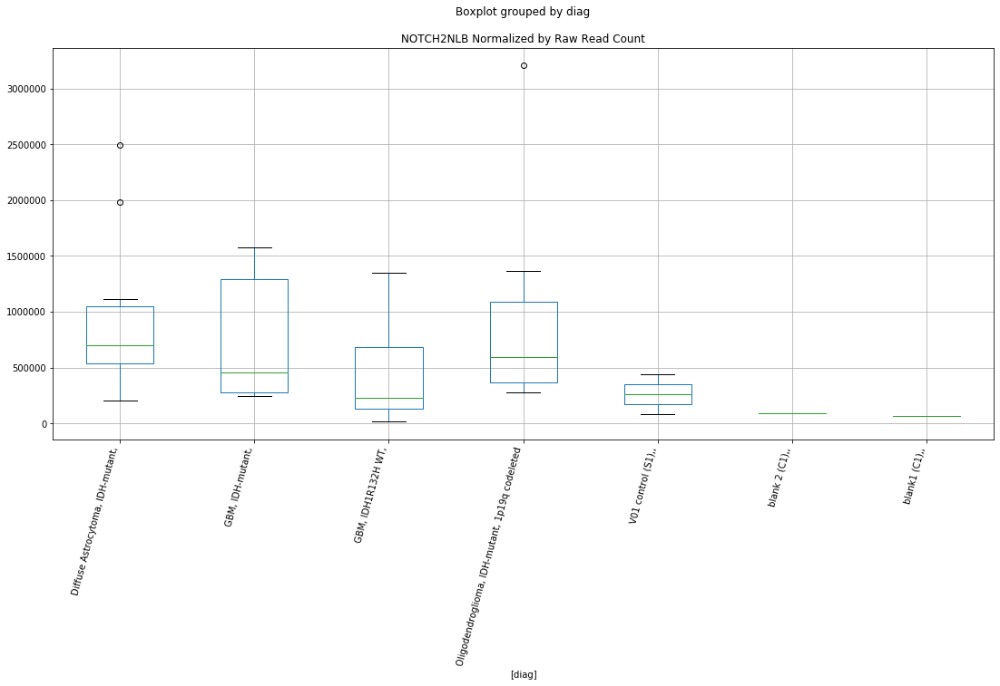

NOTCH2NLB Lexogen cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.9306600482989893
	p = 0.06943211673344545
NOTCH2NLB Lexogen cutadapt2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -1.9306600482989893
	p = 0.06943211673344545


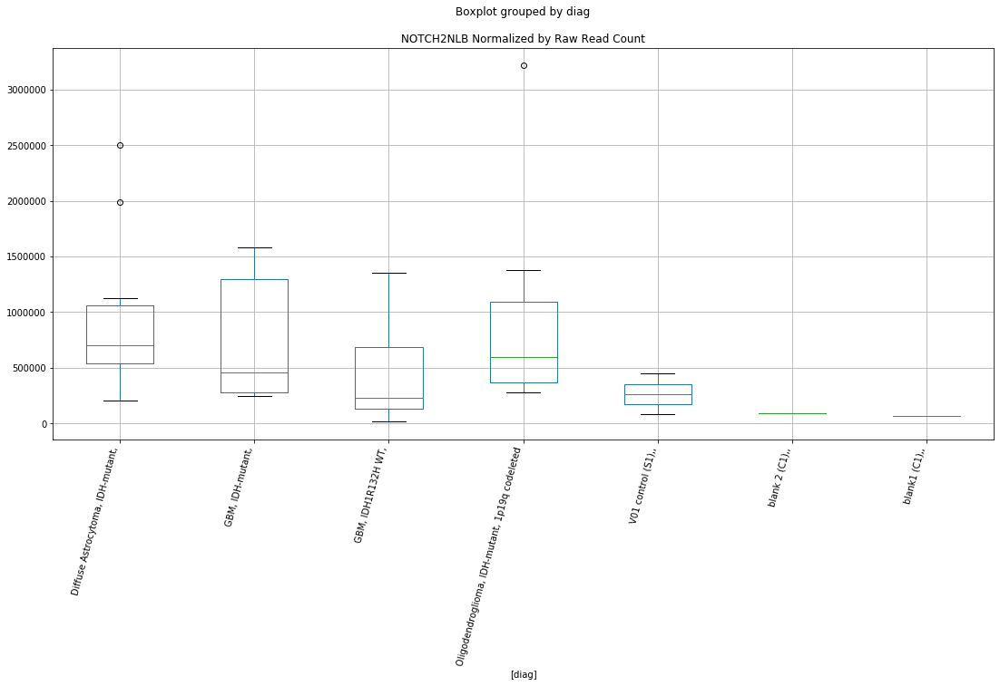

NOTCH2NLB Lexogen cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.9291950681608556
	p = 0.06962521840990983
NOTCH2NLB Lexogen cutadapt3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -1.9291950681608556
	p = 0.06962521840990983


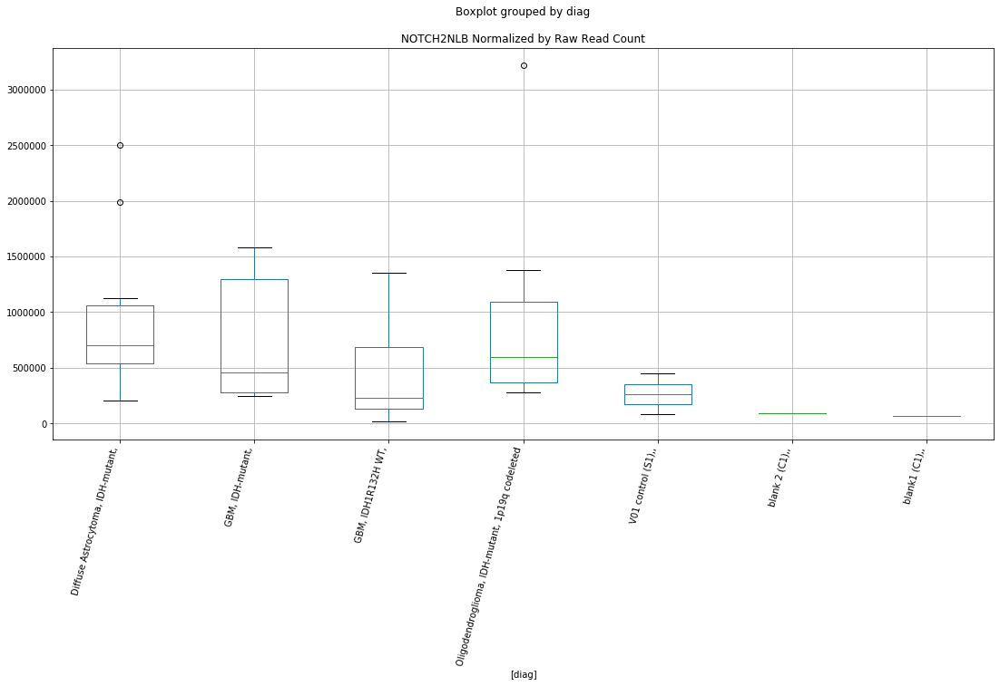

EDEM3 D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9815142421707996
	p = 0.06301811169885509
EDEM3 D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9815142421707996
	p = 0.06301811169885509


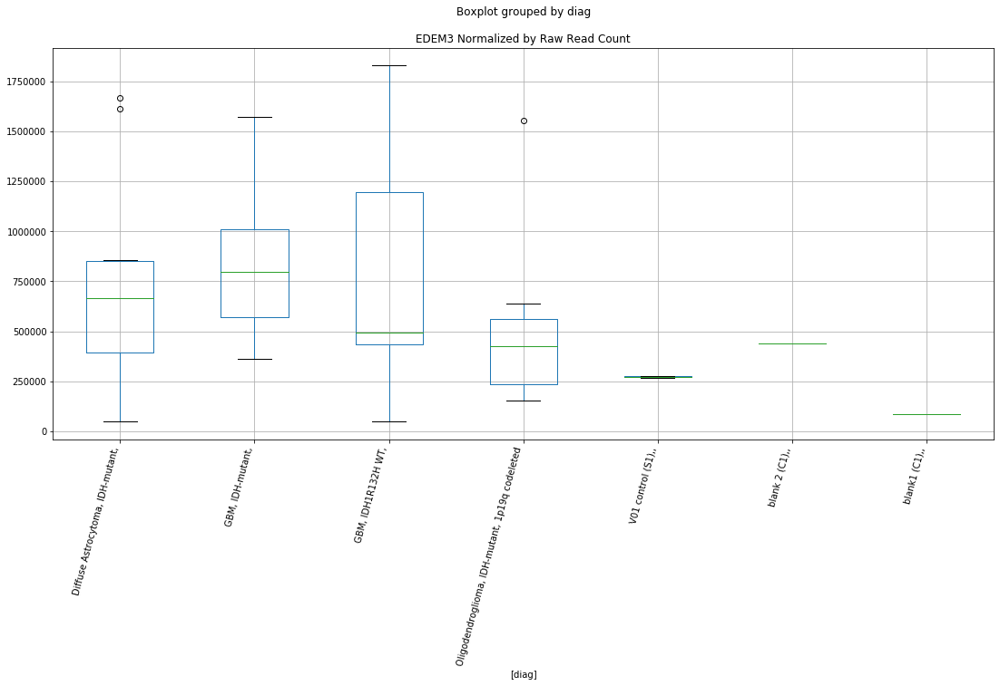

EDEM3 D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.9686835352526795
	p = 0.008226459427939047
EDEM3 D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.9686835352526795
	p = 0.008226459427939047


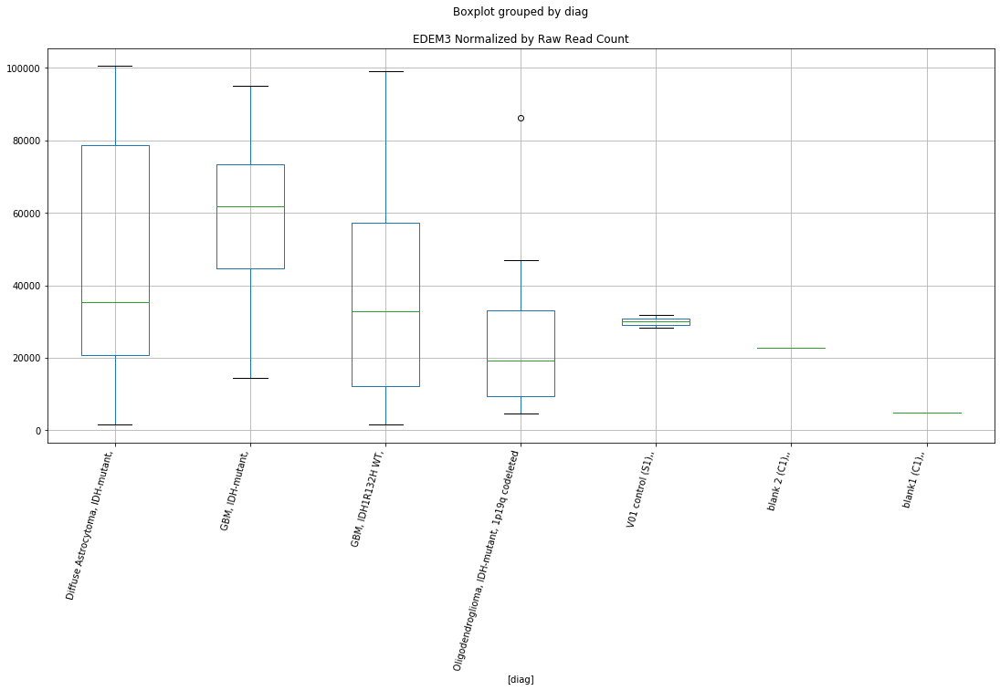

EDEM3 D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.890601958912487
	p = 0.00974105400444342
EDEM3 D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.890601958912487
	p = 0.00974105400444342


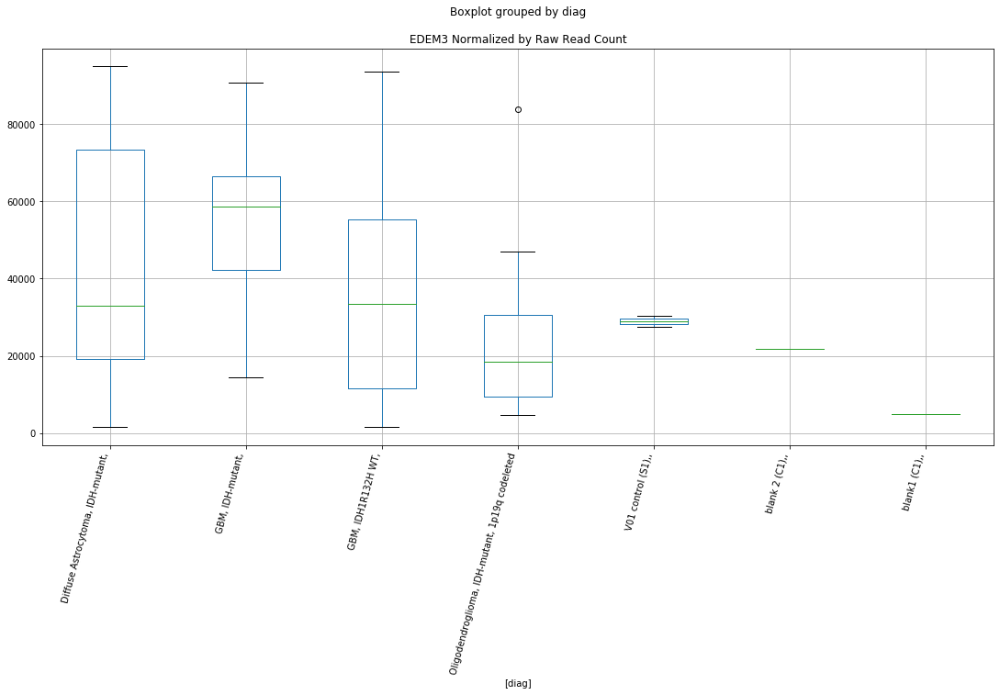

EDEM3 D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9618479715376822
	p = 0.06543285068723219
EDEM3 D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9618479715376822
	p = 0.06543285068723219


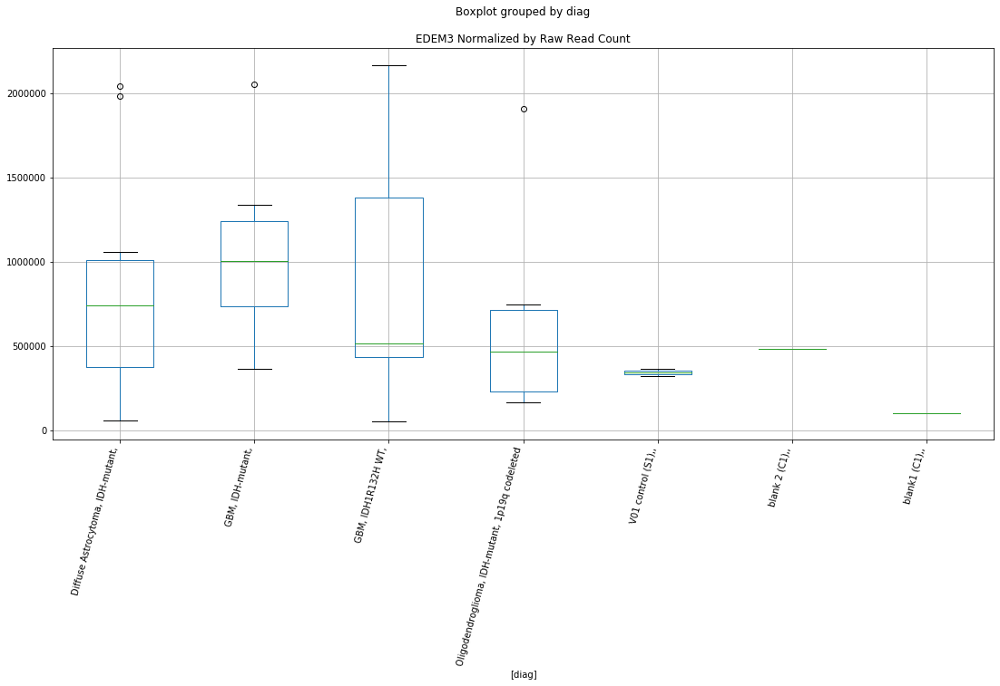

EDEM3 D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9618479715376822
	p = 0.06543285068723219
EDEM3 D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9618479715376822
	p = 0.06543285068723219


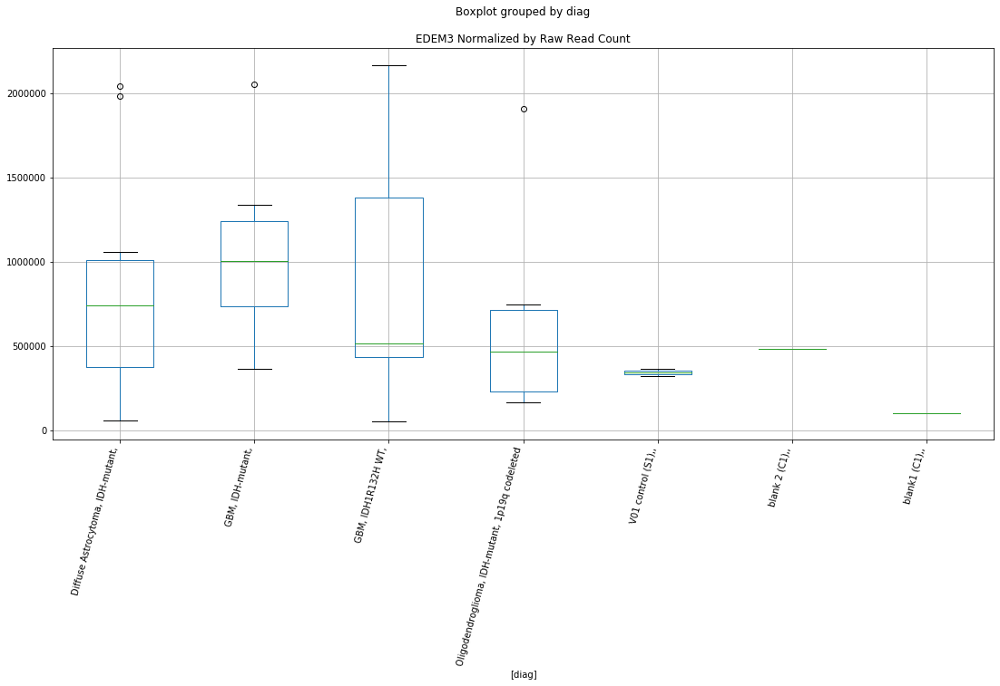

EDEM3 D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9618479715376822
	p = 0.06543285068723219
EDEM3 D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9618479715376822
	p = 0.06543285068723219


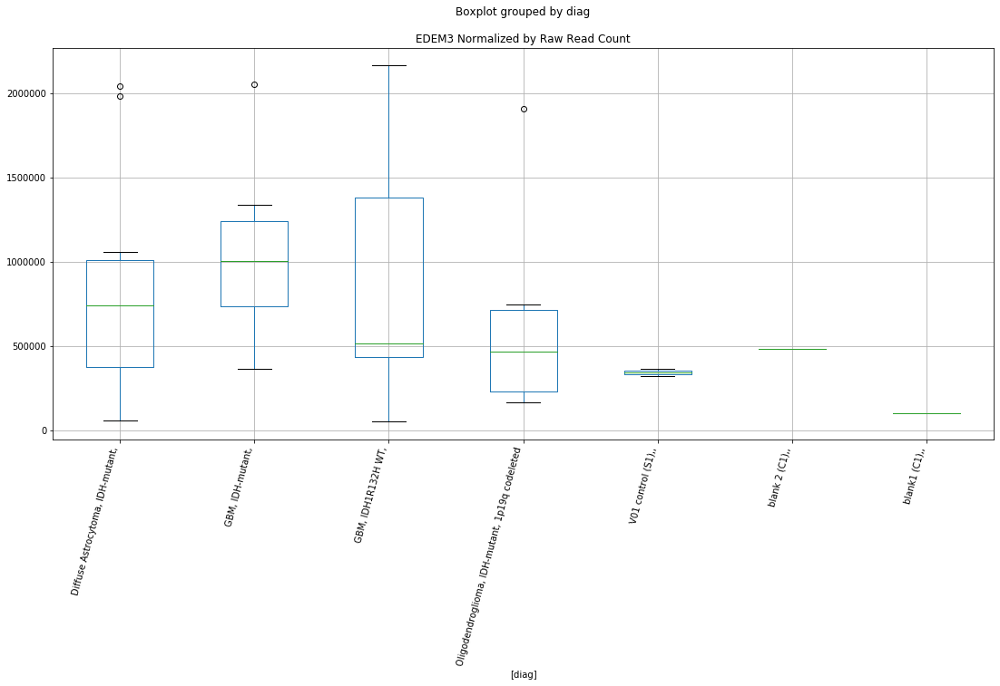

In [66]:
for col in genes:
    for labkit in "D-plex","Lexogen":
        for trimmer in "bbduk1","bbduk2","bbduk3","cutadapt1","cutadapt2","cutadapt3":
            ps=[]
            for diag in diags:
                others=diags.copy()
                others.remove(diag)
                for other in others:
                    t, p = stats.ttest_ind(
                        dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
                            (dfn["diag"]==diag))][col],
                        dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
                            (dfn["diag"]==other))][col])
                    if p < 0.08:
                        print(col+" "+labkit+" "+trimmer+" : "+diag+" - "+other)
                        print("\tt = " + str(t))
                        print("\tp = " + str(p))
                    ps=np.append(ps,p)
            if(any(p < 0.08 for p in ps)):
                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer))].boxplot(column=col,by=['diag'])
                plt.title(col + " Normalized by Raw Read Count")
                plt.xticks(rotation=75,ha='right')
                plt.show()


# Normalize by Trimmed Read Count

In [67]:
dfn=df.copy()

In [68]:
dfn.head()

,sample,Subject,Lab kit,Trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,hsa-mir-6887-hairpin,hsa-mir-6887-5p-mature,hsa-mir-3613-3p-mature,subject,dplex,lexogen,diag,disease,idh,x1p19q
0,SFHH005aa,3_5,D-plex,bbduk1,7706323,201,4578177,57.8849,99328,2.16,...,20494,20259,2,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
1,SFHH005aa,3_5,D-plex,bbduk2,7706323,201,7054912,60.3426,140222,1.98,...,78,76,12246,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
2,SFHH005aa,3_5,D-plex,bbduk3,7706323,201,7067406,60.5684,138584,1.96,...,68,66,12209,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
3,SFHH005aa,3_5,D-plex,cutadapt1,7706323,201,4879448,132.375,105508,2.16,...,15303,15056,35,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
4,SFHH005aa,3_5,D-plex,cutadapt2,7706323,201,4877655,131.86,119834,2.45,...,15303,15056,35,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,


In [69]:
dfn[mirnas].head()

,hsa-mir-4329-hairpin,hsa-mir-5588-hairpin,hsa-mir-92b-hairpin,hsa-mir-4271-hairpin,hsa-mir-548u-hairpin,hsa-mir-1260a-hairpin,hsa-mir-944-hairpin,hsa-mir-10226-hairpin,hsa-mir-4538-hairpin,hsa-mir-4538-mature,...,hsa-mir-509-1-hairpin,hsa-mir-892b-hairpin,hsa-mir-509-2-hairpin,hsa-mir-509-3-hairpin,hsa-mir-6787-hairpin,hsa-mir-6787-5p-mature,hsa-mir-1281-hairpin,hsa-mir-6887-hairpin,hsa-mir-6887-5p-mature,hsa-mir-3613-3p-mature
0,37,2,337,968,7,355,380,4846,32,28,...,152,166,152,116,874,799,14186,20494,20259,2
1,504505,164998,130955,84567,211982,1300,31,4799,NaN,NaN,...,54,161,54,54,36,33,121,78,76,12246
2,492709,169068,127250,81636,207177,1278,30,4799,NaN,NaN,...,52,158,52,52,33,31,103,68,66,12209
3,178,121,1250,2630,307,1035,694,71,18,15,...,276,268,276,276,1255,1034,20096,15303,15056,35
4,178,121,1251,2630,307,1035,694,71,18,15,...,276,269,276,276,1255,1034,20096,15303,15056,35


In [70]:
dfn[mirnas]=dfn.apply(lambda row: 1e9*pd.to_numeric(row[mirnas])/pd.to_numeric(row['Trimmed Read Count']), axis=1 )


In [71]:
dfn[mirnas].head()

,hsa-mir-4329-hairpin,hsa-mir-5588-hairpin,hsa-mir-92b-hairpin,hsa-mir-4271-hairpin,hsa-mir-548u-hairpin,hsa-mir-1260a-hairpin,hsa-mir-944-hairpin,hsa-mir-10226-hairpin,hsa-mir-4538-hairpin,hsa-mir-4538-mature,...,hsa-mir-509-1-hairpin,hsa-mir-892b-hairpin,hsa-mir-509-2-hairpin,hsa-mir-509-3-hairpin,hsa-mir-6787-hairpin,hsa-mir-6787-5p-mature,hsa-mir-1281-hairpin,hsa-mir-6887-hairpin,hsa-mir-6887-5p-mature,hsa-mir-3613-3p-mature
0,8.08e+03,4.37e+02,7.36e+04,2.11e+05,1.53e+03,77541.78,83002.47,1.06e+06,6989.68,6115.97,...,33200.99,36258.97,33200.99,25337.60,190905.68,174523.61,3.10e+06,4.48e+06,4.43e+06,4.37e+02
1,7.15e+07,2.34e+07,1.86e+07,1.20e+07,3.00e+07,184268.78,4394.10,6.80e+05,NaN,NaN,...,7654.24,22820.98,7654.24,7654.24,5102.83,4677.59,1.72e+04,1.11e+04,1.08e+04,1.74e+06
2,6.97e+07,2.39e+07,1.80e+07,1.16e+07,2.93e+07,180830.14,4244.84,6.79e+05,NaN,NaN,...,7357.72,22356.15,7357.72,7357.72,4669.32,4386.33,1.46e+04,9.62e+03,9.34e+03,1.73e+06
3,3.65e+04,2.48e+04,2.56e+05,5.39e+05,6.29e+04,212114.16,142229.20,1.46e+04,3688.94,3074.12,...,56563.78,54924.25,56563.78,56563.78,257201.22,211909.22,4.12e+06,3.14e+06,3.09e+06,7.17e+03
4,3.65e+04,2.48e+04,2.56e+05,5.39e+05,6.29e+04,212192.13,142281.49,1.46e+04,3690.30,3075.25,...,56584.57,55149.45,56584.57,56584.57,257295.77,211987.11,4.12e+06,3.14e+06,3.09e+06,7.18e+03


In [72]:
dfn[genes].head()

,LOC102724859,RPH3A,PLCE1,ADGRG6,CCDC151,IGF2,P2RX6,PIGG,MAPT,MIR486-1,...,AHDC1,INS-IGF2,MICAL2,NOTCH2NLB,TTN,TTC21A,TUBGCP4,WSB1,EDEM3,NACC2
0,NaN,NaN,2660,481,152,7,67662,NaN,21,NaN,...,336,1,2220,21,2124,5814,48,4,6636,28
1,NaN,NaN,252,NaN,24,39465,2583,NaN,NaN,NaN,...,9848,7893,78,NaN,144,38,30,4270,486,NaN
2,NaN,NaN,252,NaN,24,43385,2520,NaN,NaN,NaN,...,11708,8677,76,NaN,144,38,30,4190,450,NaN
3,34,1,2110,250,NaN,17,55125,NaN,NaN,NaN,...,2662,2,2960,206,4626,4826,216,NaN,7242,34
4,34,1,2110,250,NaN,17,55125,NaN,NaN,NaN,...,2662,2,2960,206,4626,4826,216,NaN,7242,34


In [73]:
dfn[genes]=dfn.apply(lambda row: 1e9*pd.to_numeric(row[genes])/pd.to_numeric(row['Trimmed Read Count']), axis=1 )


In [74]:
dfn[genes].head()

,LOC102724859,RPH3A,PLCE1,ADGRG6,CCDC151,IGF2,P2RX6,PIGG,MAPT,MIR486-1,...,AHDC1,INS-IGF2,MICAL2,NOTCH2NLB,TTN,TTC21A,TUBGCP4,WSB1,EDEM3,NACC2
0,NaN,NaN,581017.29,105063.65,33200.99,1.53e+03,1.48e+07,NaN,4586.98,NaN,...,7.34e+04,2.18e+02,484909.17,4586.98,463940.12,1.27e+06,10484.52,873.71,1.45e+06,6115.97
1,NaN,NaN,35719.79,NaN,3401.89,5.59e+06,3.66e+05,NaN,NaN,NaN,...,1.40e+06,1.12e+06,11056.13,NaN,20411.31,5.39e+03,4252.36,605252.06,6.89e+04,NaN
2,NaN,NaN,35656.65,NaN,3395.87,6.14e+06,3.57e+05,NaN,NaN,NaN,...,1.66e+06,1.23e+06,10753.59,NaN,20375.23,5.38e+03,4244.84,592862.50,6.37e+04,NaN
3,6968.00,204.94,432425.96,51235.30,NaN,3.48e+03,1.13e+07,NaN,NaN,NaN,...,5.46e+05,4.10e+02,606626.00,42217.89,948058.06,9.89e+05,44267.30,NaN,1.48e+06,6968.00
4,6970.56,205.02,432584.92,51254.14,NaN,3.49e+03,1.13e+07,NaN,NaN,NaN,...,5.46e+05,4.10e+02,606848.99,42233.41,948406.56,9.89e+05,44283.57,NaN,1.48e+06,6970.56


In [75]:
#dfn.value_counts(['disease','idh','x1p19q'])

In [76]:
#dfn.value_counts(['diag'])

In [77]:
#for mirna in mirnas:
#    #print()
#    for labkit in "D-plex","Lexogen":
#        for trimmer in "bbduk1","bbduk2","bbduk3","cutadapt1","cutadapt2","cutadapt3":
#            t, p = stats.ttest_ind(
#                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
#                    (dfn["diag"]=="Oligodendroglioma, IDH-mutant, 1p19q codeleted"))][mirna],
#                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
#                    (dfn["diag"]=="Diffuse Astrocytoma, IDH-mutant,"))][mirna])
#            if p < 0.08:
#                print(mirna+" "+labkit+" "+trimmer)
#                print("\tt = " + str(t))
#                print("\tp = " + str(p))
#                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer))].boxplot(column=mirna,by=['diag'])
#                plt.title(mirna + " Normalized by Trimmed Read Count")
#                plt.xticks(rotation=75,ha='right')
#                plt.show()


In [78]:
#for gene in genes:
#    #print()
#    for labkit in "D-plex","Lexogen":
#        for trimmer in "bbduk1","bbduk2","bbduk3","cutadapt1","cutadapt2","cutadapt3":
#            t, p = stats.ttest_ind(
#                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
#                    (dfn["diag"]=="Oligodendroglioma, IDH-mutant, 1p19q codeleted"))][gene],
#                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
#                    (dfn["diag"]=="Diffuse Astrocytoma, IDH-mutant,"))][gene])
#            if p < 0.08:
#                print(gene+" "+labkit+" "+trimmer)
#                print("\tt = " + str(t))
#                print("\tp = " + str(p))
#                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer))].boxplot(column=gene,by=['diag'])
#                plt.title(gene + " Normalized by Trimmed Read Count")
#                plt.xticks(rotation=75,ha='right')
#                plt.show()


hsa-mir-4329-hairpin D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.6585432860219504
	p = 0.0017971290249817107
hsa-mir-4329-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.6585432860219504
	p = 0.0017971290249817107
hsa-mir-4329-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.659626679478671
	p = 0.015960686008899314
hsa-mir-4329-hairpin D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.659626679478671
	p = 0.015960686008899314


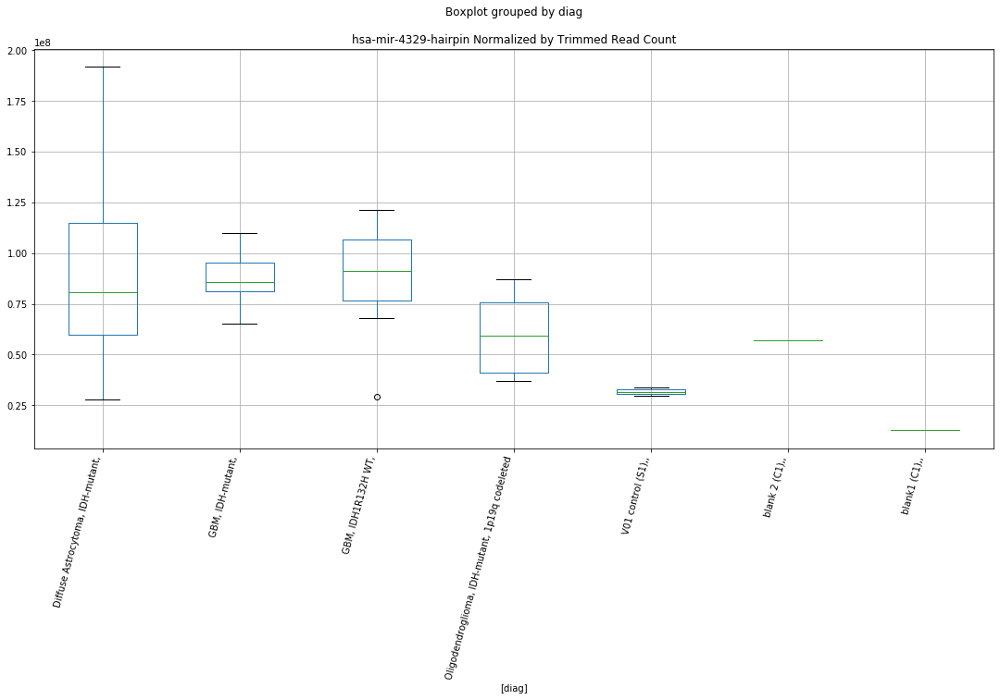

hsa-mir-4329-hairpin D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.6358699094918143
	p = 0.0018901564316795452
hsa-mir-4329-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.6358699094918143
	p = 0.0018901564316795452
hsa-mir-4329-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.668585430853589
	p = 0.015660928549385156
hsa-mir-4329-hairpin D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.668585430853589
	p = 0.015660928549385156


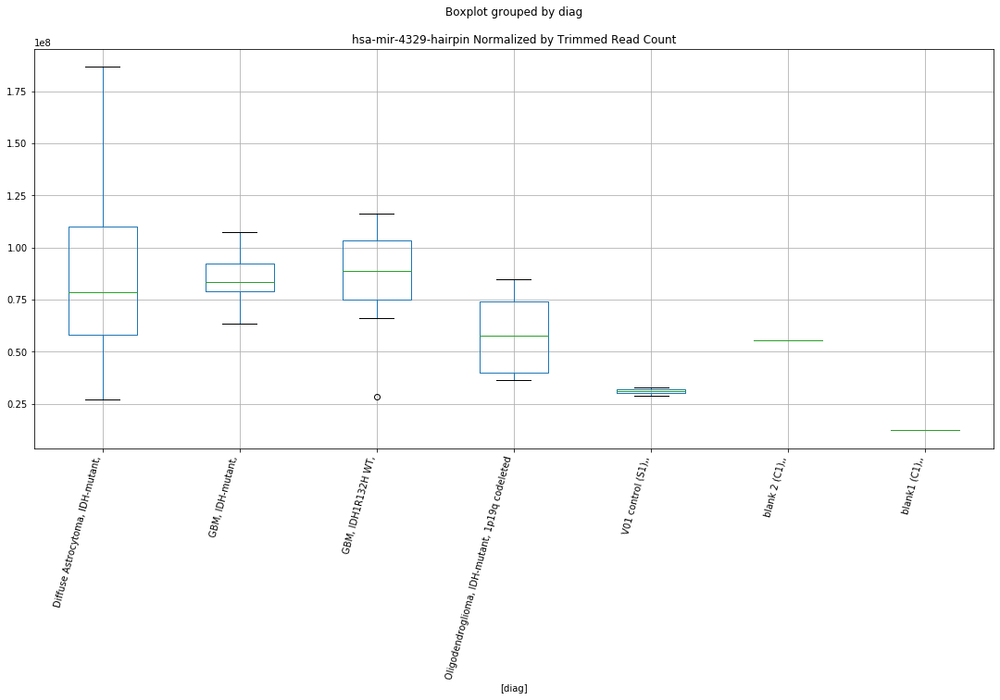

hsa-mir-4329-hairpin D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9888525524666563
	p = 0.06213772931493393
hsa-mir-4329-hairpin D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2207852664084915
	p = 0.03943790485063914
hsa-mir-4329-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9888525524666563
	p = 0.06213772931493393
hsa-mir-4329-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.2207852664084915
	p = 0.03943790485063914


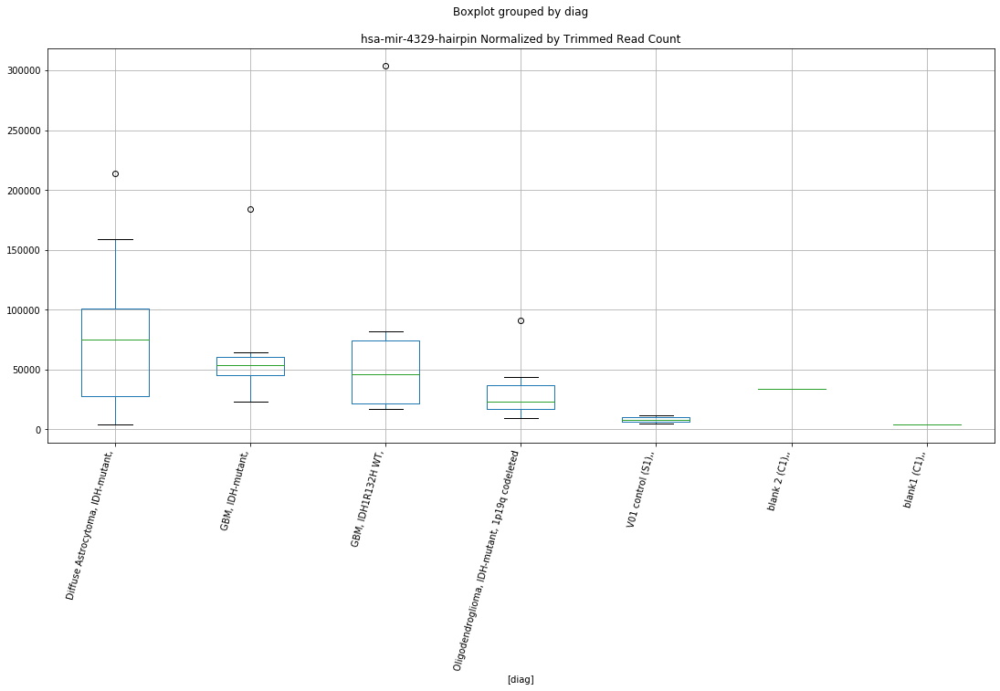

hsa-mir-4329-hairpin D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9879925836999066
	p = 0.06224032664118879
hsa-mir-4329-hairpin D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2192499139195805
	p = 0.03955914420915662
hsa-mir-4329-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9879925836999066
	p = 0.06224032664118879
hsa-mir-4329-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.2192499139195805
	p = 0.03955914420915662


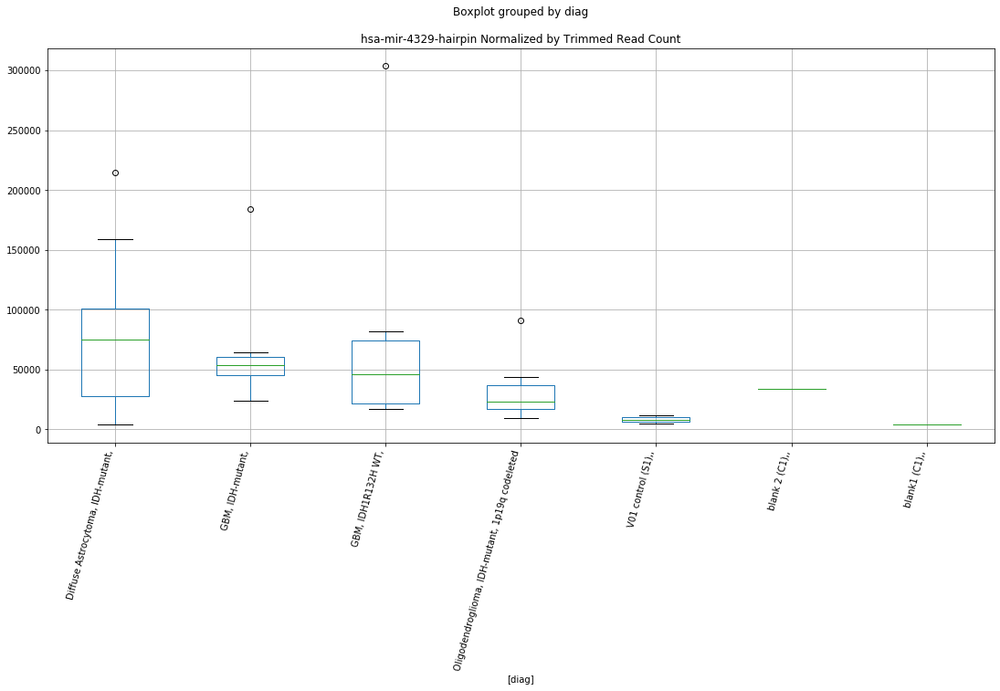

hsa-mir-4329-hairpin D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9880317573092823
	p = 0.062235649789262396
hsa-mir-4329-hairpin D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.219172948164431
	p = 0.03956523083992132
hsa-mir-4329-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9880317573092823
	p = 0.062235649789262396
hsa-mir-4329-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.219172948164431
	p = 0.03956523083992132


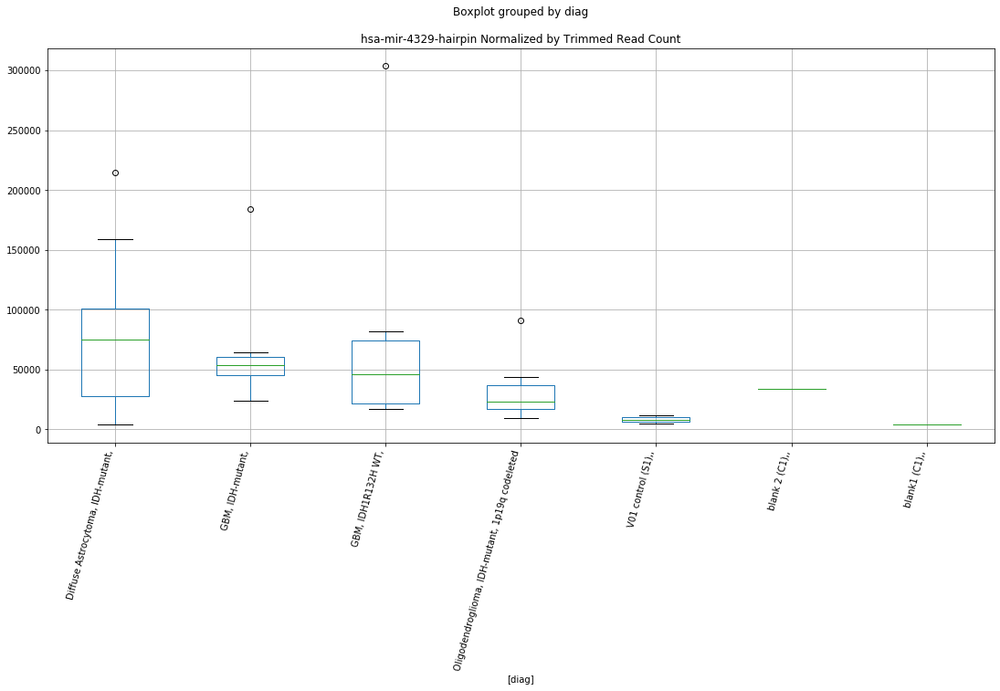

hsa-mir-4329-hairpin Lexogen bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.092344997446243
	p = 0.0508467308574049
hsa-mir-4329-hairpin Lexogen bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.092344997446243
	p = 0.0508467308574049


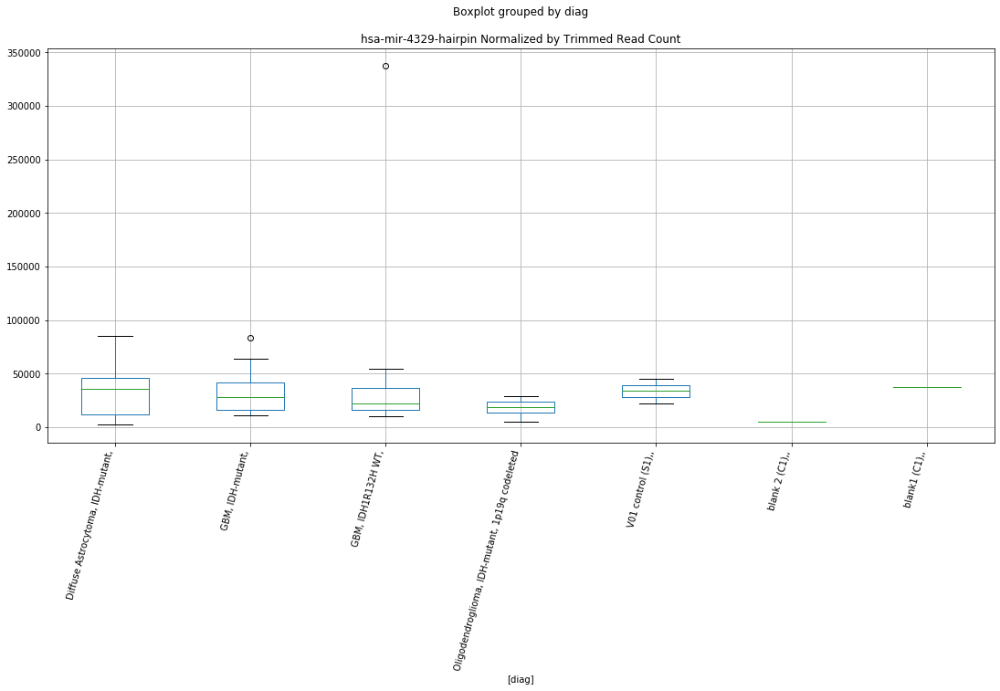

hsa-mir-5588-hairpin D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.3534858082894585
	p = 0.00353755292178785
hsa-mir-5588-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.3534858082894585
	p = 0.00353755292178785


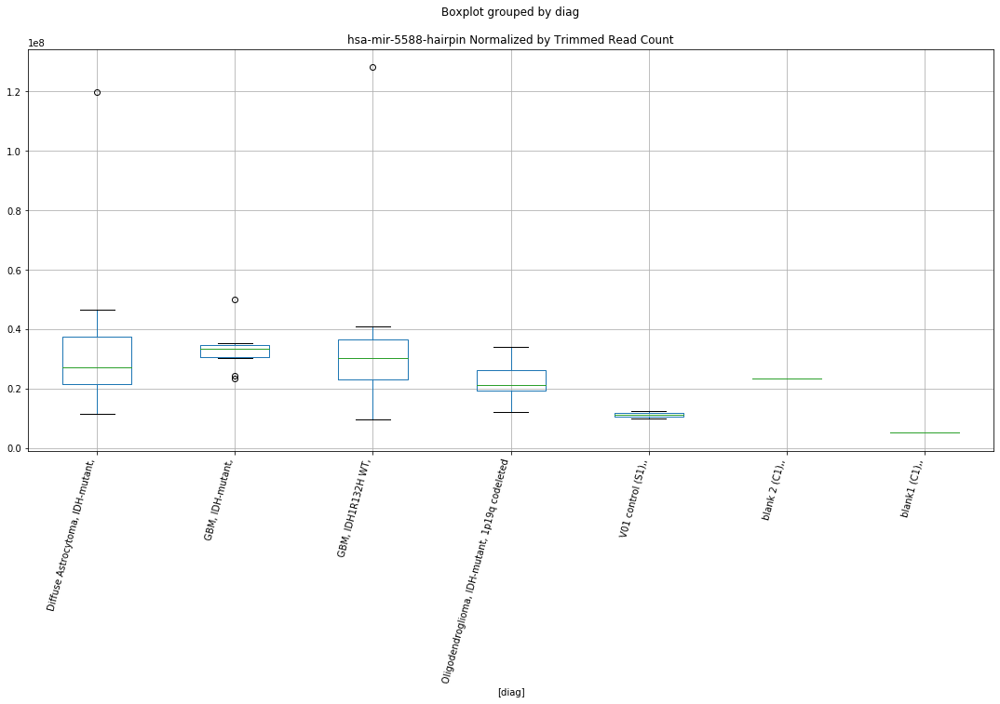

hsa-mir-5588-hairpin D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.330220270376749
	p = 0.003724254288859774
hsa-mir-5588-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.330220270376749
	p = 0.003724254288859774


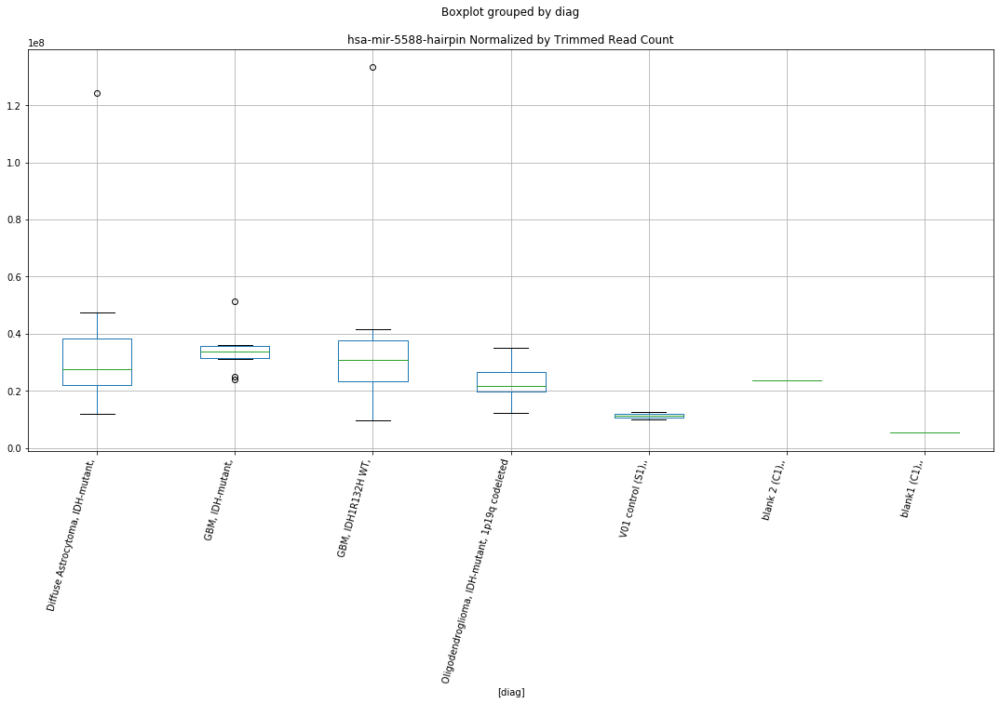

hsa-mir-5588-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.0502510197522805
	p = 0.05519390007548889
hsa-mir-5588-hairpin D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0502510197522805
	p = 0.05519390007548889


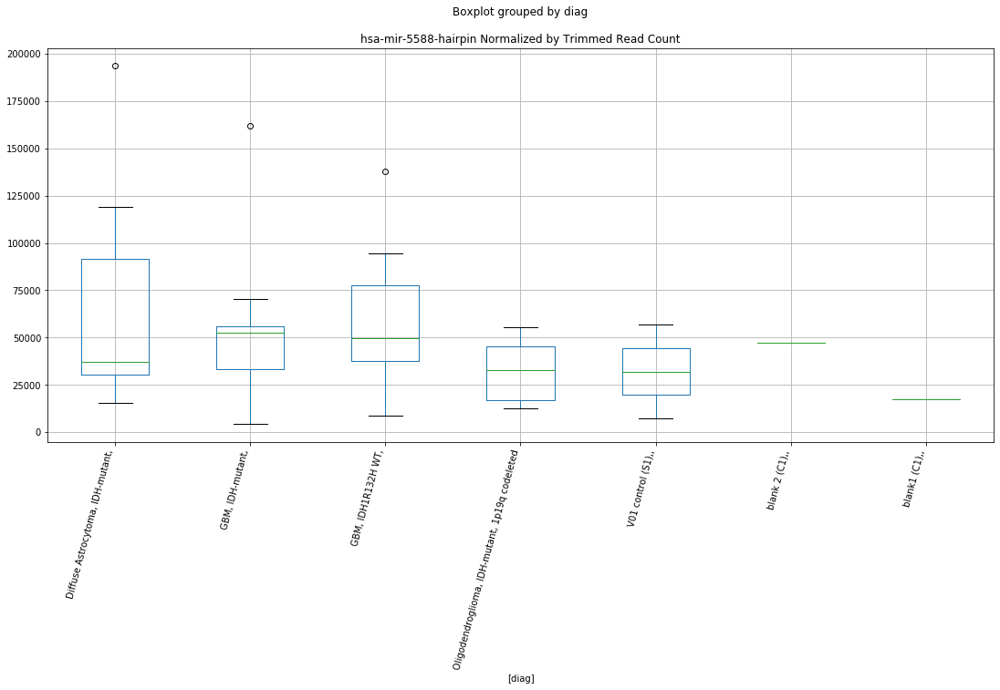

hsa-mir-5588-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.0510780773235453
	p = 0.05510534536903273
hsa-mir-5588-hairpin D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0510780773235453
	p = 0.05510534536903273


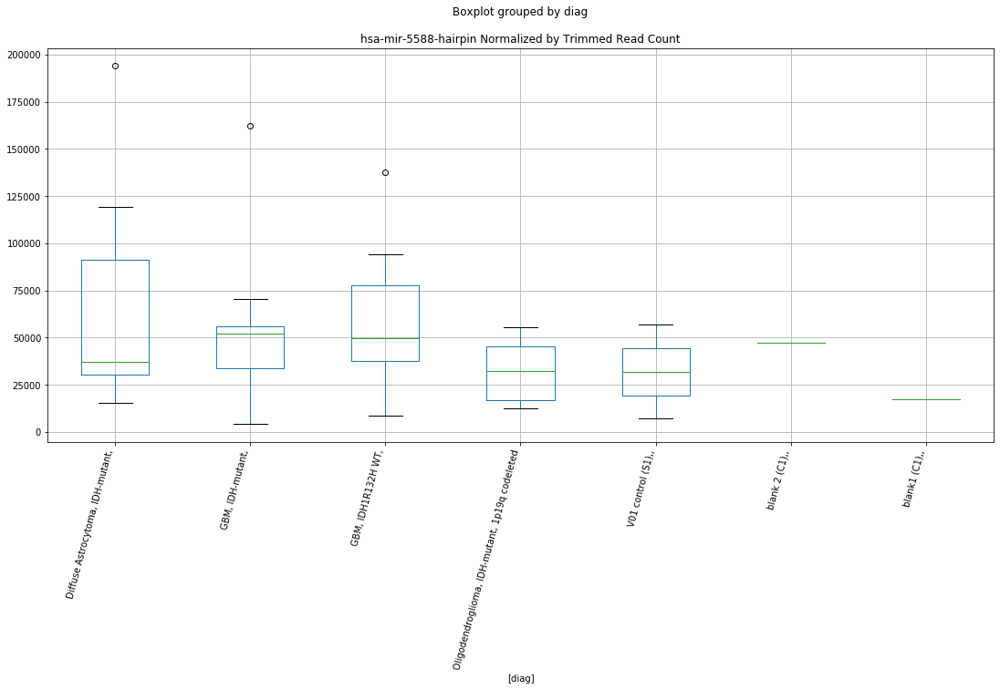

hsa-mir-5588-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.0510792155944175
	p = 0.055105223580634514
hsa-mir-5588-hairpin D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0510792155944175
	p = 0.055105223580634514


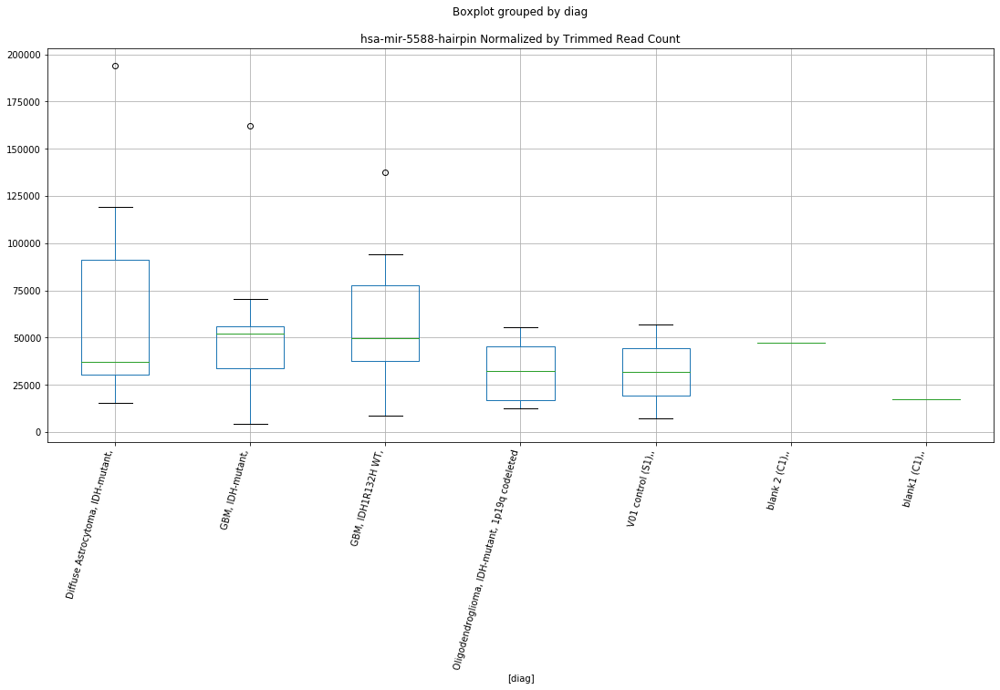

hsa-mir-92b-hairpin D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.7758851363379557
	p = 0.012463798447005894
hsa-mir-92b-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.7758851363379557
	p = 0.012463798447005894


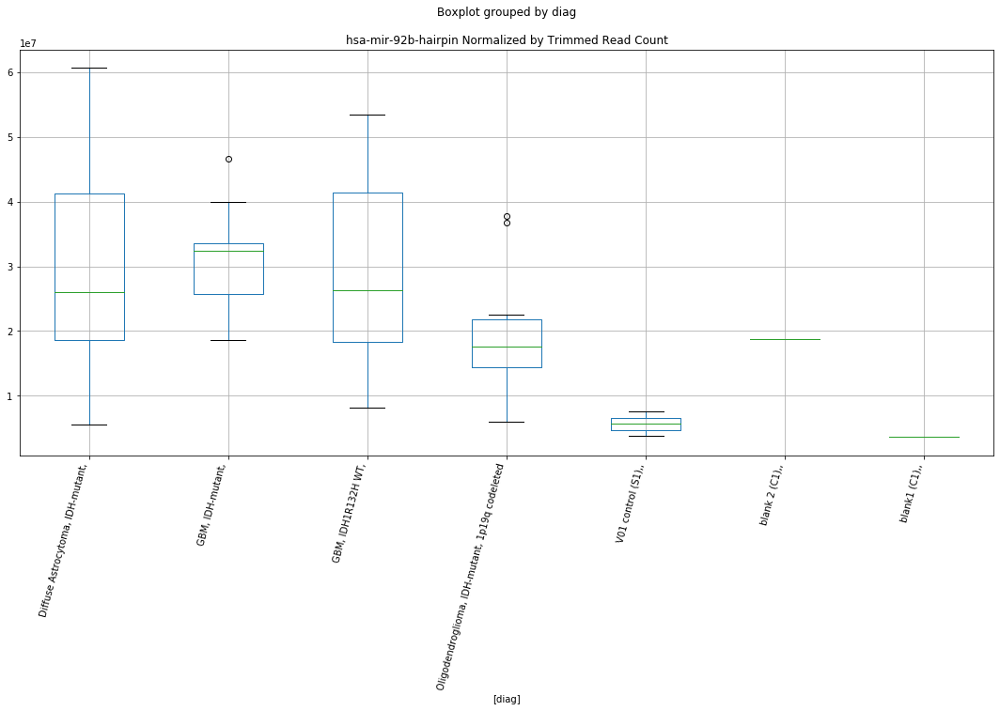

hsa-mir-92b-hairpin D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.773475445439635
	p = 0.012528182997316582
hsa-mir-92b-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.773475445439635
	p = 0.012528182997316582


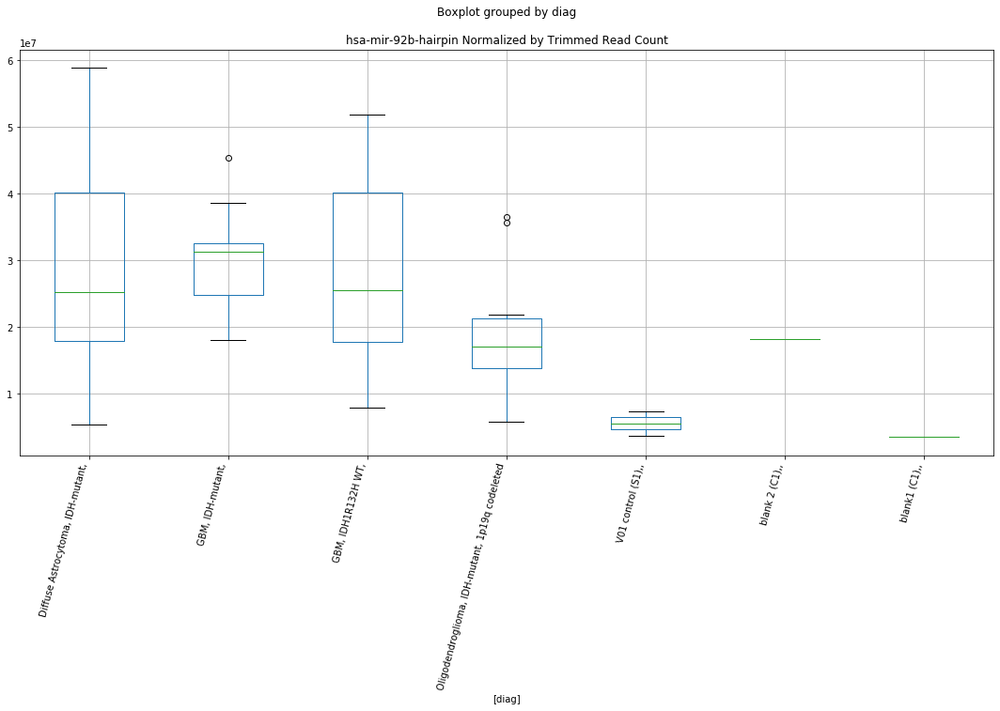

hsa-mir-92b-hairpin D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.0936088138431246
	p = 0.006266297959198276
hsa-mir-92b-hairpin D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.340861620486848
	p = 0.030951377208327323
hsa-mir-92b-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.0936088138431246
	p = 0.006266297959198276
hsa-mir-92b-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.340861620486848
	p = 0.030951377208327323


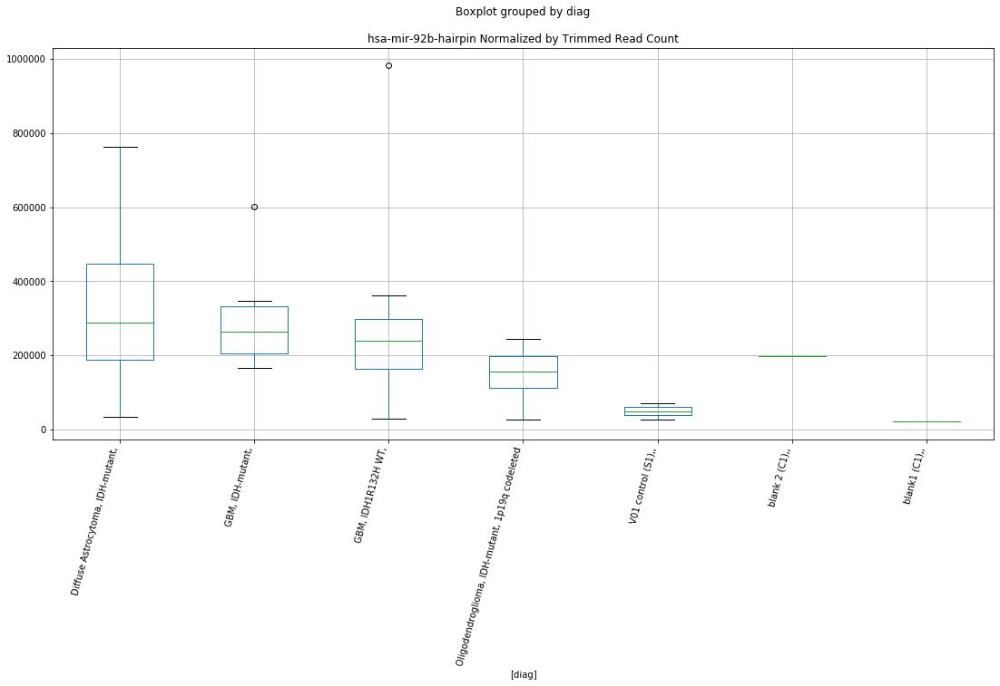

hsa-mir-92b-hairpin D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.09475469508708
	p = 0.006250616089302545
hsa-mir-92b-hairpin D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.341687365262328
	p = 0.030899384927178822
hsa-mir-92b-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.09475469508708
	p = 0.006250616089302545
hsa-mir-92b-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.341687365262328
	p = 0.030899384927178822


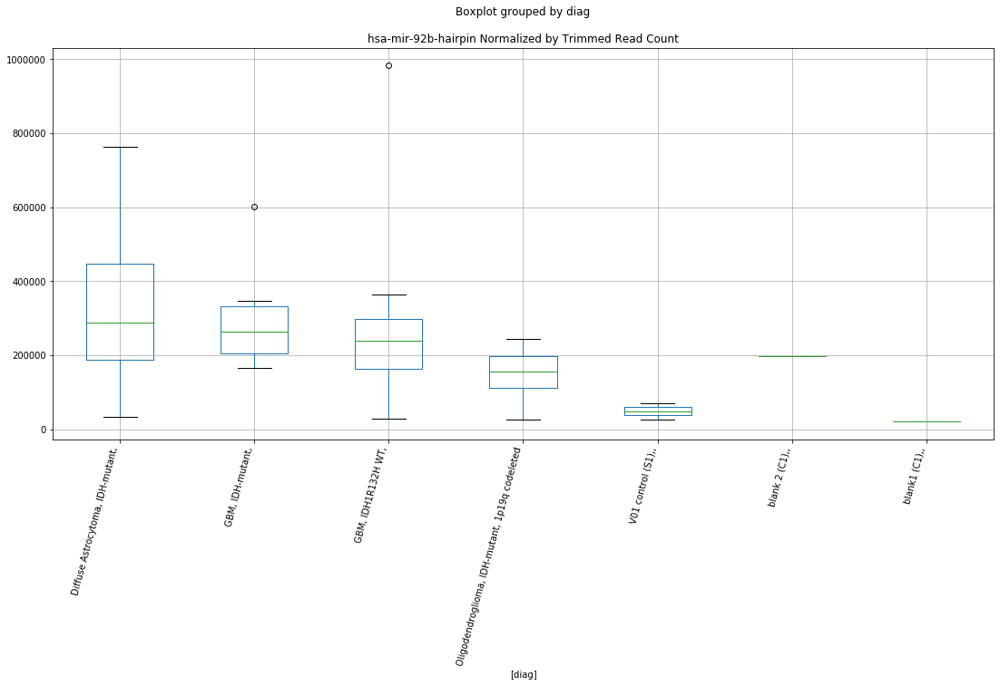

hsa-mir-92b-hairpin D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.0954440670809418
	p = 0.006241200183682024
hsa-mir-92b-hairpin D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.3415544207754975
	p = 0.030907750165590612
hsa-mir-92b-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.0954440670809418
	p = 0.006241200183682024
hsa-mir-92b-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.3415544207754975
	p = 0.030907750165590612


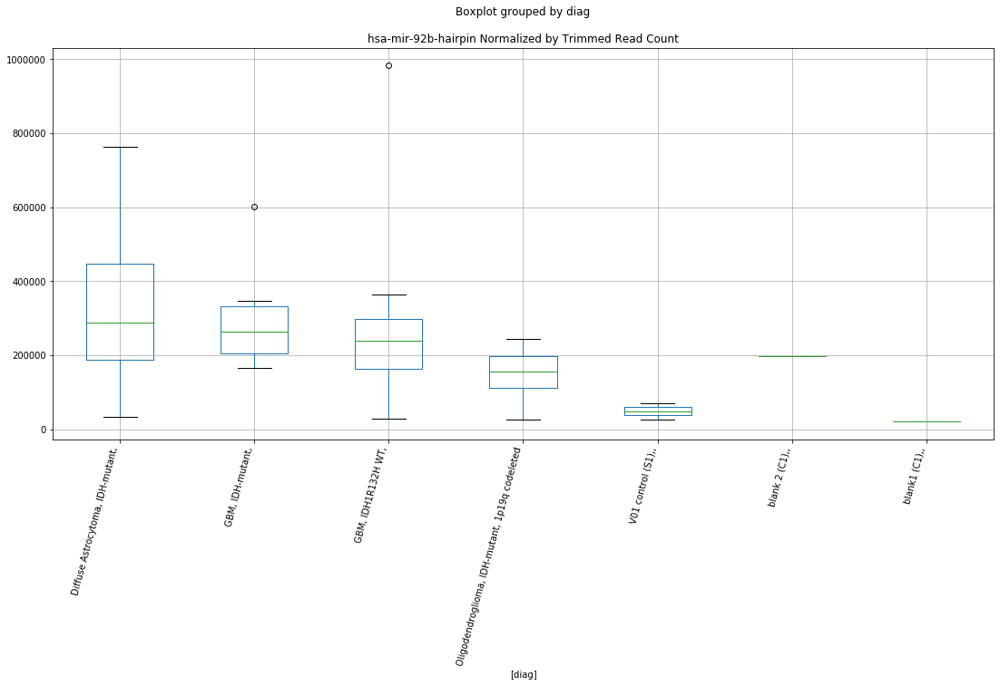

hsa-mir-4271-hairpin D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.992604737345159
	p = 0.06169185337150427
hsa-mir-4271-hairpin D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.992604737345159
	p = 0.06169185337150427


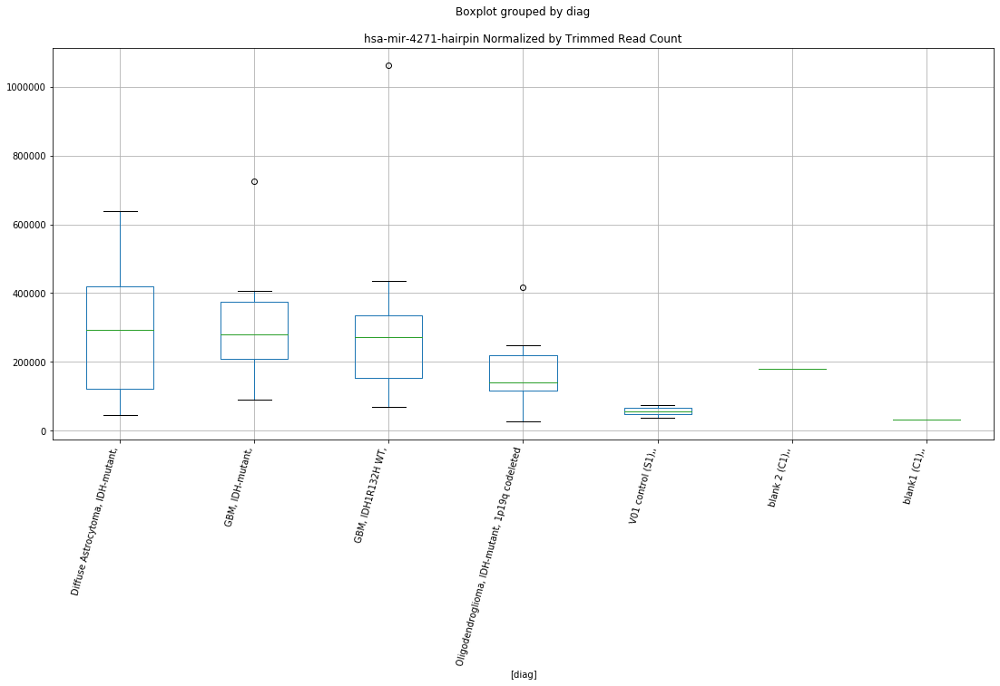

hsa-mir-4271-hairpin D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.635891027791806
	p = 0.016781520489470743
hsa-mir-4271-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.635891027791806
	p = 0.016781520489470743


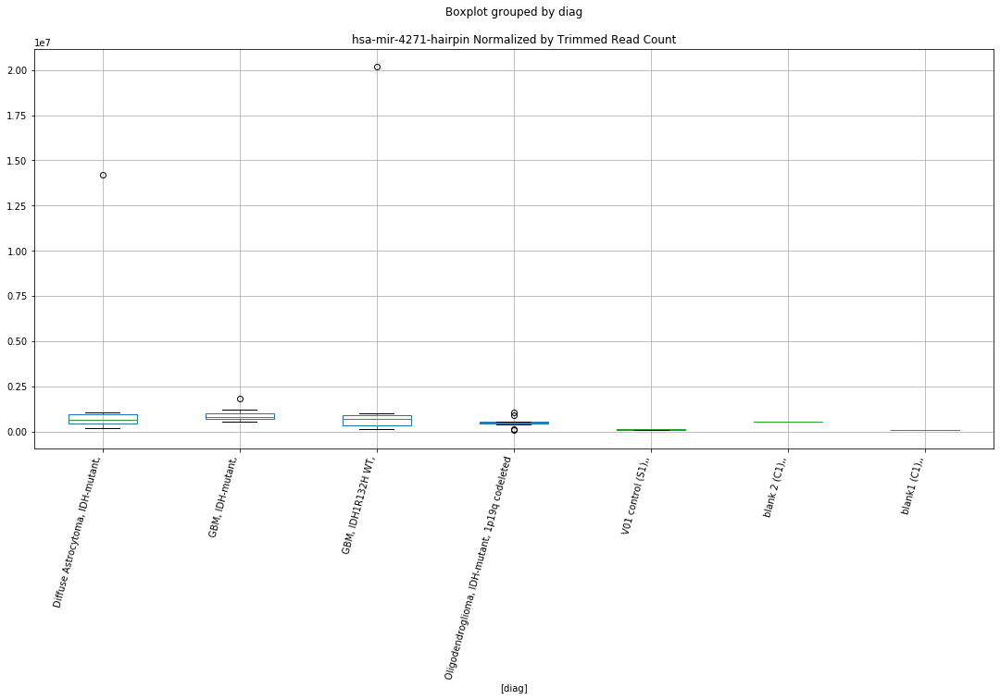

hsa-mir-4271-hairpin D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.6367688341465985
	p = 0.016750461330793307
hsa-mir-4271-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.6367688341465985
	p = 0.016750461330793307


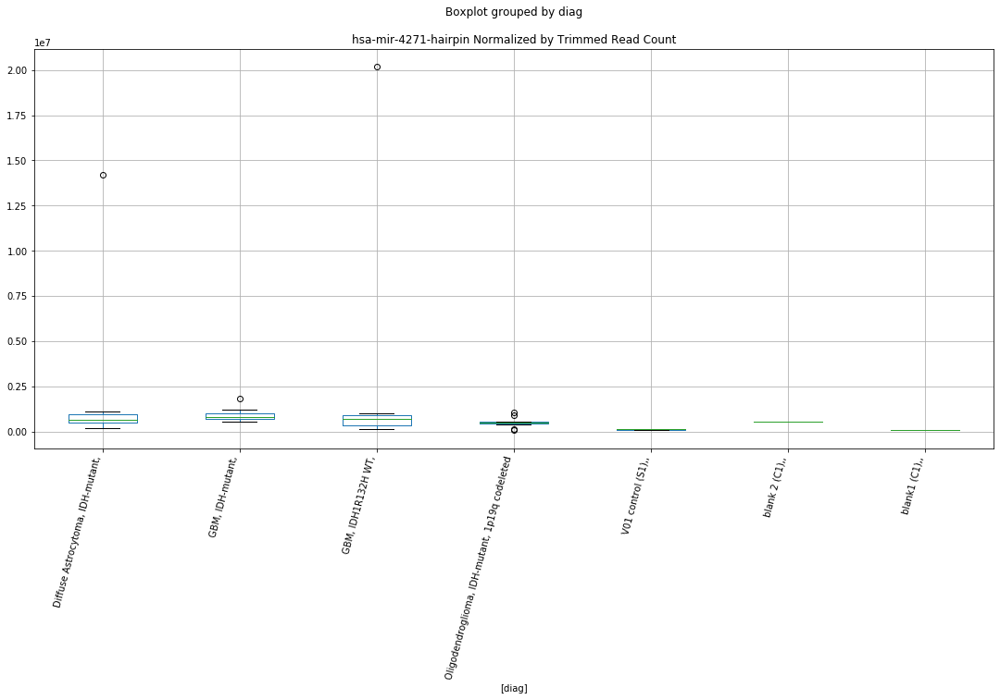

hsa-mir-4271-hairpin D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.636677123753432
	p = 0.016753703732089387
hsa-mir-4271-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.636677123753432
	p = 0.016753703732089387


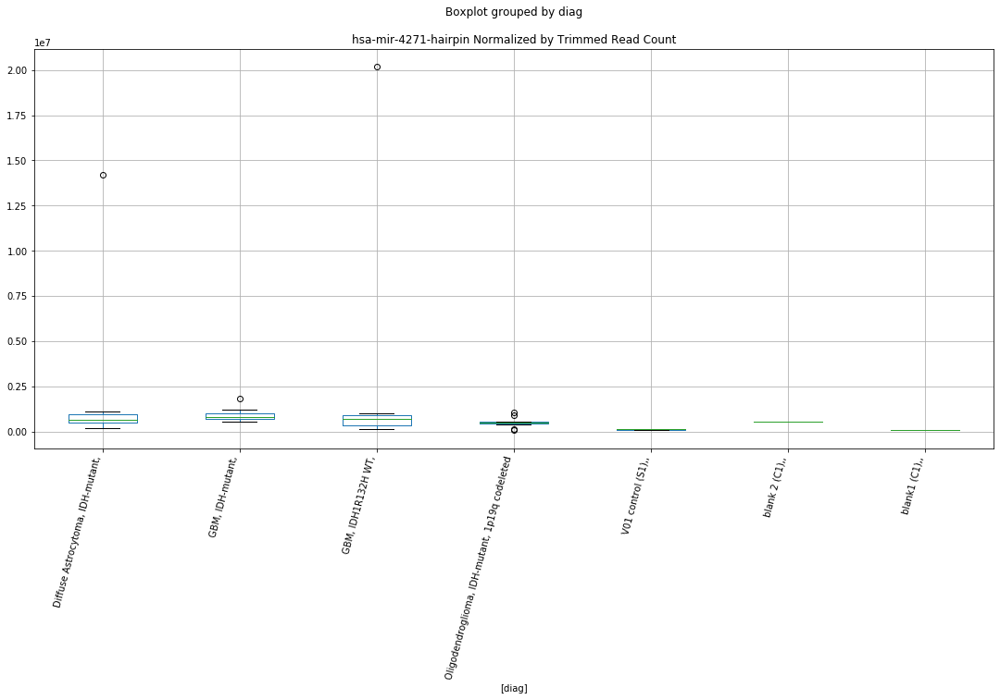

hsa-mir-548u-hairpin D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.985297774933114
	p = 0.06256281169343914
hsa-mir-548u-hairpin D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.3800454087659872
	p = 0.02857193847329608
hsa-mir-548u-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.985297774933114
	p = 0.06256281169343914
hsa-mir-548u-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.3800454087659872
	p = 0.02857193847329608
hsa-mir-548u-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.6717711001890514
	p = 0.015555636124180263
hsa-mir-548u-hairpin D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.6717711001890514
	p = 0.015555636124180263


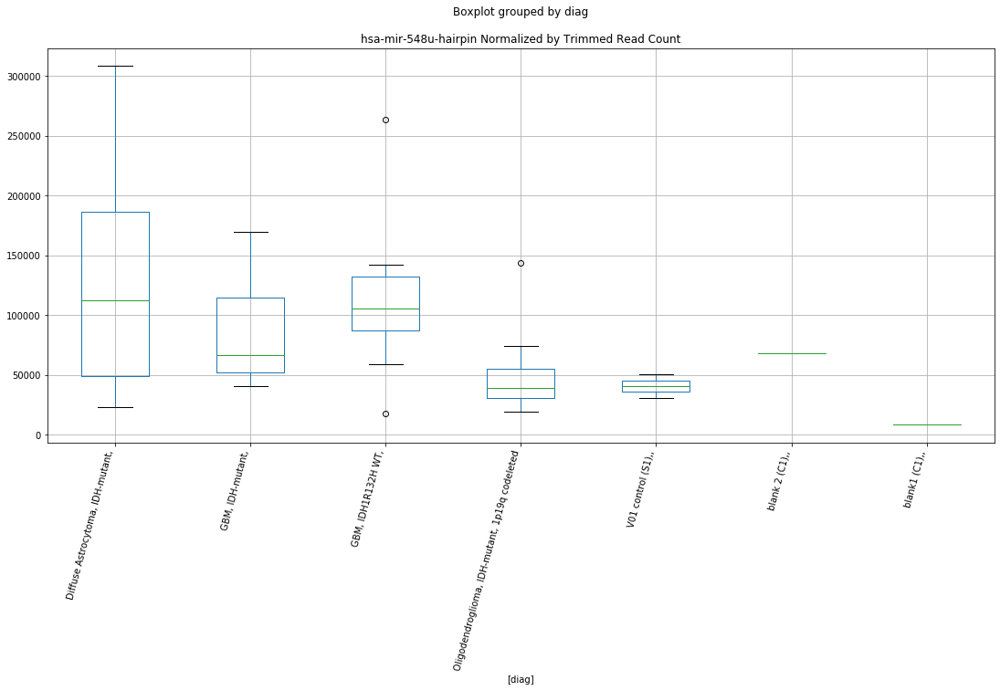

hsa-mir-548u-hairpin D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9857154041058034
	p = 0.06251273651985274
hsa-mir-548u-hairpin D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.379497414724235
	p = 0.028604005478941142
hsa-mir-548u-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9857154041058034
	p = 0.06251273651985274
hsa-mir-548u-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.379497414724235
	p = 0.028604005478941142
hsa-mir-548u-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.6725630949897266
	p = 0.015529564140284774
hsa-mir-548u-hairpin D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.6725630949897266
	p = 0.015529564140284774


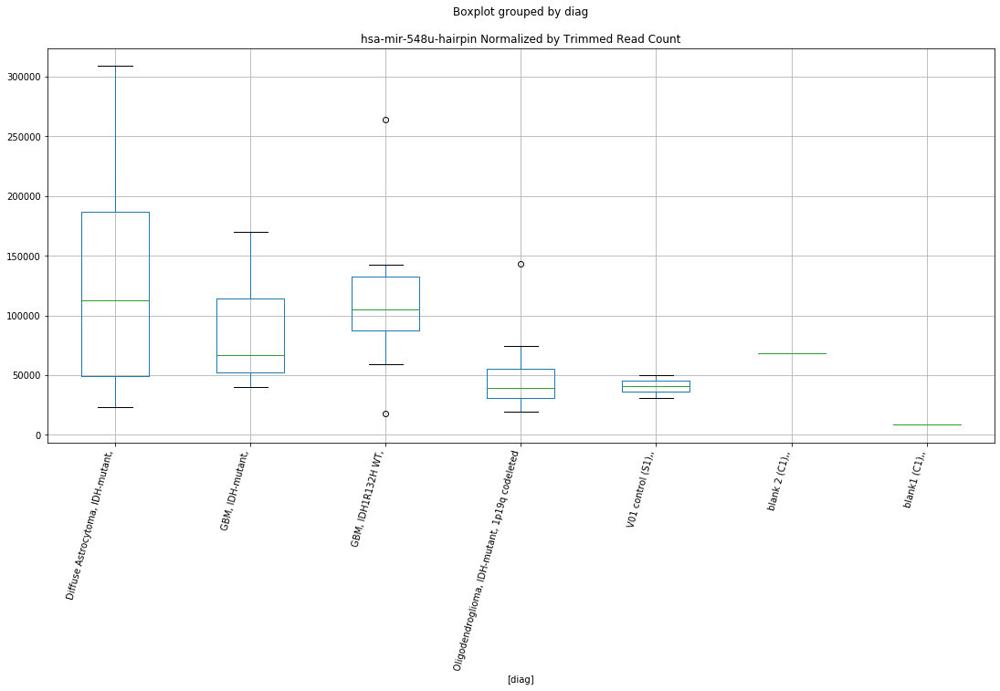

hsa-mir-548u-hairpin D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9857205059215457
	p = 0.0625121250168809
hsa-mir-548u-hairpin D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.3796459341772906
	p = 0.028595311238544908
hsa-mir-548u-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9857205059215457
	p = 0.0625121250168809
hsa-mir-548u-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.3796459341772906
	p = 0.028595311238544908
hsa-mir-548u-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.67256361863329
	p = 0.015529546916050546
hsa-mir-548u-hairpin D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.67256361863329
	p = 0.015529546916050546


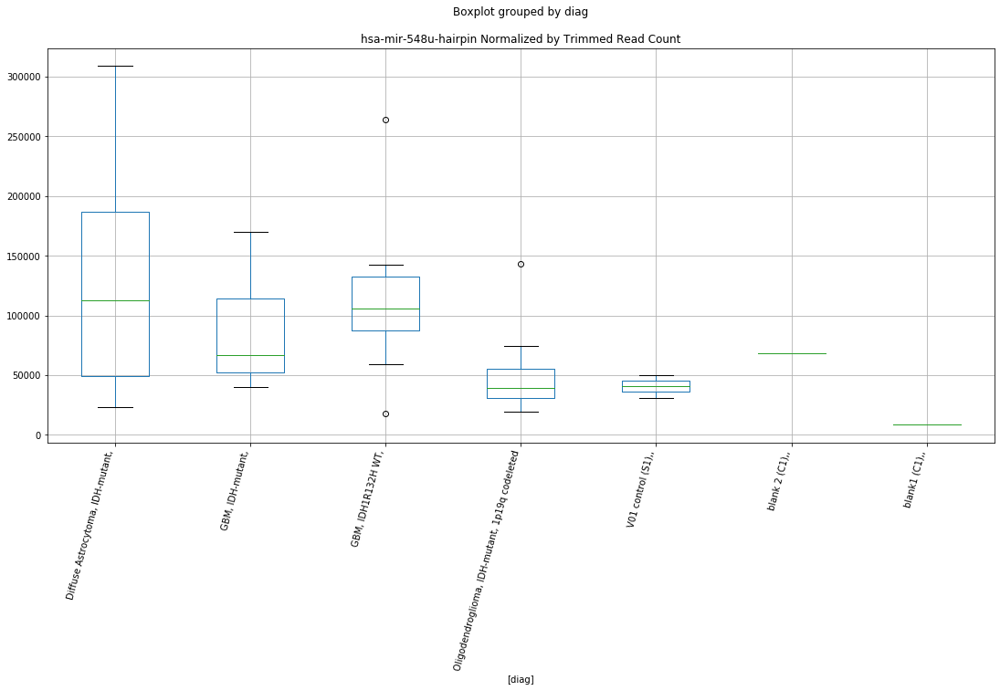

hsa-mir-1260a-hairpin D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0557880199577294
	p = 0.05460348612611735
hsa-mir-1260a-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.0557880199577294
	p = 0.05460348612611735


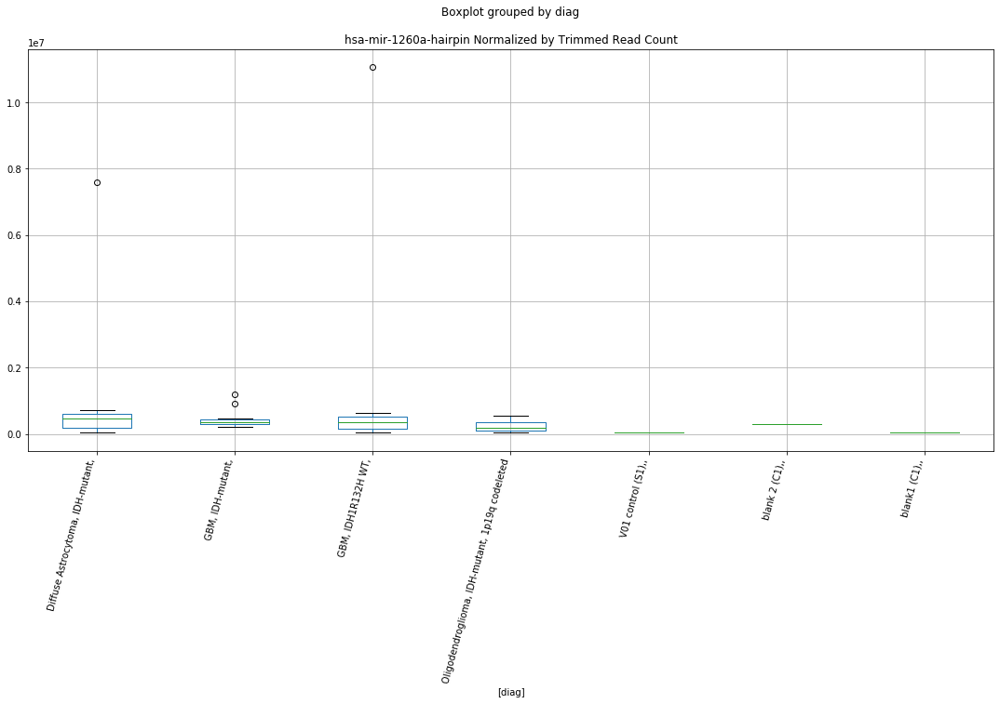

hsa-mir-1260a-hairpin D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0561536751546954
	p = 0.05456469782338437
hsa-mir-1260a-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.0561536751546954
	p = 0.05456469782338437


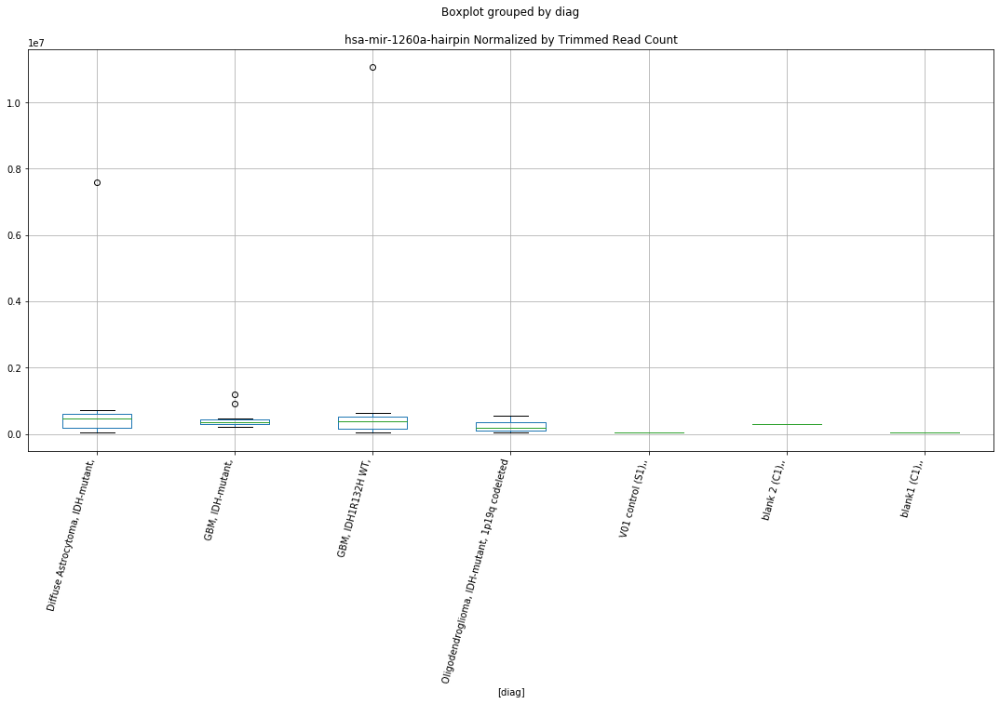

hsa-mir-1260a-hairpin D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0561742302690016
	p = 0.05456251809930383
hsa-mir-1260a-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.0561742302690016
	p = 0.05456251809930383


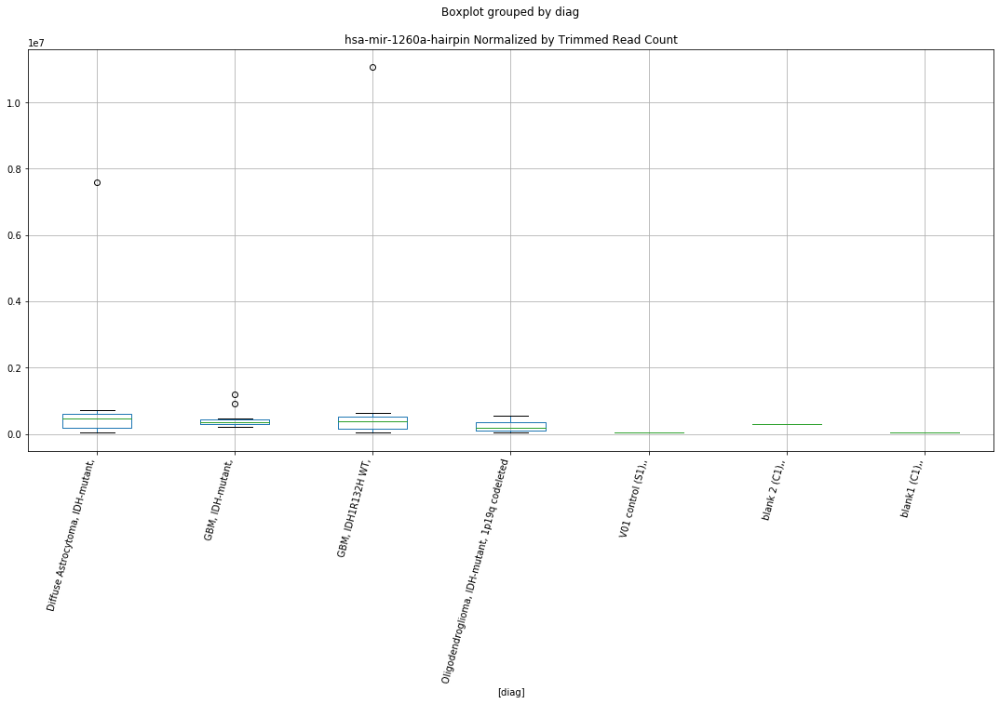

hsa-mir-944-hairpin D-plex bbduk1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9018443758081909
	p = 0.0733191461248945
hsa-mir-944-hairpin D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.9018443758081909
	p = 0.0733191461248945


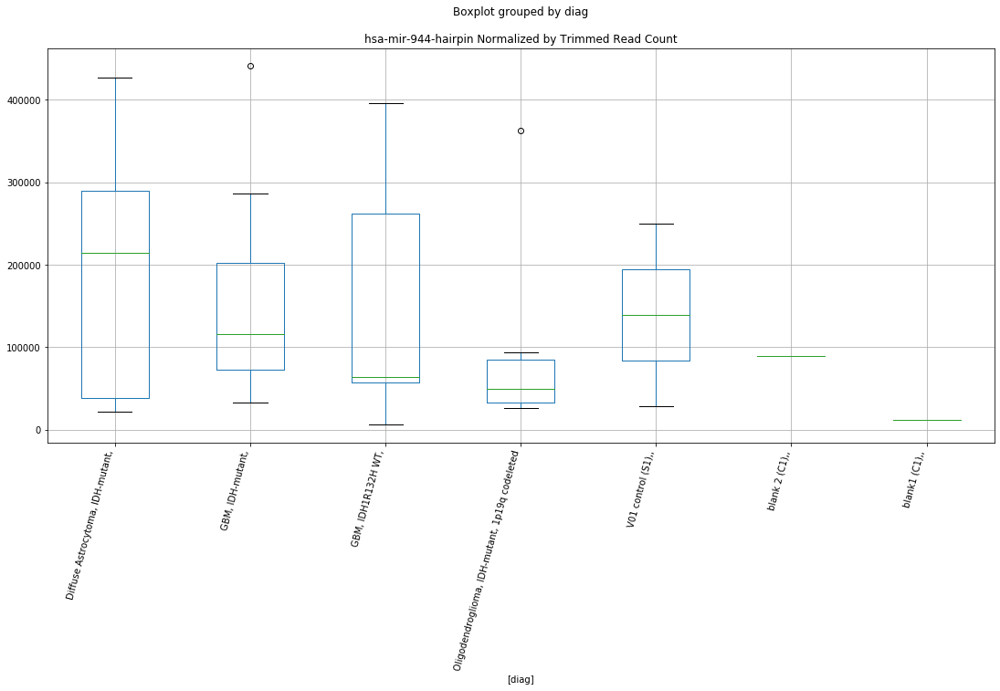

hsa-mir-3908-hairpin D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.4018083475906735
	p = 0.027325245870422853
hsa-mir-3908-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.4018083475906735
	p = 0.027325245870422853
hsa-mir-3908-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.3011222404169076
	p = 0.033551846471676285
hsa-mir-3908-hairpin D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.3011222404169076
	p = 0.033551846471676285


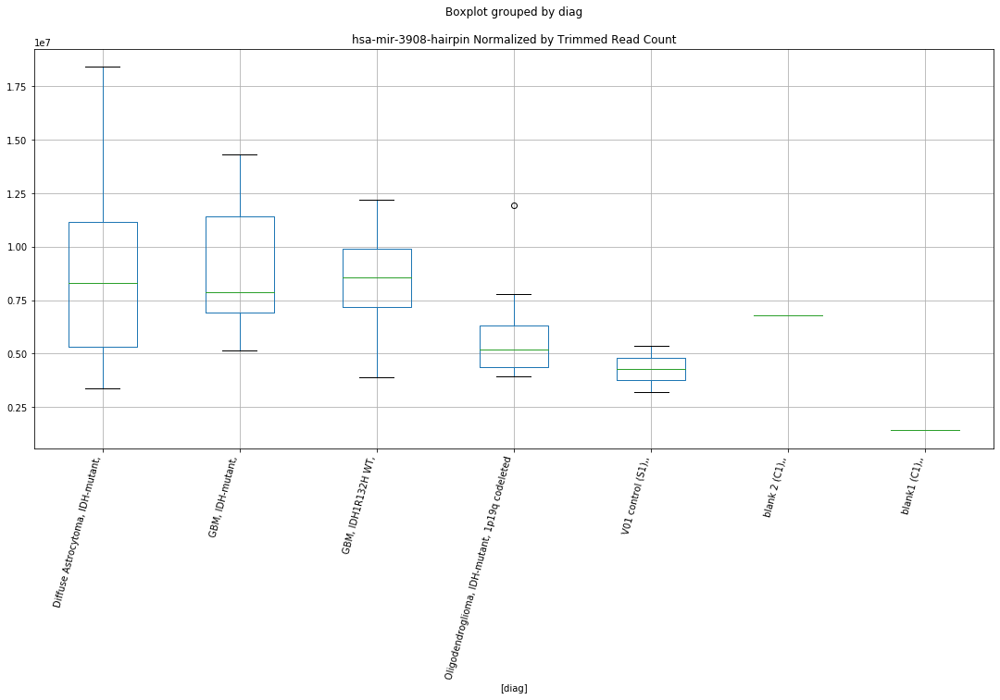

hsa-mir-3908-hairpin D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.509775123635188
	p = 0.021859060840938197
hsa-mir-3908-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.509775123635188
	p = 0.021859060840938197
hsa-mir-3908-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.362487896330775
	p = 0.029616212632832765
hsa-mir-3908-hairpin D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.362487896330775
	p = 0.029616212632832765


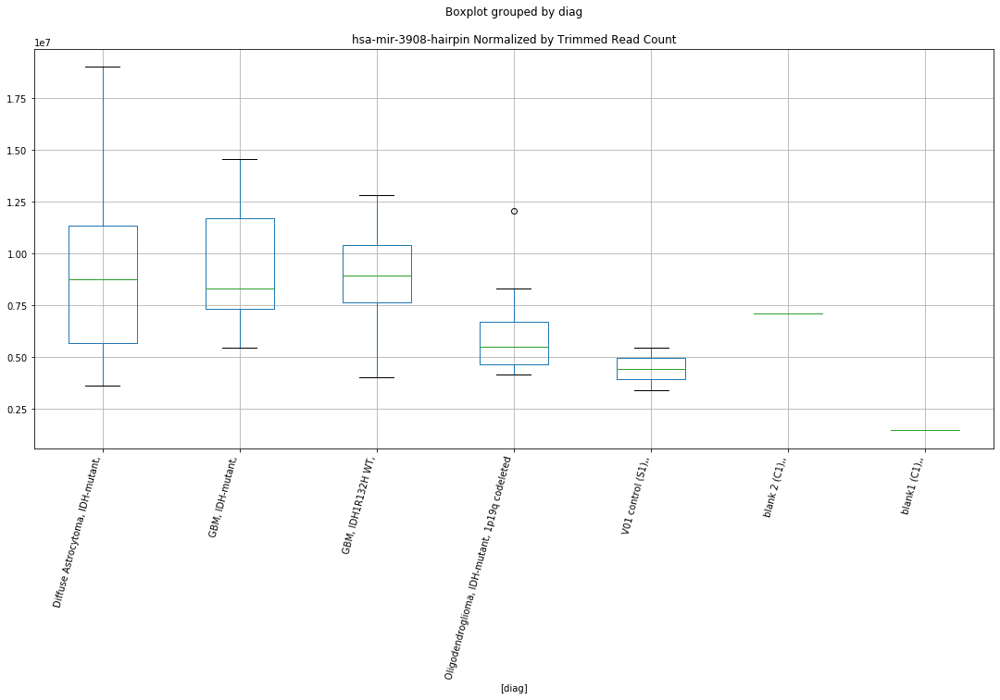

hsa-mir-3613-hairpin D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8567924248646535
	p = 0.07978346075952364
hsa-mir-3613-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8567924248646535
	p = 0.07978346075952364


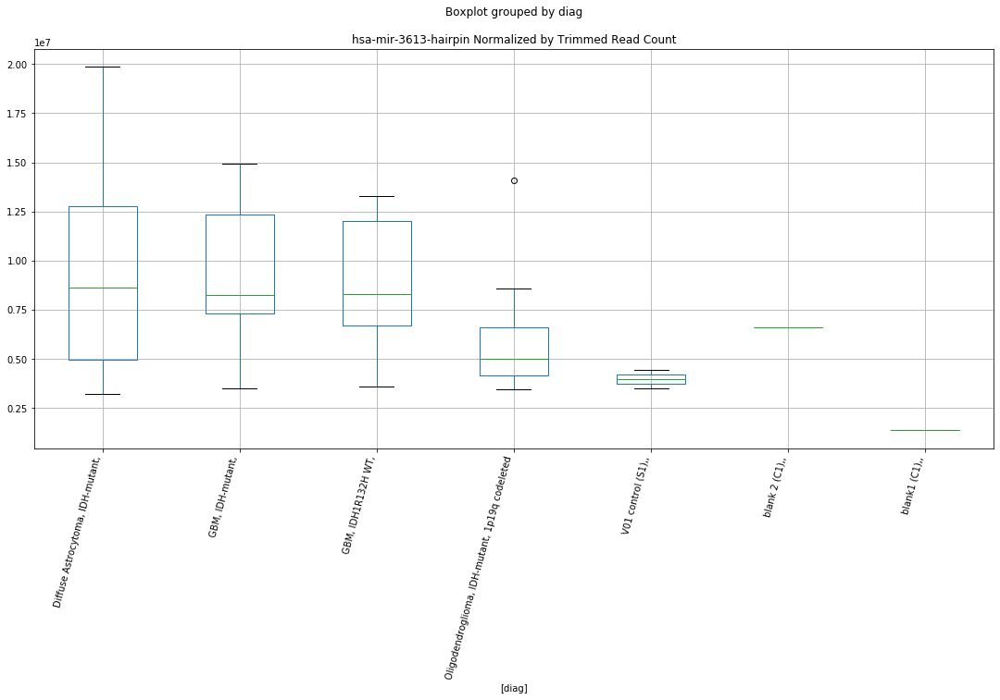

hsa-mir-3613-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.1009874345895643
	p = 0.049993593743555394
hsa-mir-3613-hairpin D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.1009874345895643
	p = 0.049993593743555394


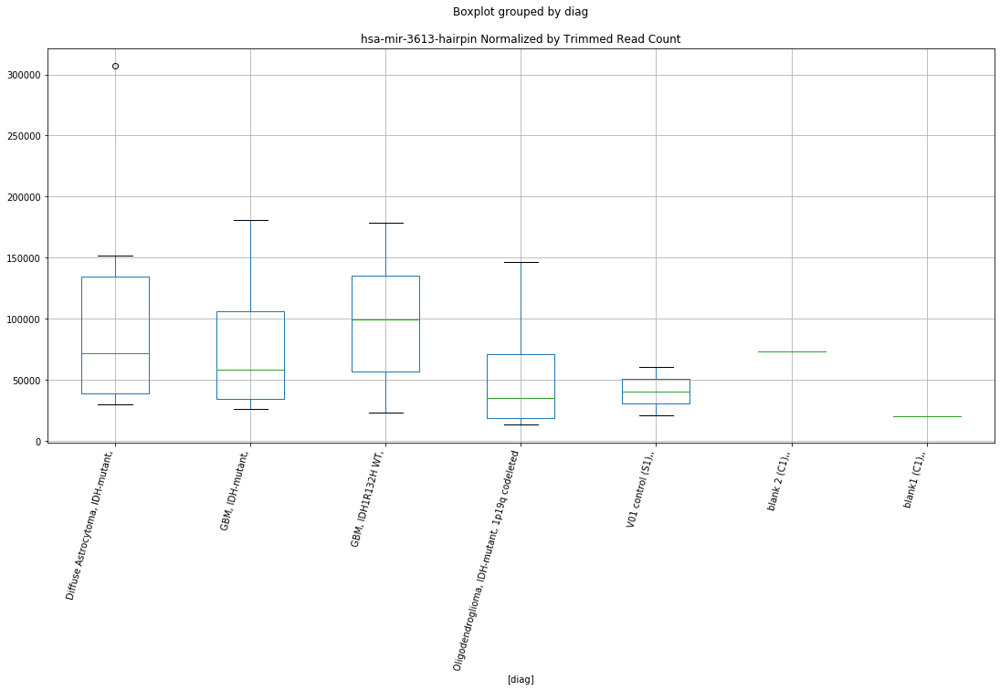

hsa-mir-3613-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.0979755542927667
	p = 0.05028942325062878
hsa-mir-3613-hairpin D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0979755542927667
	p = 0.05028942325062878


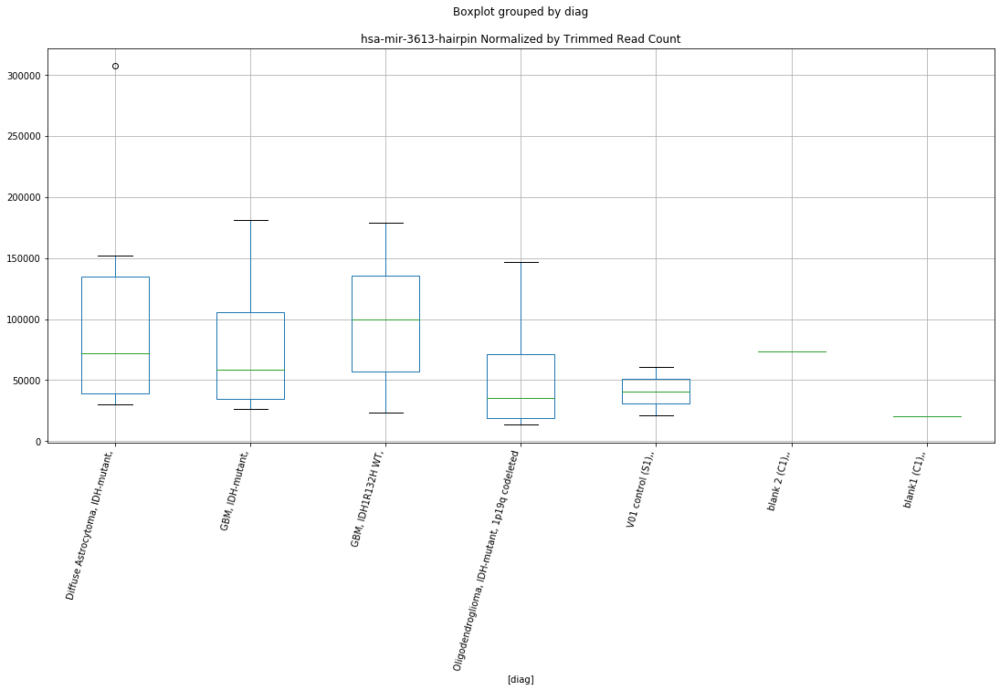

hsa-mir-3613-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.10145523801582
	p = 0.0499477878562242
hsa-mir-3613-hairpin D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.10145523801582
	p = 0.0499477878562242


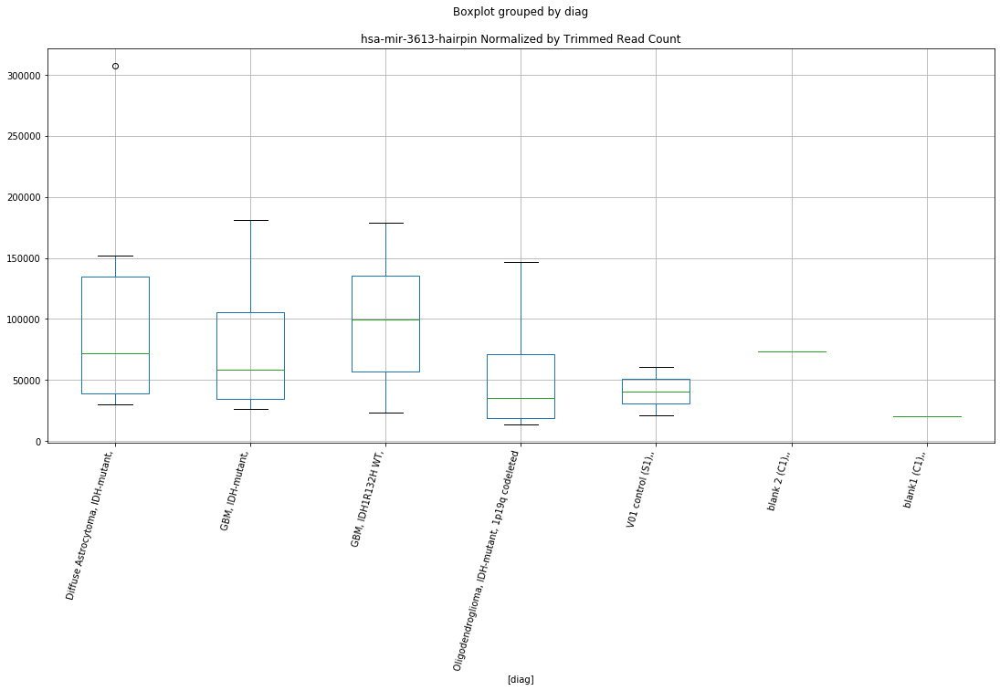

hsa-mir-8086-hairpin D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0841833668627534
	p = 0.05166452078624086
hsa-mir-8086-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.0841833668627534
	p = 0.05166452078624086


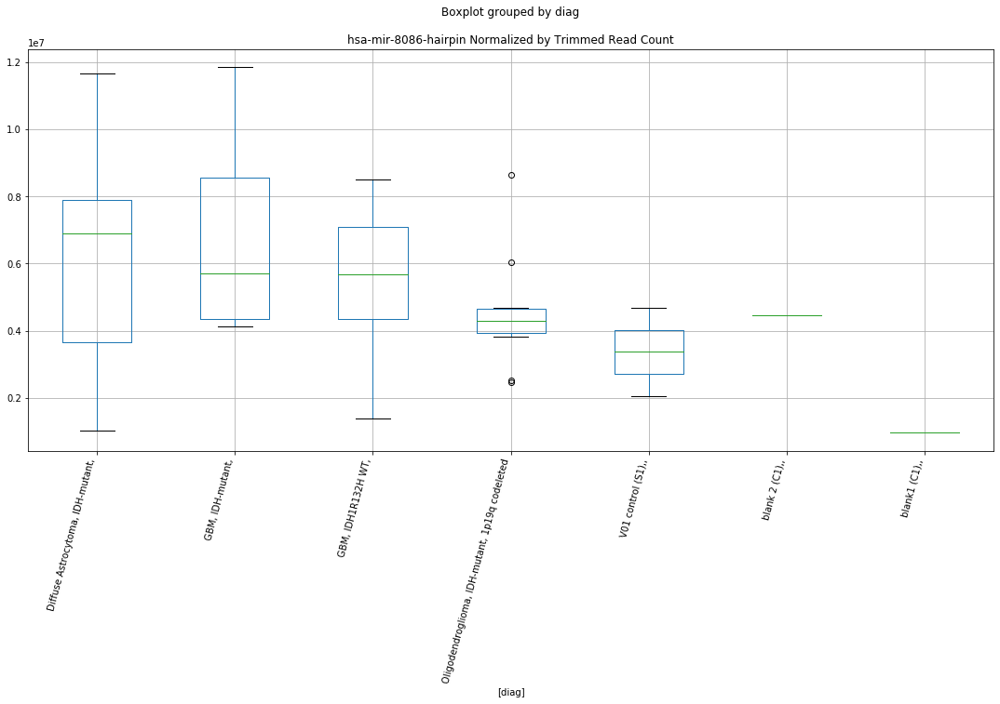

hsa-mir-8086-hairpin D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.081366560285353
	p = 0.05194952134522261
hsa-mir-8086-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.081366560285353
	p = 0.05194952134522261


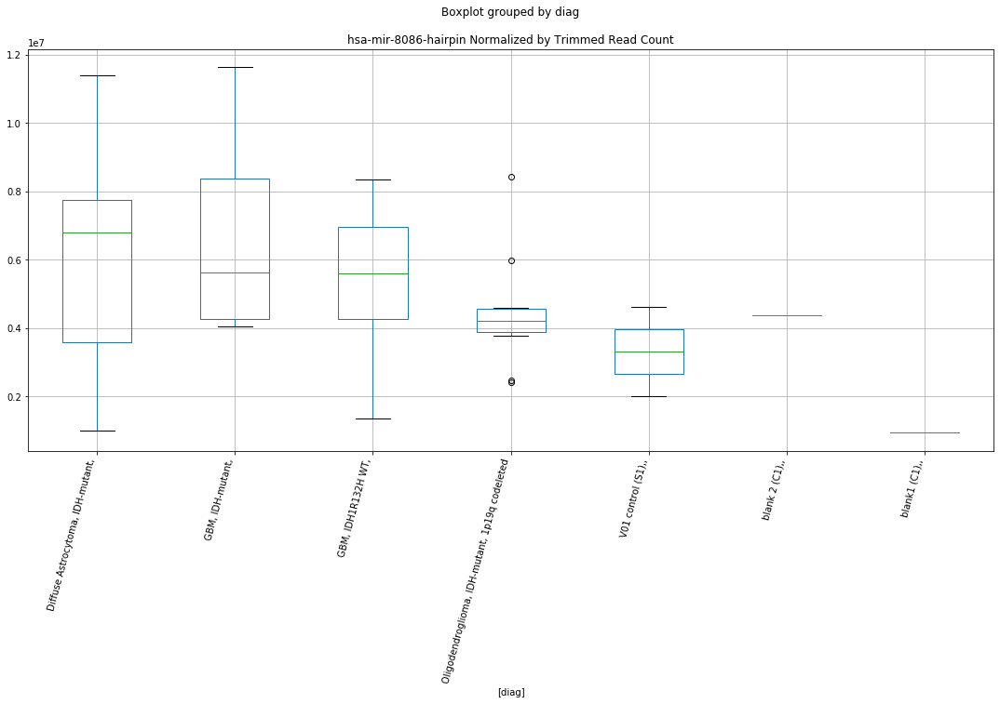

hsa-mir-4668-hairpin D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.8927678289656944
	p = 0.00969562185863635
hsa-mir-4668-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.8927678289656944
	p = 0.00969562185863635


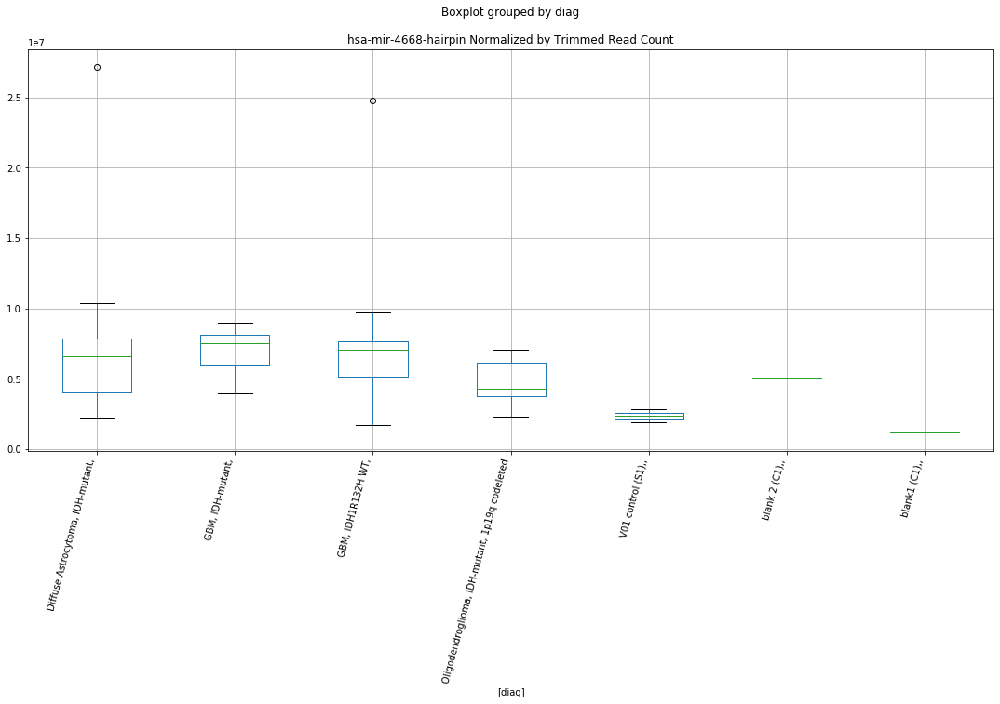

hsa-mir-4668-hairpin D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.887442825034406
	p = 0.009807689984596961
hsa-mir-4668-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.887442825034406
	p = 0.009807689984596961


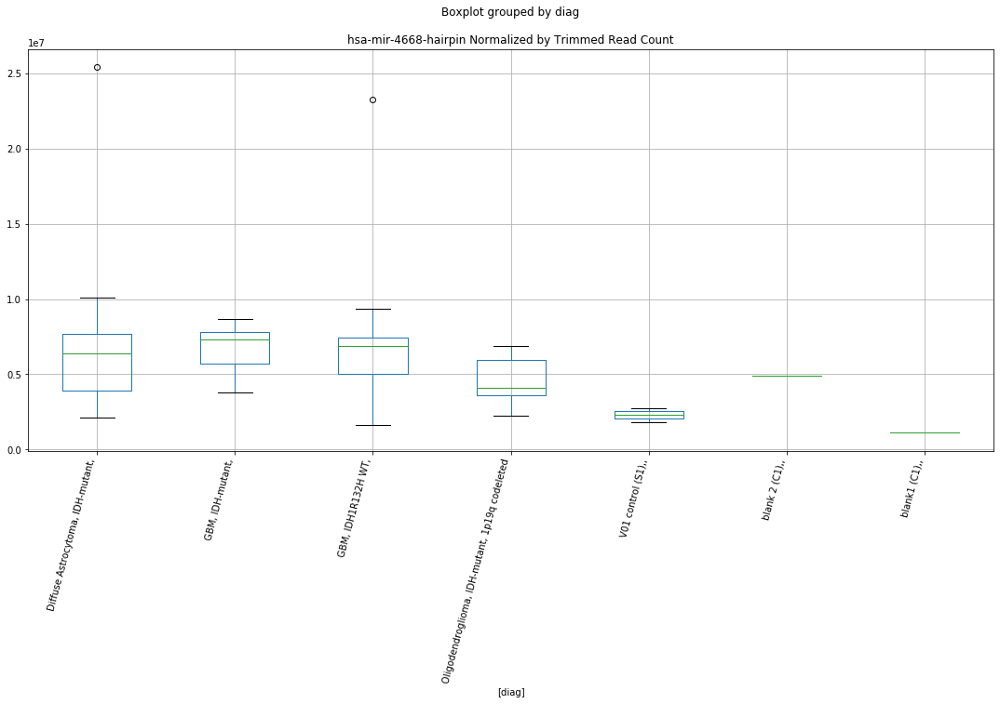

hsa-mir-4668-hairpin D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.342661765019785
	p = 0.03083813725065738
hsa-mir-4668-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.342661765019785
	p = 0.03083813725065738


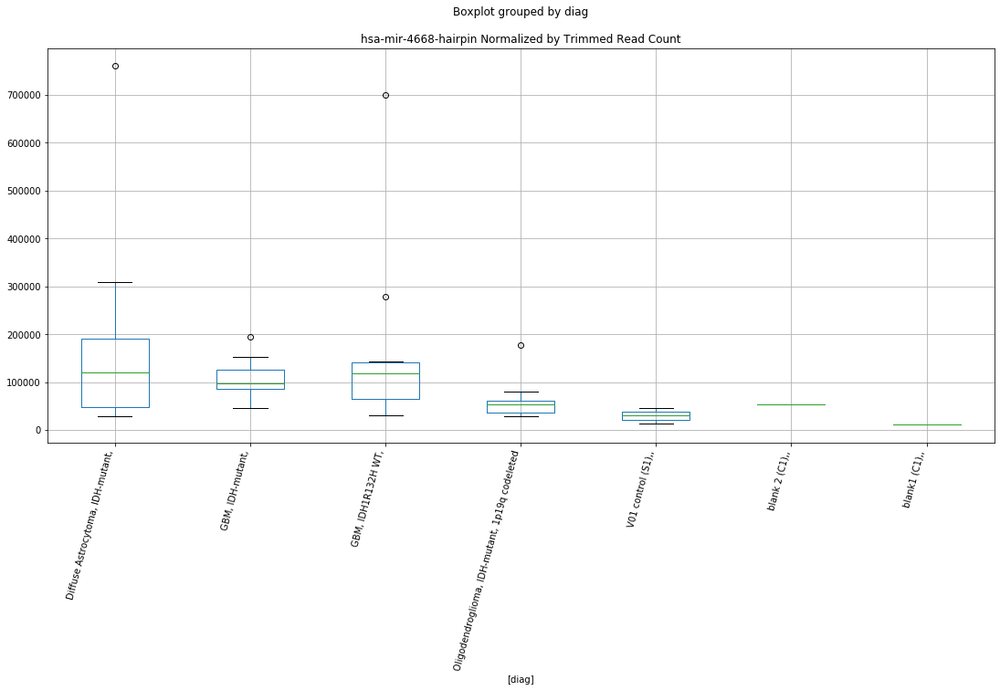

hsa-mir-4668-hairpin D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.3418732549657273
	p = 0.030887691760111833
hsa-mir-4668-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.3418732549657273
	p = 0.030887691760111833


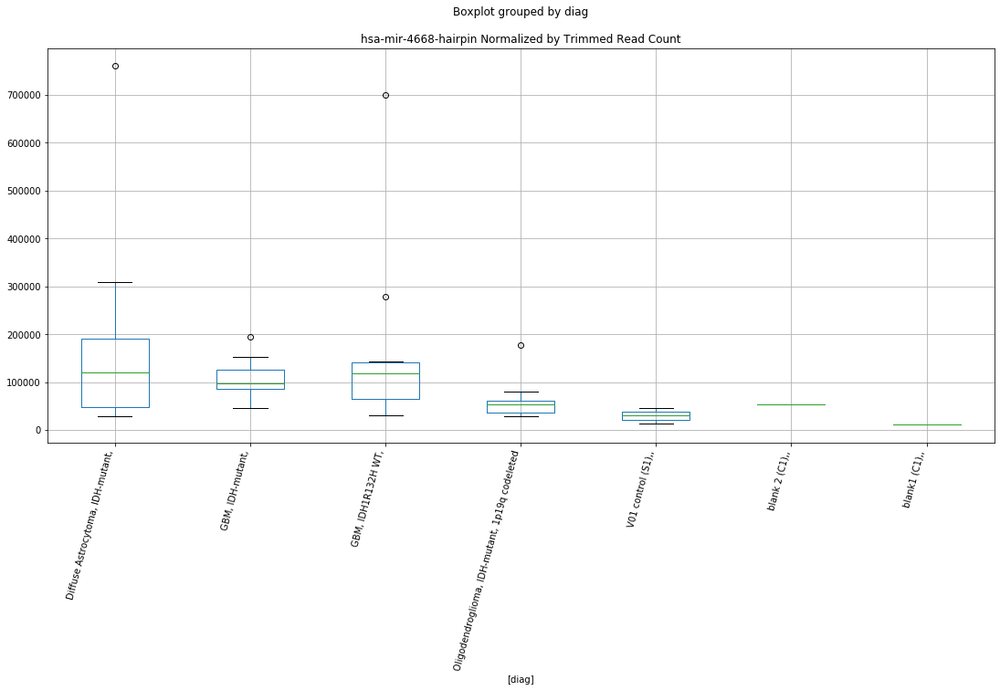

hsa-mir-4668-hairpin D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.3421615278318466
	p = 0.030869566447534986
hsa-mir-4668-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.3421615278318466
	p = 0.030869566447534986


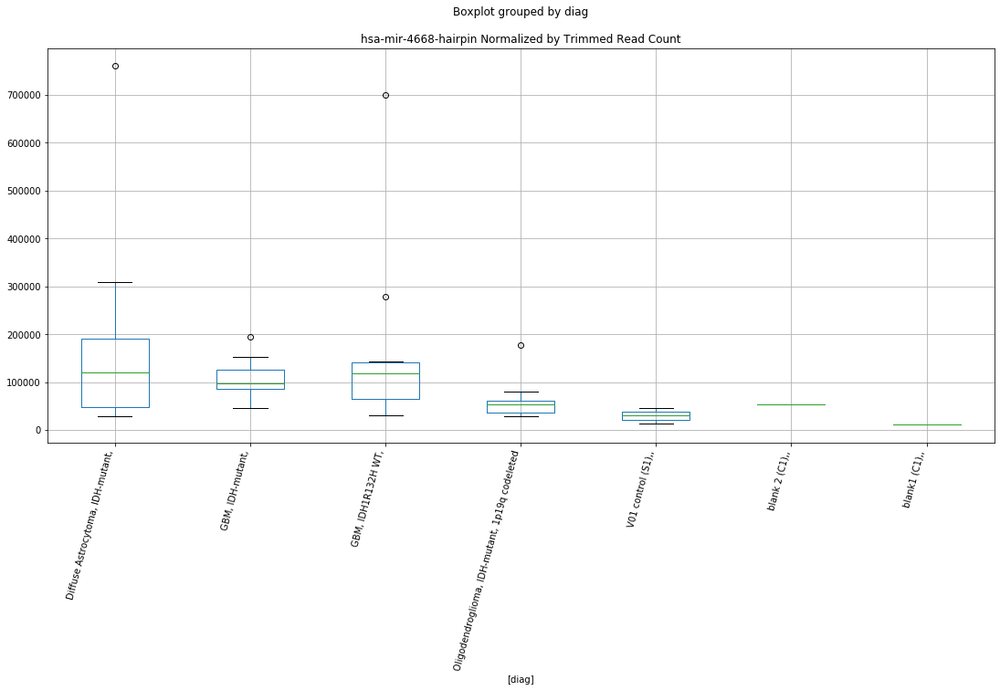

hsa-mir-4668-5p-mature D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.801664978711531
	p = 0.011794565238724474
hsa-mir-4668-5p-mature D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.801664978711531
	p = 0.011794565238724474


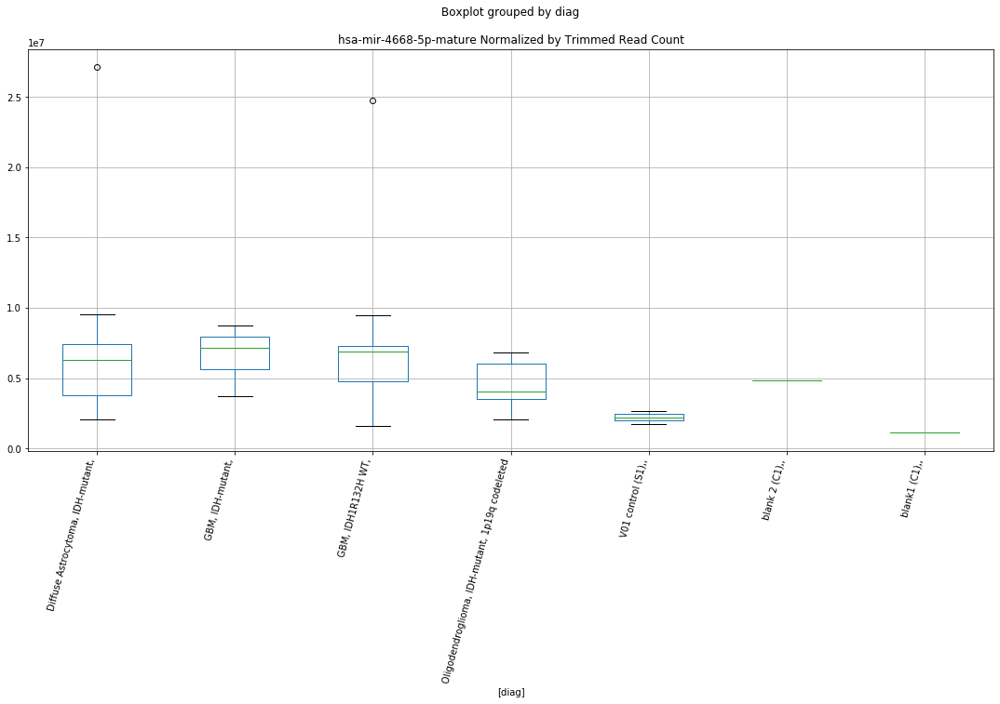

hsa-mir-4668-5p-mature D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.793590399642384
	p = 0.012000375302185957
hsa-mir-4668-5p-mature D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.793590399642384
	p = 0.012000375302185957


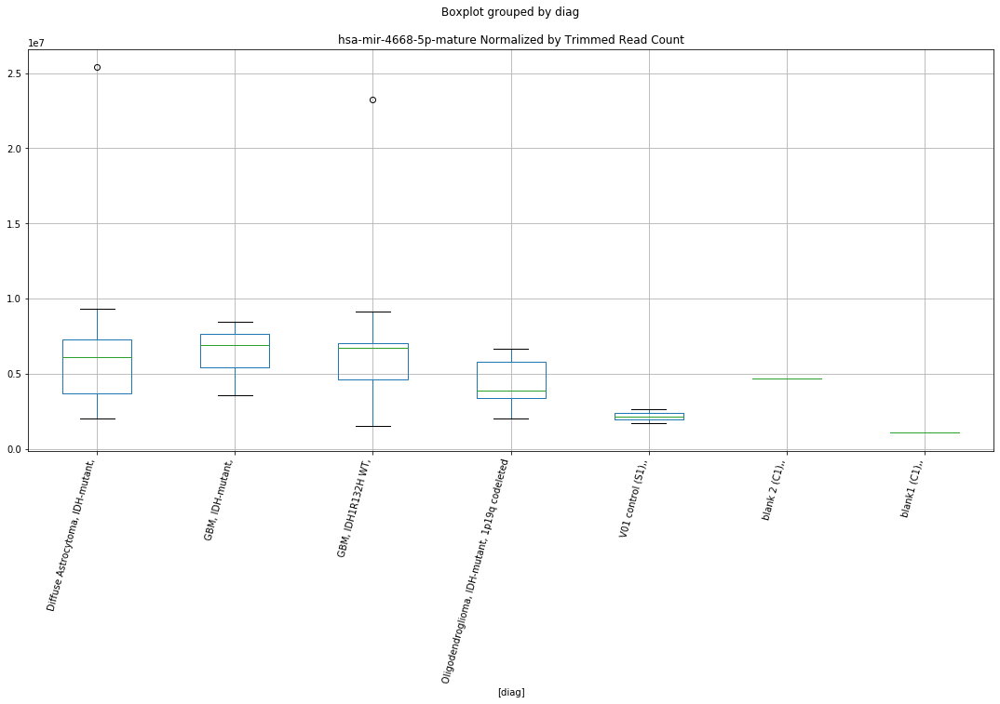

hsa-mir-4668-5p-mature D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.3508413003834336
	p = 0.0035583012825860833
hsa-mir-4668-5p-mature D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.3508413003834336
	p = 0.0035583012825860833


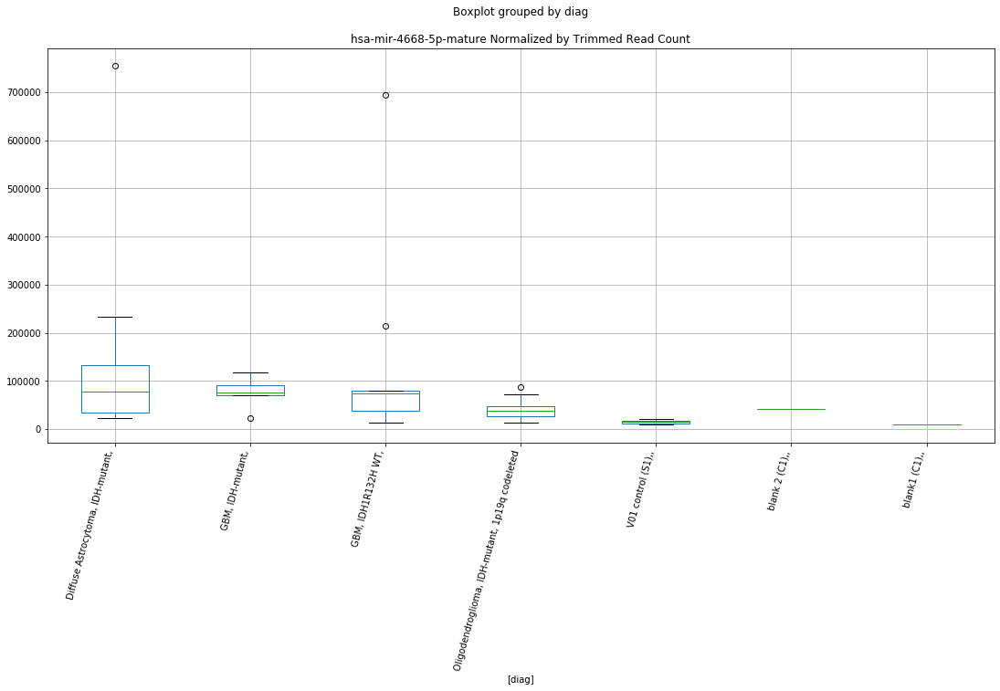

hsa-mir-4668-5p-mature D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.348735776056163
	p = 0.003574906545482937
hsa-mir-4668-5p-mature D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.348735776056163
	p = 0.003574906545482937


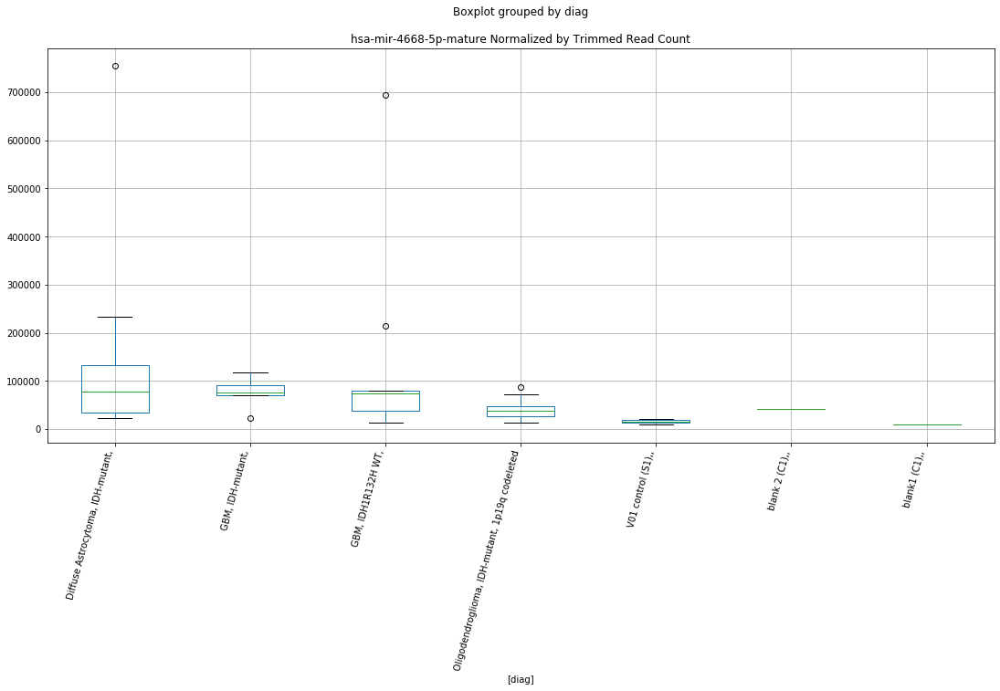

hsa-mir-4668-5p-mature D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.3473577246115354
	p = 0.0035858158790762974
hsa-mir-4668-5p-mature D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.3473577246115354
	p = 0.0035858158790762974


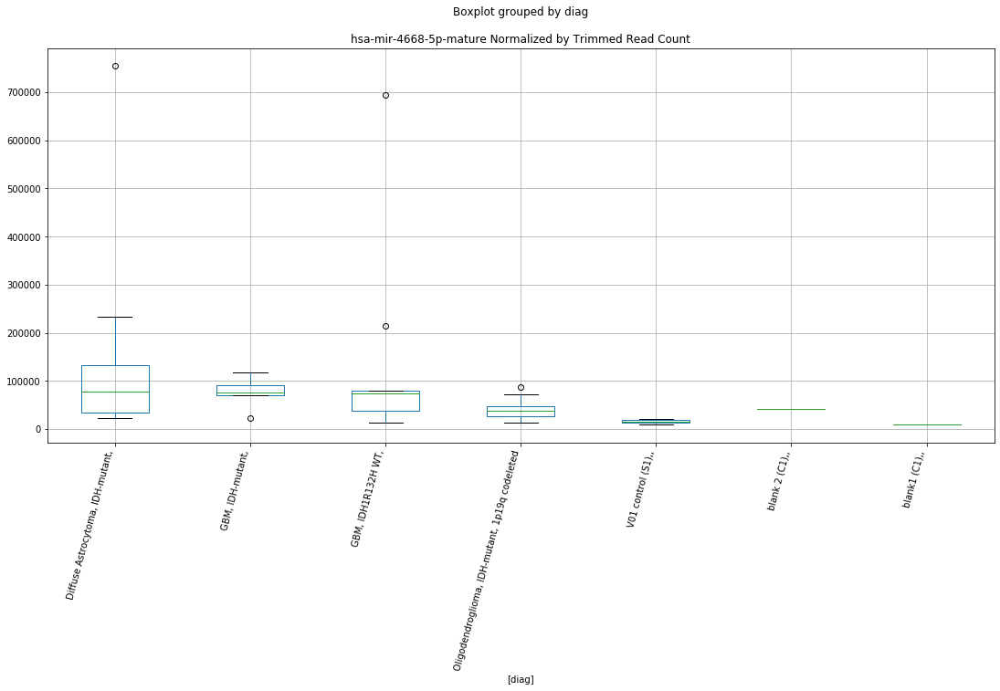

hsa-mir-484-hairpin D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.017992588003991
	p = 0.05874972943036878
hsa-mir-484-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.017992588003991
	p = 0.05874972943036878


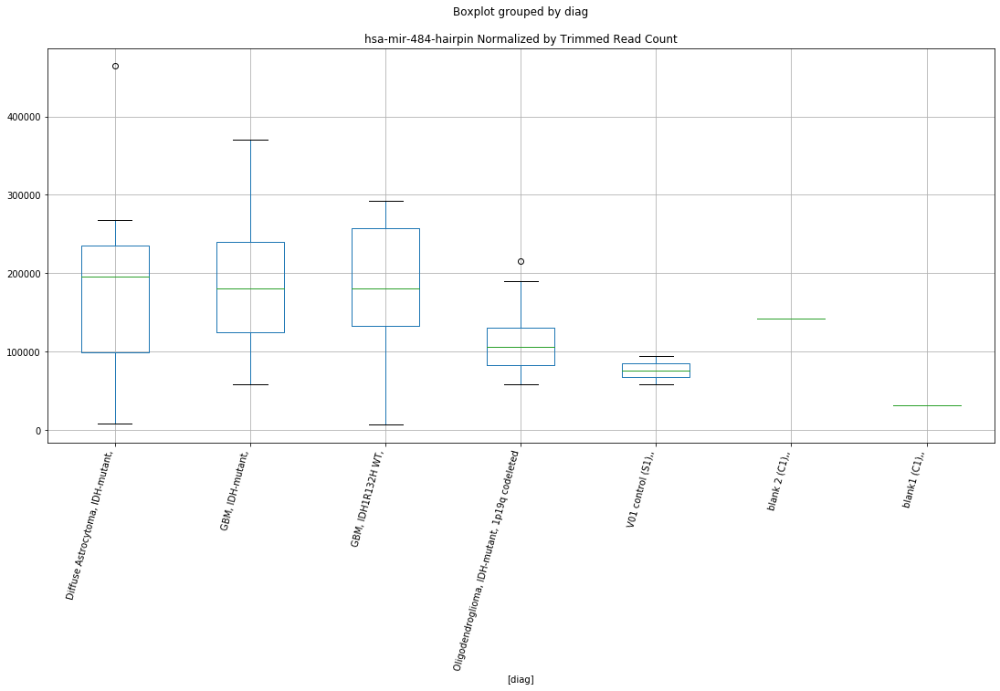

hsa-mir-484-hairpin D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.033721891149678
	p = 0.05699087769942302
hsa-mir-484-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.033721891149678
	p = 0.05699087769942302


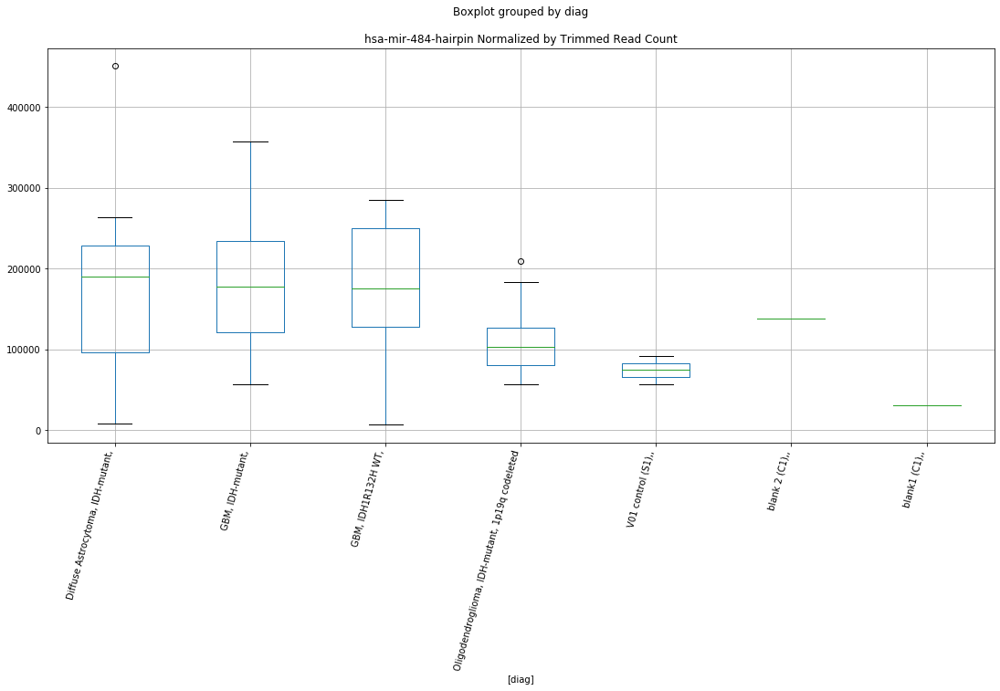

hsa-mir-484-hairpin D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0450140751162285
	p = 0.055757621525121856
hsa-mir-484-hairpin D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9910188115669878
	p = 0.061879959058147846
hsa-mir-484-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.0450140751162285
	p = 0.055757621525121856
hsa-mir-484-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.9910188115669878
	p = 0.061879959058147846


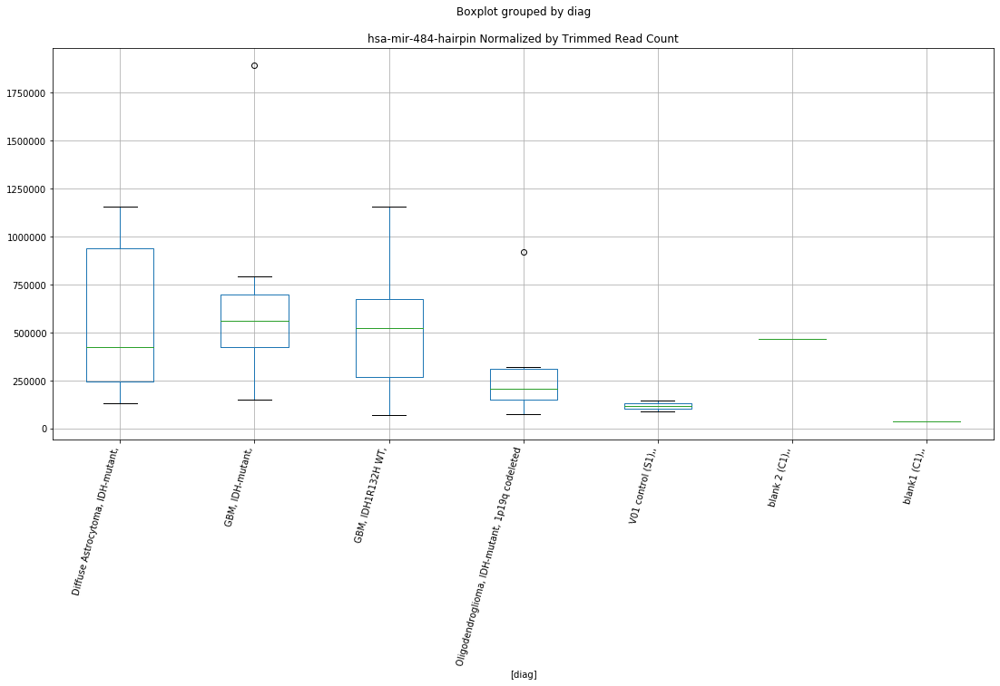

hsa-mir-484-hairpin D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0453383885598853
	p = 0.05572256089938436
hsa-mir-484-hairpin D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.991511386500976
	p = 0.061821480015555645
hsa-mir-484-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.0453383885598853
	p = 0.05572256089938436
hsa-mir-484-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.991511386500976
	p = 0.061821480015555645


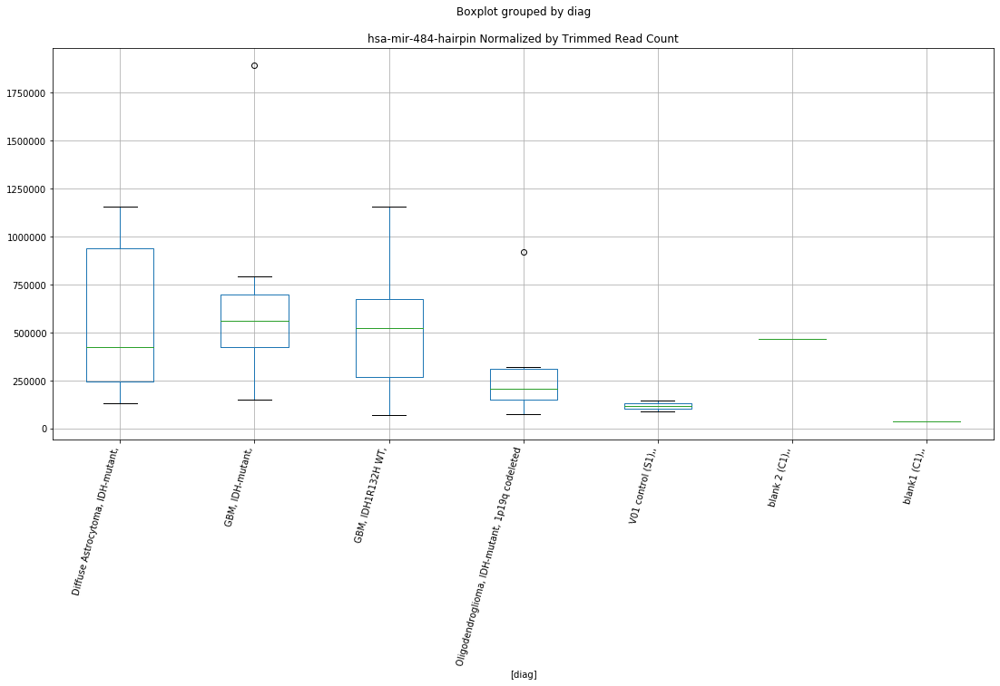

hsa-mir-484-hairpin D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.045647585041055
	p = 0.055689153069606305
hsa-mir-484-hairpin D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9914863237483302
	p = 0.061824454295444524
hsa-mir-484-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.045647585041055
	p = 0.055689153069606305
hsa-mir-484-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.9914863237483302
	p = 0.061824454295444524


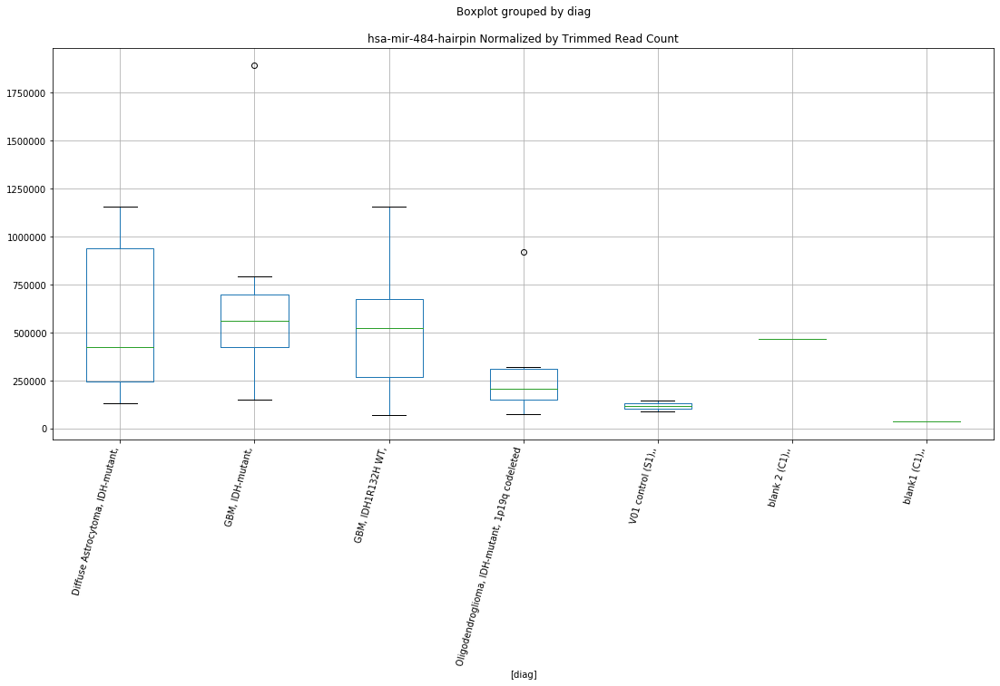

hsa-mir-3658-hairpin D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.579027928053025
	p = 0.01891429547316049
hsa-mir-3658-hairpin D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9386430759116569
	p = 0.06838821690184979
hsa-mir-3658-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.579027928053025
	p = 0.01891429547316049
hsa-mir-3658-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.9386430759116569
	p = 0.06838821690184979
hsa-mir-3658-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.8303939984414863
	p = 0.011089461843240446
hsa-mir-3658-hairpin D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.8303939984414863
	p = 0.011089461843240446


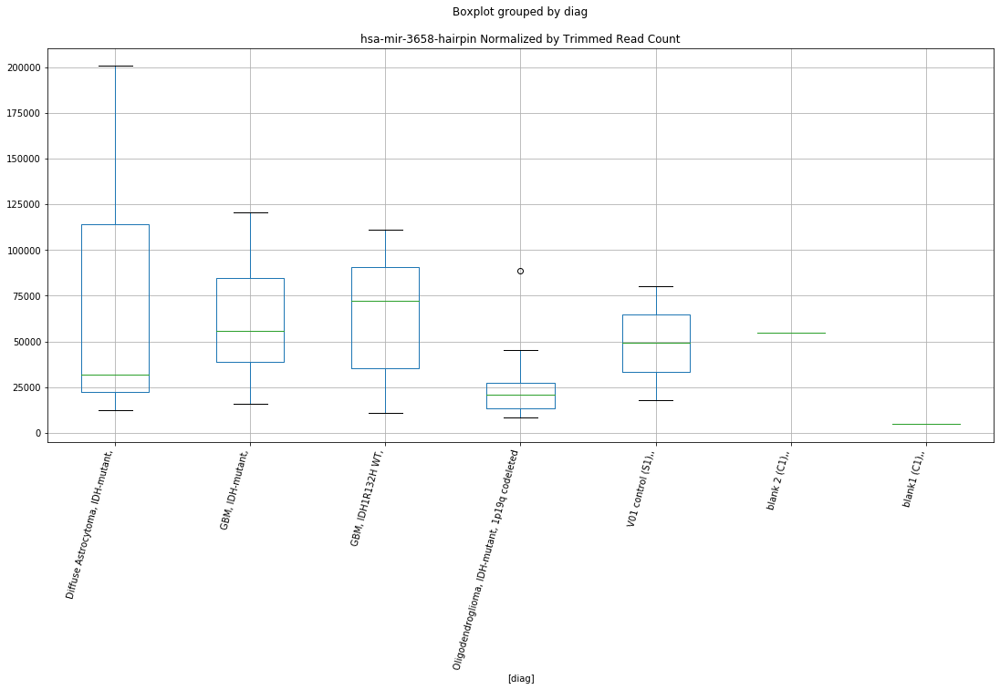

hsa-mir-3658-hairpin D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.572773280145882
	p = 0.019163991659440993
hsa-mir-3658-hairpin D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9385876833522135
	p = 0.06839541185123327
hsa-mir-3658-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.572773280145882
	p = 0.019163991659440993
hsa-mir-3658-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.9385876833522135
	p = 0.06839541185123327
hsa-mir-3658-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.823948816062024
	p = 0.011244029489220594
hsa-mir-3658-hairpin D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.823948816062024
	p = 0.011244029489220594


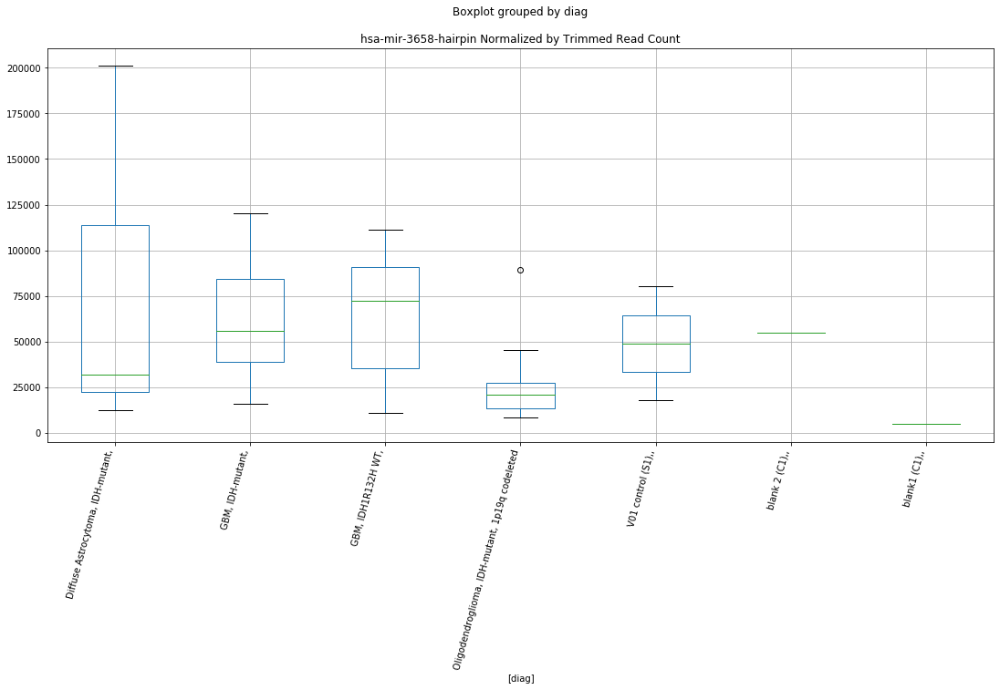

hsa-mir-3658-hairpin D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.579419150768384
	p = 0.01889878008323539
hsa-mir-3658-hairpin D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9419625913175687
	p = 0.06795827429404297
hsa-mir-3658-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.579419150768384
	p = 0.01889878008323539
hsa-mir-3658-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.9419625913175687
	p = 0.06795827429404297
hsa-mir-3658-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.8310461464363263
	p = 0.011073936512000797
hsa-mir-3658-hairpin D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.8310461464363263
	p = 0.011073936512000797


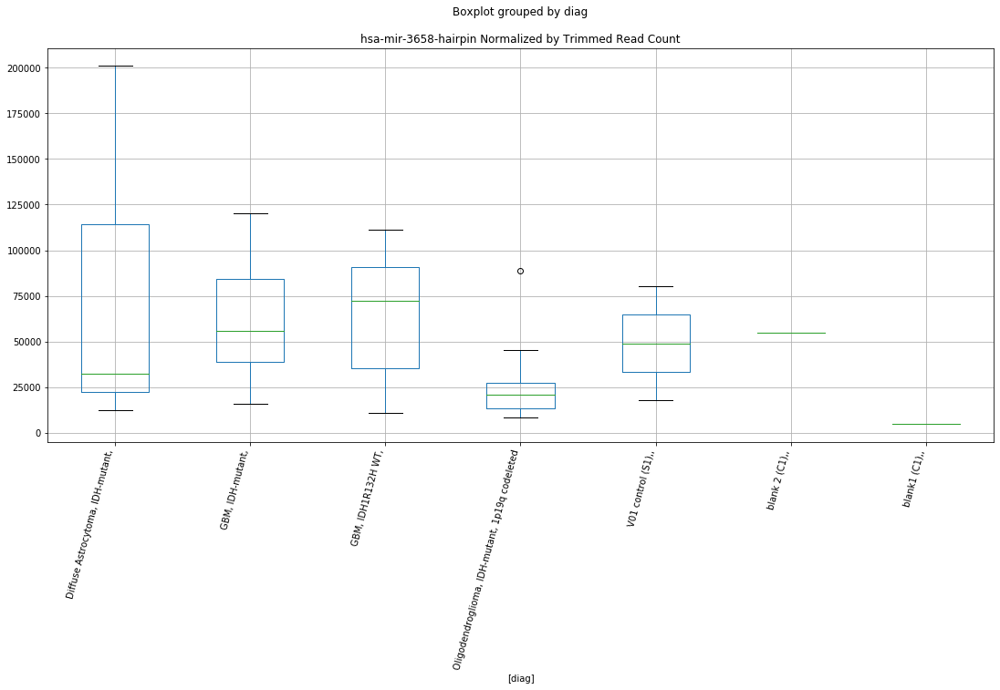

hsa-mir-567-hairpin D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0419543754115916
	p = 0.05608937909077346
hsa-mir-567-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.0419543754115916
	p = 0.05608937909077346


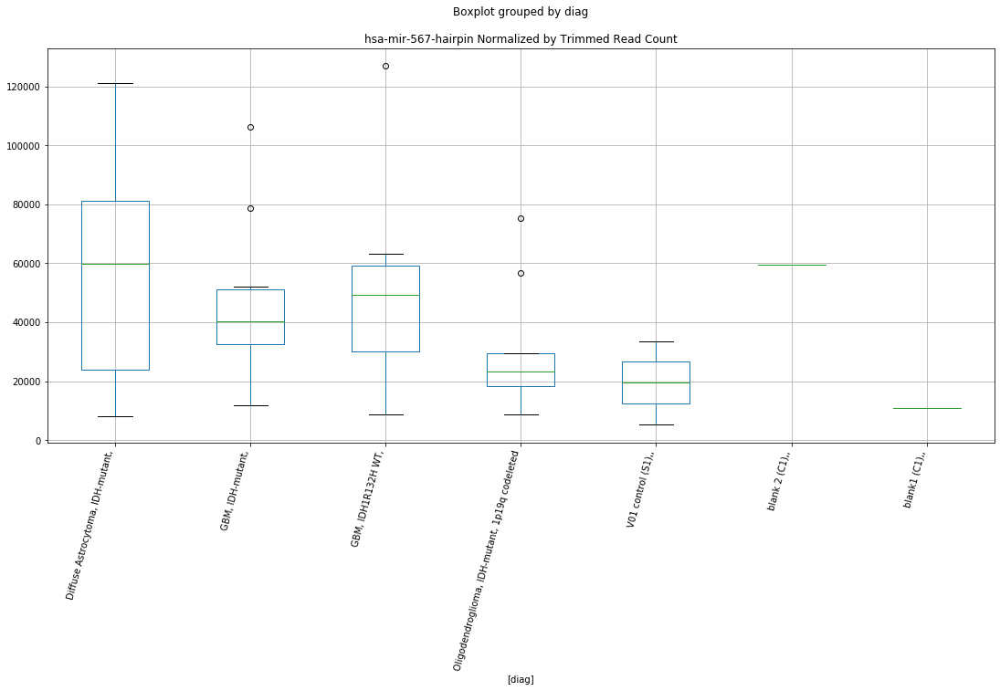

hsa-mir-567-hairpin D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.043023426154904
	p = 0.05597326185680311
hsa-mir-567-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.043023426154904
	p = 0.05597326185680311


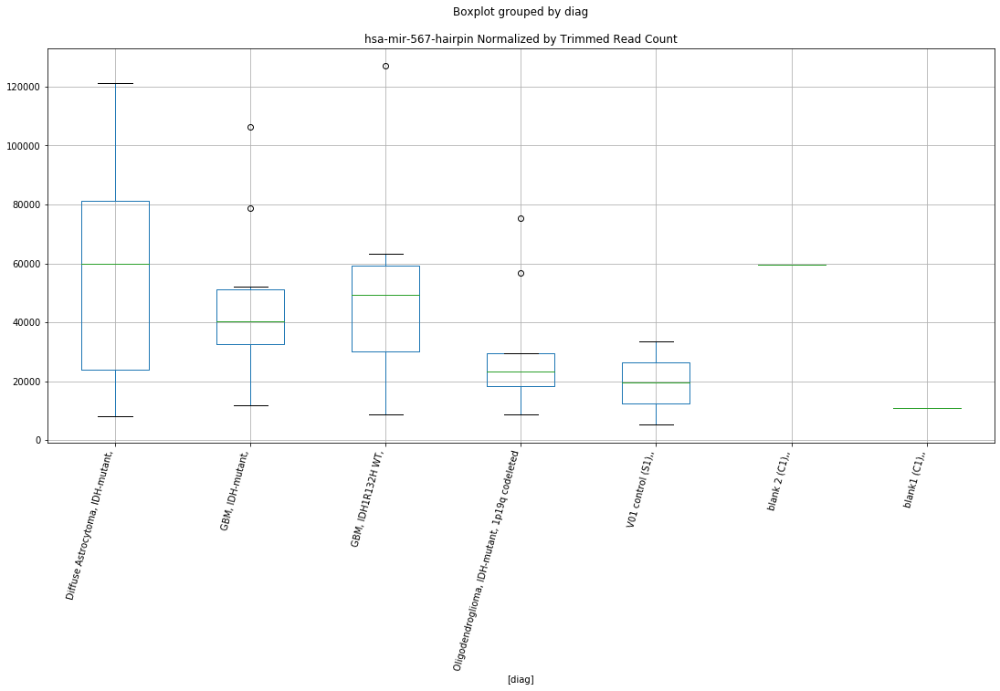

hsa-mir-567-hairpin D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.043025704859016
	p = 0.05597301458247591
hsa-mir-567-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.043025704859016
	p = 0.05597301458247591


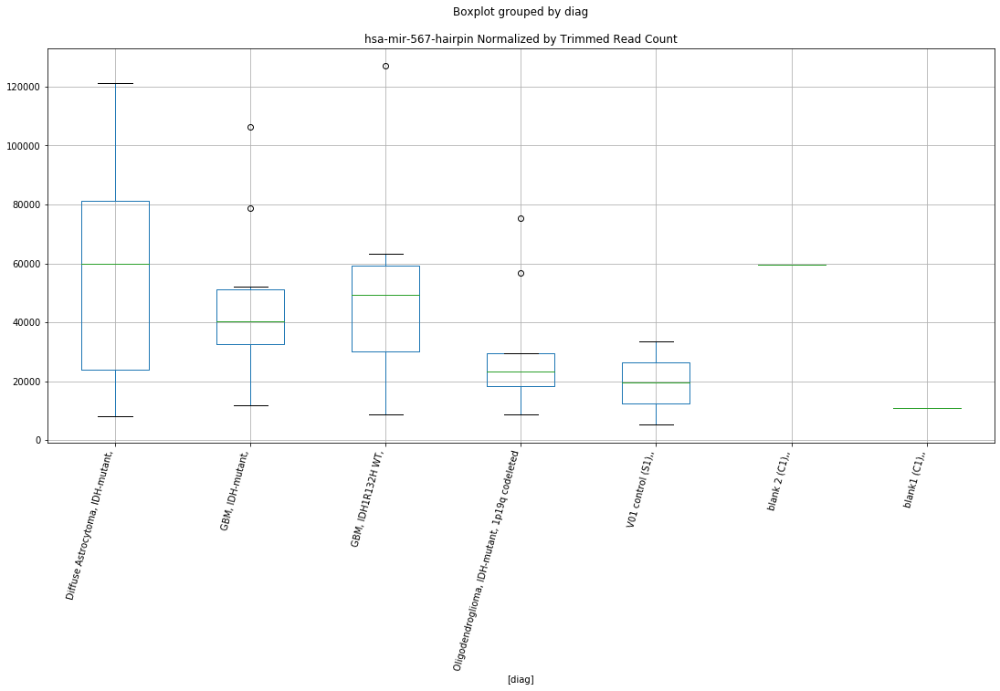

hsa-mir-184-hairpin D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8618017805747058
	p = 0.079040646642761
hsa-mir-184-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8618017805747058
	p = 0.079040646642761


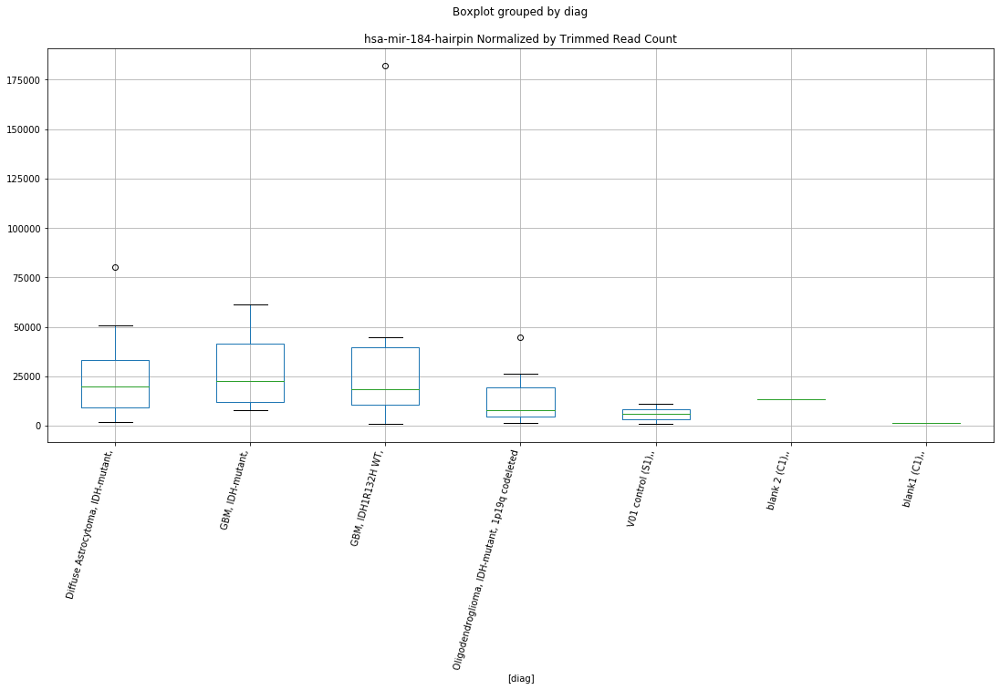

hsa-mir-184-hairpin D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8620893665689138
	p = 0.07899818757729878
hsa-mir-184-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8620893665689138
	p = 0.07899818757729878


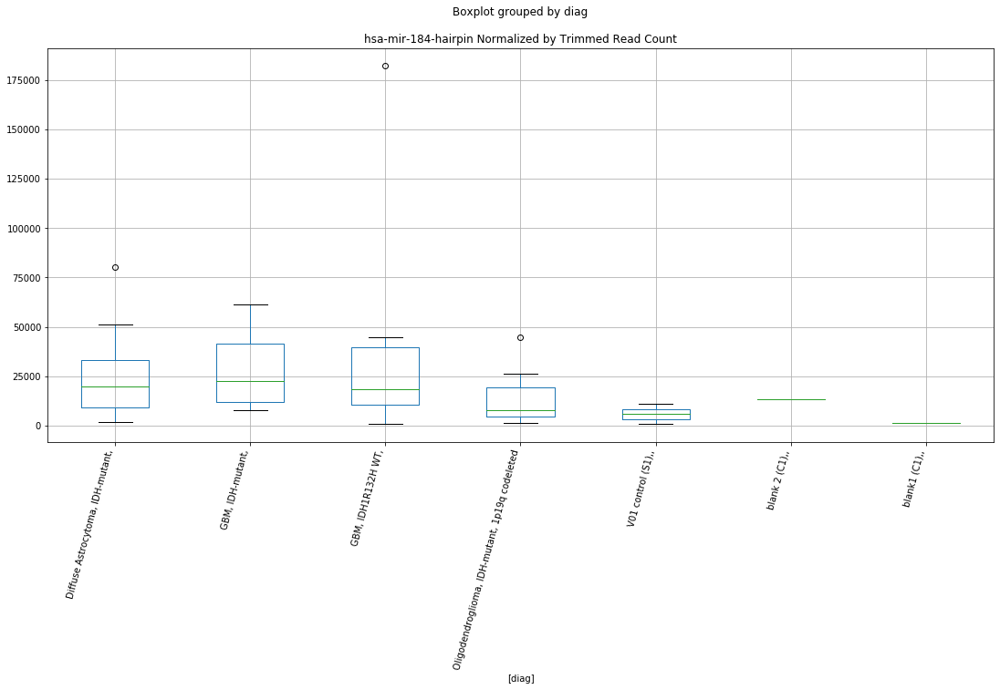

hsa-mir-184-hairpin D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8620831534023086
	p = 0.07899910467372781
hsa-mir-184-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8620831534023086
	p = 0.07899910467372781


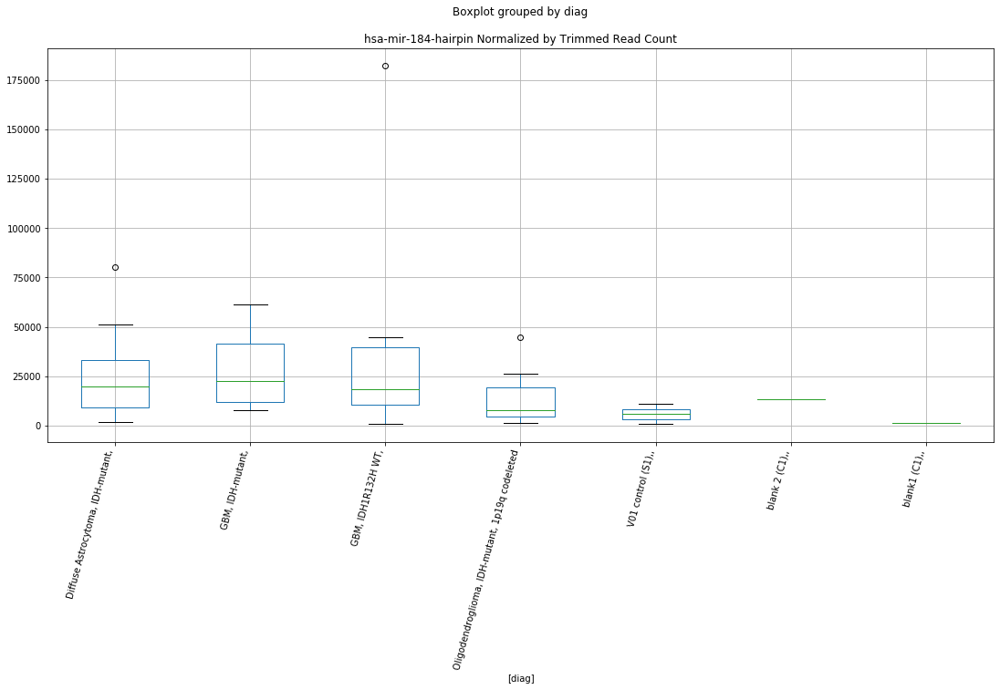

hsa-mir-8052-hairpin D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.1125857718652314
	p = 0.04886911341759986
hsa-mir-8052-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.1125857718652314
	p = 0.04886911341759986


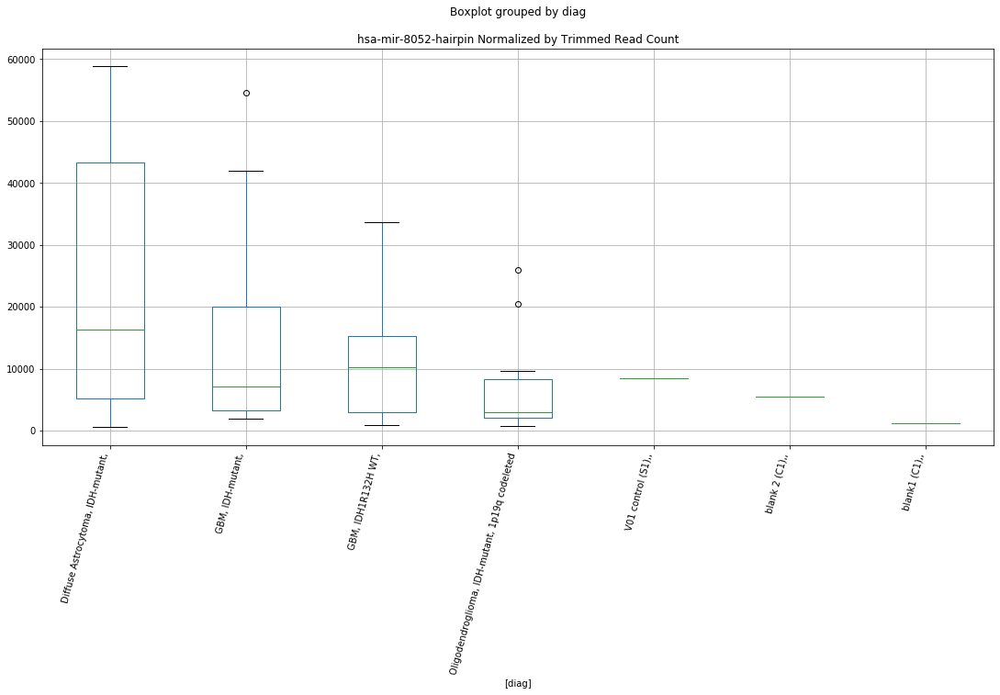

hsa-mir-8052-hairpin D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.112617019768805
	p = 0.048866115209812926
hsa-mir-8052-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.112617019768805
	p = 0.048866115209812926


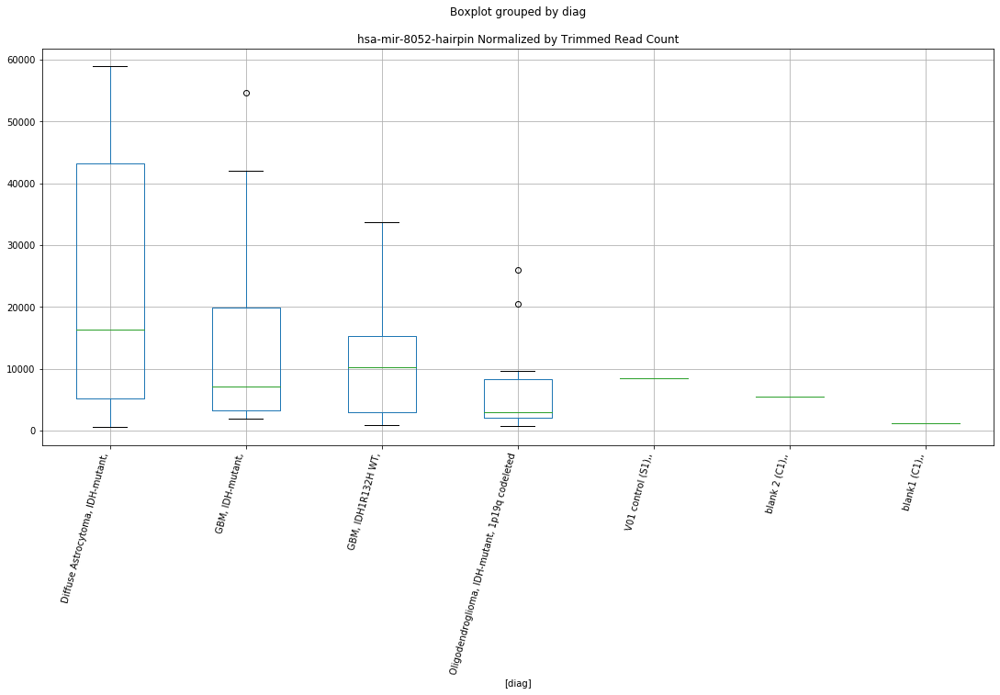

hsa-mir-8052-hairpin D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.112627126260637
	p = 0.04886514553698773
hsa-mir-8052-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.112627126260637
	p = 0.04886514553698773


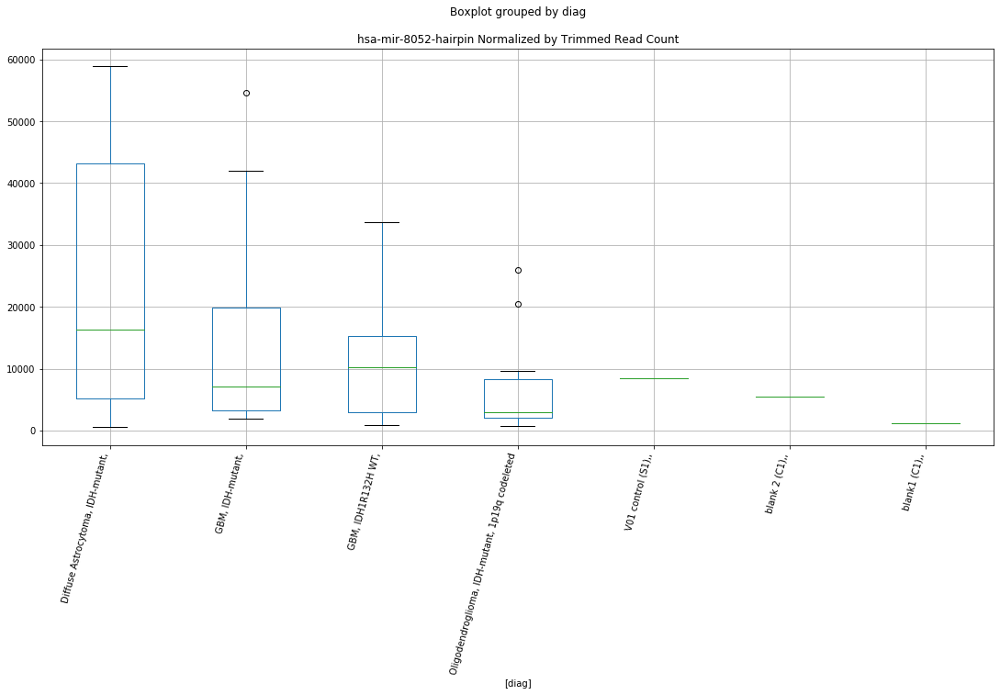

hsa-mir-3613-5p-mature D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.893820328056028
	p = 0.07443536122863544
hsa-mir-3613-5p-mature D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.893820328056028
	p = 0.07443536122863544


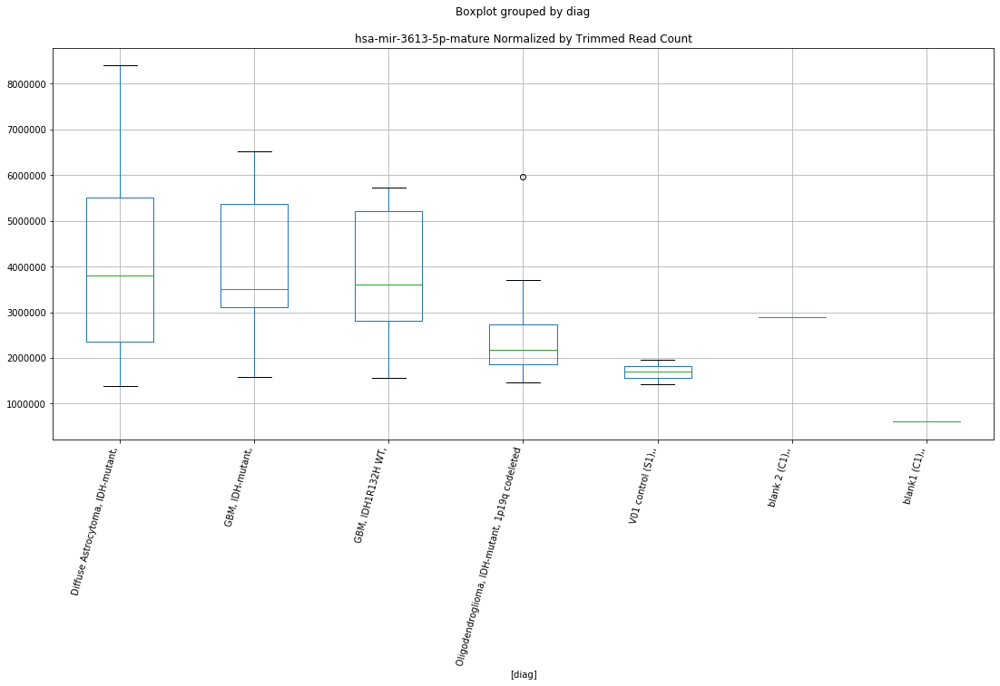

hsa-mir-3613-5p-mature D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9121946356932822
	p = 0.07190127597235905
hsa-mir-3613-5p-mature D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9121946356932822
	p = 0.07190127597235905


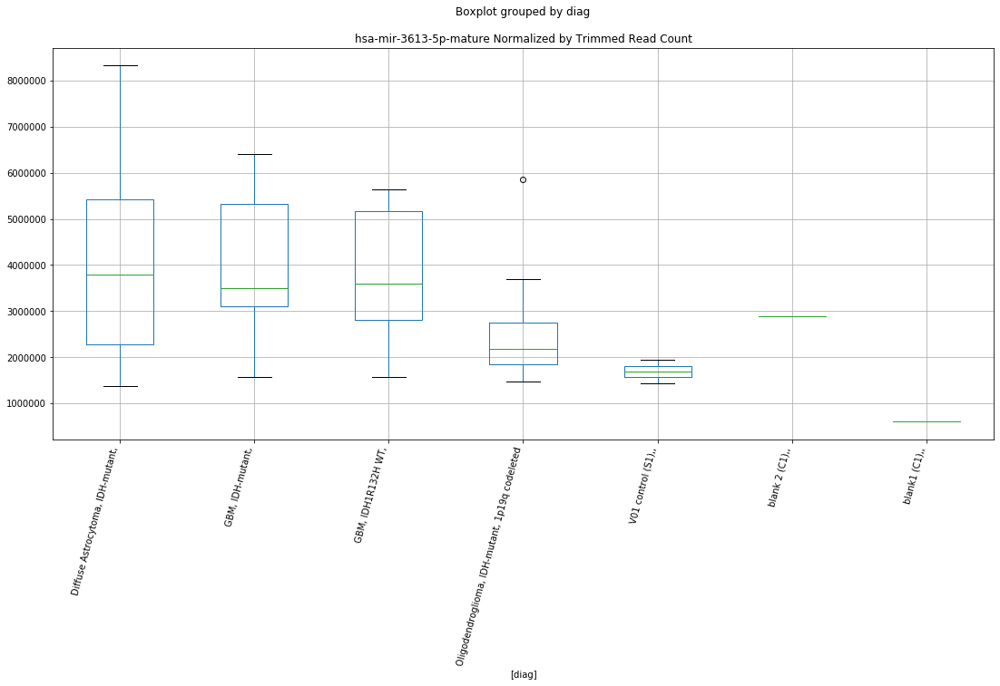

hsa-mir-509-1-hairpin D-plex bbduk2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.406745118834779
	p = 0.027049609120159707
hsa-mir-509-1-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.406745118834779
	p = 0.027049609120159707
hsa-mir-509-1-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.2066728136423737
	p = 0.04056528017495886
hsa-mir-509-1-hairpin D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2066728136423737
	p = 0.04056528017495886


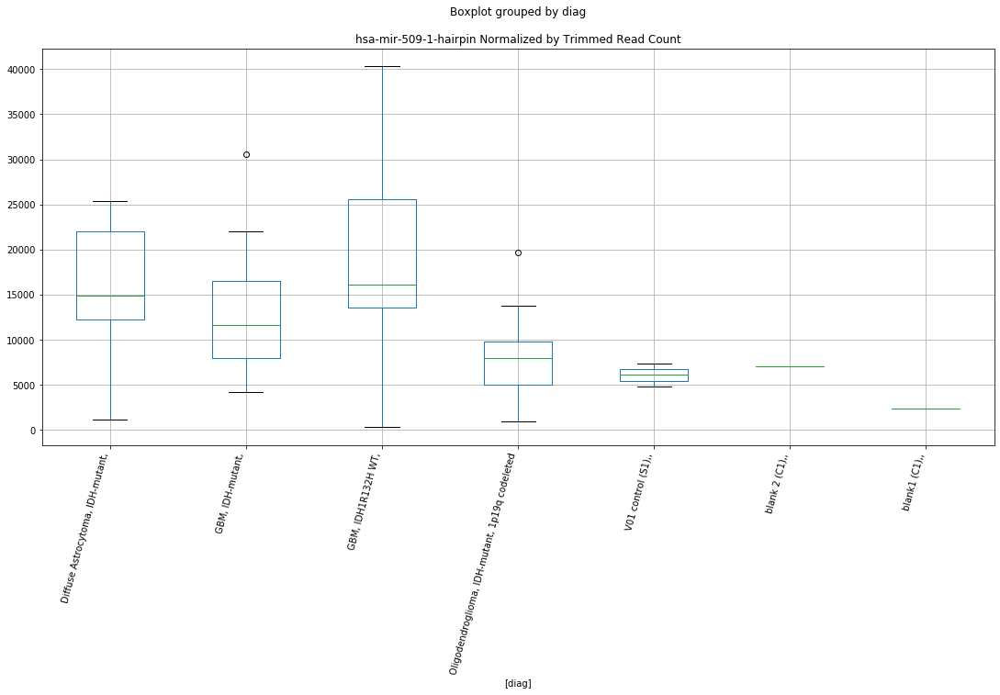

hsa-mir-509-1-hairpin D-plex bbduk3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.3901435944579523
	p = 0.0279869975956702
hsa-mir-509-1-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.3901435944579523
	p = 0.0279869975956702
hsa-mir-509-1-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.2204002250638375
	p = 0.03946827753853752
hsa-mir-509-1-hairpin D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2204002250638375
	p = 0.03946827753853752


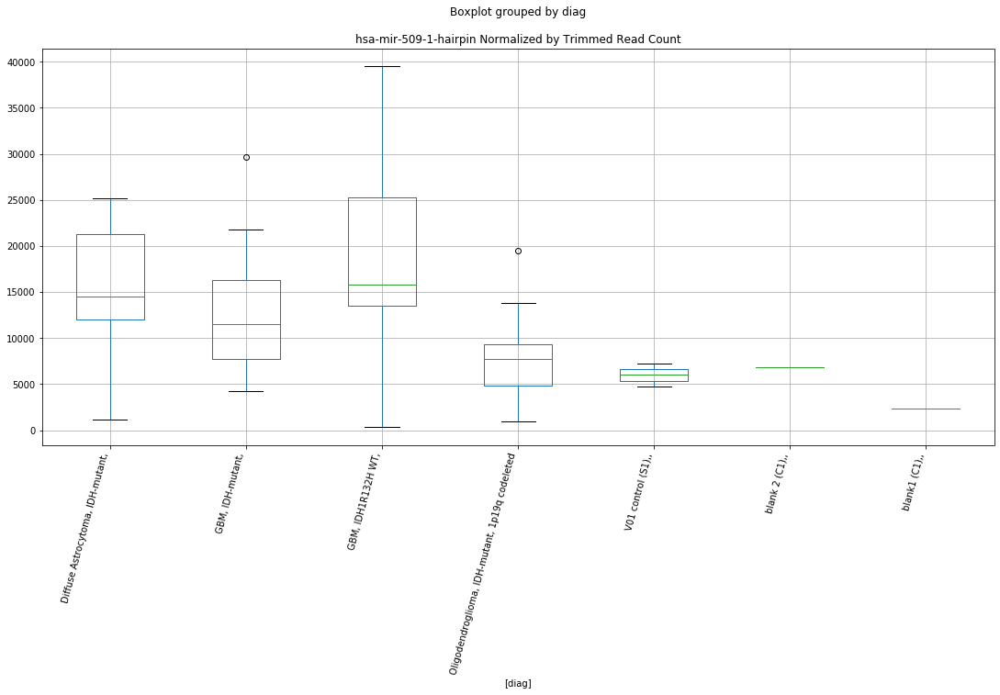

hsa-mir-509-2-hairpin D-plex bbduk2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.4117868983224366
	p = 0.026770795830736587
hsa-mir-509-2-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.4117868983224366
	p = 0.026770795830736587
hsa-mir-509-2-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.210106767539013
	p = 0.04028826306433307
hsa-mir-509-2-hairpin D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.210106767539013
	p = 0.04028826306433307


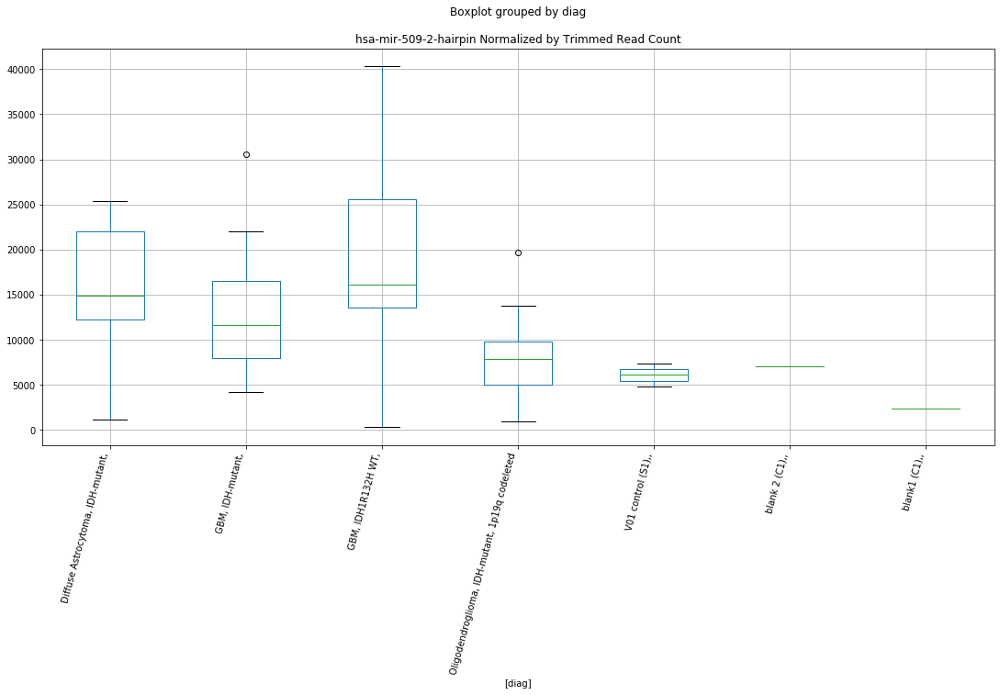

hsa-mir-509-2-hairpin D-plex bbduk3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.3952339677642747
	p = 0.027696395214637615
hsa-mir-509-2-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.3952339677642747
	p = 0.027696395214637615
hsa-mir-509-2-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.223895550747868
	p = 0.039193348105464515
hsa-mir-509-2-hairpin D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.223895550747868
	p = 0.039193348105464515


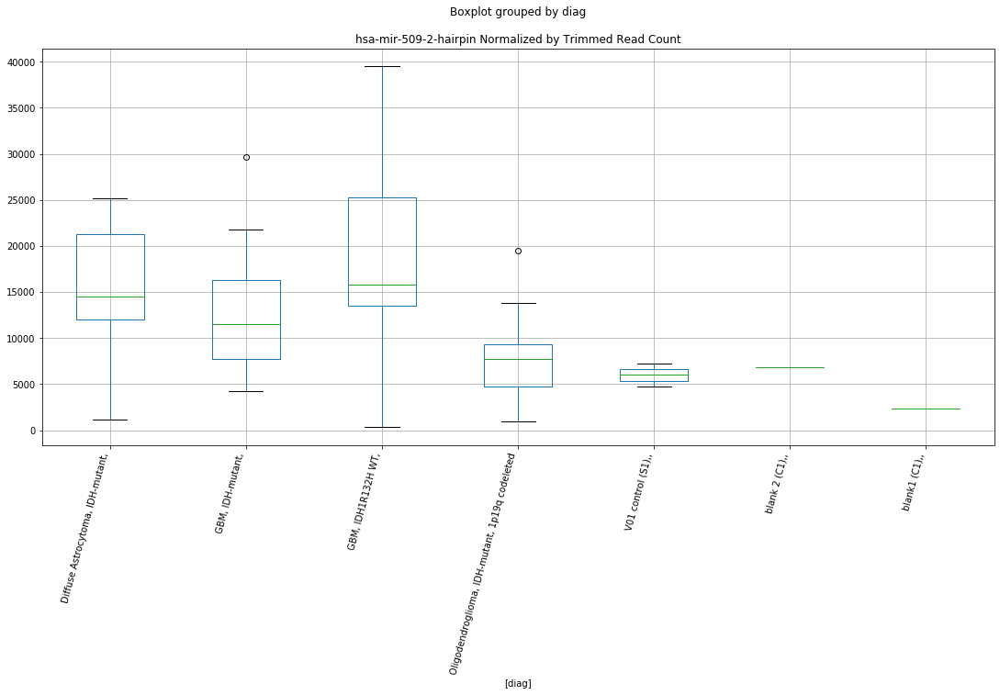

hsa-mir-509-3-hairpin D-plex bbduk2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.4171144101254347
	p = 0.0264791055858835
hsa-mir-509-3-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.4171144101254347
	p = 0.0264791055858835
hsa-mir-509-3-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.2456737513799605
	p = 0.03751970737529512
hsa-mir-509-3-hairpin D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2456737513799605
	p = 0.03751970737529512


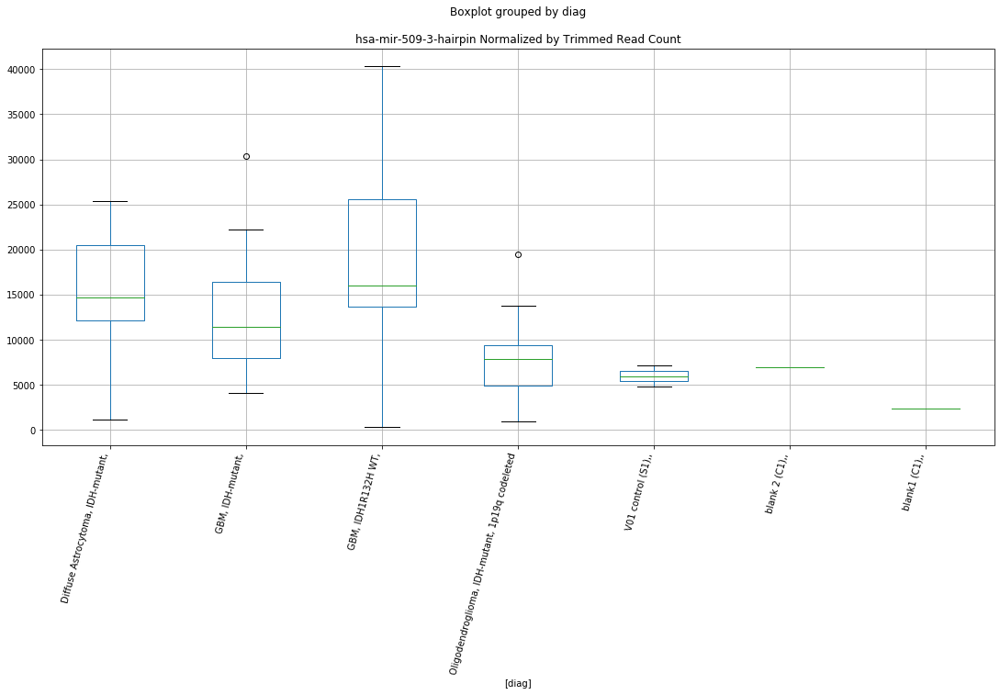

hsa-mir-509-3-hairpin D-plex bbduk3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.3840611965638274
	p = 0.028337968479828113
hsa-mir-509-3-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.3840611965638274
	p = 0.028337968479828113
hsa-mir-509-3-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.2465419974538503
	p = 0.037454369639659195
hsa-mir-509-3-hairpin D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2465419974538503
	p = 0.037454369639659195


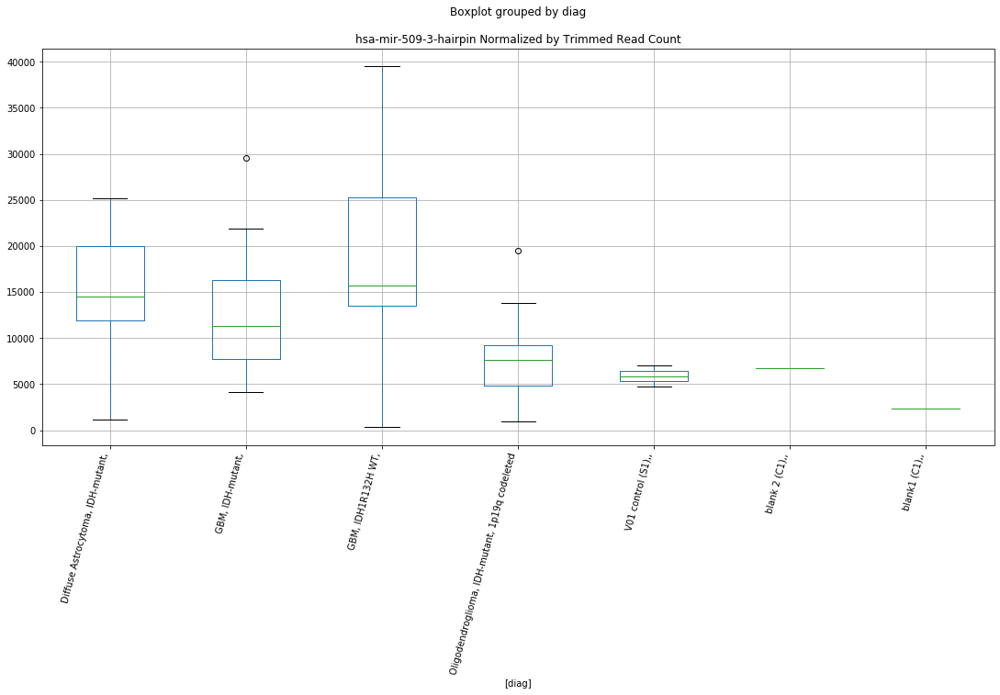

hsa-mir-6787-hairpin D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8726895145329239
	p = 0.0774471623044576
hsa-mir-6787-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8726895145329239
	p = 0.0774471623044576


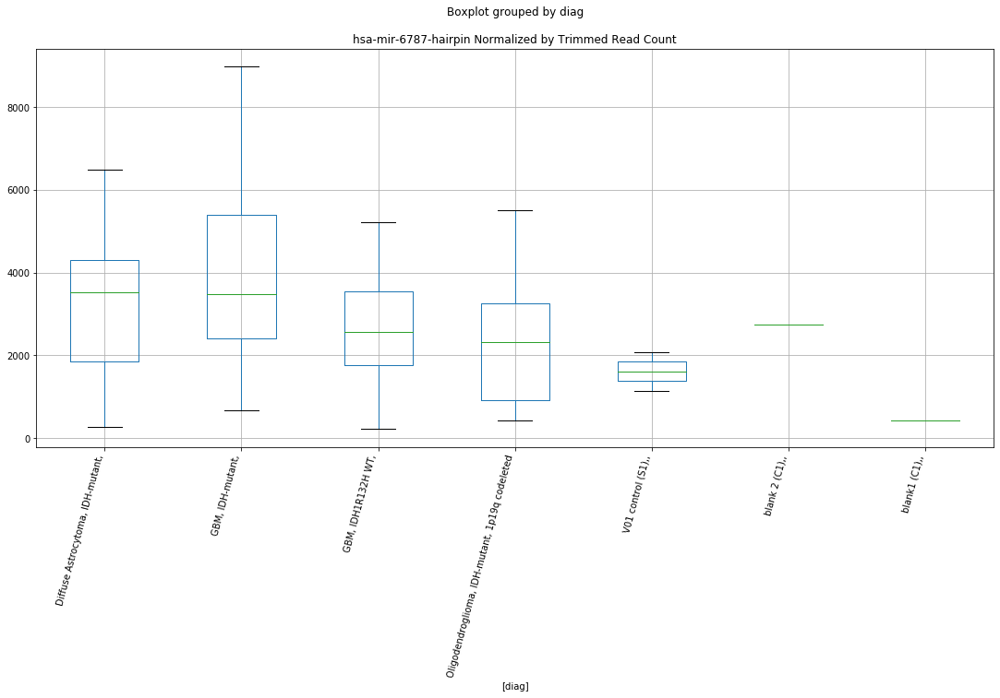

hsa-mir-6787-hairpin D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8759662641871087
	p = 0.07697317759141337
hsa-mir-6787-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8759662641871087
	p = 0.07697317759141337


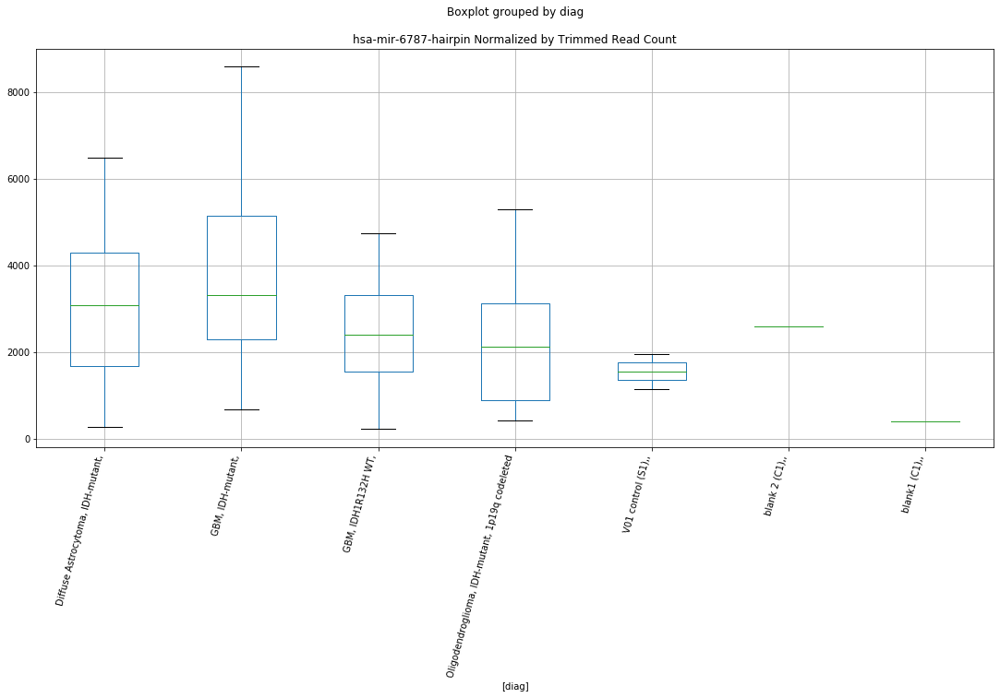

hsa-mir-6787-5p-mature D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9031352080114798
	p = 0.07314097286441805
hsa-mir-6787-5p-mature D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9031352080114798
	p = 0.07314097286441805


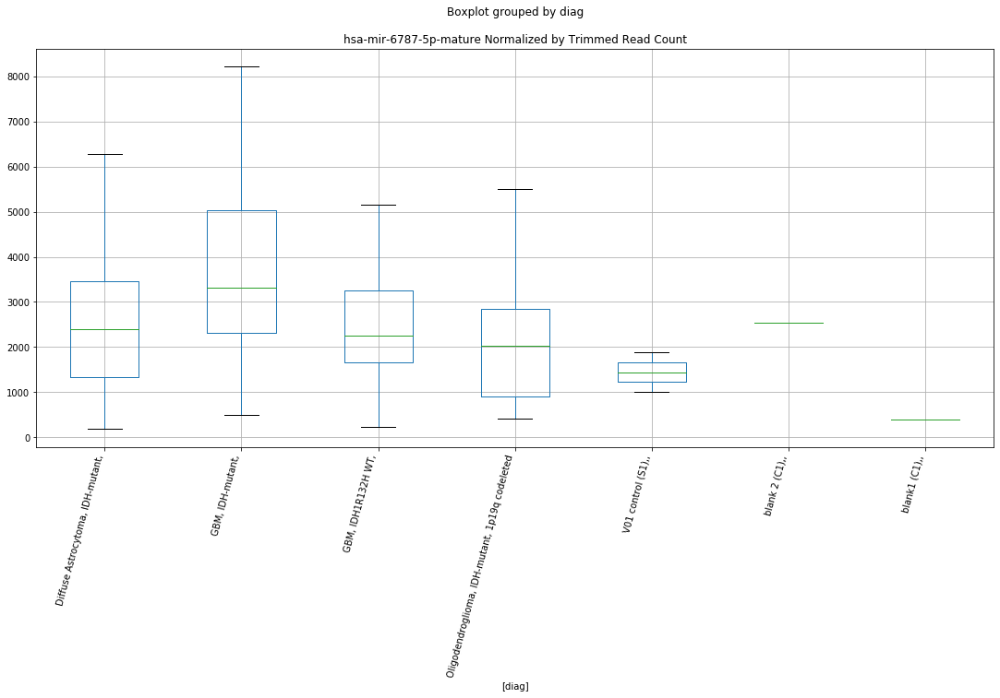

hsa-mir-6787-5p-mature D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8682469930265184
	p = 0.07809389348597674
hsa-mir-6787-5p-mature D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8682469930265184
	p = 0.07809389348597674


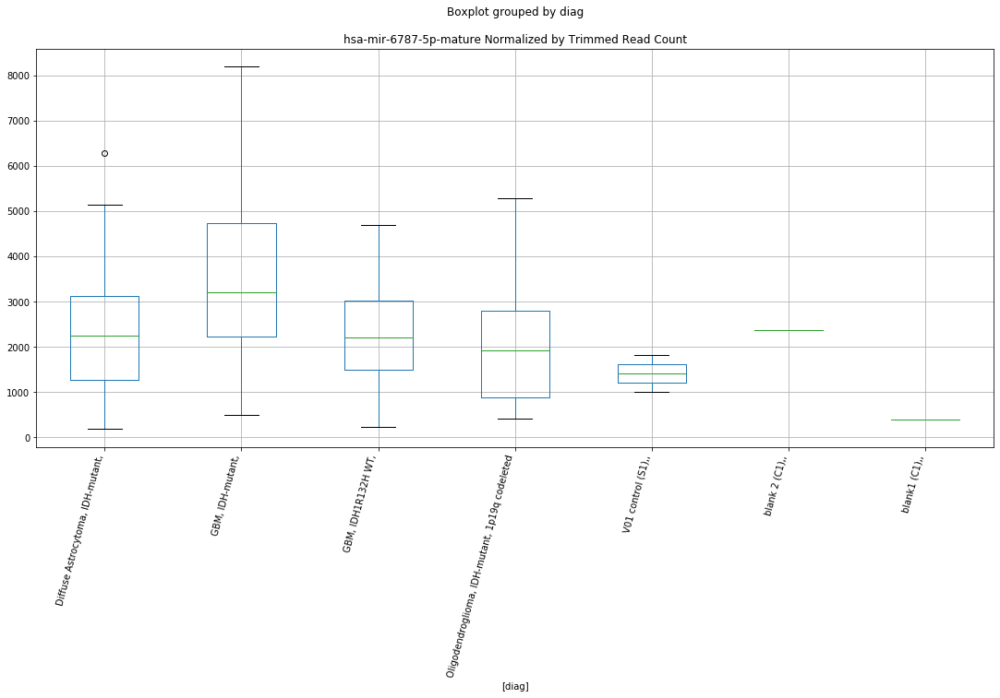

hsa-mir-6887-hairpin D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.4458444961557766
	p = 0.024956737188456767
hsa-mir-6887-hairpin D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.4458444961557766
	p = 0.024956737188456767


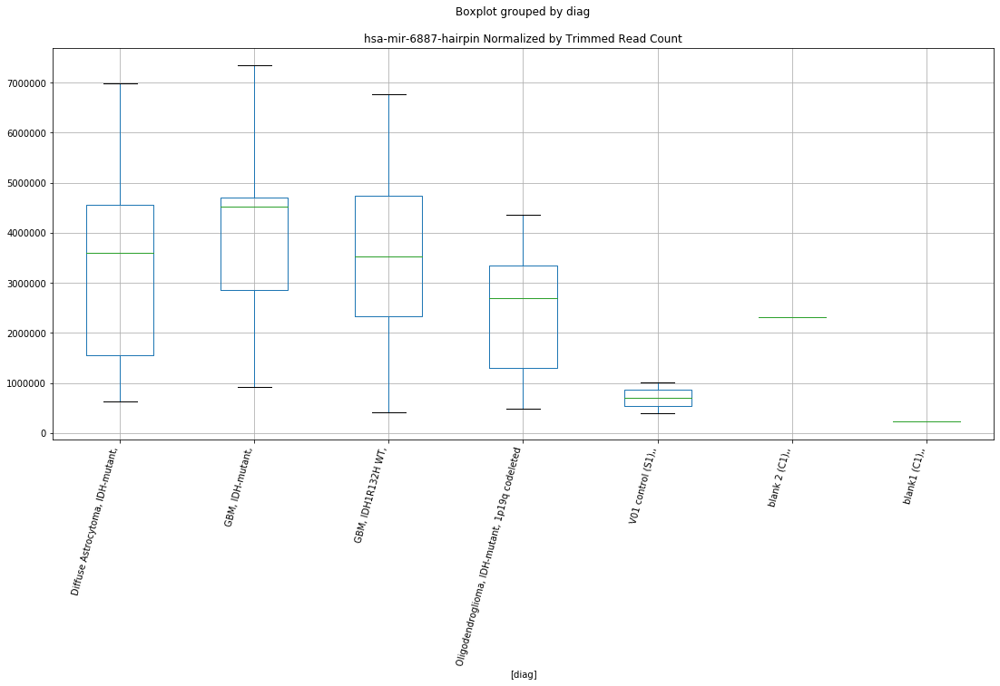

hsa-mir-6887-hairpin D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2110427458737822
	p = 0.04021305984625427
hsa-mir-6887-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.2110427458737822
	p = 0.04021305984625427


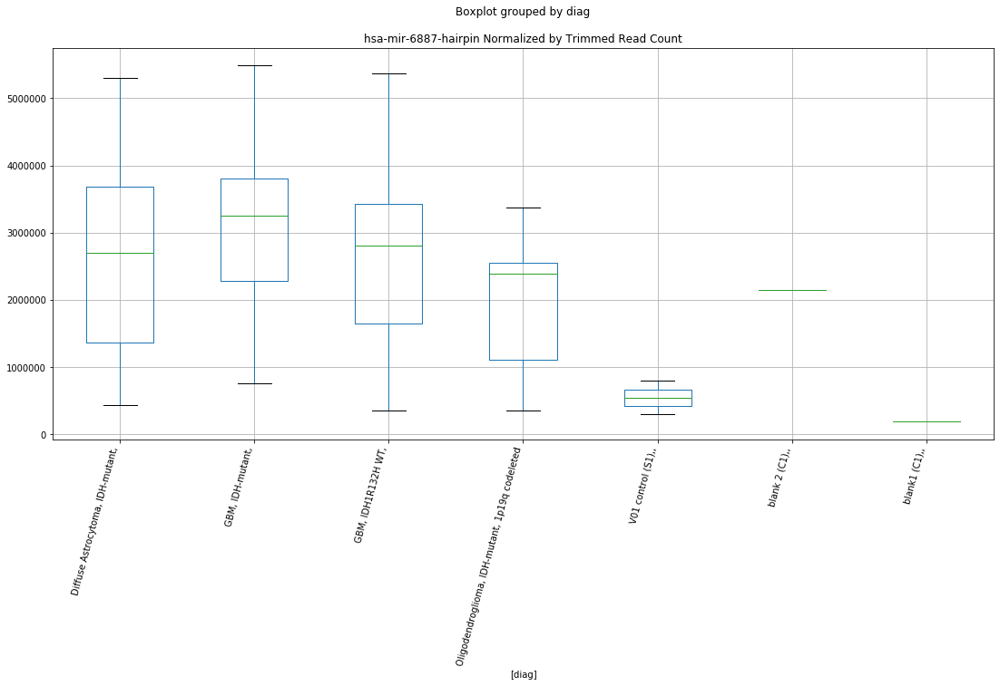

hsa-mir-6887-hairpin D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2107445083037156
	p = 0.040237008372250783
hsa-mir-6887-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.2107445083037156
	p = 0.040237008372250783


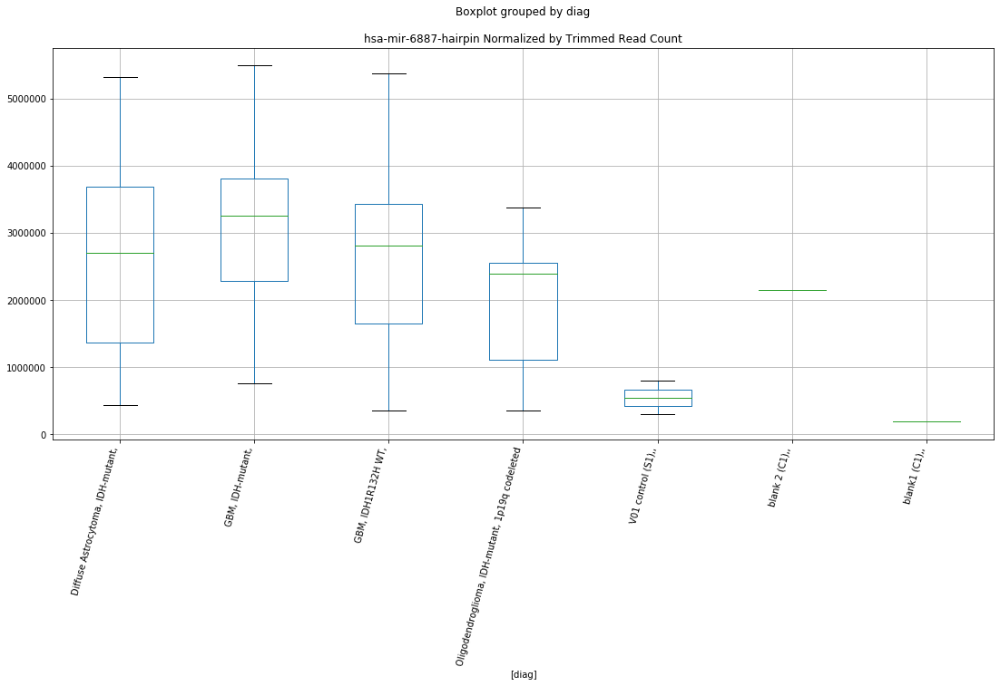

hsa-mir-6887-hairpin D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2107131162075486
	p = 0.04023952992532586
hsa-mir-6887-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.2107131162075486
	p = 0.04023952992532586


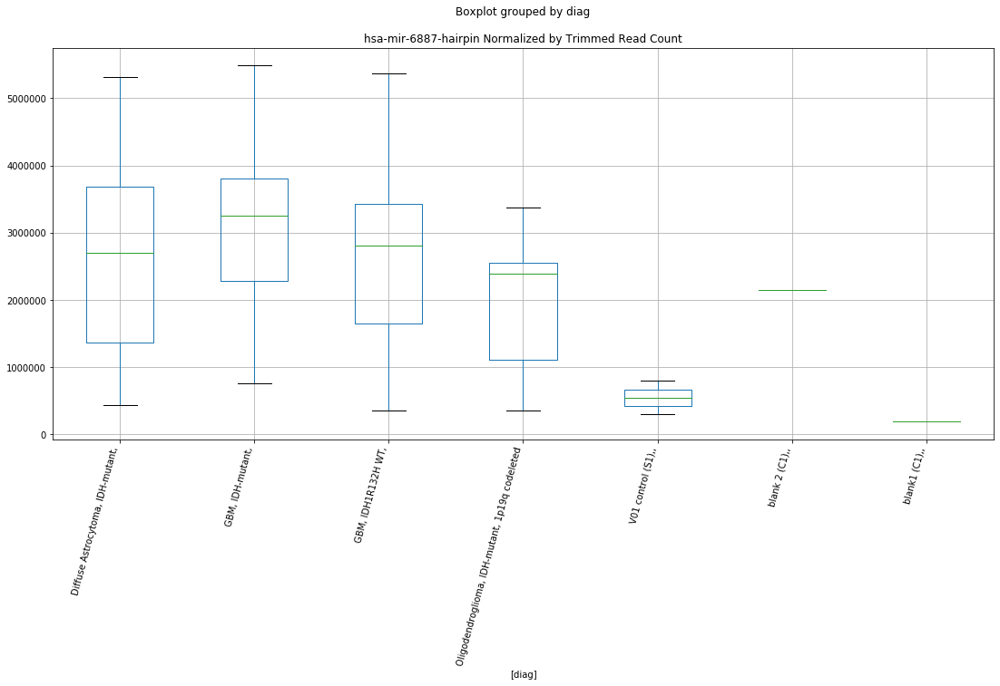

hsa-mir-6887-5p-mature D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.4276288525522953
	p = 0.025912134802999455
hsa-mir-6887-5p-mature D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.4276288525522953
	p = 0.025912134802999455


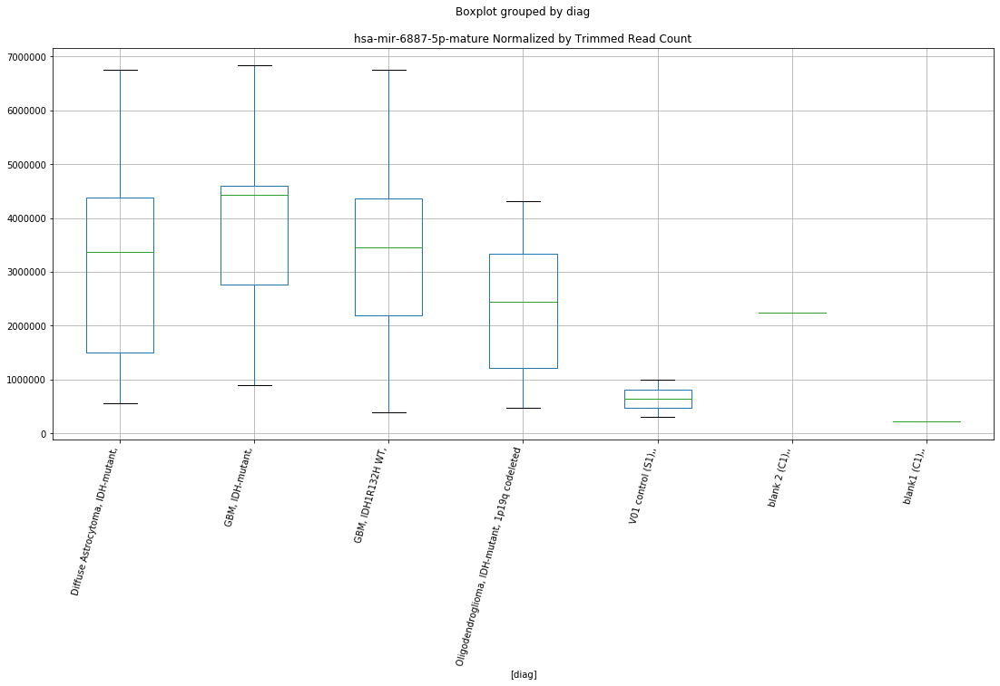

hsa-mir-6887-5p-mature D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.1801817666315544
	p = 0.0427618352495755
hsa-mir-6887-5p-mature D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.1801817666315544
	p = 0.0427618352495755


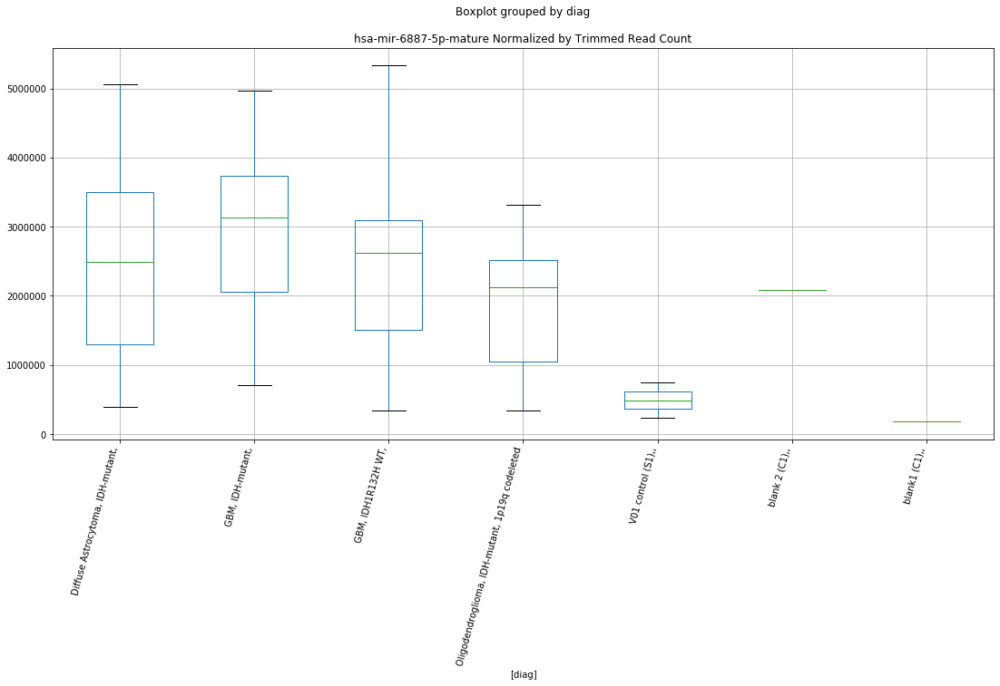

hsa-mir-6887-5p-mature D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.1798455814879203
	p = 0.04279039860740317
hsa-mir-6887-5p-mature D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.1798455814879203
	p = 0.04279039860740317


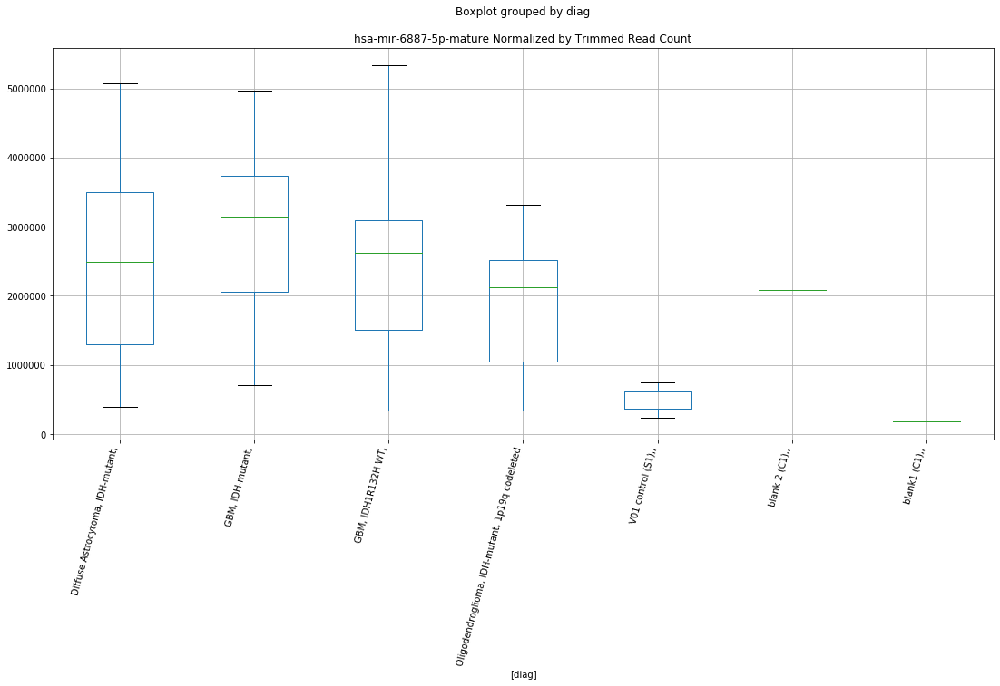

hsa-mir-6887-5p-mature D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.1797995904853944
	p = 0.04279430750855687
hsa-mir-6887-5p-mature D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.1797995904853944
	p = 0.04279430750855687


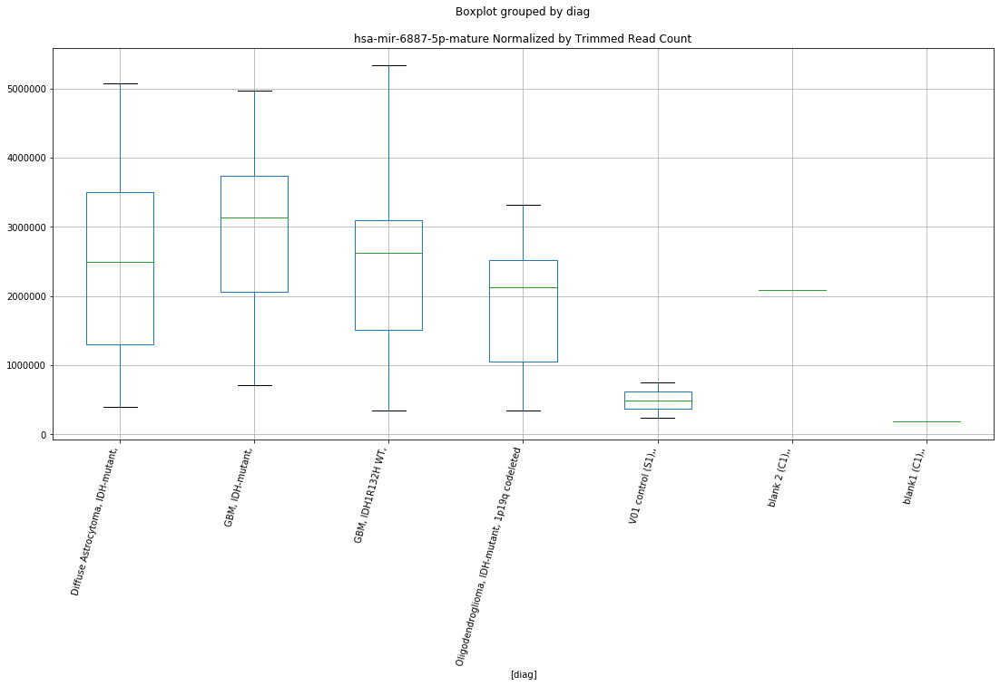

hsa-mir-3613-3p-mature D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.481080915850348
	p = 0.023201738347560057
hsa-mir-3613-3p-mature D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.481080915850348
	p = 0.023201738347560057


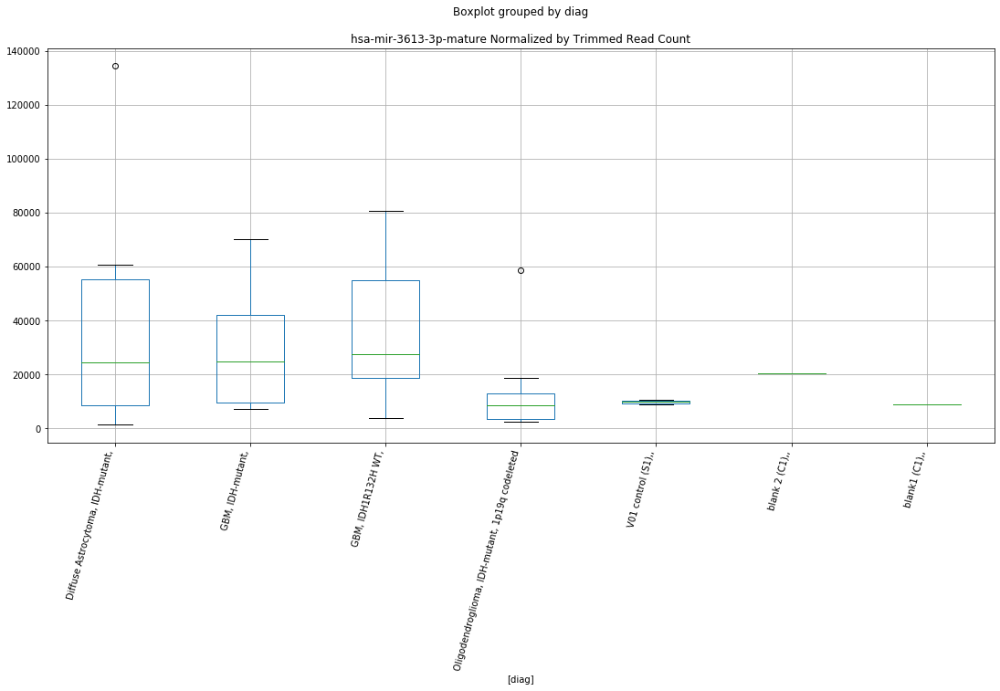

hsa-mir-3613-3p-mature D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.481340638941097
	p = 0.02318924429149593
hsa-mir-3613-3p-mature D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.481340638941097
	p = 0.02318924429149593


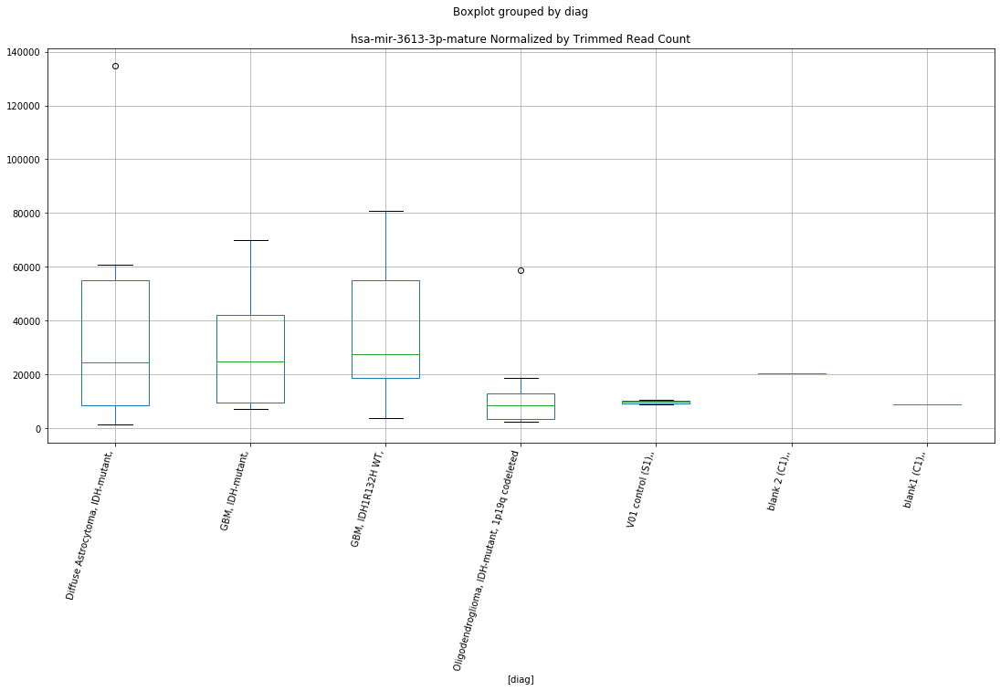

hsa-mir-3613-3p-mature D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.4813931090470955
	p = 0.023186720970376416
hsa-mir-3613-3p-mature D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.4813931090470955
	p = 0.023186720970376416


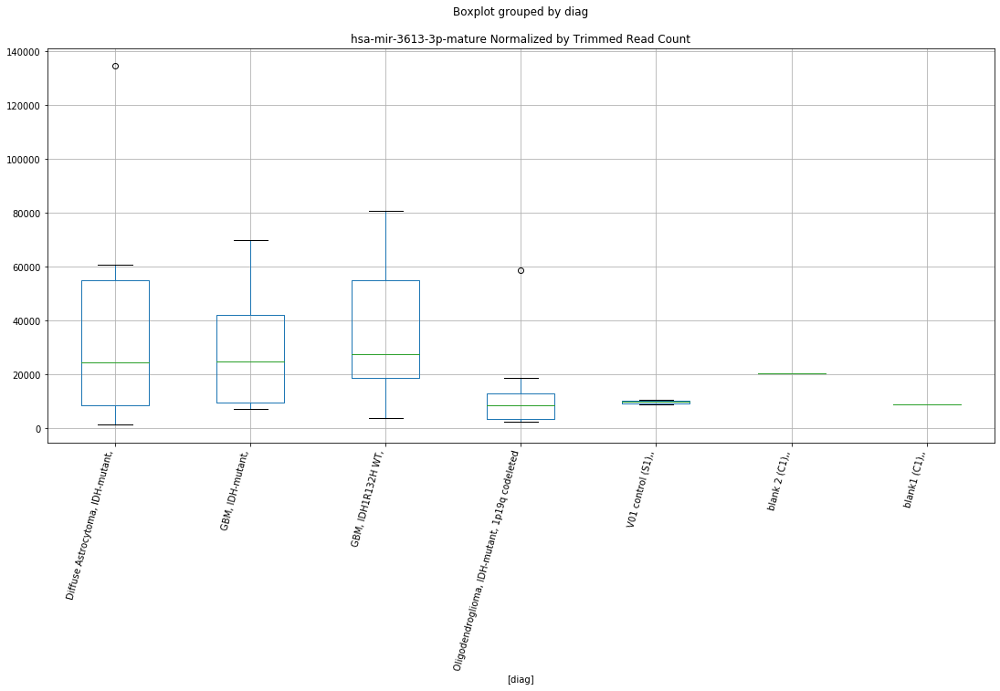

In [79]:
for col in mirnas:
    for labkit in "D-plex","Lexogen":
        for trimmer in "bbduk1","bbduk2","bbduk3","cutadapt1","cutadapt2","cutadapt3":
            ps=[]
            for diag in diags:
                others=diags.copy()
                others.remove(diag)
                for other in others:
                    t, p = stats.ttest_ind(
                        dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
                            (dfn["diag"]==diag))][col],
                        dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
                            (dfn["diag"]==other))][col])
                    if p < 0.08:
                        print(col+" "+labkit+" "+trimmer+" : "+diag+" - "+other)
                        print("\tt = " + str(t))
                        print("\tp = " + str(p))
                    ps=np.append(ps,p)
            if(any(p < 0.08 for p in ps)):
                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer))].boxplot(column=col,by=['diag'])
                plt.title(col + " Normalized by Trimmed Read Count")
                plt.xticks(rotation=75,ha='right')
                plt.show()


LOC102724859 Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.145305371342736
	p = 0.045819897084828975
LOC102724859 Lexogen bbduk3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.145305371342736
	p = 0.045819897084828975


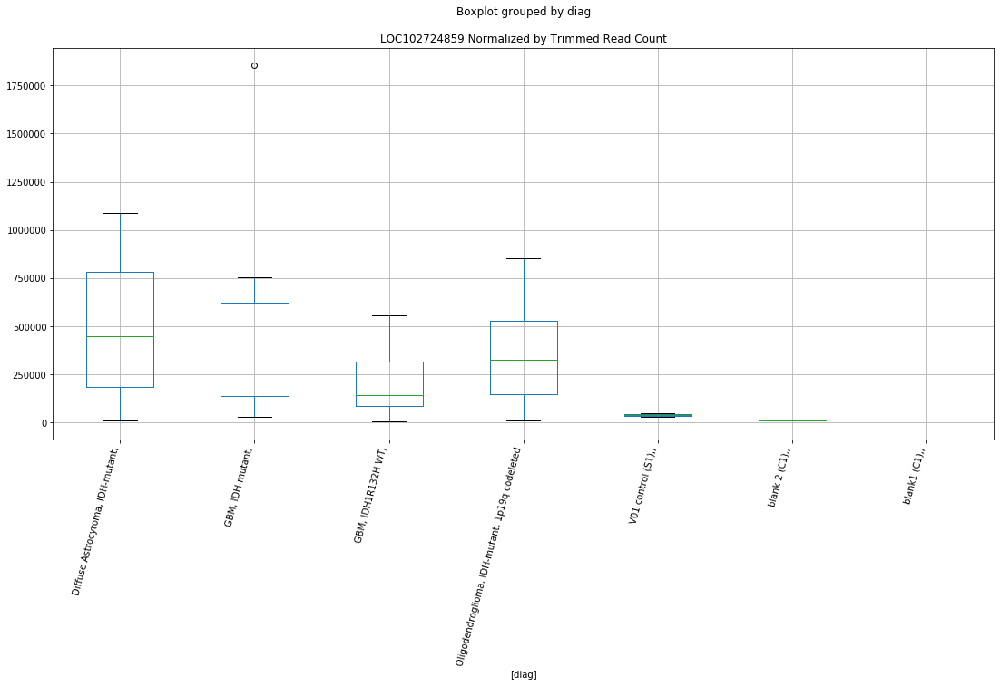

P2RX6 D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.5556230980172
	p = 0.01986476966210604
P2RX6 D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.5556230980172
	p = 0.01986476966210604


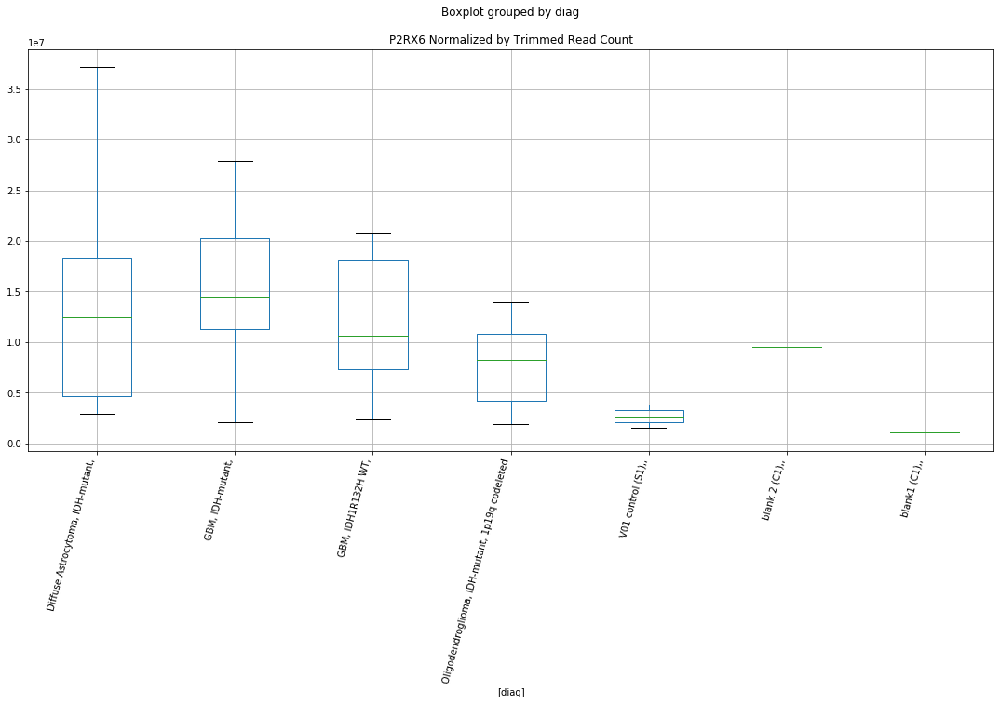

P2RX6 D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.5567803041789627
	p = 0.01981673183313178
P2RX6 D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.5567803041789627
	p = 0.01981673183313178


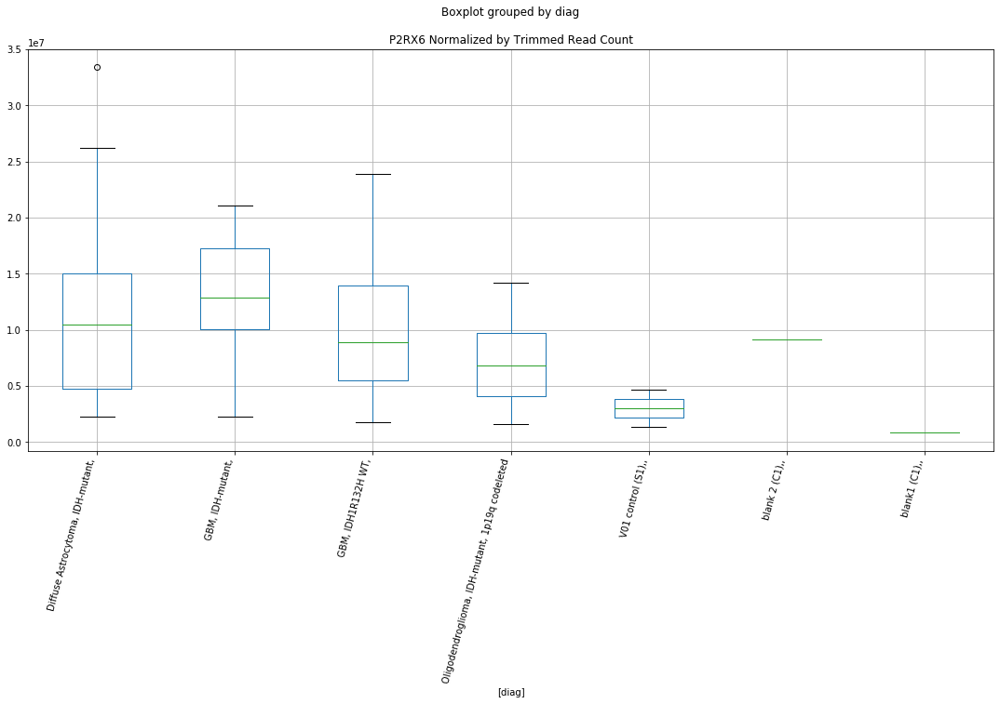

P2RX6 D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.5568893342432832
	p = 0.019812211458017506
P2RX6 D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.5568893342432832
	p = 0.019812211458017506


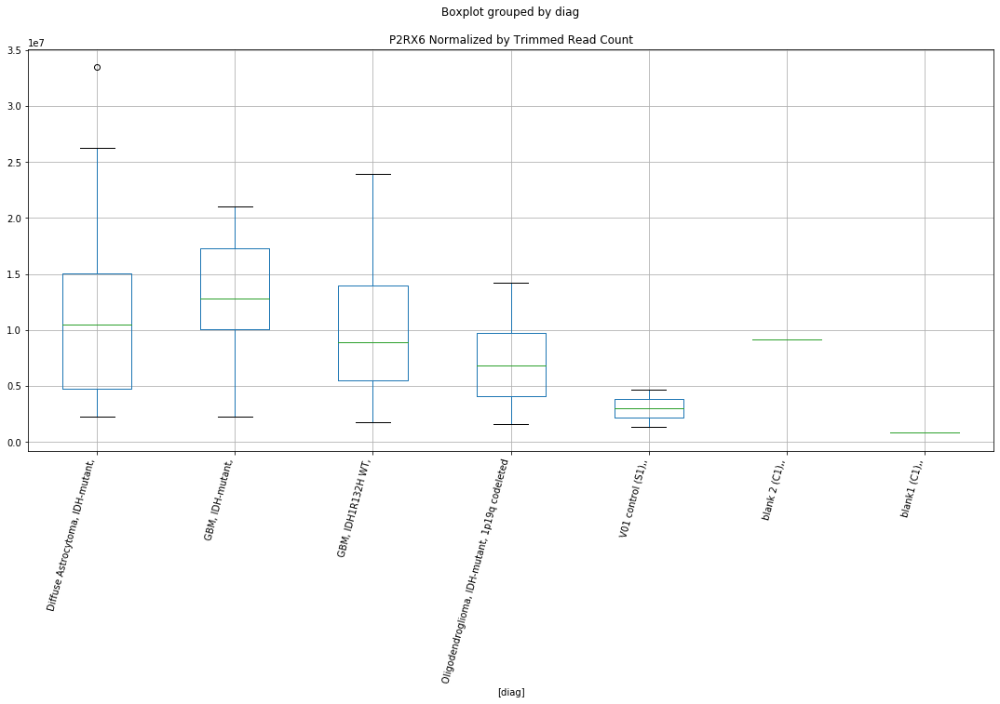

P2RX6 D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.5568917325379963
	p = 0.019812112035935987
P2RX6 D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.5568917325379963
	p = 0.019812112035935987


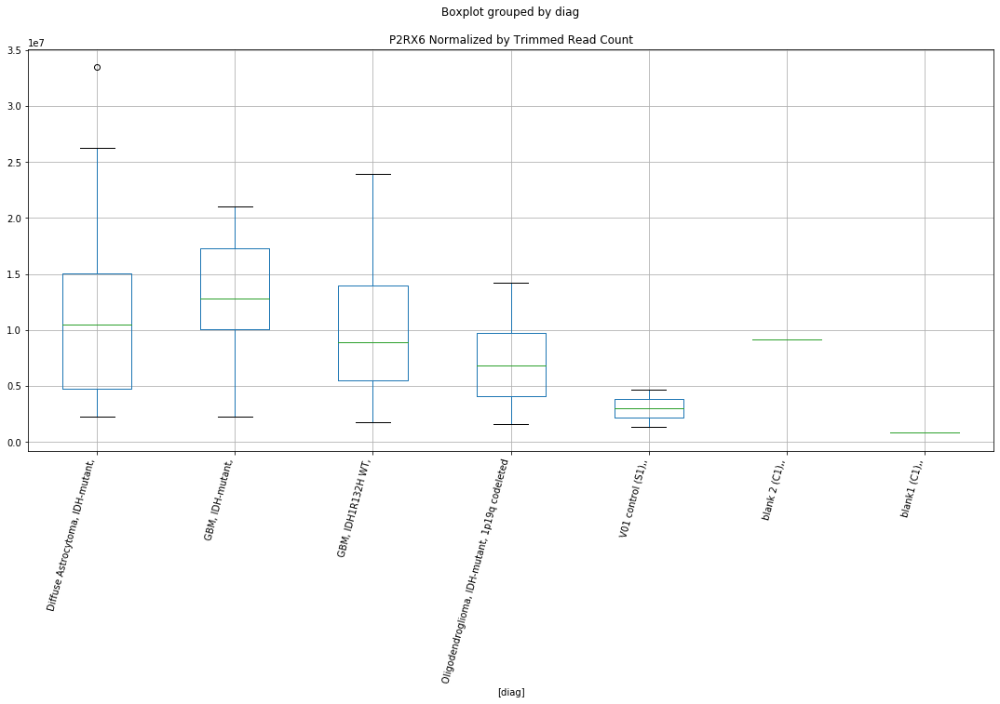

LOC100335030 Lexogen bbduk2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.868989220204421
	p = 0.07798551122916238
LOC100335030 Lexogen bbduk2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -1.868989220204421
	p = 0.07798551122916238


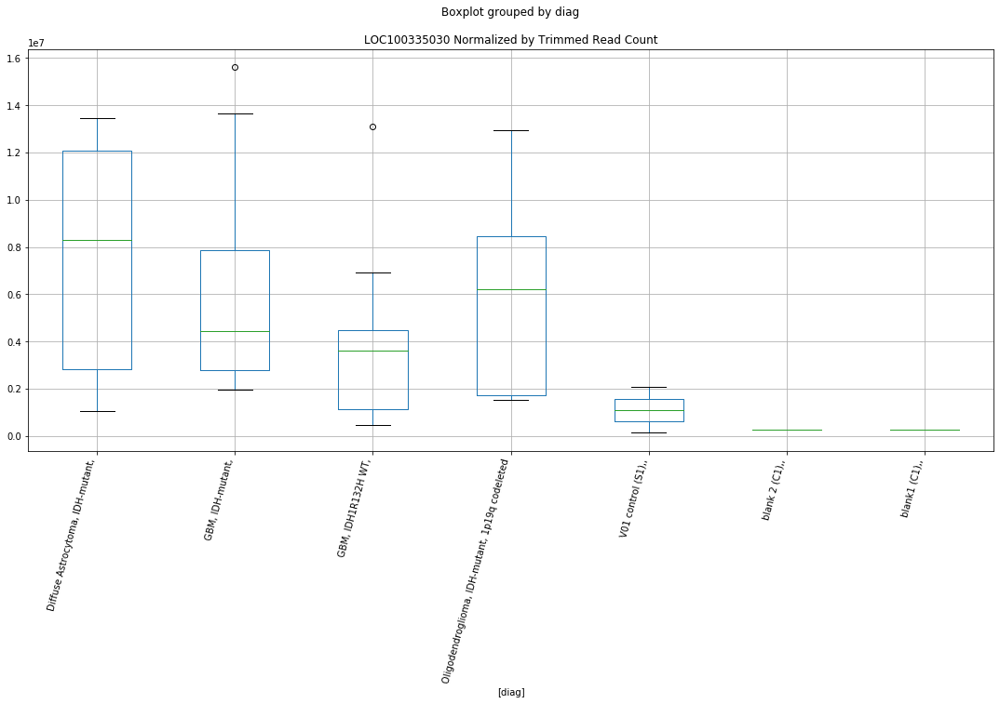

LOC100335030 Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.8798710311044073
	p = 0.07641169895755907
LOC100335030 Lexogen bbduk3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -1.8798710311044073
	p = 0.07641169895755907


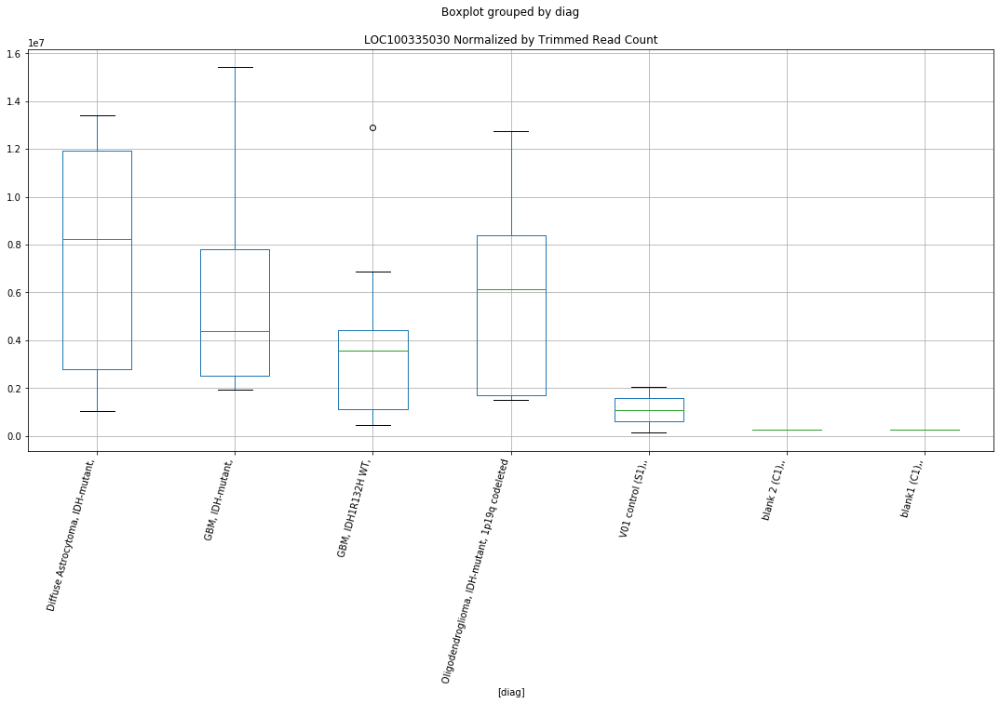

LOC100335030 Lexogen cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.8750831676428232
	p = 0.07710066528503975
LOC100335030 Lexogen cutadapt1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -1.8750831676428232
	p = 0.07710066528503975


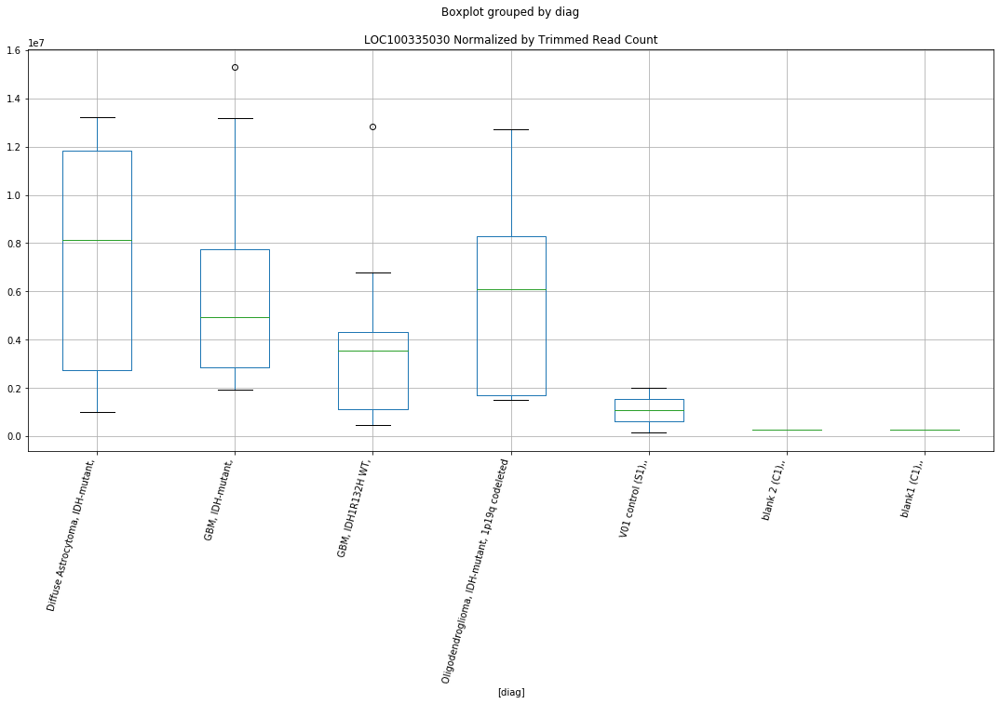

LOC100335030 Lexogen cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.859086131699435
	p = 0.07944257719787931
LOC100335030 Lexogen cutadapt2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -1.859086131699435
	p = 0.07944257719787931


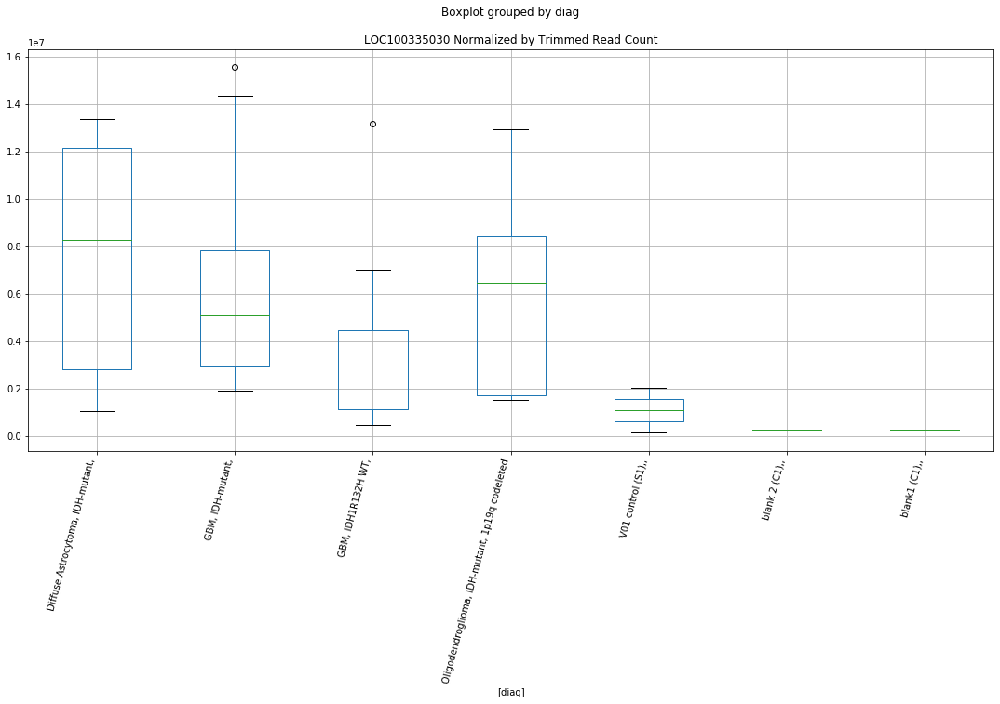

LOC100335030 Lexogen cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.8586217394289661
	p = 0.07951148988061532
LOC100335030 Lexogen cutadapt3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -1.8586217394289661
	p = 0.07951148988061532


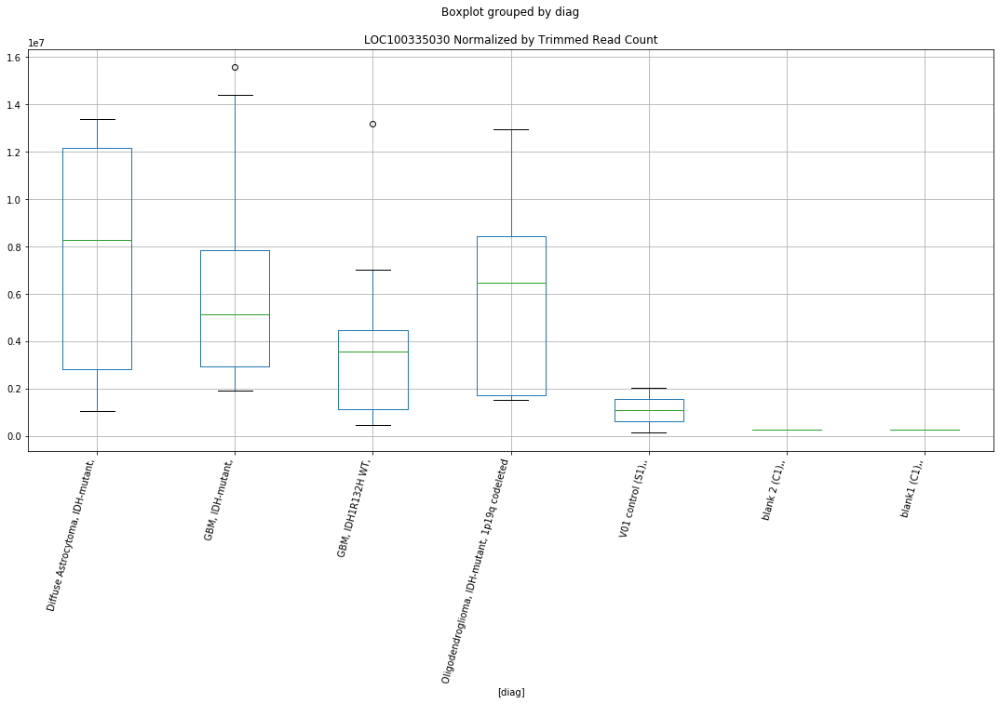

NAALADL2 D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.087660325495855
	p = 0.05131468344518754
NAALADL2 D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9945557755171512
	p = 0.06146114605789118
NAALADL2 D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.087660325495855
	p = 0.05131468344518754
NAALADL2 D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.9945557755171512
	p = 0.06146114605789118


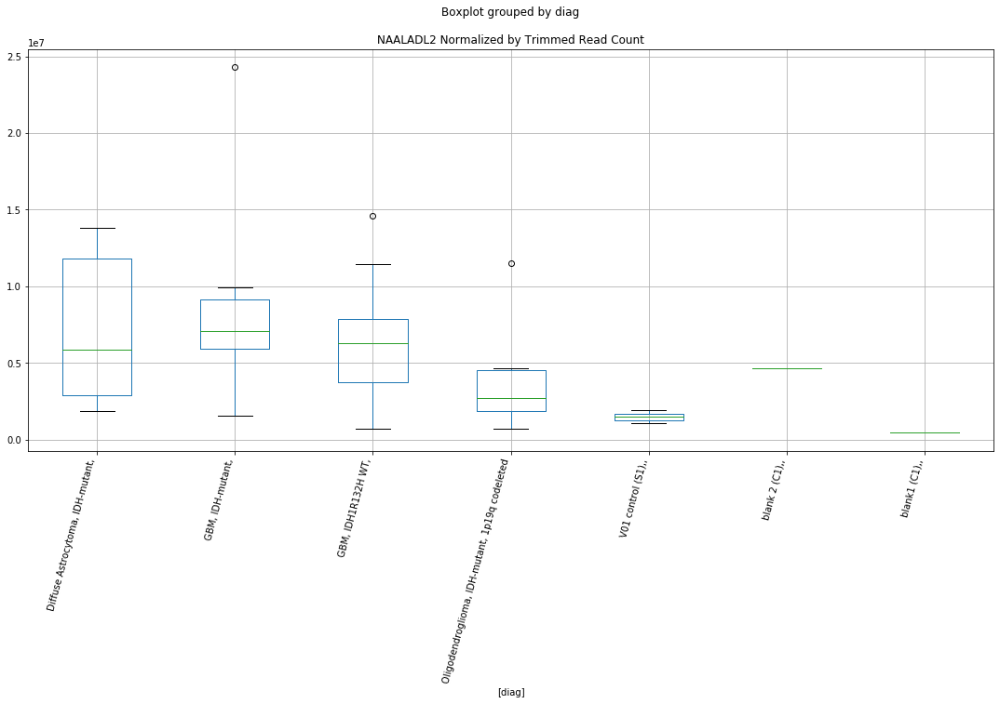

NAALADL2 D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0877934375561362
	p = 0.05130133308209955
NAALADL2 D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9950655483385369
	p = 0.06140099395105807
NAALADL2 D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.0877934375561362
	p = 0.05130133308209955
NAALADL2 D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.9950655483385369
	p = 0.06140099395105807


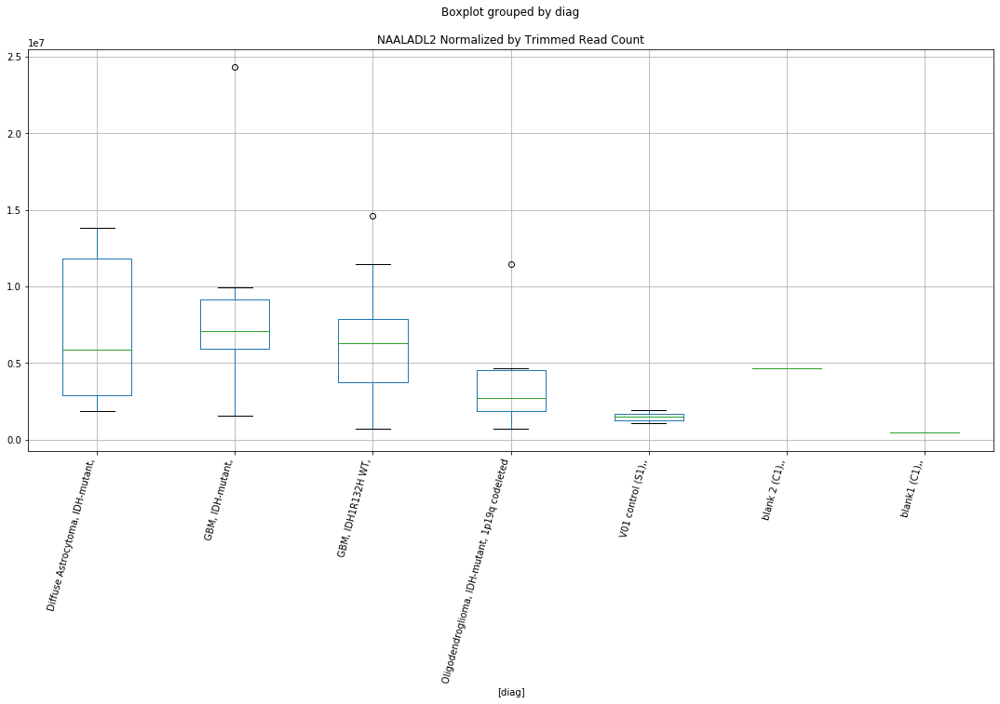

NAALADL2 D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0878483072499683
	p = 0.0512958308895046
NAALADL2 D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9950130415419465
	p = 0.06140718719871664
NAALADL2 D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.0878483072499683
	p = 0.0512958308895046
NAALADL2 D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.9950130415419465
	p = 0.06140718719871664


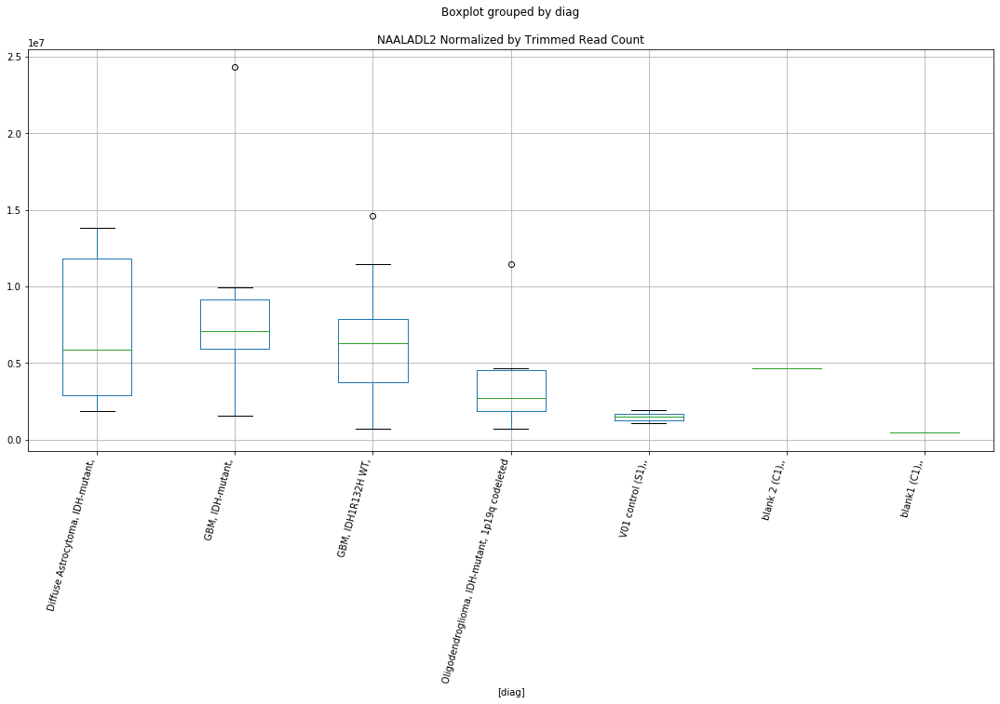

GOLGA2P10 D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9774335837885082
	p = 0.06351249365474389
GOLGA2P10 D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9774335837885082
	p = 0.06351249365474389


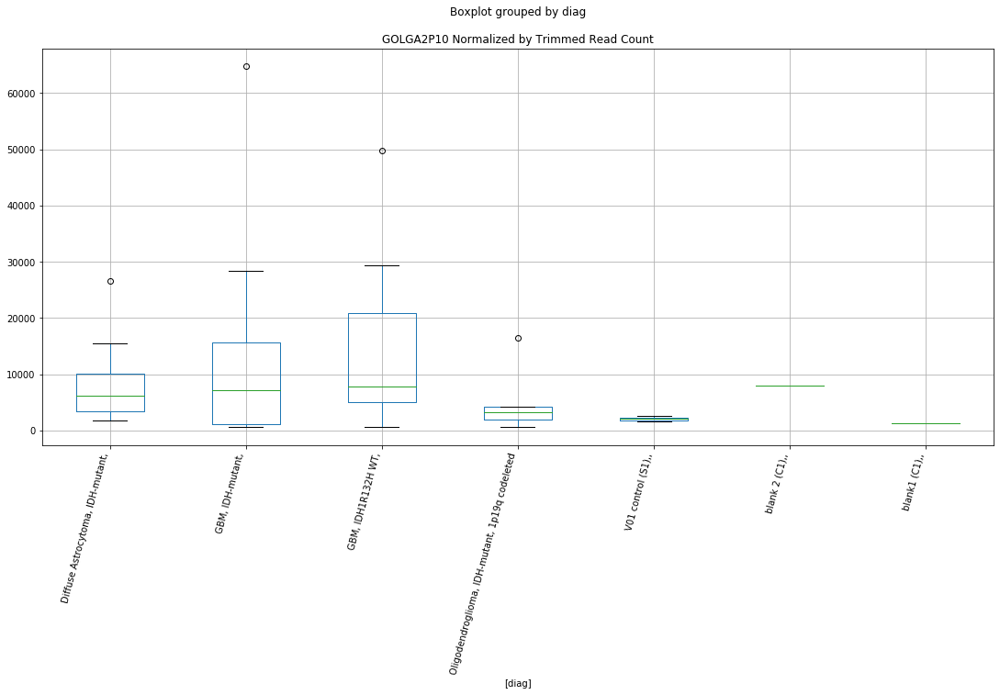

GOLGA2P10 D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9592776301555854
	p = 0.06575449222206377
GOLGA2P10 D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9592776301555854
	p = 0.06575449222206377


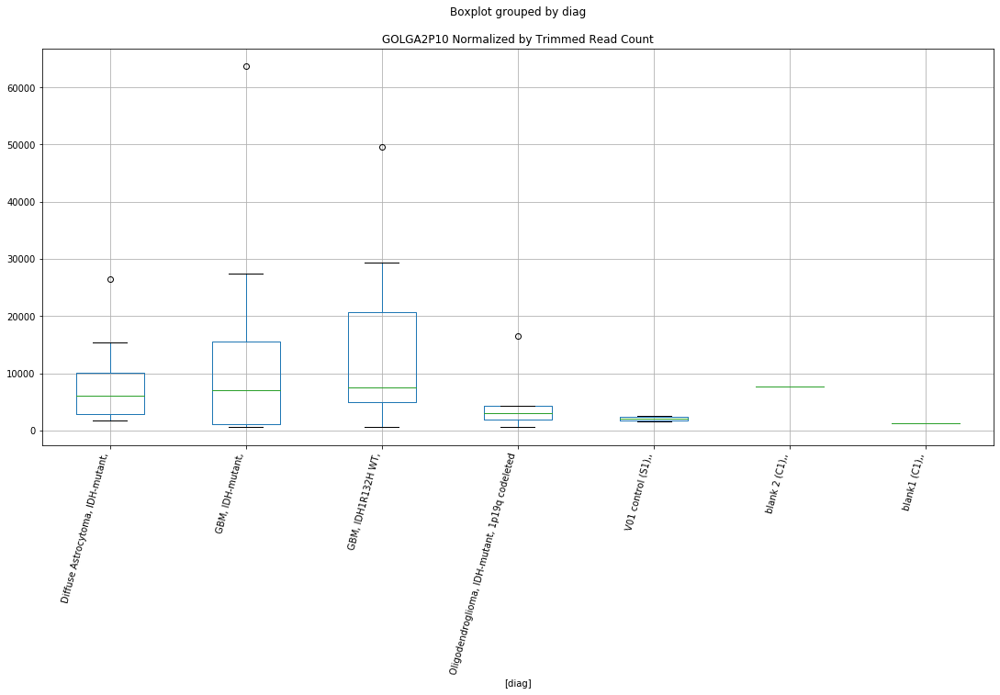

GOLGA2P10 Lexogen bbduk1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.9143611747006186
	p = 0.0716075846987827
GOLGA2P10 Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.4857497898027523
	p = 0.02297810453210403
GOLGA2P10 Lexogen bbduk1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -1.9143611747006186
	p = 0.0716075846987827
GOLGA2P10 Lexogen bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.4857497898027523
	p = 0.02297810453210403


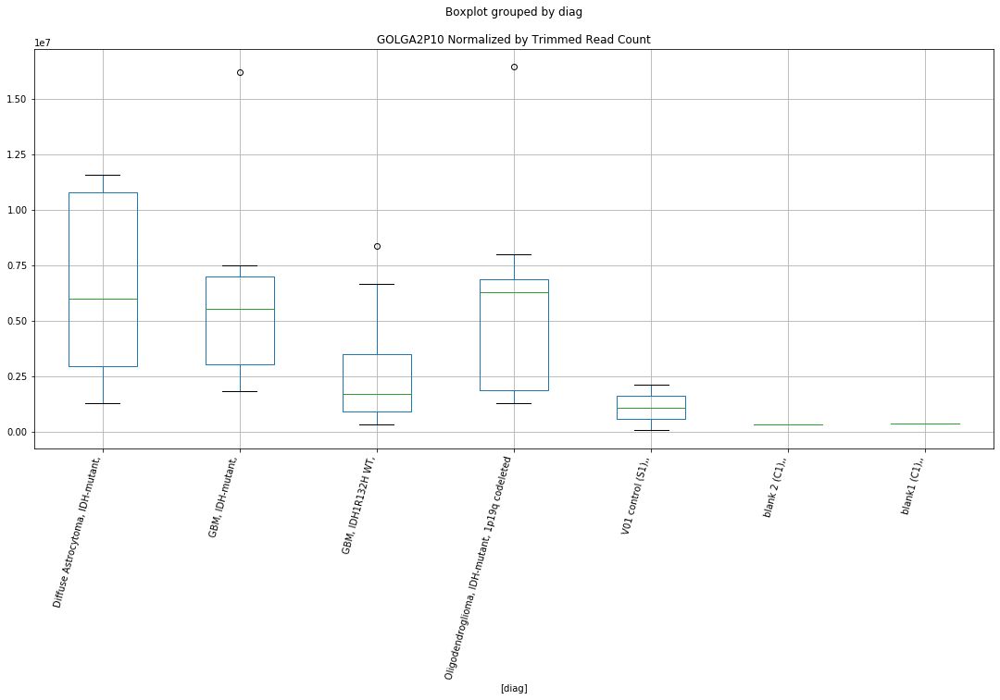

GOLGA2P10 Lexogen bbduk2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.5235200369333883
	p = 0.021242170531053026
GOLGA2P10 Lexogen bbduk2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.5235200369333883
	p = 0.021242170531053026


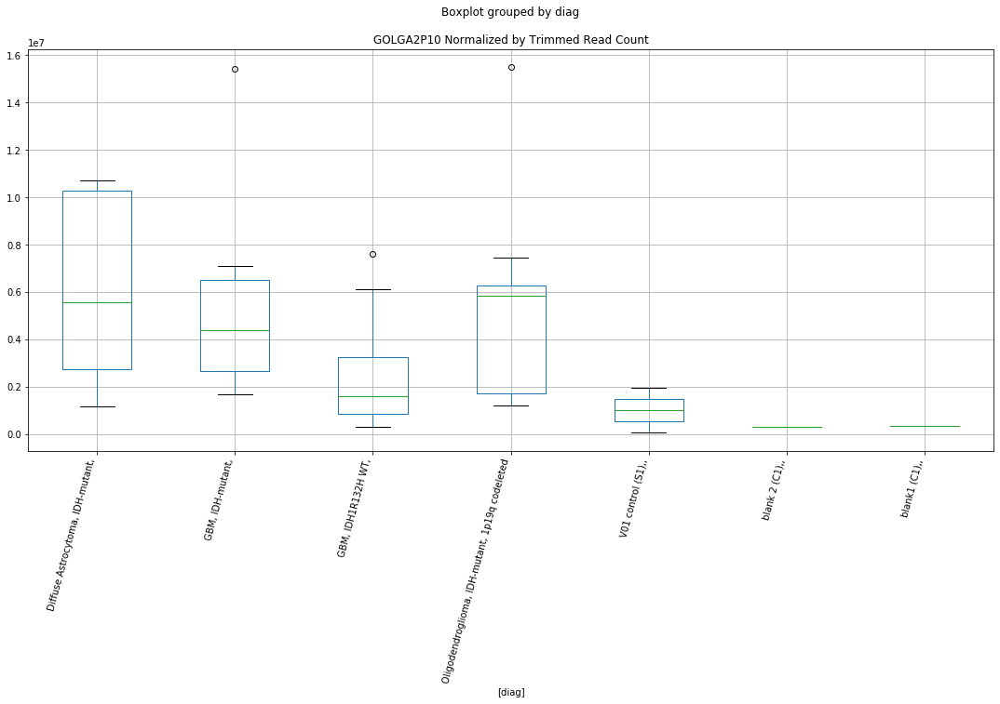

GOLGA2P10 Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.526704732916833
	p = 0.021101600440814158
GOLGA2P10 Lexogen bbduk3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.526704732916833
	p = 0.021101600440814158


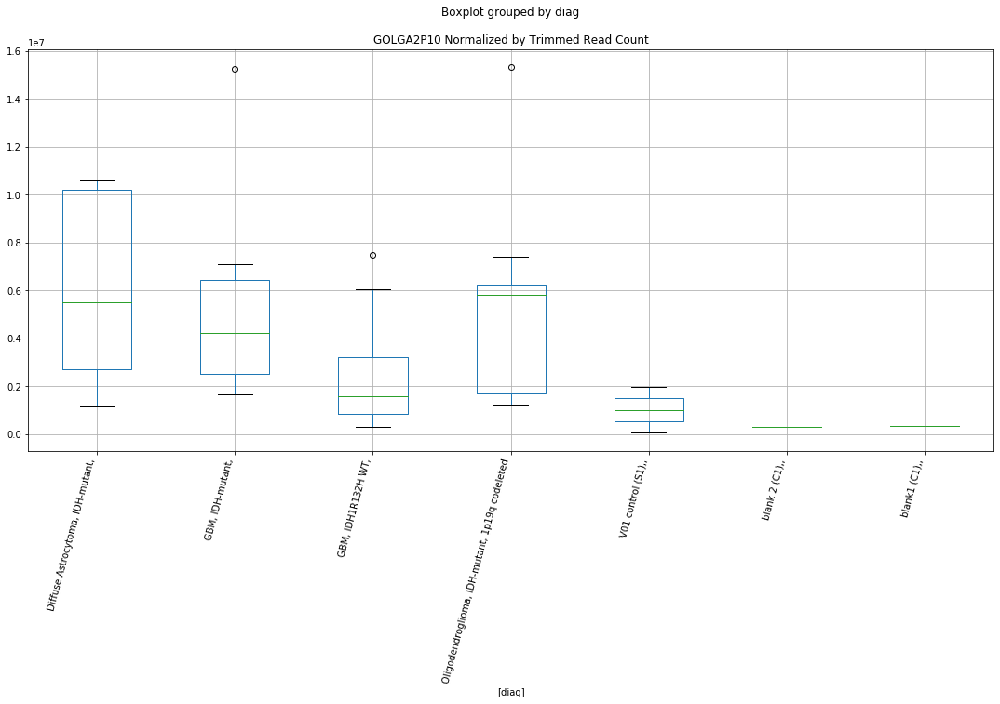

GOLGA2P10 Lexogen cutadapt1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.9158100255863162
	p = 0.07141177682793677
GOLGA2P10 Lexogen cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.5276757004235297
	p = 0.02105891766785454
GOLGA2P10 Lexogen cutadapt1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -1.9158100255863162
	p = 0.07141177682793677
GOLGA2P10 Lexogen cutadapt1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.5276757004235297
	p = 0.02105891766785454


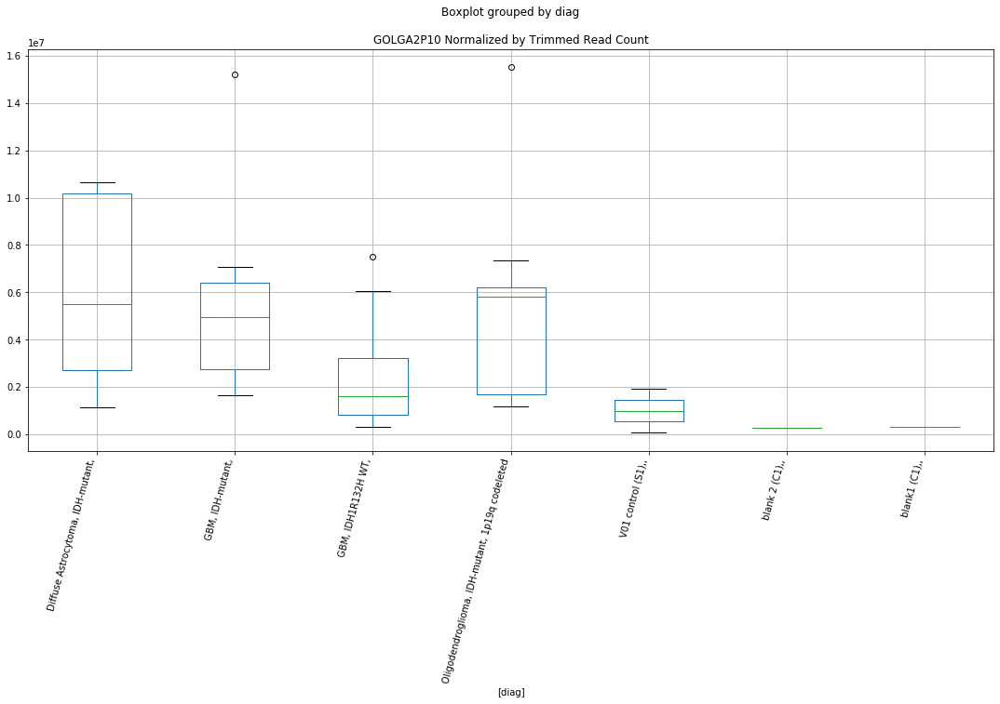

GOLGA2P10 Lexogen cutadapt2 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.9317651644078961
	p = 0.0692867650776512
GOLGA2P10 Lexogen cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.5138937354848947
	p = 0.02167246084108516
GOLGA2P10 Lexogen cutadapt2 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -1.9317651644078961
	p = 0.0692867650776512
GOLGA2P10 Lexogen cutadapt2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.5138937354848947
	p = 0.02167246084108516


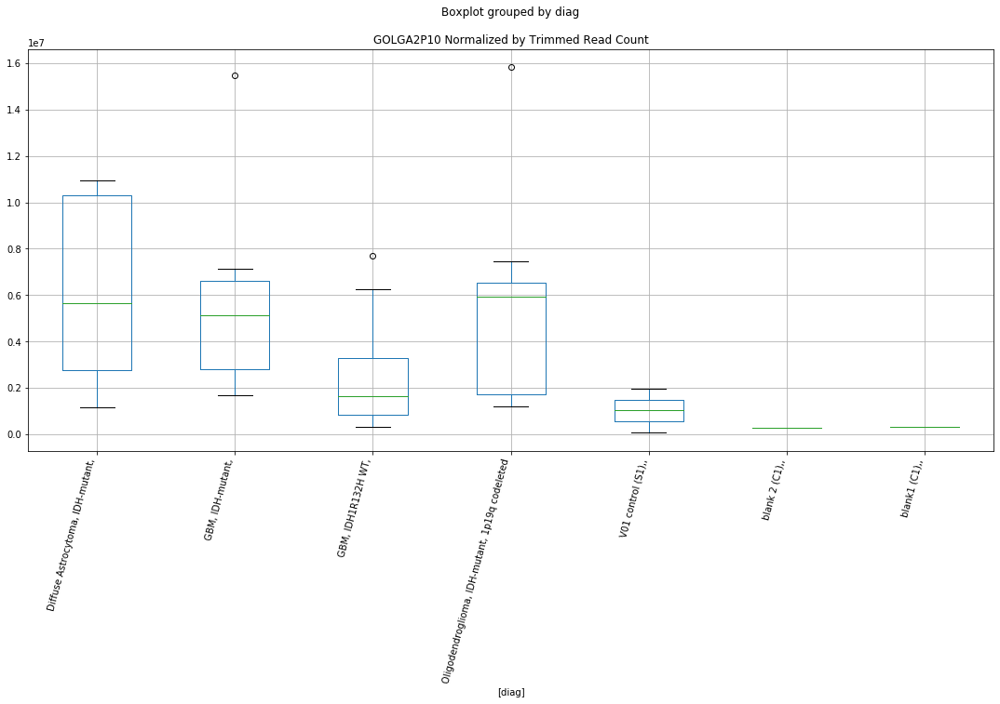

GOLGA2P10 Lexogen cutadapt3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.937107612934972
	p = 0.06858790848678416
GOLGA2P10 Lexogen cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.5137349474173534
	p = 0.02167962704458136
GOLGA2P10 Lexogen cutadapt3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -1.937107612934972
	p = 0.06858790848678416
GOLGA2P10 Lexogen cutadapt3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.5137349474173534
	p = 0.02167962704458136


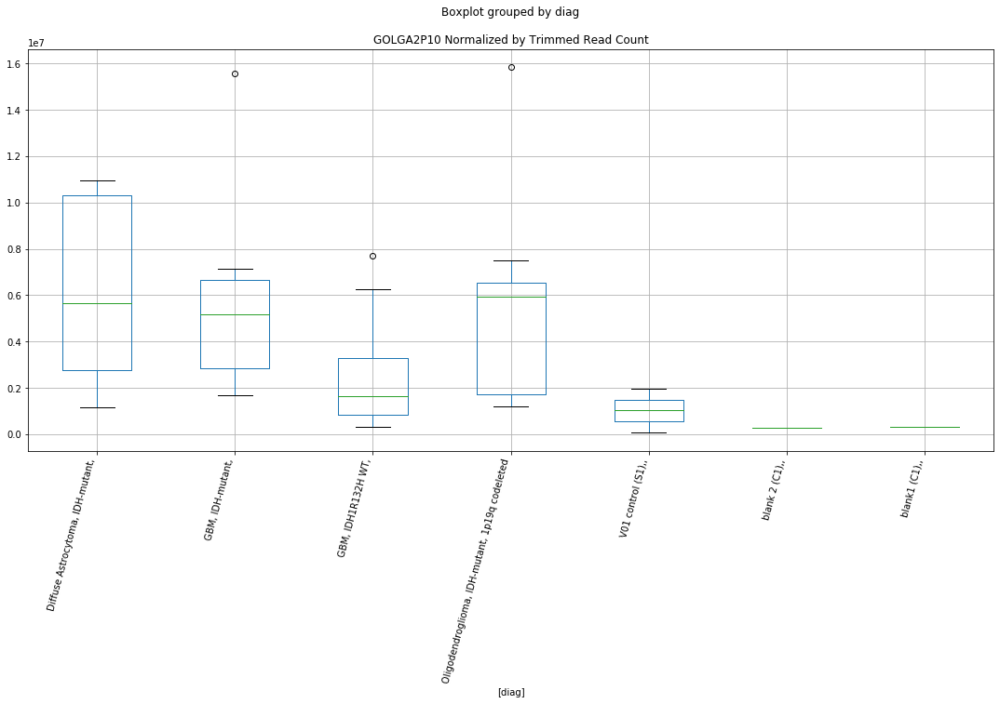

AHDC1 D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.3544390671104827
	p = 0.030106736125122328
AHDC1 D-plex bbduk2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.886339148769902
	p = 0.07548959438937052
AHDC1 D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.3544390671104827
	p = 0.030106736125122328
AHDC1 D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.886339148769902
	p = 0.07548959438937052
AHDC1 D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9941006084263022
	p = 0.061514899504260354
AHDC1 D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9941006084263022
	p = 0.061514899504260354


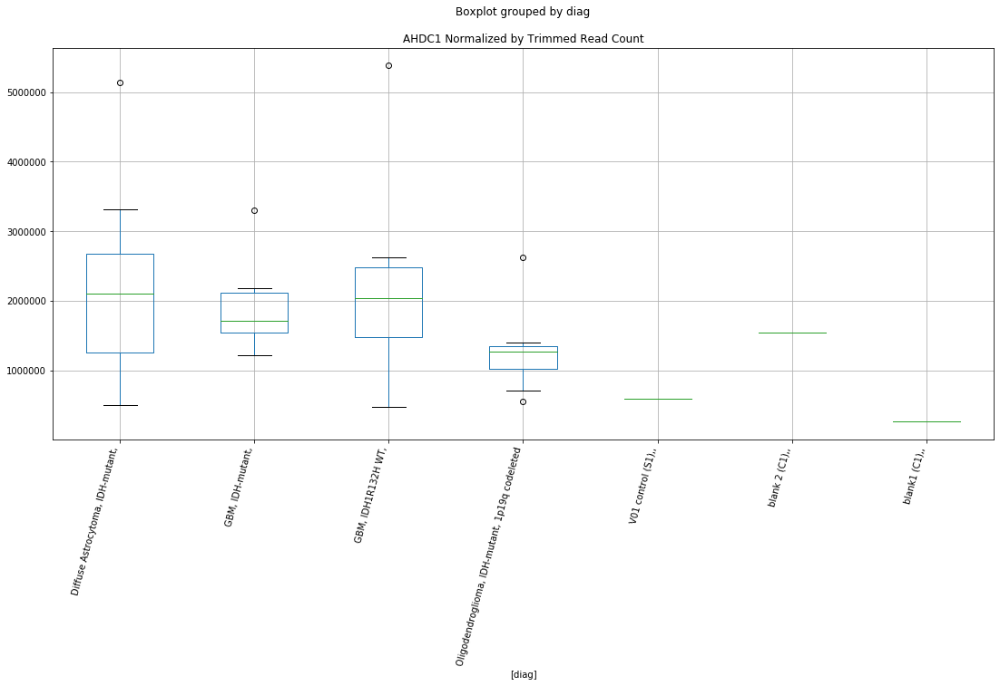

AHDC1 D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.327971218751977
	p = 0.03177363294075489
AHDC1 D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.327971218751977
	p = 0.03177363294075489


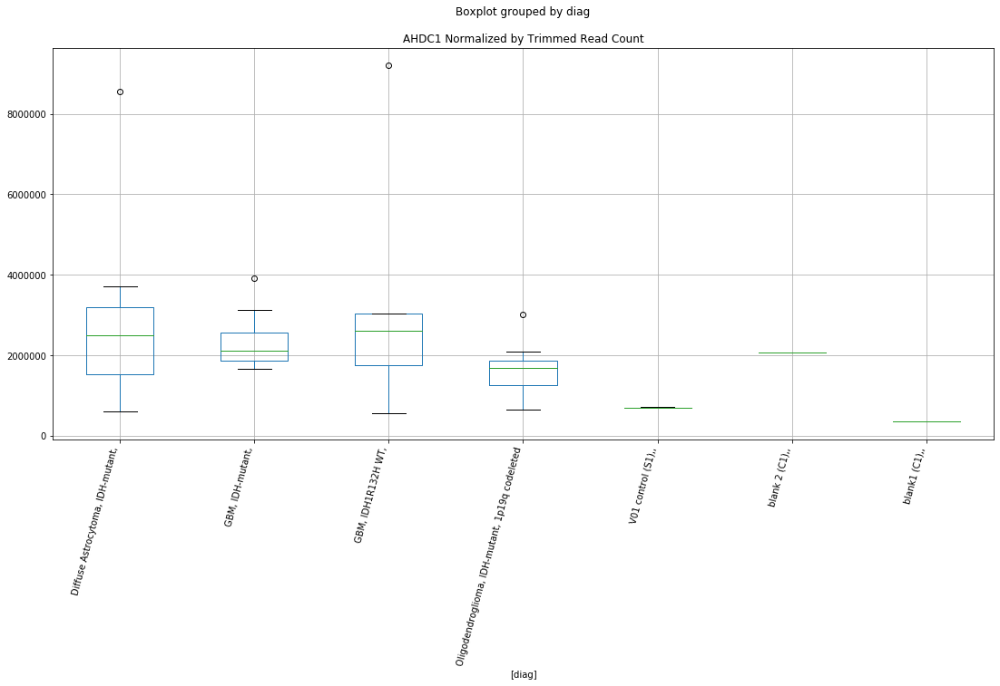

AHDC1 D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.6326794186799716
	p = 0.016895623405868494
AHDC1 D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.6326794186799716
	p = 0.016895623405868494


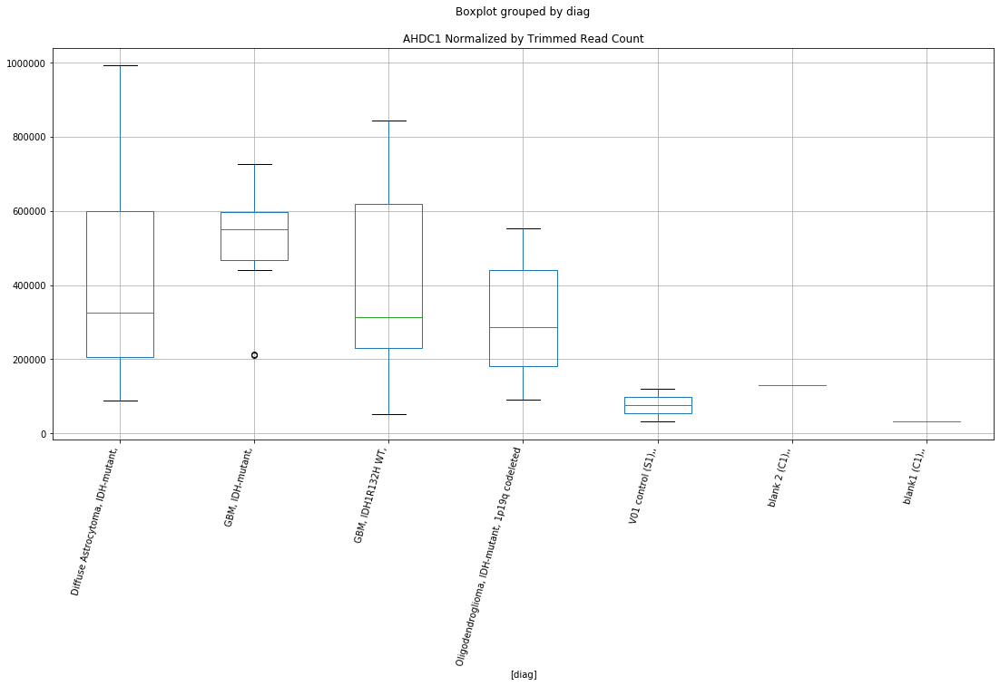

AHDC1 D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.632735958823275
	p = 0.016893608266604805
AHDC1 D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.632735958823275
	p = 0.016893608266604805


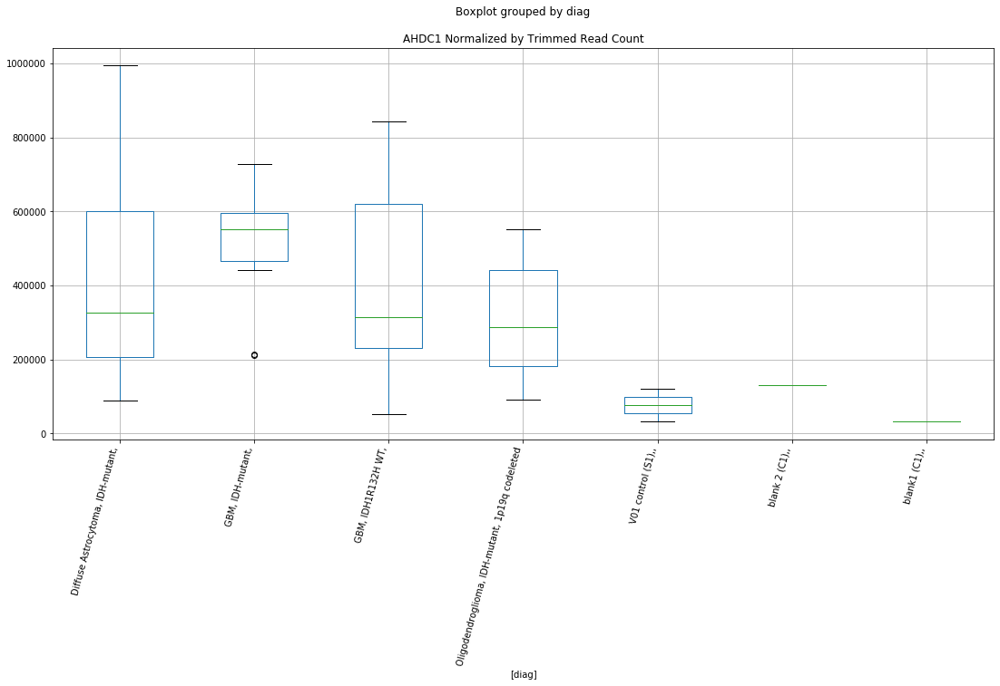

AHDC1 D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.6326649382412284
	p = 0.016896139537912334
AHDC1 D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.6326649382412284
	p = 0.016896139537912334


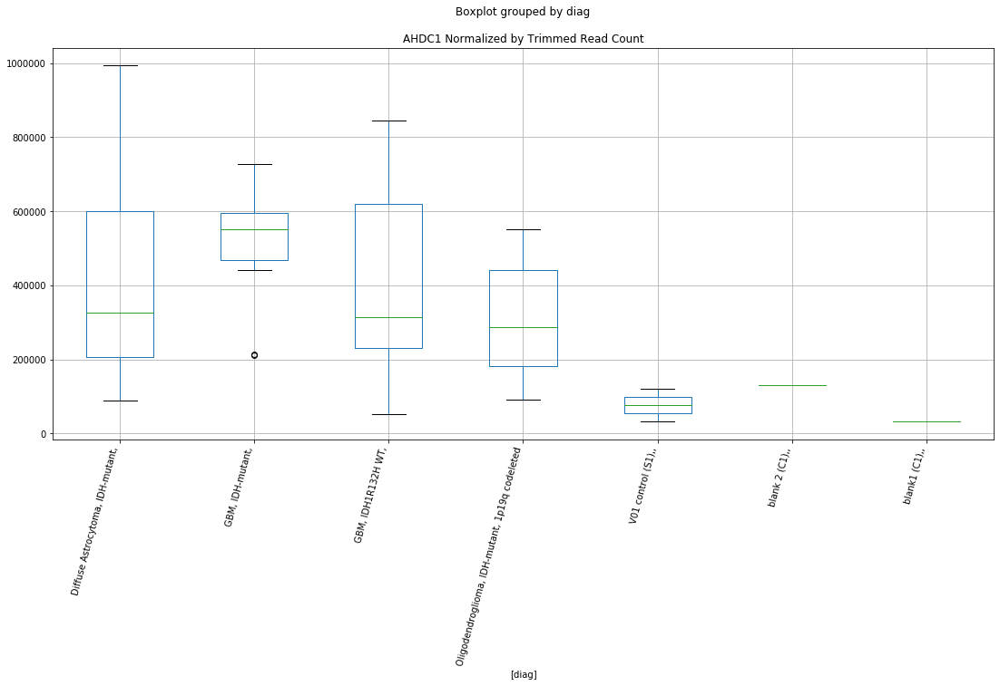

TTC21A D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9359036544558215
	p = 0.06874485020917885
TTC21A D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9359036544558215
	p = 0.06874485020917885


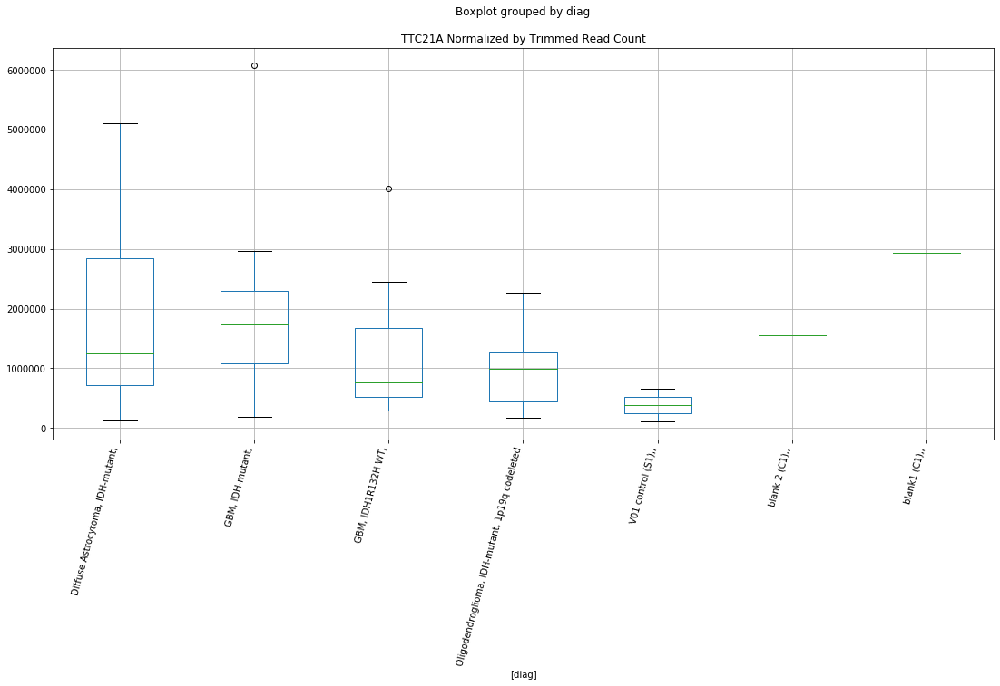

EDEM3 D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9412620812288193
	p = 0.06804880298615883
EDEM3 D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9412620812288193
	p = 0.06804880298615883


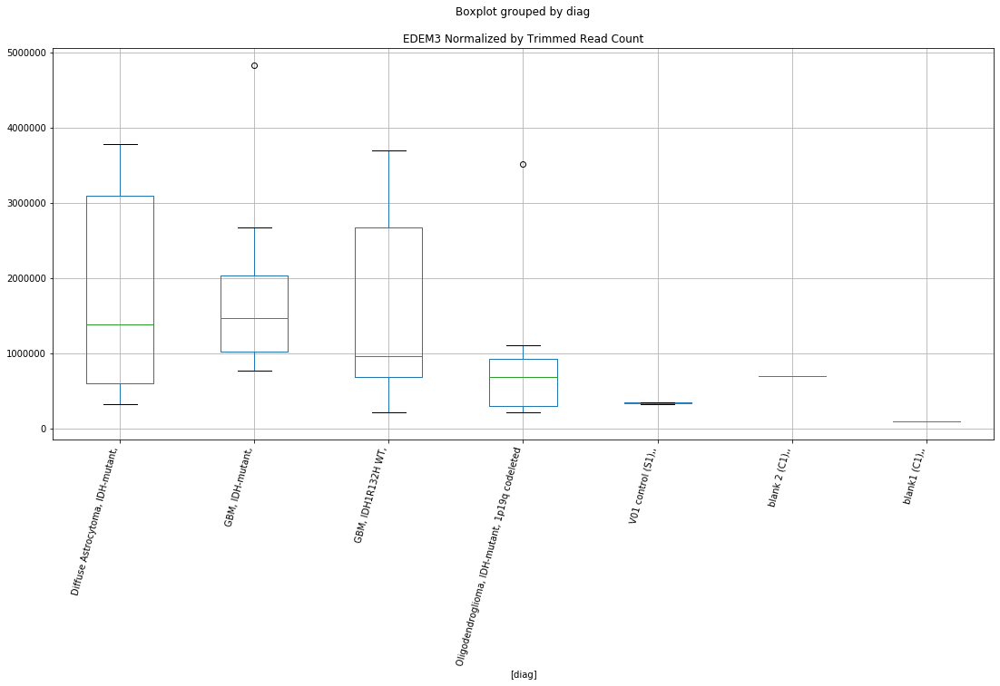

EDEM3 D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.044058783101479
	p = 0.0069823332691351285
EDEM3 D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.044058783101479
	p = 0.0069823332691351285


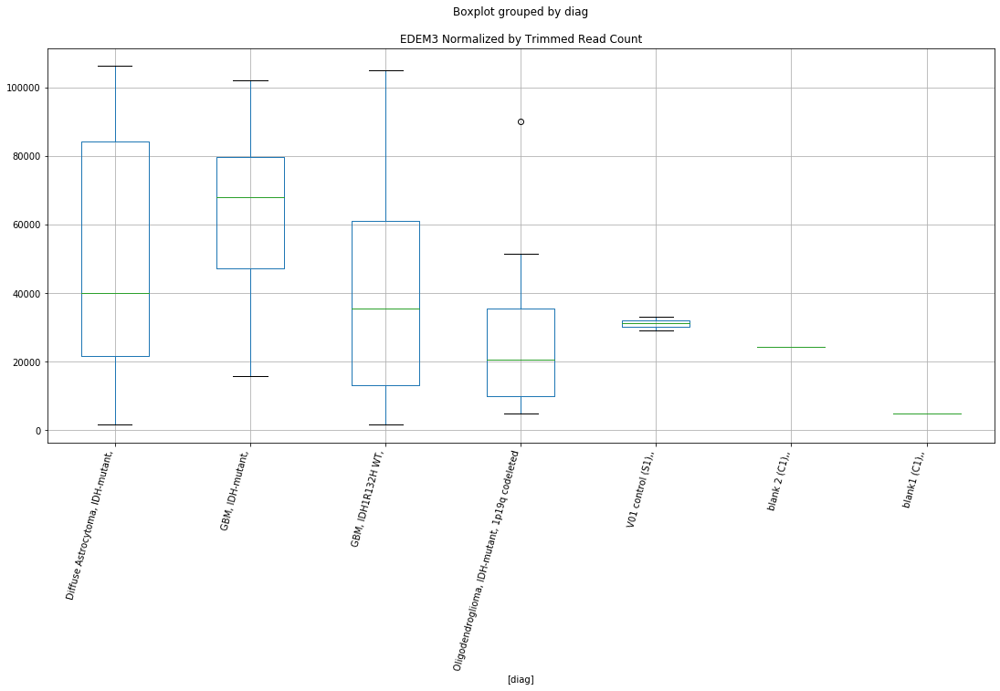

EDEM3 D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.9665337406240875
	p = 0.008264926168176479
EDEM3 D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.9665337406240875
	p = 0.008264926168176479


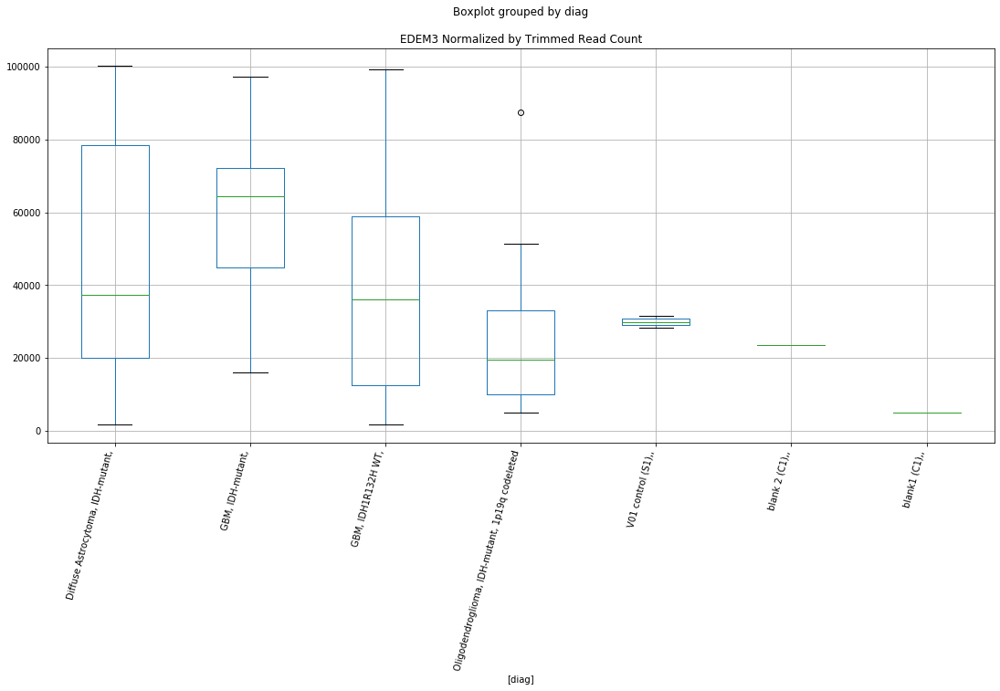

EDEM3 D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0529795694544393
	p = 0.05490223563939927
EDEM3 D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.0529795694544393
	p = 0.05490223563939927


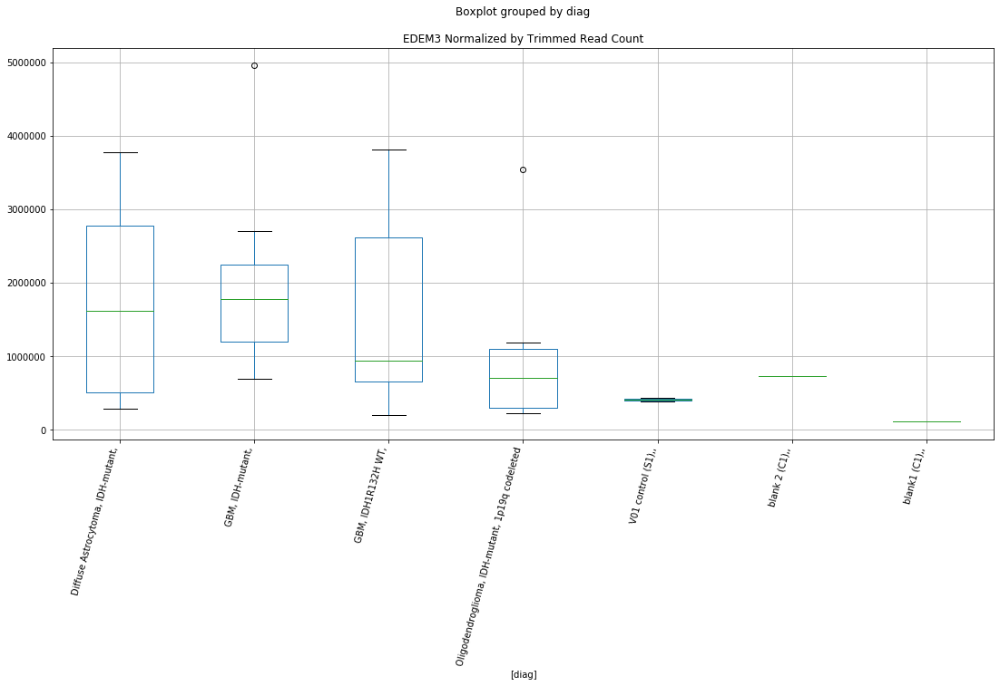

EDEM3 D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.05337277293267
	p = 0.05486031976313008
EDEM3 D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.05337277293267
	p = 0.05486031976313008


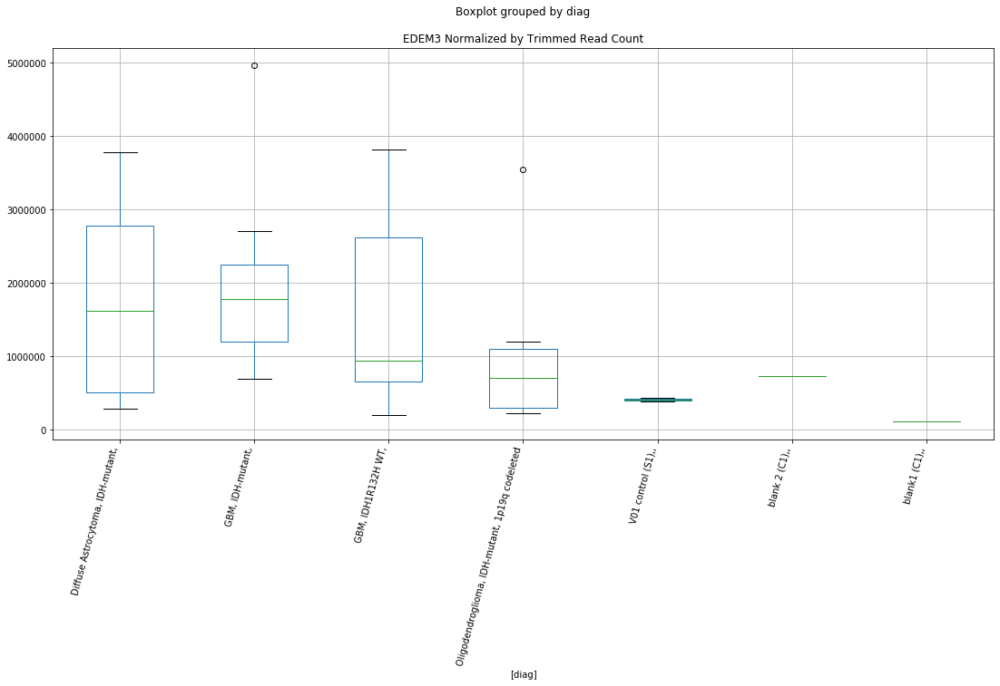

EDEM3 D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0534022428316545
	p = 0.05485717940871578
EDEM3 D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.0534022428316545
	p = 0.05485717940871578


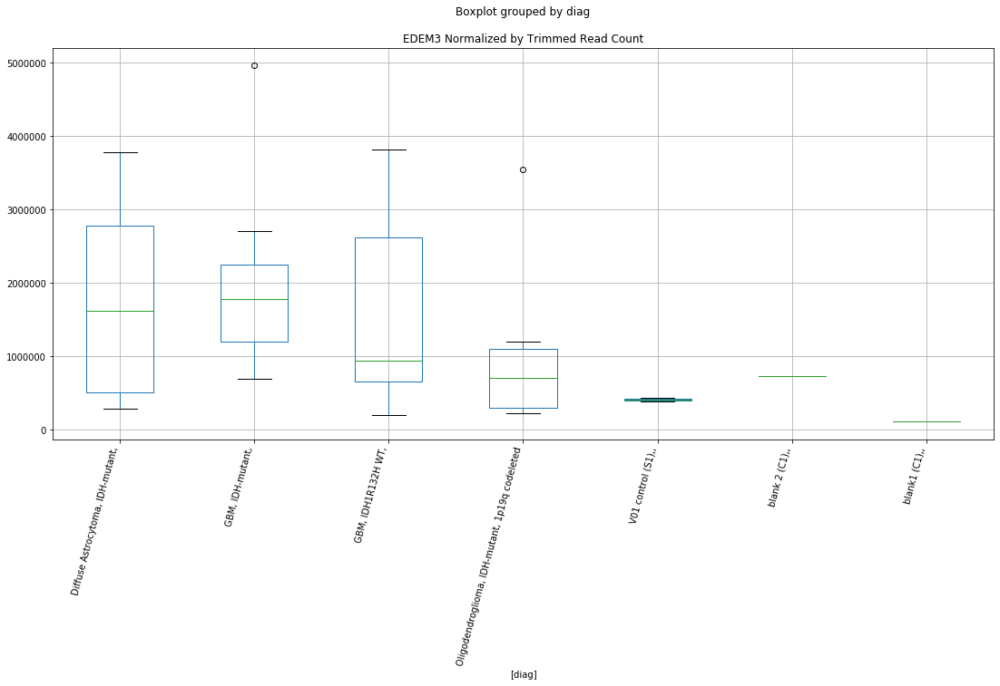

In [80]:
for col in genes:
    for labkit in "D-plex","Lexogen":
        for trimmer in "bbduk1","bbduk2","bbduk3","cutadapt1","cutadapt2","cutadapt3":
            ps=[]
            for diag in diags:
                others=diags.copy()
                others.remove(diag)
                for other in others:
                    t, p = stats.ttest_ind(
                        dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
                            (dfn["diag"]==diag))][col],
                        dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
                            (dfn["diag"]==other))][col])
                    if p < 0.08:
                        print(col+" "+labkit+" "+trimmer+" : "+diag+" - "+other)
                        print("\tt = " + str(t))
                        print("\tp = " + str(p))
                    ps=np.append(ps,p)
            if(any(p < 0.08 for p in ps)):
                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer))].boxplot(column=col,by=['diag'])
                plt.title(col + " Normalized by Trimmed Read Count")
                plt.xticks(rotation=75,ha='right')
                plt.show()


# Normalize by STAR Aligned Genome Count

In [81]:
dfn=df.copy()

In [82]:
dfn.head()

,sample,Subject,Lab kit,Trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,hsa-mir-6887-hairpin,hsa-mir-6887-5p-mature,hsa-mir-3613-3p-mature,subject,dplex,lexogen,diag,disease,idh,x1p19q
0,SFHH005aa,3_5,D-plex,bbduk1,7706323,201,4578177,57.8849,99328,2.16,...,20494,20259,2,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
1,SFHH005aa,3_5,D-plex,bbduk2,7706323,201,7054912,60.3426,140222,1.98,...,78,76,12246,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
2,SFHH005aa,3_5,D-plex,bbduk3,7706323,201,7067406,60.5684,138584,1.96,...,68,66,12209,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
3,SFHH005aa,3_5,D-plex,cutadapt1,7706323,201,4879448,132.375,105508,2.16,...,15303,15056,35,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
4,SFHH005aa,3_5,D-plex,cutadapt2,7706323,201,4877655,131.86,119834,2.45,...,15303,15056,35,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,


In [83]:
dfn[mirnas].head()

,hsa-mir-4329-hairpin,hsa-mir-5588-hairpin,hsa-mir-92b-hairpin,hsa-mir-4271-hairpin,hsa-mir-548u-hairpin,hsa-mir-1260a-hairpin,hsa-mir-944-hairpin,hsa-mir-10226-hairpin,hsa-mir-4538-hairpin,hsa-mir-4538-mature,...,hsa-mir-509-1-hairpin,hsa-mir-892b-hairpin,hsa-mir-509-2-hairpin,hsa-mir-509-3-hairpin,hsa-mir-6787-hairpin,hsa-mir-6787-5p-mature,hsa-mir-1281-hairpin,hsa-mir-6887-hairpin,hsa-mir-6887-5p-mature,hsa-mir-3613-3p-mature
0,37,2,337,968,7,355,380,4846,32,28,...,152,166,152,116,874,799,14186,20494,20259,2
1,504505,164998,130955,84567,211982,1300,31,4799,NaN,NaN,...,54,161,54,54,36,33,121,78,76,12246
2,492709,169068,127250,81636,207177,1278,30,4799,NaN,NaN,...,52,158,52,52,33,31,103,68,66,12209
3,178,121,1250,2630,307,1035,694,71,18,15,...,276,268,276,276,1255,1034,20096,15303,15056,35
4,178,121,1251,2630,307,1035,694,71,18,15,...,276,269,276,276,1255,1034,20096,15303,15056,35


In [84]:
dfn[mirnas]=dfn.apply(lambda row: 1e9*pd.to_numeric(row[mirnas])/pd.to_numeric(row['STAR Aligned to Genome']), axis=1 )


In [85]:
dfn[mirnas].head()

,hsa-mir-4329-hairpin,hsa-mir-5588-hairpin,hsa-mir-92b-hairpin,hsa-mir-4271-hairpin,hsa-mir-548u-hairpin,hsa-mir-1260a-hairpin,hsa-mir-944-hairpin,hsa-mir-10226-hairpin,hsa-mir-4538-hairpin,hsa-mir-4538-mature,...,hsa-mir-509-1-hairpin,hsa-mir-892b-hairpin,hsa-mir-509-2-hairpin,hsa-mir-509-3-hairpin,hsa-mir-6787-hairpin,hsa-mir-6787-5p-mature,hsa-mir-1281-hairpin,hsa-mir-6887-hairpin,hsa-mir-6887-5p-mature,hsa-mir-3613-3p-mature
0,3.10e+04,1.68e+03,2.83e+05,8.12e+05,5.87e+03,297718.39,318684.47,4.06e+06,26836.59,23482.01,...,127473.79,139214.80,127473.79,97282.63,732974.28,670076.03,1.19e+07,1.72e+07,1.70e+07,1.68e+03
1,1.77e+08,5.78e+07,4.59e+07,2.96e+07,7.43e+07,455714.54,10867.04,1.68e+06,NaN,NaN,...,18929.68,56438.49,18929.68,18929.68,12619.79,11568.14,4.24e+04,2.73e+04,2.66e+04,4.29e+06
2,1.73e+08,5.95e+07,4.48e+07,2.87e+07,7.29e+07,449531.32,10552.38,1.69e+06,NaN,NaN,...,18290.79,55575.86,18290.79,18290.79,11607.62,10904.12,3.62e+04,2.39e+04,2.32e+04,4.29e+06
3,5.40e+04,3.67e+04,3.79e+05,7.98e+05,9.31e+04,313878.53,210465.41,2.15e+04,5458.76,4548.96,...,83700.94,81274.83,83700.94,83700.94,380596.67,313575.26,6.09e+06,4.64e+06,4.57e+06,1.06e+04
4,5.37e+04,3.65e+04,3.78e+05,7.94e+05,9.27e+04,312444.81,209504.06,2.14e+04,5433.82,4528.19,...,83318.62,81205.46,83318.62,83318.62,378858.20,312142.93,6.07e+06,4.62e+06,4.55e+06,1.06e+04


In [86]:
dfn[genes].head()

,LOC102724859,RPH3A,PLCE1,ADGRG6,CCDC151,IGF2,P2RX6,PIGG,MAPT,MIR486-1,...,AHDC1,INS-IGF2,MICAL2,NOTCH2NLB,TTN,TTC21A,TUBGCP4,WSB1,EDEM3,NACC2
0,NaN,NaN,2660,481,152,7,67662,NaN,21,NaN,...,336,1,2220,21,2124,5814,48,4,6636,28
1,NaN,NaN,252,NaN,24,39465,2583,NaN,NaN,NaN,...,9848,7893,78,NaN,144,38,30,4270,486,NaN
2,NaN,NaN,252,NaN,24,43385,2520,NaN,NaN,NaN,...,11708,8677,76,NaN,144,38,30,4190,450,NaN
3,34,1,2110,250,NaN,17,55125,NaN,NaN,NaN,...,2662,2,2960,206,4626,4826,216,NaN,7242,34
4,34,1,2110,250,NaN,17,55125,NaN,NaN,NaN,...,2662,2,2960,206,4626,4826,216,NaN,7242,34


In [87]:
dfn[genes]=dfn.apply(lambda row: 1e9*pd.to_numeric(row[genes])/pd.to_numeric(row['STAR Aligned to Genome']), axis=1 )


In [88]:
dfn[genes].head()

,LOC102724859,RPH3A,PLCE1,ADGRG6,CCDC151,IGF2,P2RX6,PIGG,MAPT,MIR486-1,...,AHDC1,INS-IGF2,MICAL2,NOTCH2NLB,TTN,TTC21A,TUBGCP4,WSB1,EDEM3,NACC2
0,NaN,NaN,2.23e+06,403387.45,127473.79,5.87e+03,5.67e+07,NaN,17611.51,NaN,...,2.82e+05,8.39e+02,1.86e+06,17611.51,1.78e+06,4.88e+06,40254.88,3.35e+03,5.57e+06,23482.01
1,NaN,NaN,8.83e+04,NaN,8413.19,1.38e+07,9.05e+05,NaN,NaN,NaN,...,3.45e+06,2.77e+06,2.73e+04,NaN,5.05e+04,1.33e+04,10516.49,1.50e+06,1.70e+05,NaN
2,NaN,NaN,8.86e+04,NaN,8441.90,1.53e+07,8.86e+05,NaN,NaN,NaN,...,4.12e+06,3.05e+06,2.67e+04,NaN,5.07e+04,1.34e+04,10552.38,1.47e+06,1.58e+05,NaN
3,10310.99,303.26,6.40e+05,75816.07,NaN,5.16e+03,1.67e+07,NaN,NaN,NaN,...,8.07e+05,6.07e+02,8.98e+05,62472.44,1.40e+06,1.46e+06,65505.08,NaN,2.20e+06,10310.99
4,10263.89,301.88,6.37e+05,75469.76,NaN,5.13e+03,1.66e+07,NaN,NaN,NaN,...,8.04e+05,6.04e+02,8.94e+05,62187.08,1.40e+06,1.46e+06,65205.87,NaN,2.19e+06,10263.89


In [89]:
#dfn.value_counts(['disease','idh','x1p19q'])

In [90]:
#dfn.value_counts(['diag'])

In [91]:
#for mirna in mirnas:
#    #print()
#    for labkit in "D-plex","Lexogen":
#        for trimmer in "bbduk1","bbduk2","bbduk3","cutadapt1","cutadapt2","cutadapt3":
#            t, p = stats.ttest_ind(
#                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
#                    (dfn["diag"]=="Oligodendroglioma, IDH-mutant, 1p19q codeleted"))][mirna],
#                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
#                    (dfn["diag"]=="Diffuse Astrocytoma, IDH-mutant,"))][mirna])
#            if p < 0.08:
#                print(mirna+" "+labkit+" "+trimmer)
#                print("\tt = " + str(t))
#                print("\tp = " + str(p))
#                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer))].boxplot(column=mirna,by=['diag'])
#                plt.title(mirna + " Normalized by STAR Aligned Genome Count")
#                plt.xticks(rotation=75,ha='right')
#                plt.show()


In [92]:
#for gene in genes:
#    #print()
#    for labkit in "D-plex","Lexogen":
#        for trimmer in "bbduk1","bbduk2","bbduk3","cutadapt1","cutadapt2","cutadapt3":
#            t, p = stats.ttest_ind(
#                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
#                    (dfn["diag"]=="Oligodendroglioma, IDH-mutant, 1p19q codeleted"))][gene],
#                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
#                    (dfn["diag"]=="Diffuse Astrocytoma, IDH-mutant,"))][gene])
#            if p < 0.08:
#                print(gene+" "+labkit+" "+trimmer)
#                print("\tt = " + str(t))
#                print("\tp = " + str(p))
#                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer))].boxplot(column=gene,by=['diag'])
#                plt.title(gene + " Normalized by STAR Aligned Genome Count")
#                plt.xticks(rotation=75,ha='right')
#                plt.show()


hsa-mir-4329-hairpin D-plex bbduk1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.5807081183521685
	p = 0.01884774657710161
hsa-mir-4329-hairpin D-plex bbduk1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.5807081183521685
	p = 0.01884774657710161


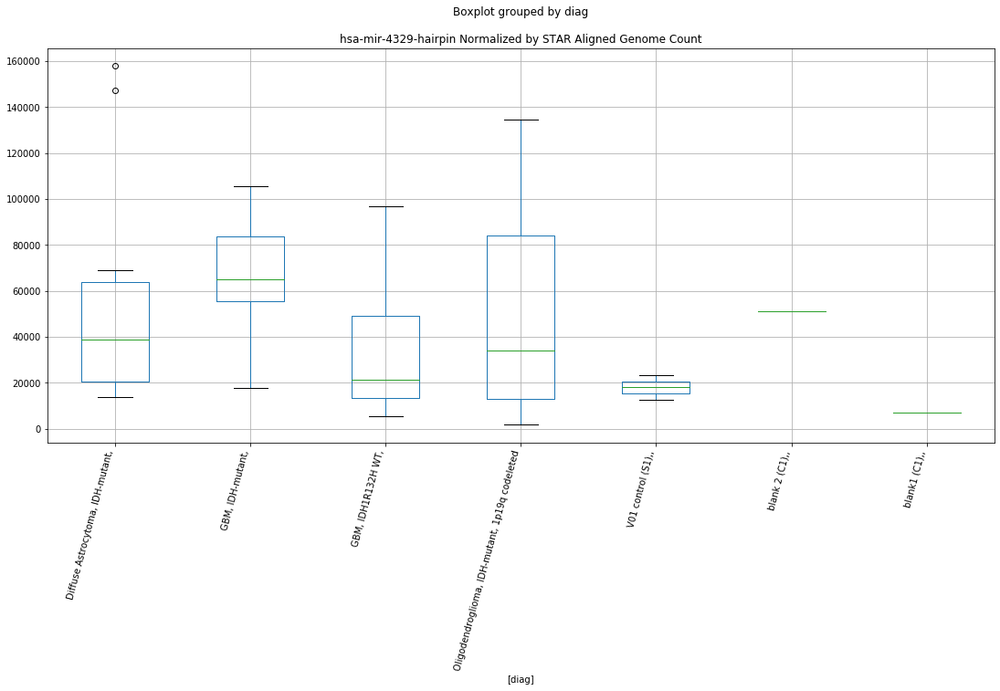

hsa-mir-4329-hairpin D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.7063940537446323
	p = 0.014453990874091691
hsa-mir-4329-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.7063940537446323
	p = 0.014453990874091691
hsa-mir-4329-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -3.5667238738115286
	p = 0.0022044442609659045
hsa-mir-4329-hairpin D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.5667238738115286
	p = 0.0022044442609659045


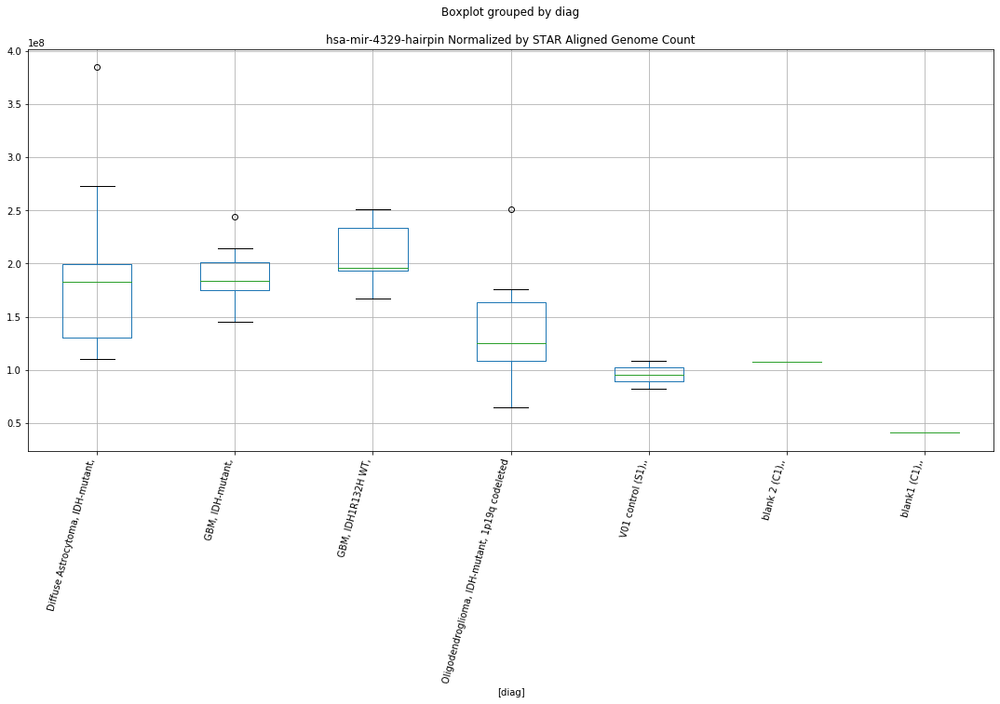

hsa-mir-4329-hairpin D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.700997485330923
	p = 0.014620657695608814
hsa-mir-4329-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.700997485330923
	p = 0.014620657695608814
hsa-mir-4329-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -3.5761427614411394
	p = 0.0021587575745507914
hsa-mir-4329-hairpin D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.5761427614411394
	p = 0.0021587575745507914


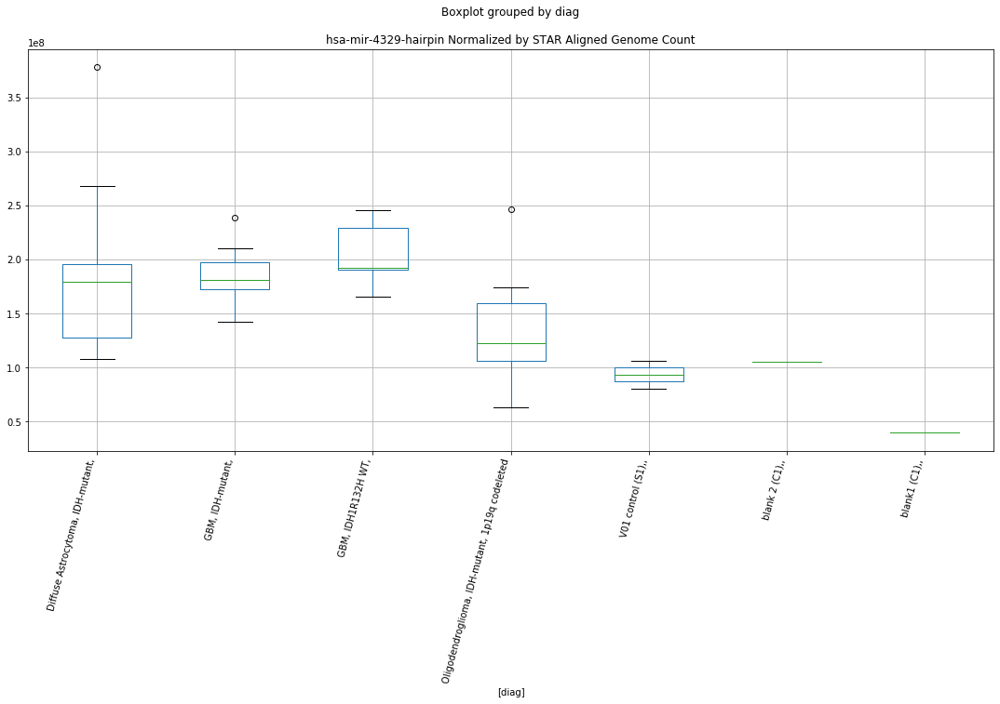

hsa-mir-4329-hairpin D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.592899844706594
	p = 0.018371463848428925
hsa-mir-4329-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.592899844706594
	p = 0.018371463848428925
hsa-mir-4329-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.0175365490093613
	p = 0.05880144521107211
hsa-mir-4329-hairpin D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0175365490093613
	p = 0.05880144521107211


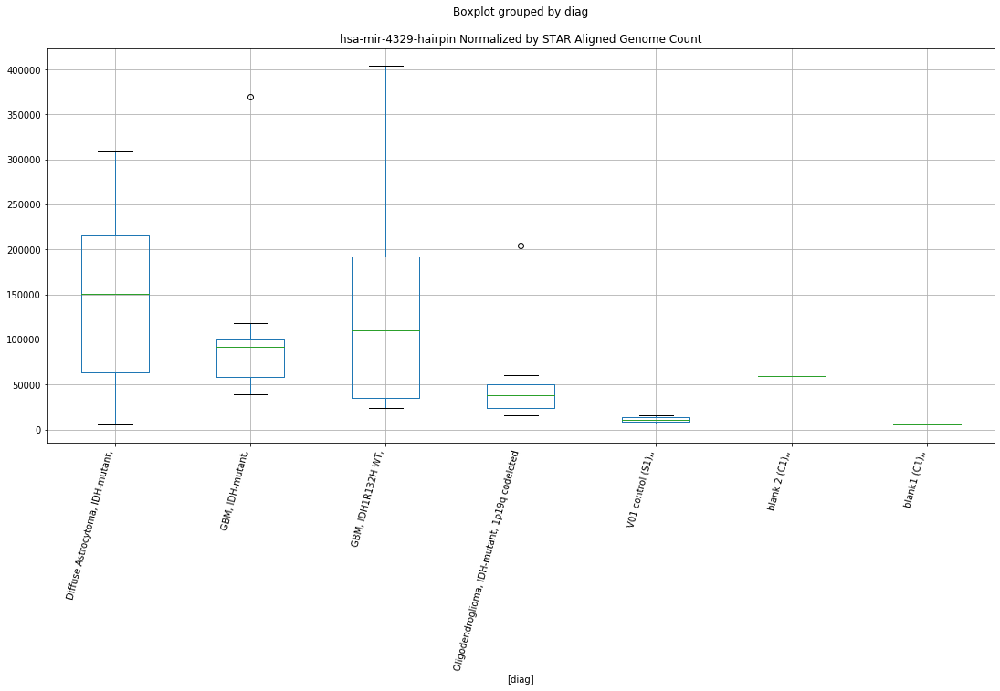

hsa-mir-4329-hairpin D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.582669385965695
	p = 0.01877034549838339
hsa-mir-4329-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.582669385965695
	p = 0.01877034549838339
hsa-mir-4329-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.008082696649703
	p = 0.05988280150329566
hsa-mir-4329-hairpin D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.008082696649703
	p = 0.05988280150329566


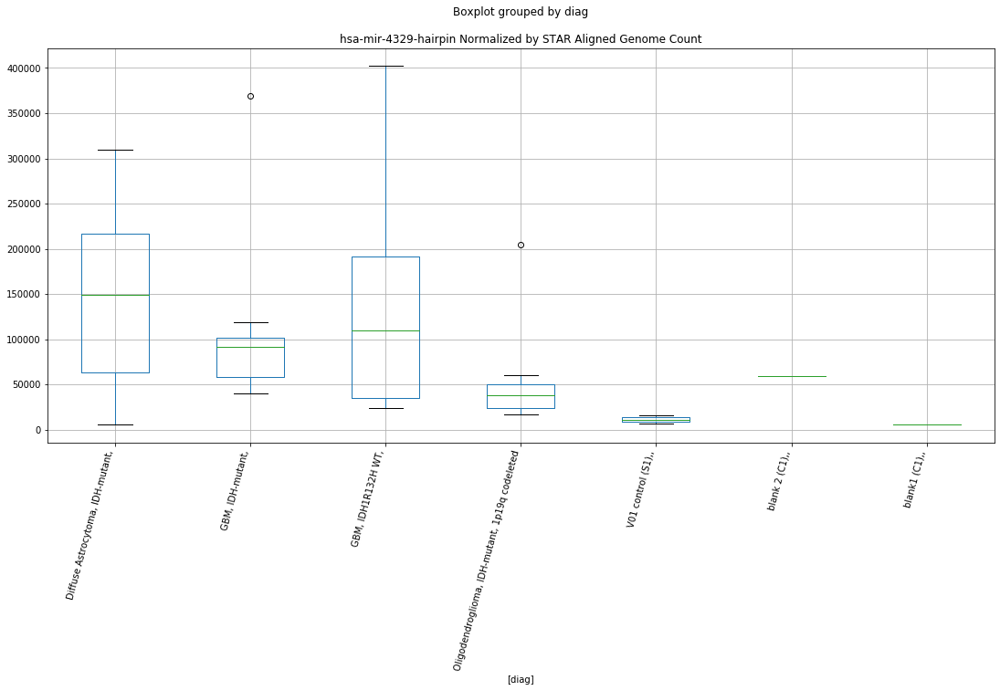

hsa-mir-4329-hairpin D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.5826475539559395
	p = 0.01877120543415154
hsa-mir-4329-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.5826475539559395
	p = 0.01877120543415154
hsa-mir-4329-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.008945674900497
	p = 0.05978335512069938
hsa-mir-4329-hairpin D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.008945674900497
	p = 0.05978335512069938


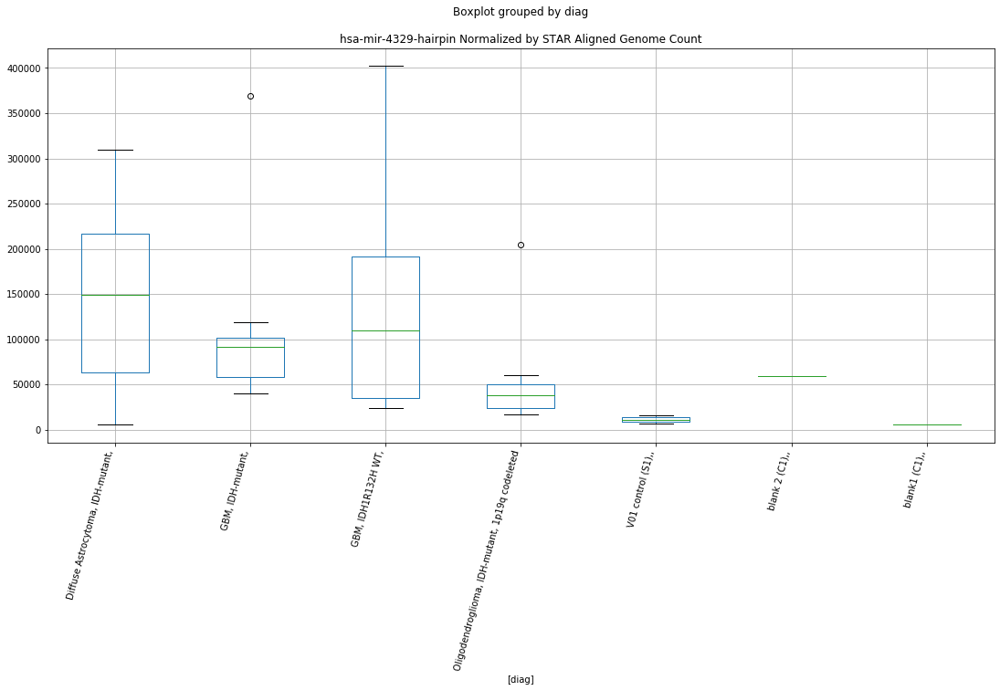

hsa-mir-4329-hairpin Lexogen bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.108390191829901
	p = 0.049273198959709115
hsa-mir-4329-hairpin Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9892077440808953
	p = 0.062095397985351776
hsa-mir-4329-hairpin Lexogen bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.108390191829901
	p = 0.049273198959709115
hsa-mir-4329-hairpin Lexogen bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.9892077440808953
	p = 0.062095397985351776


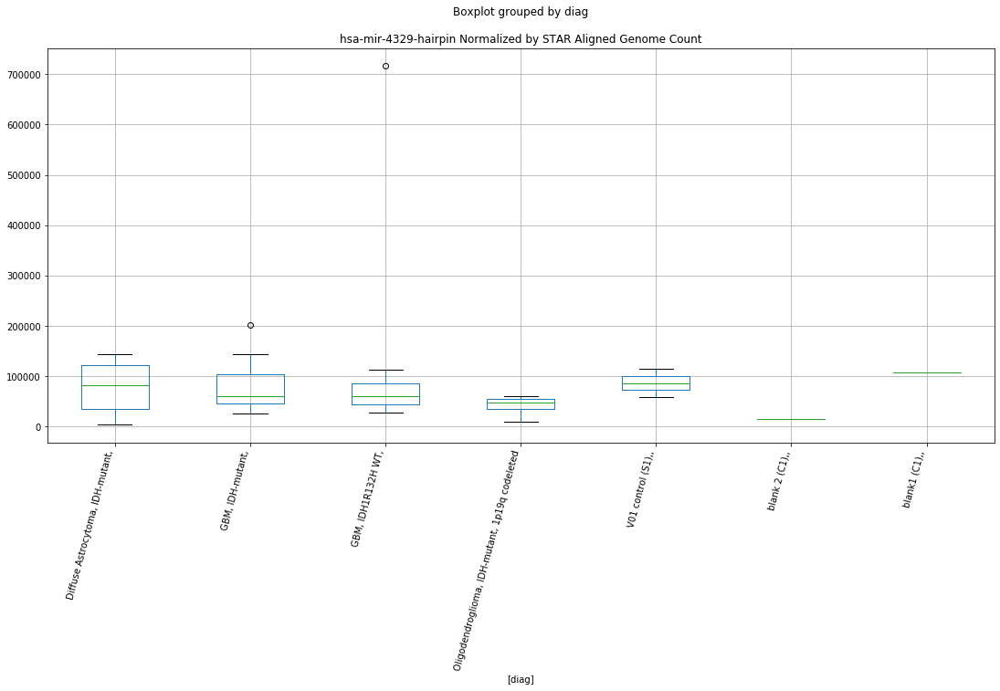

hsa-mir-5588-hairpin D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.478032266986473
	p = 0.0026844943949978447
hsa-mir-5588-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.478032266986473
	p = 0.0026844943949978447
hsa-mir-5588-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.3174560446767627
	p = 0.032459364390689666
hsa-mir-5588-hairpin D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.3174560446767627
	p = 0.032459364390689666


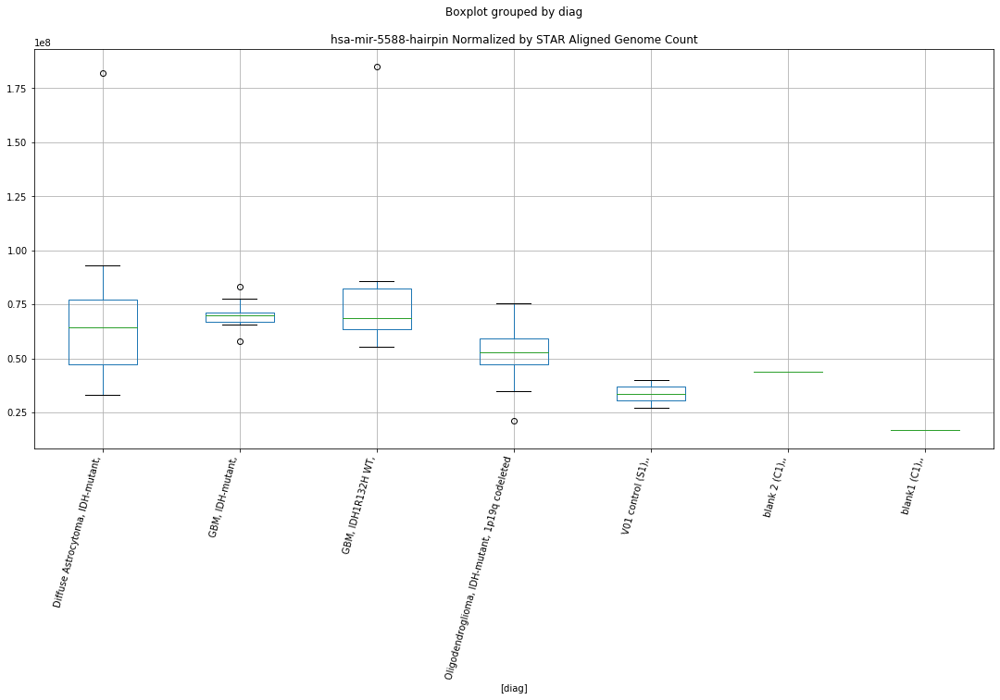

hsa-mir-5588-hairpin D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.479666115291282
	p = 0.0026747780591386467
hsa-mir-5588-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.479666115291282
	p = 0.0026747780591386467
hsa-mir-5588-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.2656114366399764
	p = 0.036045563128766576
hsa-mir-5588-hairpin D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2656114366399764
	p = 0.036045563128766576


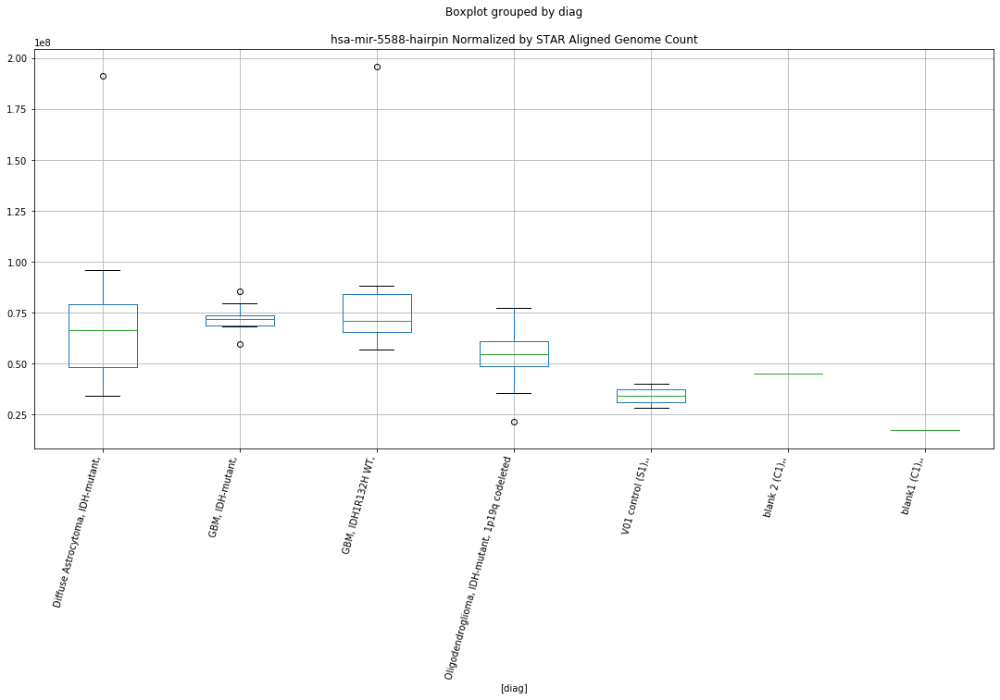

hsa-mir-5588-hairpin D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.081836983005449
	p = 0.05190182566185366
hsa-mir-5588-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.081836983005449
	p = 0.05190182566185366
hsa-mir-5588-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.469718198620818
	p = 0.0237545861235364
hsa-mir-5588-hairpin D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.469718198620818
	p = 0.0237545861235364


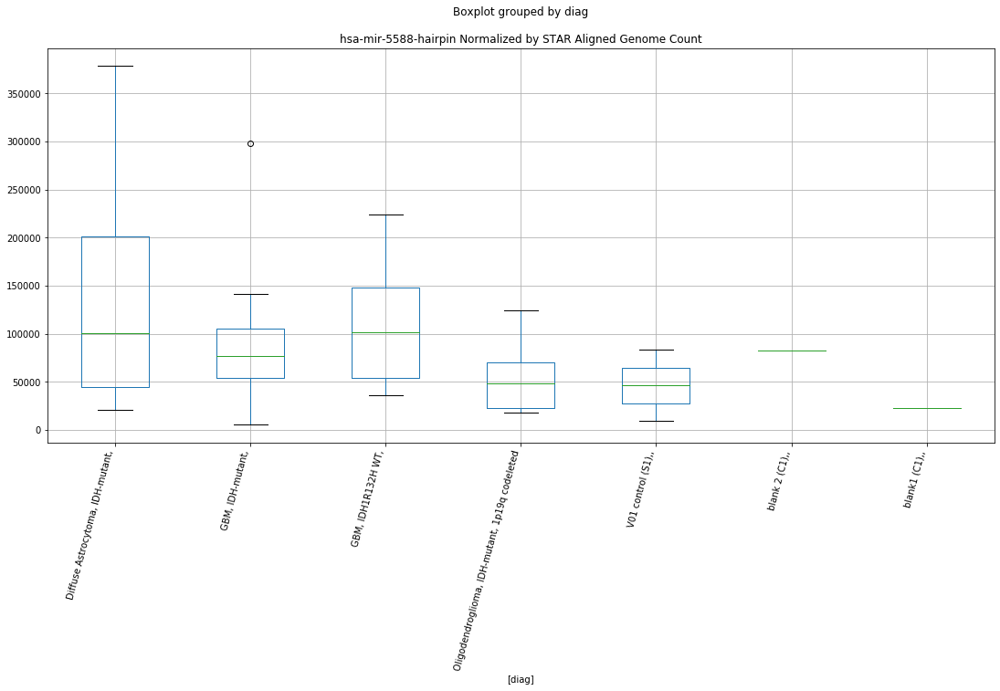

hsa-mir-5588-hairpin D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0770789509022842
	p = 0.05238607329975269
hsa-mir-5588-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.0770789509022842
	p = 0.05238607329975269
hsa-mir-5588-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.451511396314637
	p = 0.024666318592904208
hsa-mir-5588-hairpin D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.451511396314637
	p = 0.024666318592904208


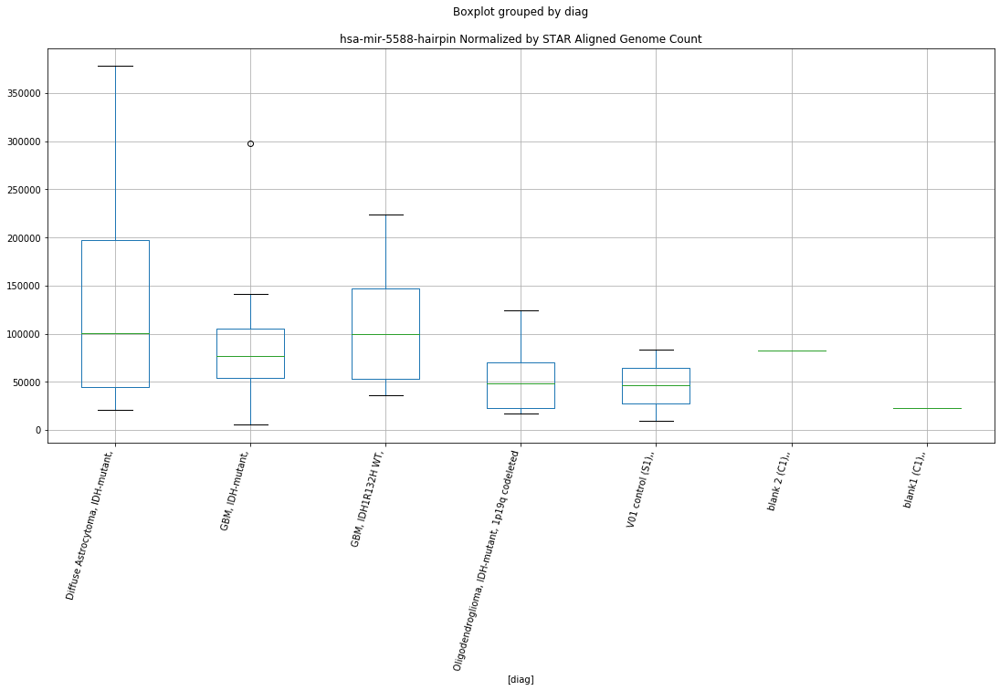

hsa-mir-5588-hairpin D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.077106429717227
	p = 0.052383264928981314
hsa-mir-5588-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.077106429717227
	p = 0.052383264928981314
hsa-mir-5588-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.451552514869294
	p = 0.02466422298093972
hsa-mir-5588-hairpin D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.451552514869294
	p = 0.02466422298093972


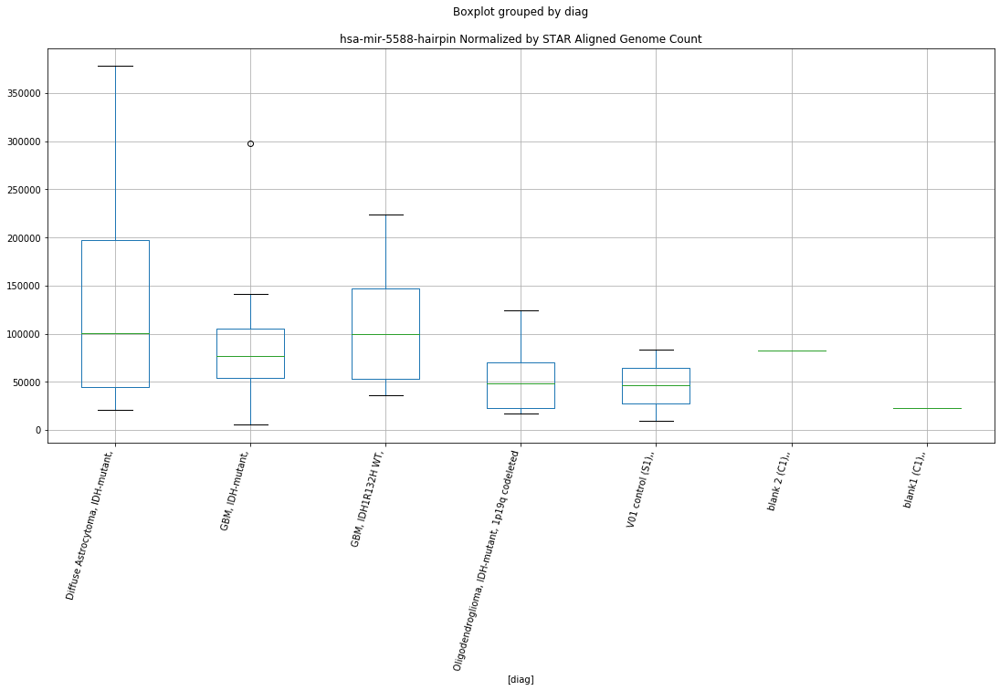

hsa-mir-92b-hairpin D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.966855213052955
	p = 0.008259162926538754
hsa-mir-92b-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.966855213052955
	p = 0.008259162926538754
hsa-mir-92b-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.061552953501248
	p = 0.05399484191215116
hsa-mir-92b-hairpin D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.061552953501248
	p = 0.05399484191215116


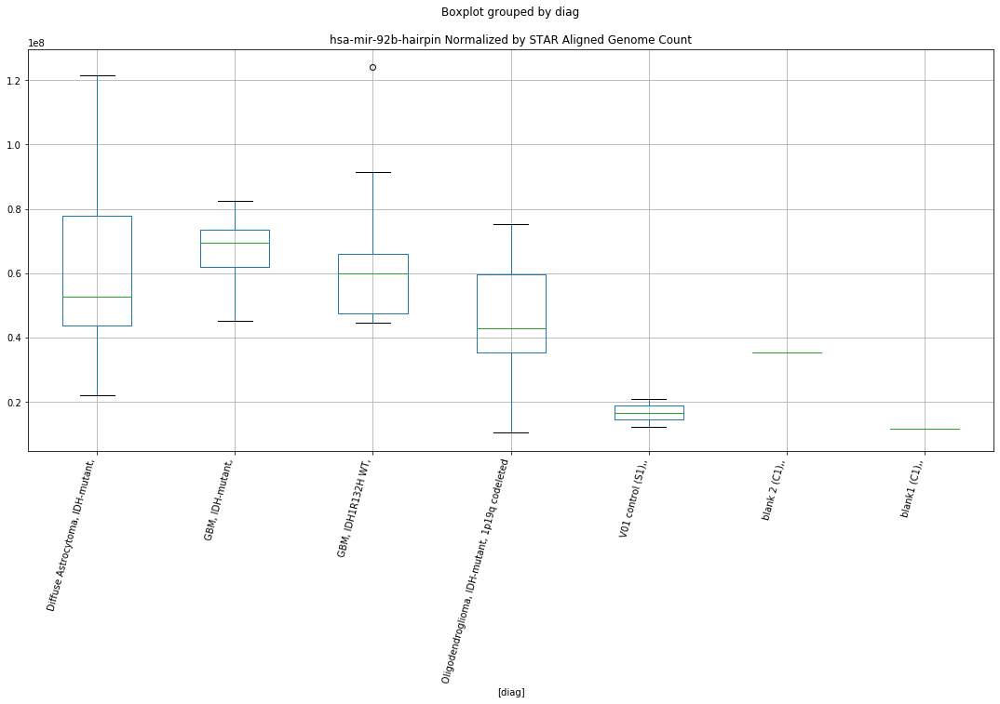

hsa-mir-92b-hairpin D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.9920309842152153
	p = 0.0078197214816625
hsa-mir-92b-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.9920309842152153
	p = 0.0078197214816625
hsa-mir-92b-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.076967444949868
	p = 0.05239747075440134
hsa-mir-92b-hairpin D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.076967444949868
	p = 0.05239747075440134


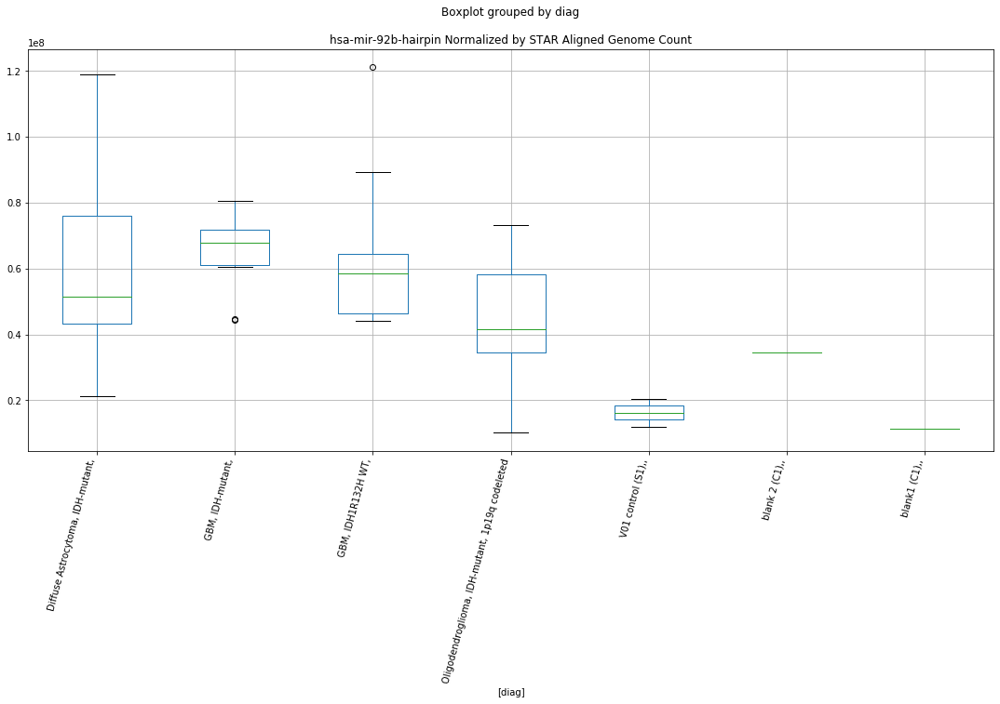

hsa-mir-92b-hairpin D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.590906625491727
	p = 0.01844854267122187
hsa-mir-92b-hairpin D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.7922587631508633
	p = 0.012034646579681264
hsa-mir-92b-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.590906625491727
	p = 0.01844854267122187
hsa-mir-92b-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.7922587631508633
	p = 0.012034646579681264
hsa-mir-92b-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.2619551285095483
	p = 0.036311830497828906
hsa-mir-92b-hairpin D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2619551285095483
	p = 0.036311830497828906


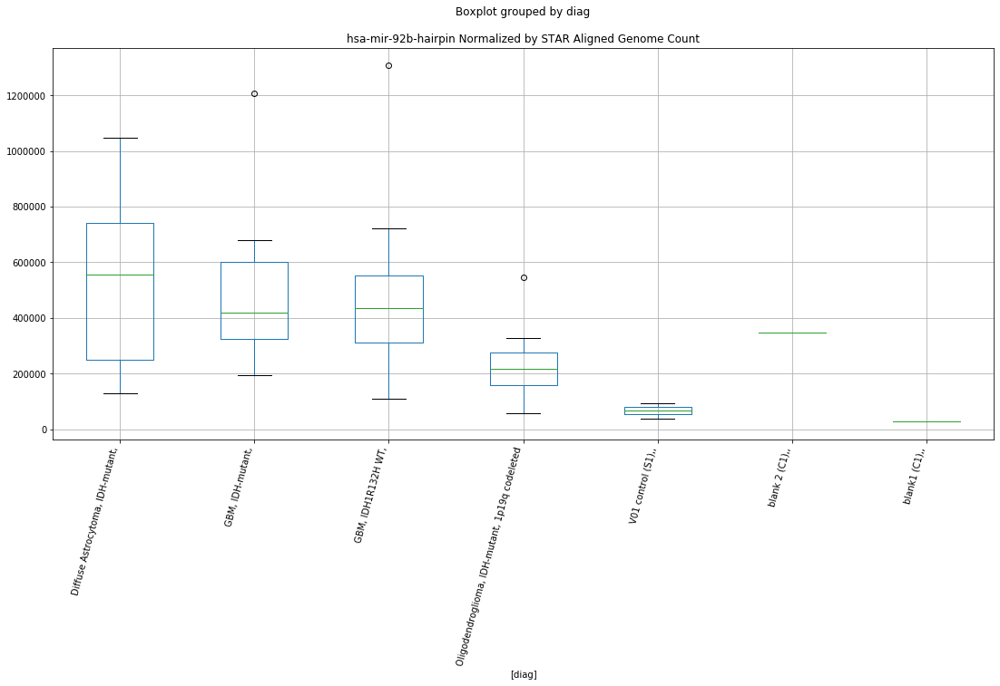

hsa-mir-92b-hairpin D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.5850948682533677
	p = 0.01867504094986597
hsa-mir-92b-hairpin D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.7855418687183673
	p = 0.012208951577503489
hsa-mir-92b-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.5850948682533677
	p = 0.01867504094986597
hsa-mir-92b-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.7855418687183673
	p = 0.012208951577503489
hsa-mir-92b-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.247258806394155
	p = 0.03740050705407249
hsa-mir-92b-hairpin D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.247258806394155
	p = 0.03740050705407249


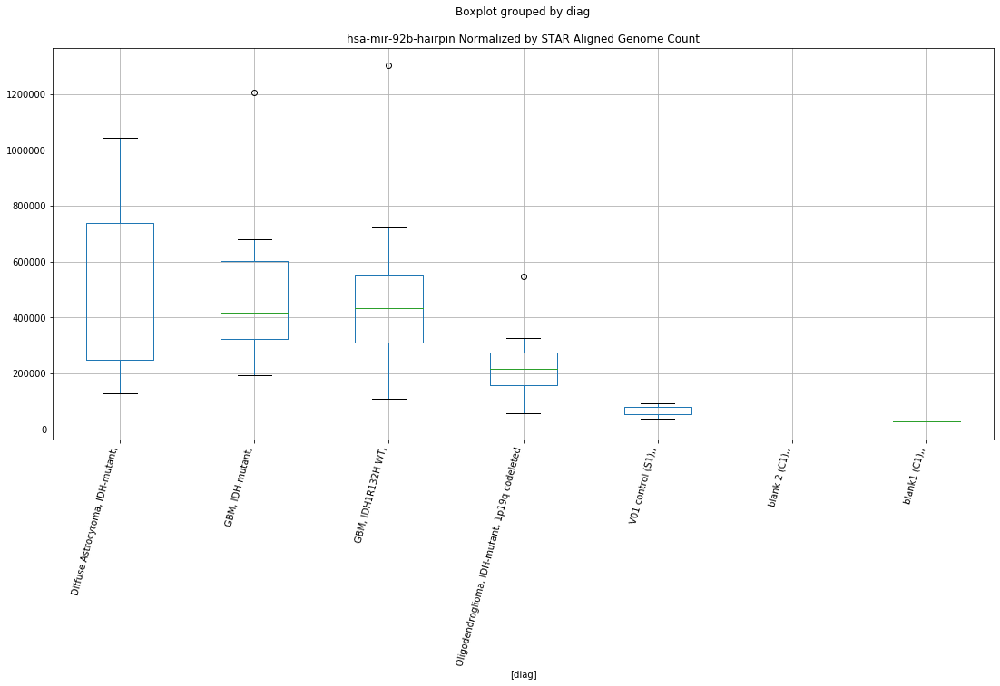

hsa-mir-92b-hairpin D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.5854525547736187
	p = 0.018661025236660255
hsa-mir-92b-hairpin D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.7854930418371686
	p = 0.012210227476688136
hsa-mir-92b-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.5854525547736187
	p = 0.018661025236660255
hsa-mir-92b-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.7854930418371686
	p = 0.012210227476688136
hsa-mir-92b-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.2472391486514436
	p = 0.03740198322617172
hsa-mir-92b-hairpin D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2472391486514436
	p = 0.03740198322617172


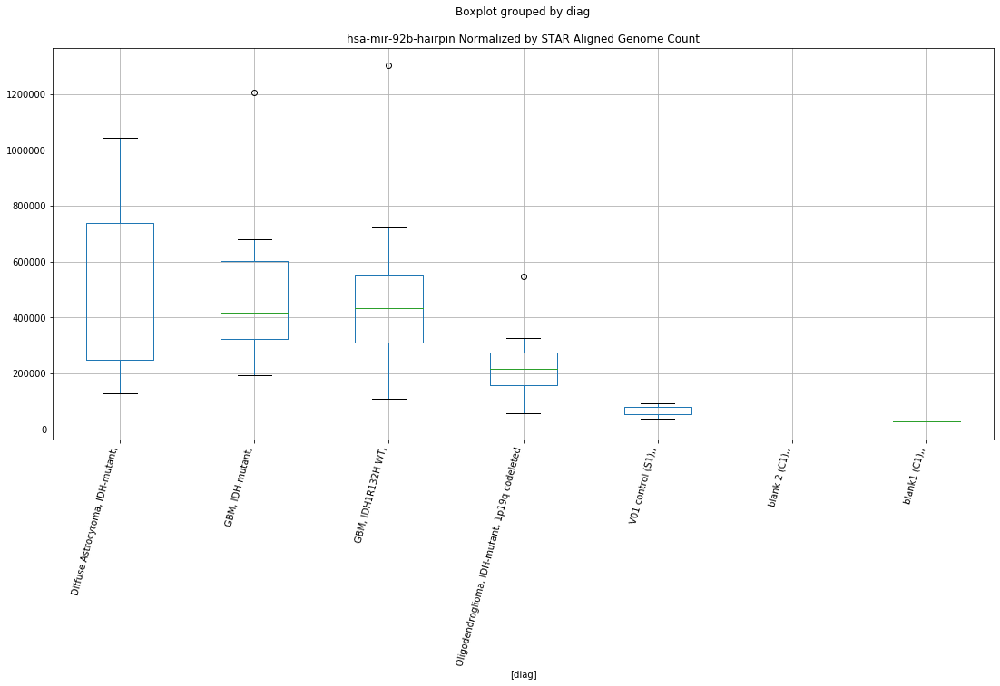

hsa-mir-4271-hairpin D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9835359909303547
	p = 0.06277445178095022
hsa-mir-4271-hairpin D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9835359909303547
	p = 0.06277445178095022


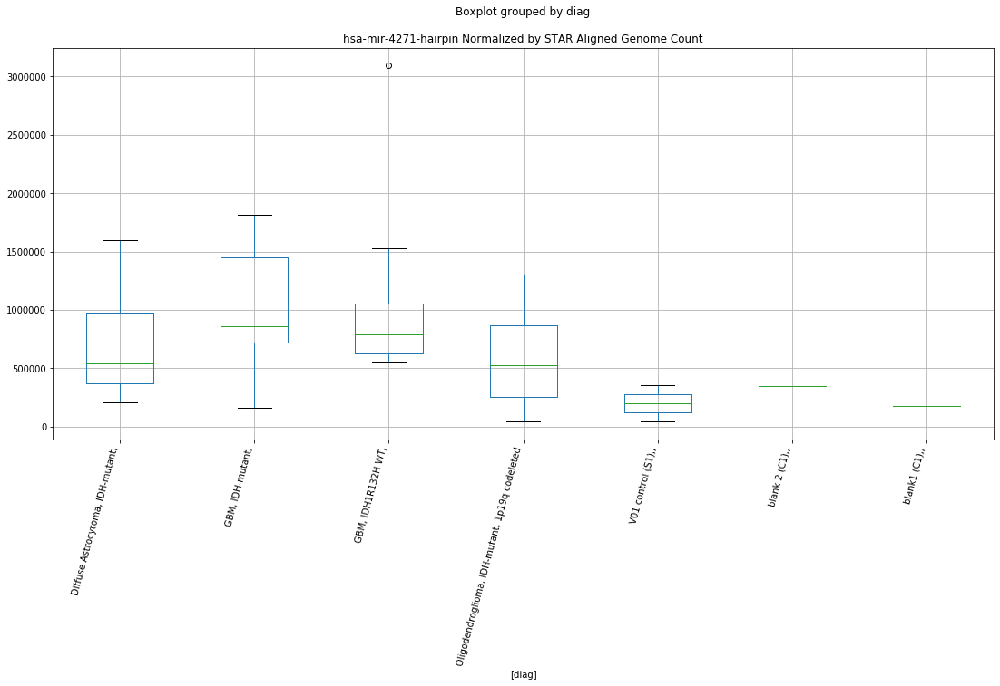

hsa-mir-4271-hairpin D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.368710057795924
	p = 0.003420404009673653
hsa-mir-4271-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.368710057795924
	p = 0.003420404009673653


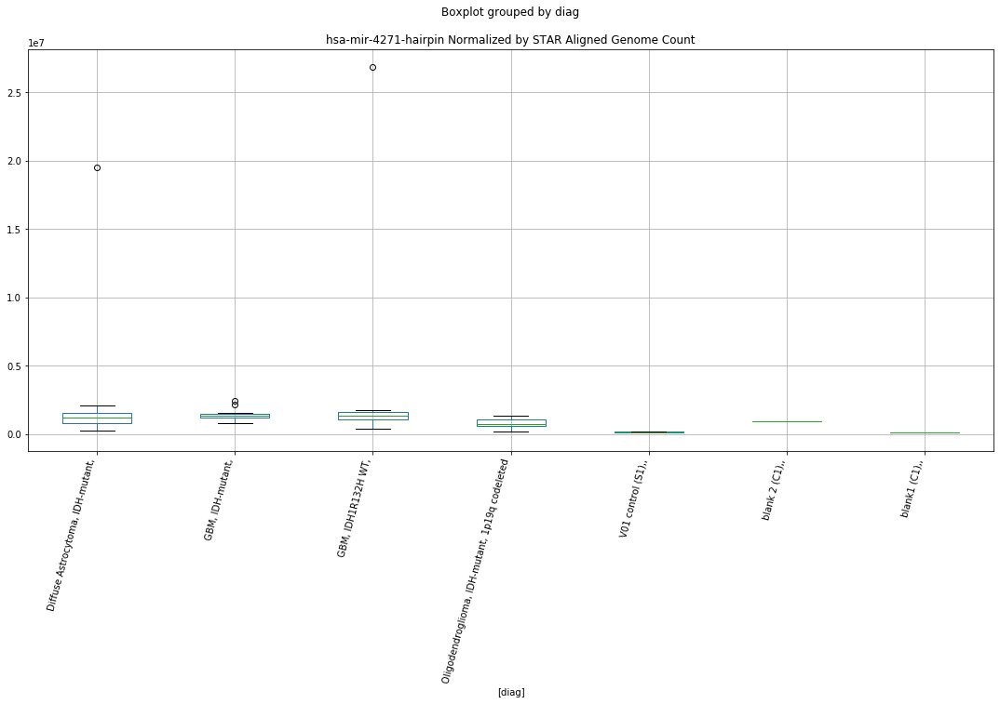

hsa-mir-4271-hairpin D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.3615644414437194
	p = 0.003474904776056632
hsa-mir-4271-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.3615644414437194
	p = 0.003474904776056632


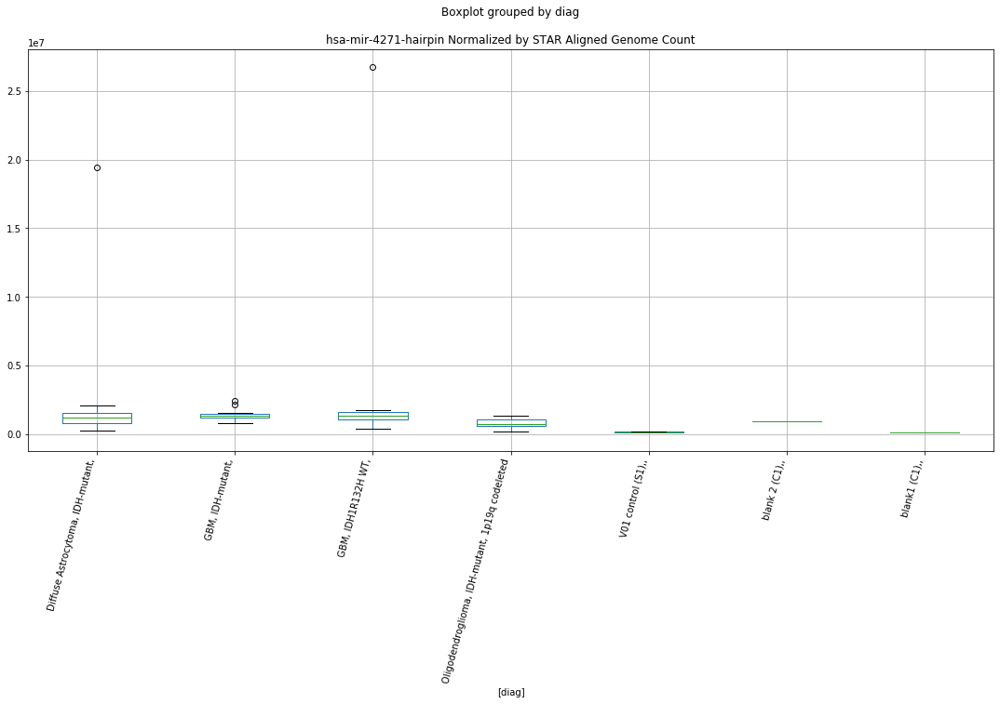

hsa-mir-4271-hairpin D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.36151379640995
	p = 0.0034752940920679577
hsa-mir-4271-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.36151379640995
	p = 0.0034752940920679577


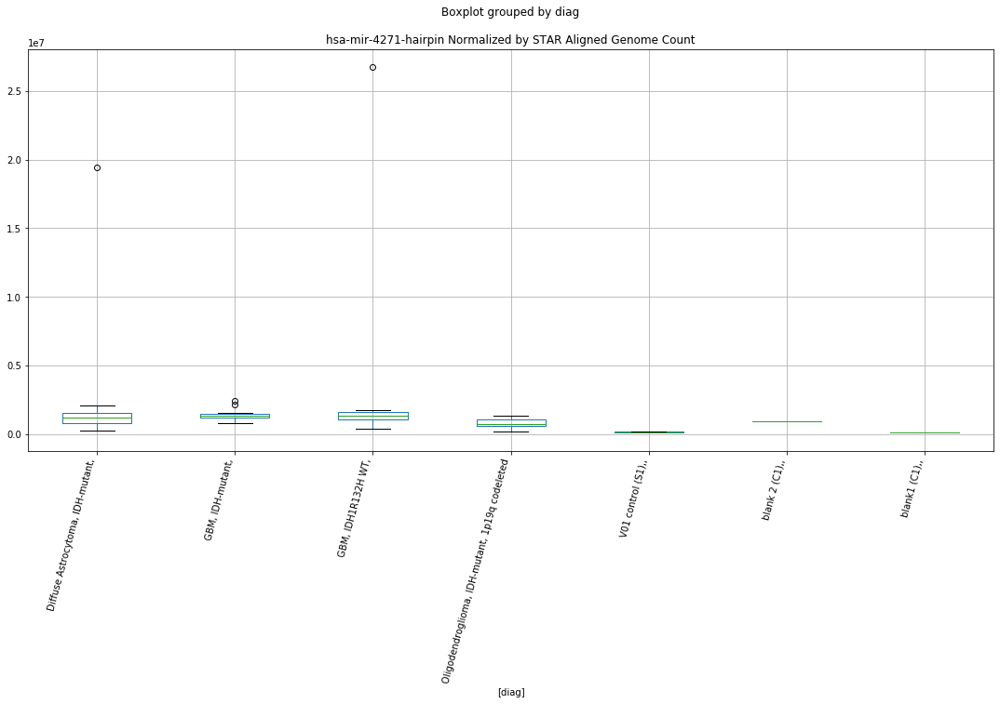

hsa-mir-548u-hairpin D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.385499560373918
	p = 0.028254601806202748
hsa-mir-548u-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.385499560373918
	p = 0.028254601806202748
hsa-mir-548u-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -3.083114260398031
	p = 0.006411716024970116
hsa-mir-548u-hairpin D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.083114260398031
	p = 0.006411716024970116


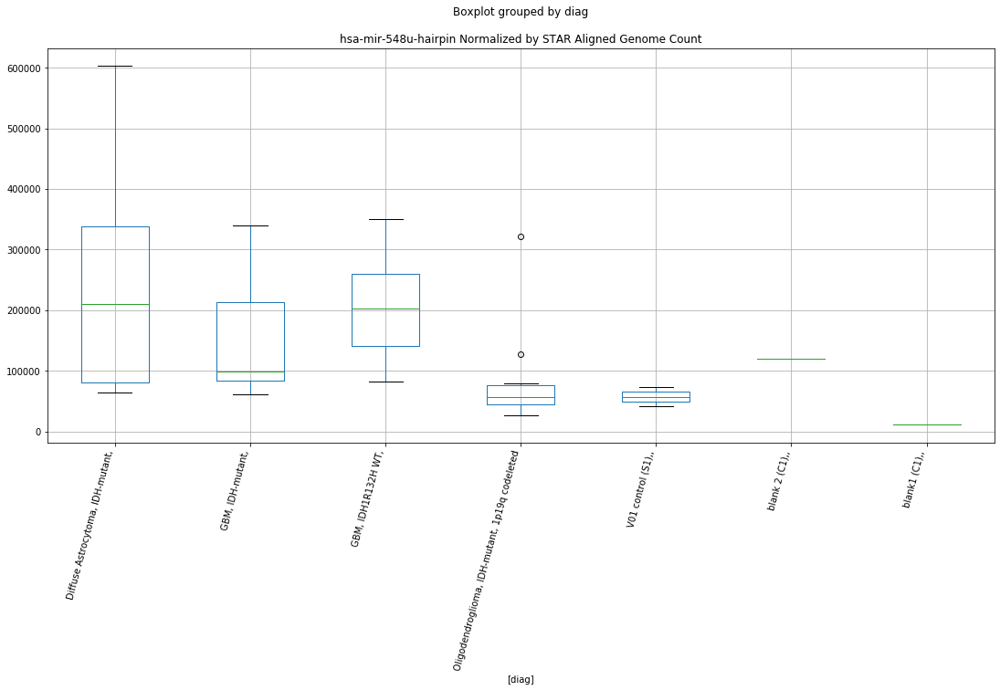

hsa-mir-548u-hairpin D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.3770384004023652
	p = 0.028748313821099925
hsa-mir-548u-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.3770384004023652
	p = 0.028748313821099925
hsa-mir-548u-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -3.055398096931716
	p = 0.006811754807278913
hsa-mir-548u-hairpin D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.055398096931716
	p = 0.006811754807278913


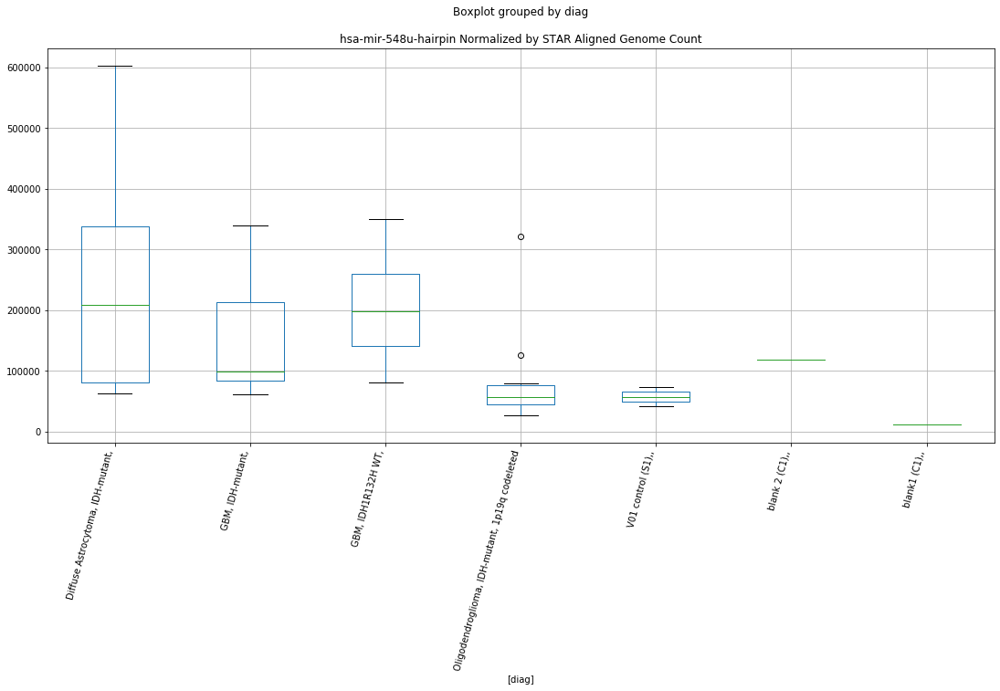

hsa-mir-548u-hairpin D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.3770506363474477
	p = 0.028747594070063248
hsa-mir-548u-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.3770506363474477
	p = 0.028747594070063248
hsa-mir-548u-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -3.055413175290462
	p = 0.006811530704675299
hsa-mir-548u-hairpin D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.055413175290462
	p = 0.006811530704675299


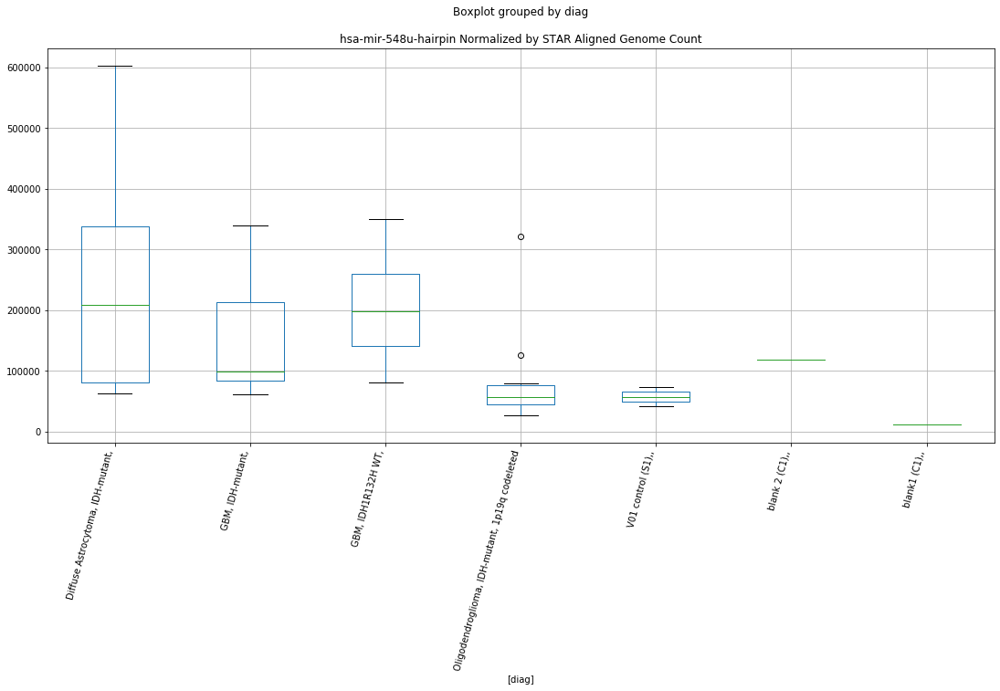

hsa-mir-1260a-hairpin D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.1930609811801602
	p = 0.04168065064969964
hsa-mir-1260a-hairpin D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.1930609811801602
	p = 0.04168065064969964


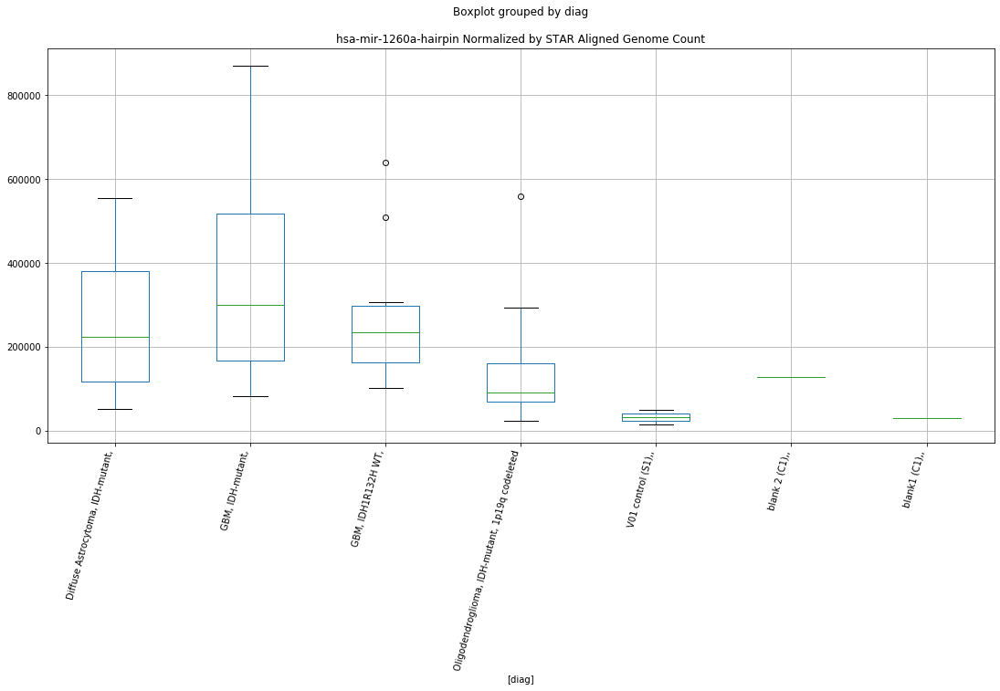

hsa-mir-1260a-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9676692398839806
	p = 0.06470959728252364
hsa-mir-1260a-hairpin D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9676692398839806
	p = 0.06470959728252364


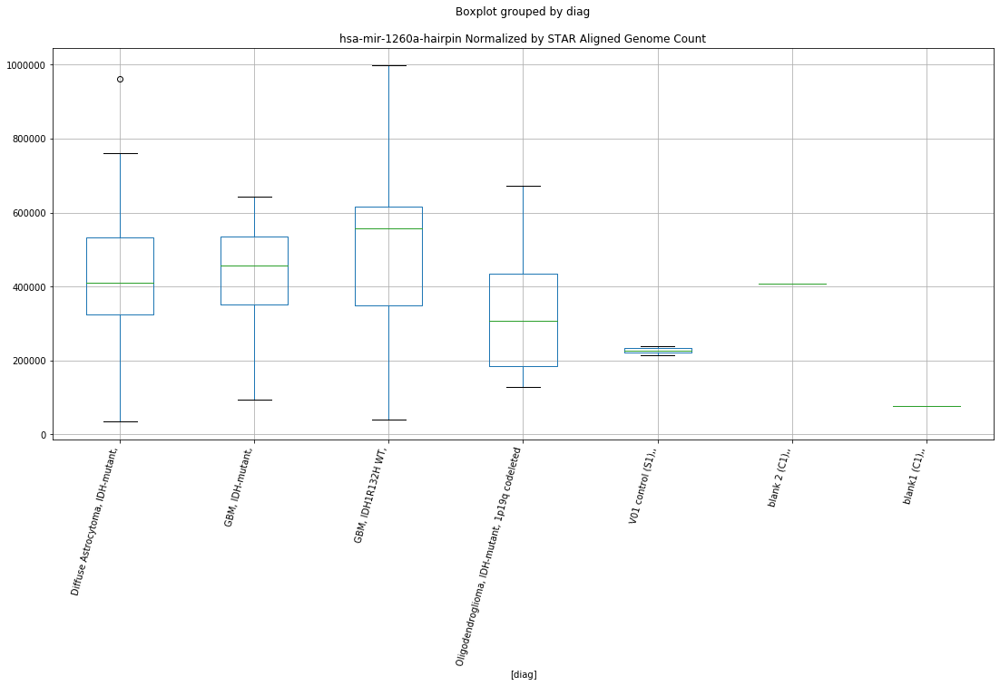

hsa-mir-1260a-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9677218011149535
	p = 0.06470309961067962
hsa-mir-1260a-hairpin D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9677218011149535
	p = 0.06470309961067962


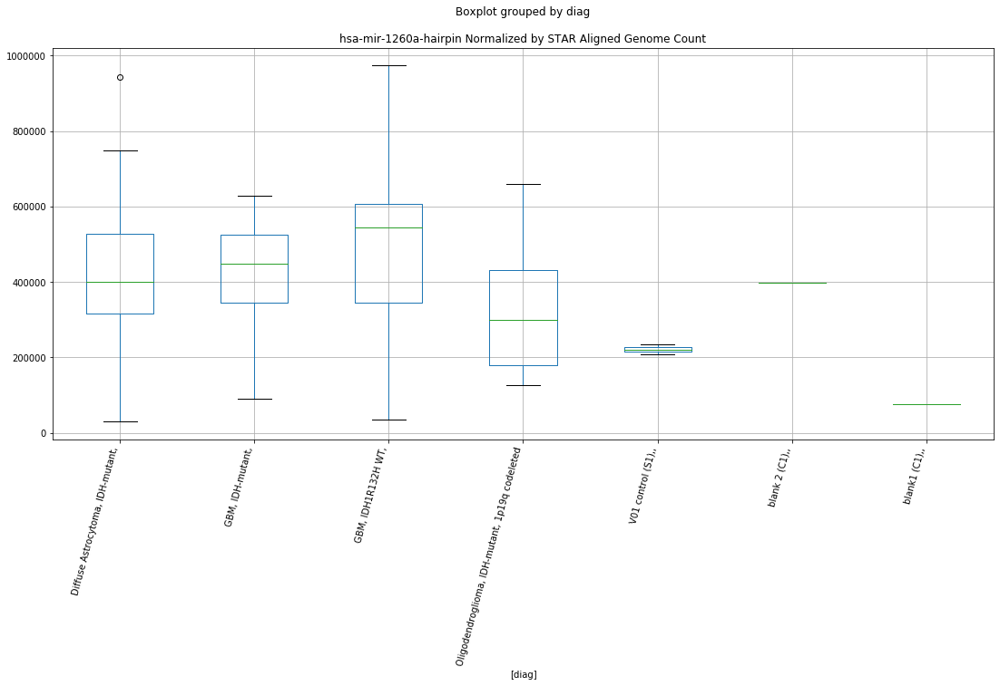

hsa-mir-4538-hairpin D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.238095029950508
	p = 0.03809450527650481
hsa-mir-4538-hairpin D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.238095029950508
	p = 0.03809450527650481


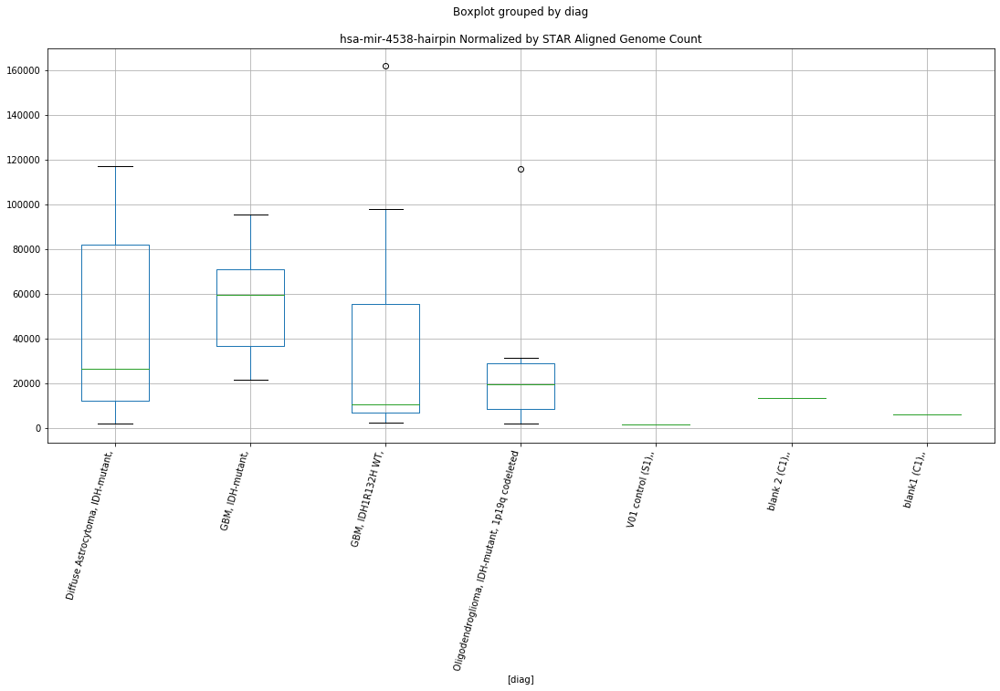

hsa-mir-3908-hairpin D-plex bbduk1 : GBM, IDH-mutant, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.863034505598609
	p = 0.07885878935274425
hsa-mir-3908-hairpin D-plex bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH-mutant,
	t = -1.863034505598609
	p = 0.07885878935274425


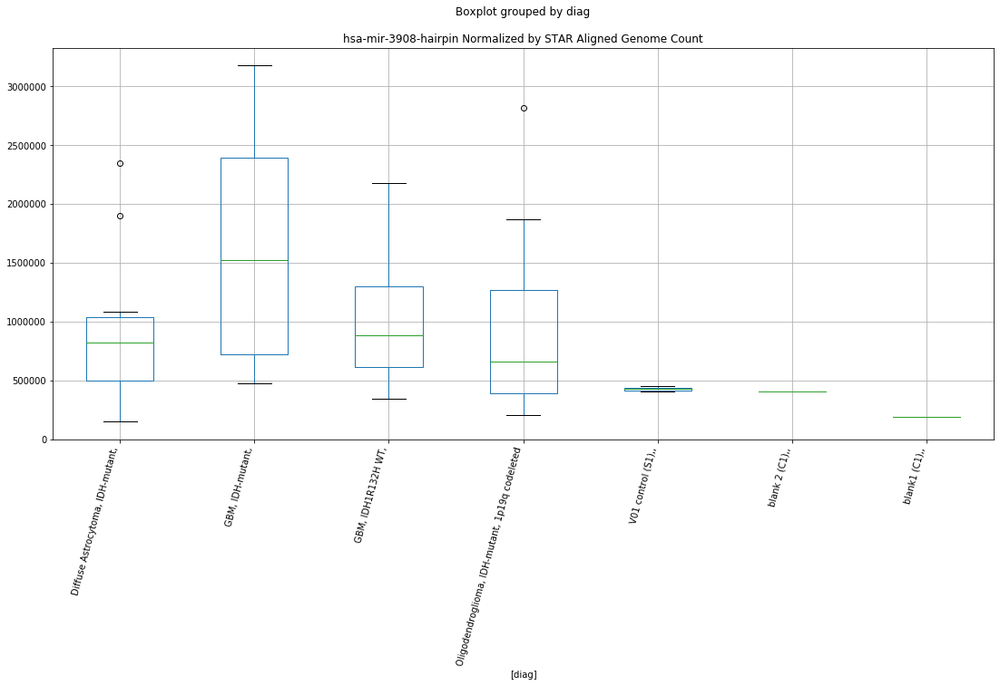

hsa-mir-3908-hairpin D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9189326294290716
	p = 0.07099138334177772
hsa-mir-3908-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9189326294290716
	p = 0.07099138334177772
hsa-mir-3908-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.600060115676122
	p = 0.01809708481267876
hsa-mir-3908-hairpin D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.600060115676122
	p = 0.01809708481267876


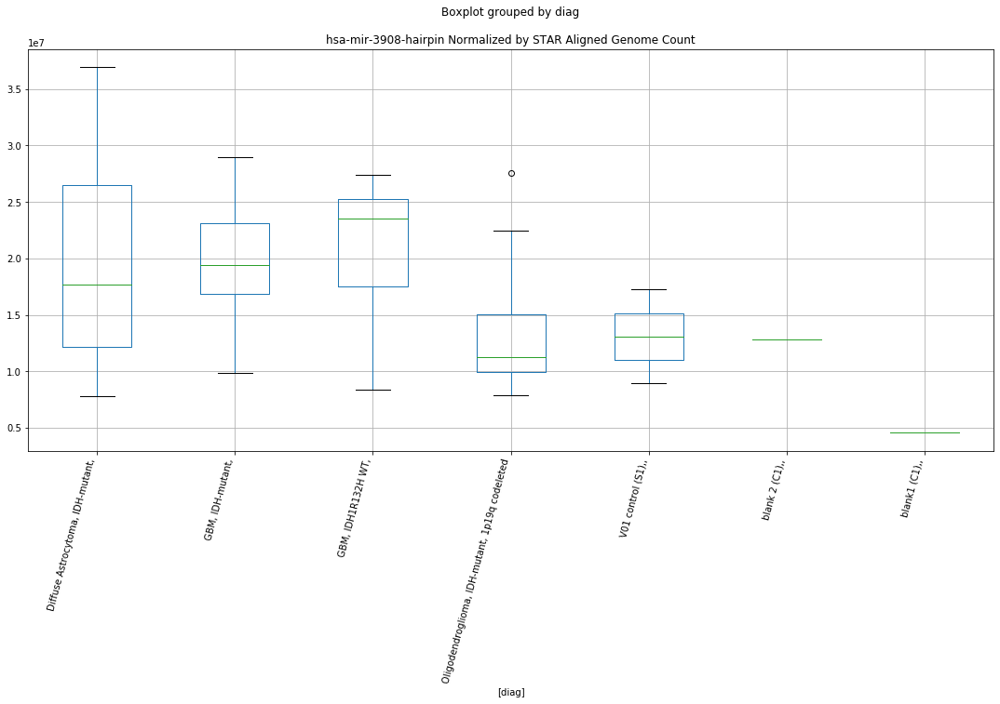

hsa-mir-3908-hairpin D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9645900477492646
	p = 0.06509127040211643
hsa-mir-3908-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9645900477492646
	p = 0.06509127040211643
hsa-mir-3908-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.644104945370491
	p = 0.016493019944747323
hsa-mir-3908-hairpin D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.644104945370491
	p = 0.016493019944747323


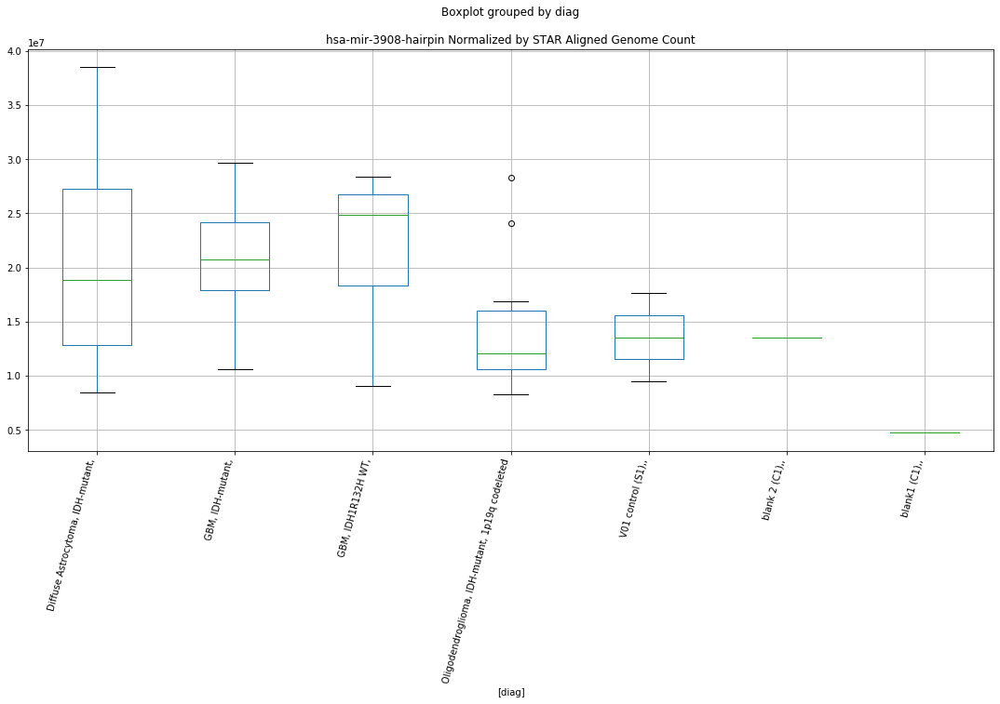

hsa-mir-3613-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9631723839095705
	p = 0.06526766910286076
hsa-mir-3613-hairpin D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9631723839095705
	p = 0.06526766910286076


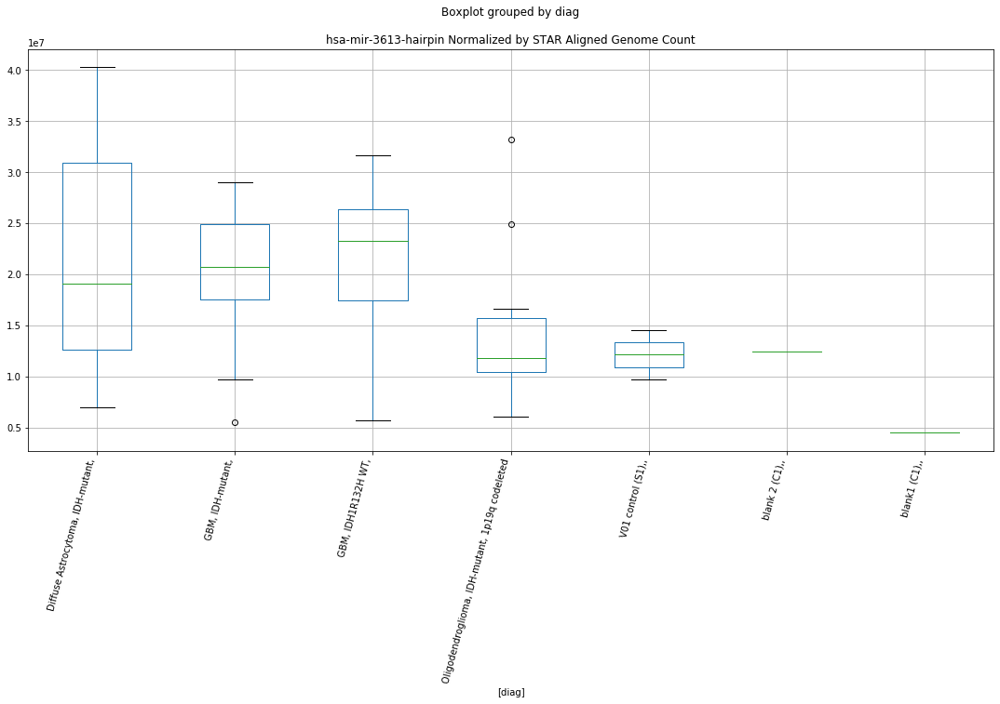

hsa-mir-3613-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.962932267467847
	p = 0.06529758888384139
hsa-mir-3613-hairpin D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.962932267467847
	p = 0.06529758888384139


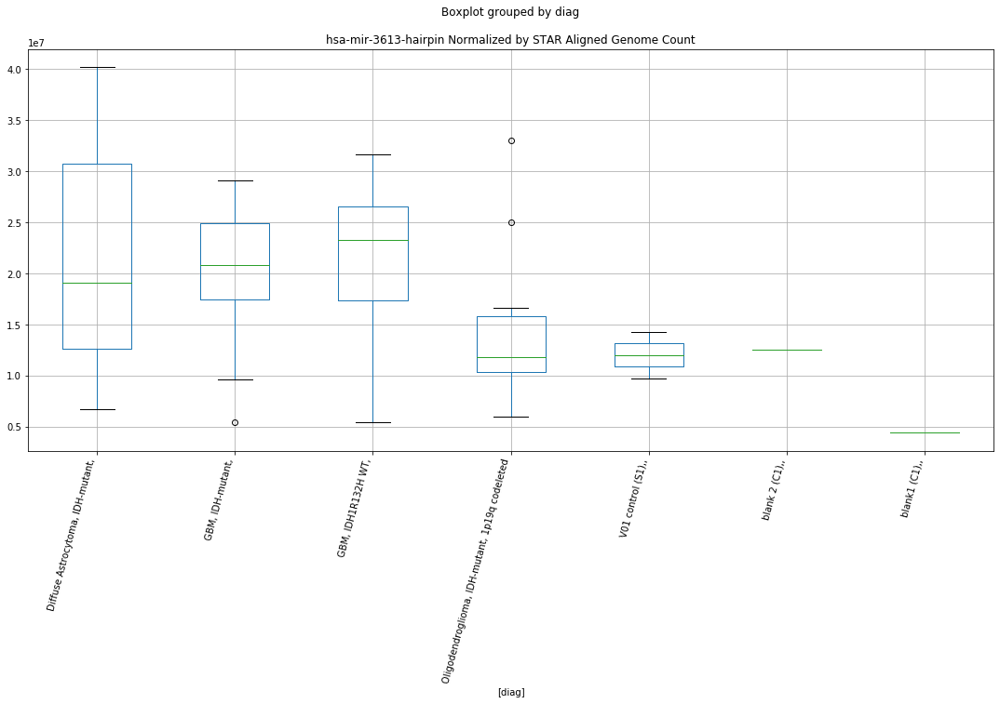

hsa-mir-3613-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.3330238637537843
	p = 0.03144894290199223
hsa-mir-3613-hairpin D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.3330238637537843
	p = 0.03144894290199223


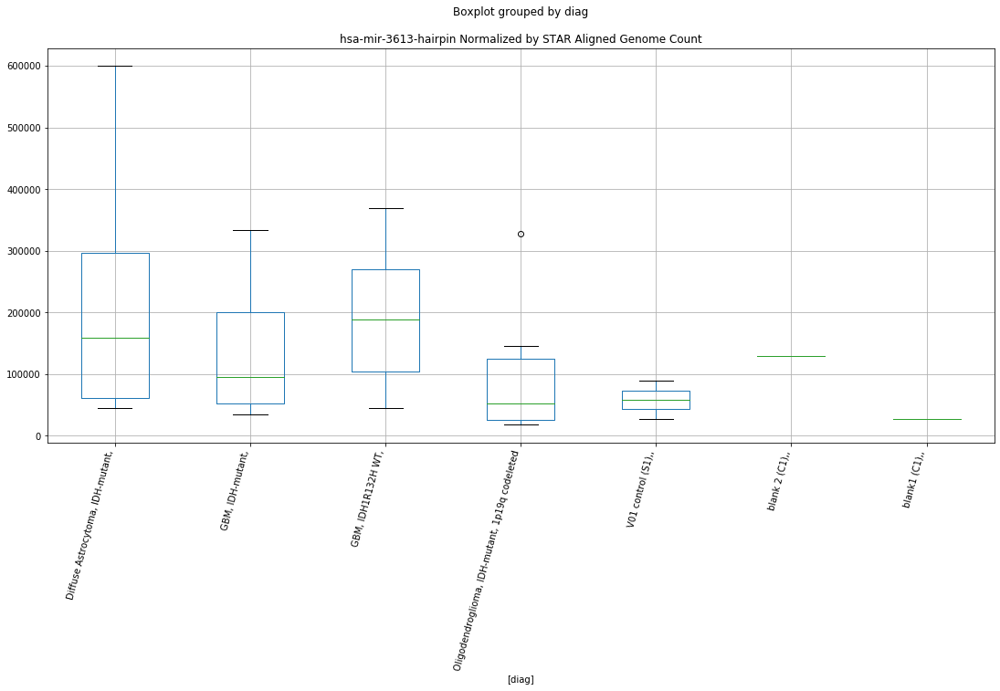

hsa-mir-3613-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.311161699067045
	p = 0.03287639021338292
hsa-mir-3613-hairpin D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.311161699067045
	p = 0.03287639021338292


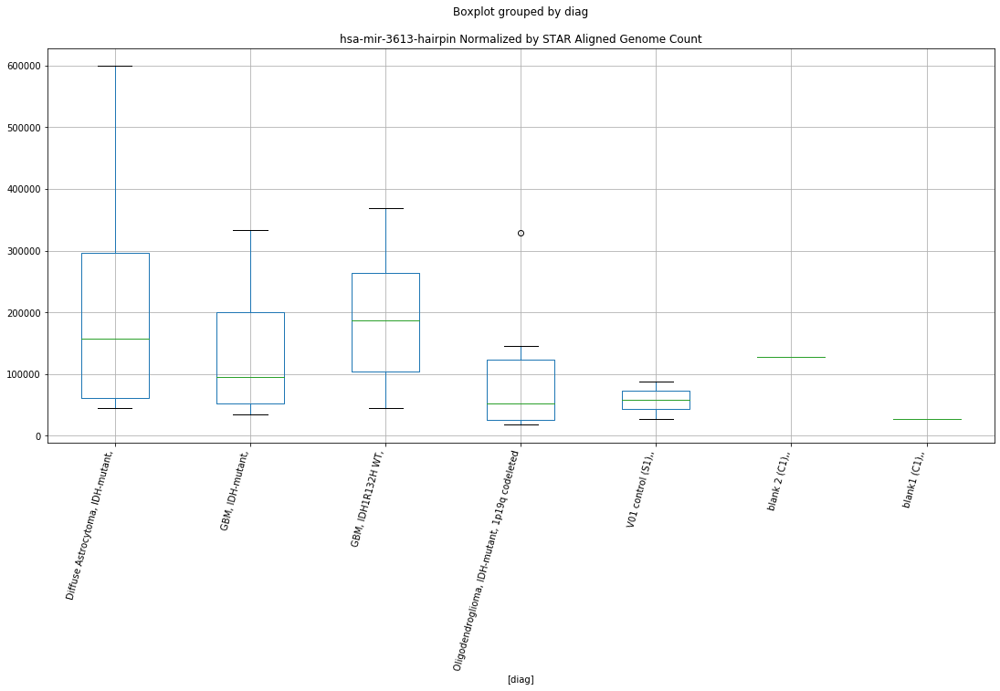

hsa-mir-3613-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.3156114870255475
	p = 0.0325810622486492
hsa-mir-3613-hairpin D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.3156114870255475
	p = 0.0325810622486492


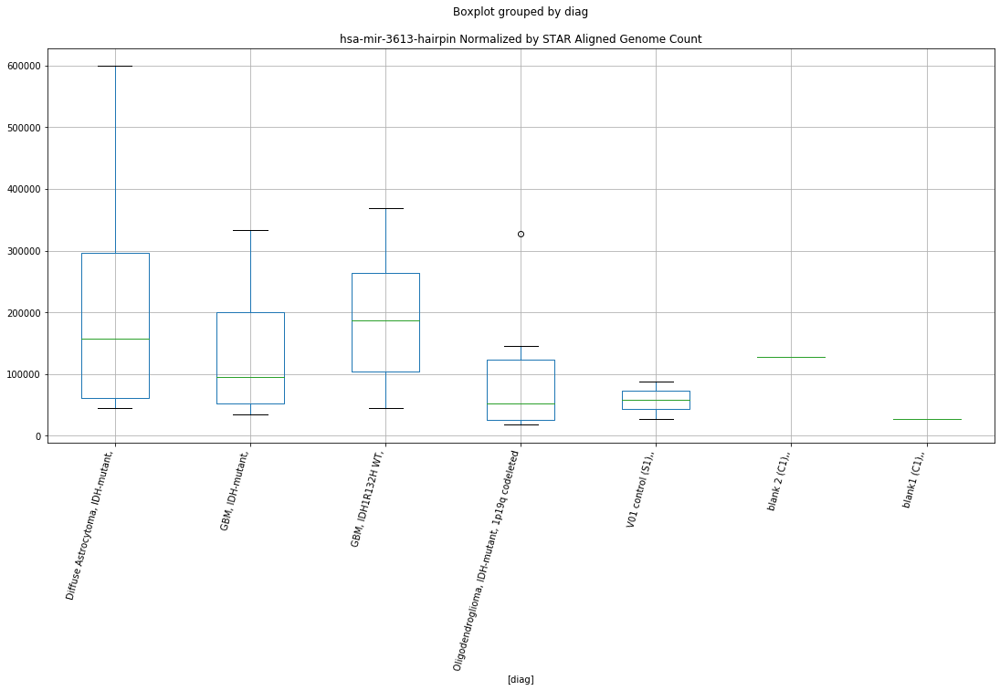

hsa-mir-8086-hairpin D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8837883499804742
	p = 0.07585205768905008
hsa-mir-8086-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8837883499804742
	p = 0.07585205768905008


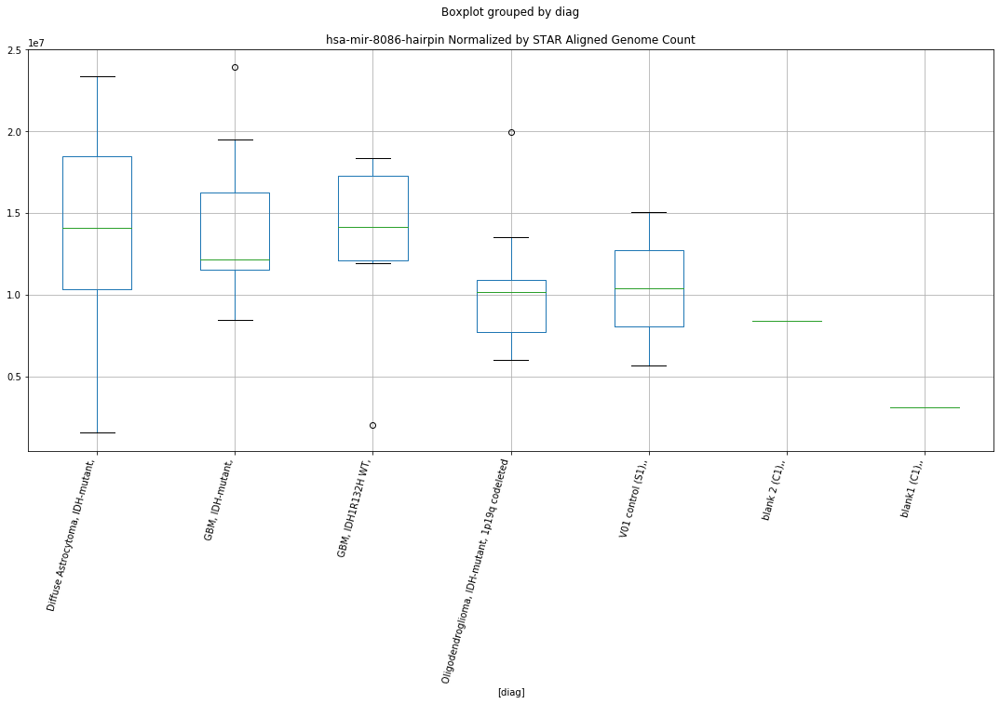

hsa-mir-8086-hairpin D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8813603305401287
	p = 0.07619850384174193
hsa-mir-8086-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8813603305401287
	p = 0.07619850384174193


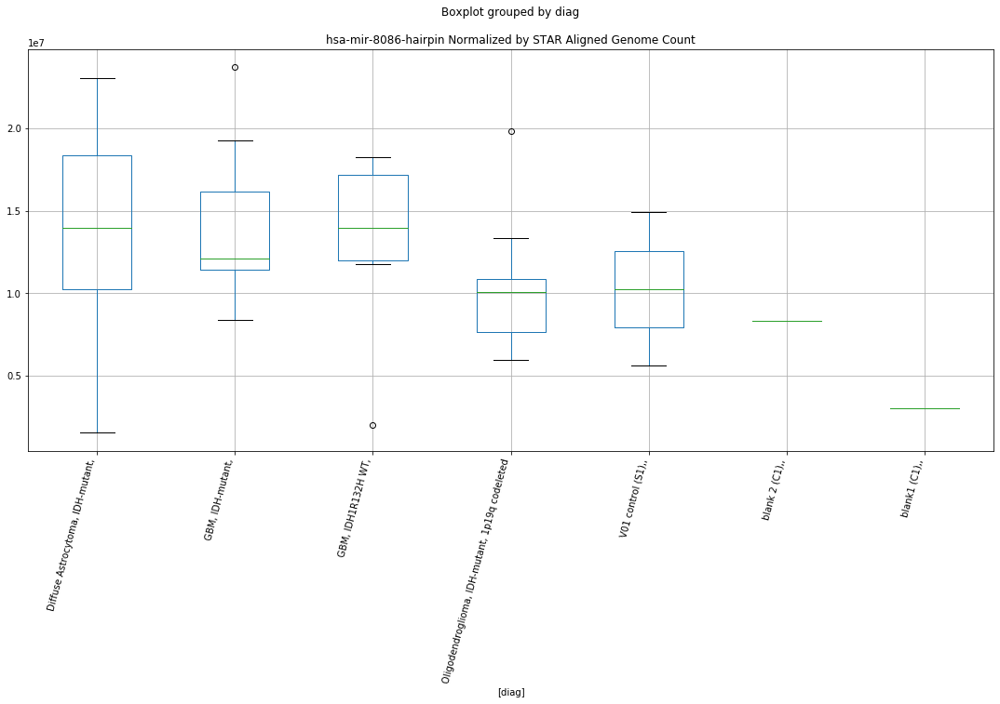

hsa-mir-4668-hairpin D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.762428278681622
	p = 0.012827458380502619
hsa-mir-4668-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.762428278681622
	p = 0.012827458380502619
hsa-mir-4668-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.6258183131266475
	p = 0.017141863291627615
hsa-mir-4668-hairpin D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.6258183131266475
	p = 0.017141863291627615


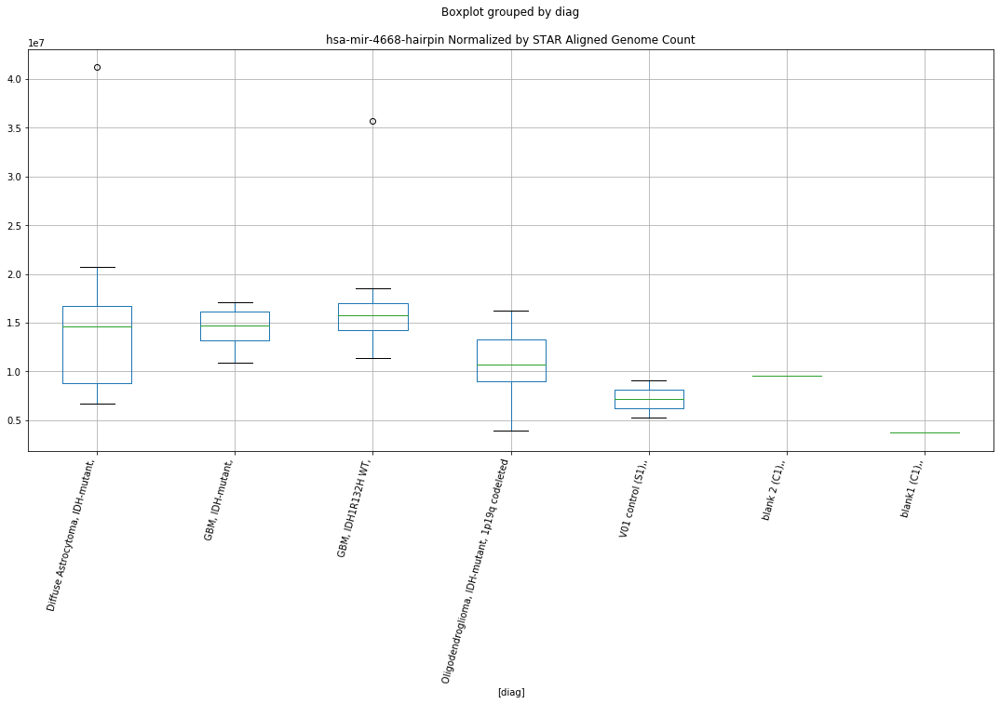

hsa-mir-4668-hairpin D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.734663791708393
	p = 0.013610171669015996
hsa-mir-4668-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.734663791708393
	p = 0.013610171669015996
hsa-mir-4668-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.6867901223333437
	p = 0.01506825782711103
hsa-mir-4668-hairpin D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.6867901223333437
	p = 0.01506825782711103


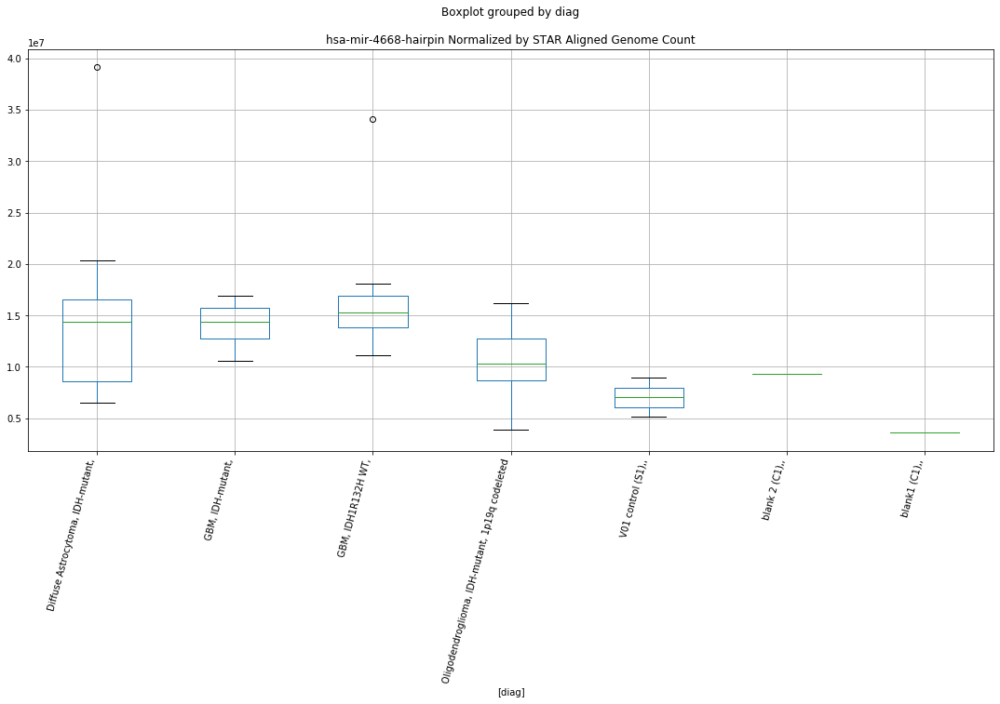

hsa-mir-4668-hairpin D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0843428084569493
	p = 0.05164843120405477
hsa-mir-4668-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.0843428084569493
	p = 0.05164843120405477
hsa-mir-4668-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.2801529697007954
	p = 0.035004353924355774
hsa-mir-4668-hairpin D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2801529697007954
	p = 0.035004353924355774


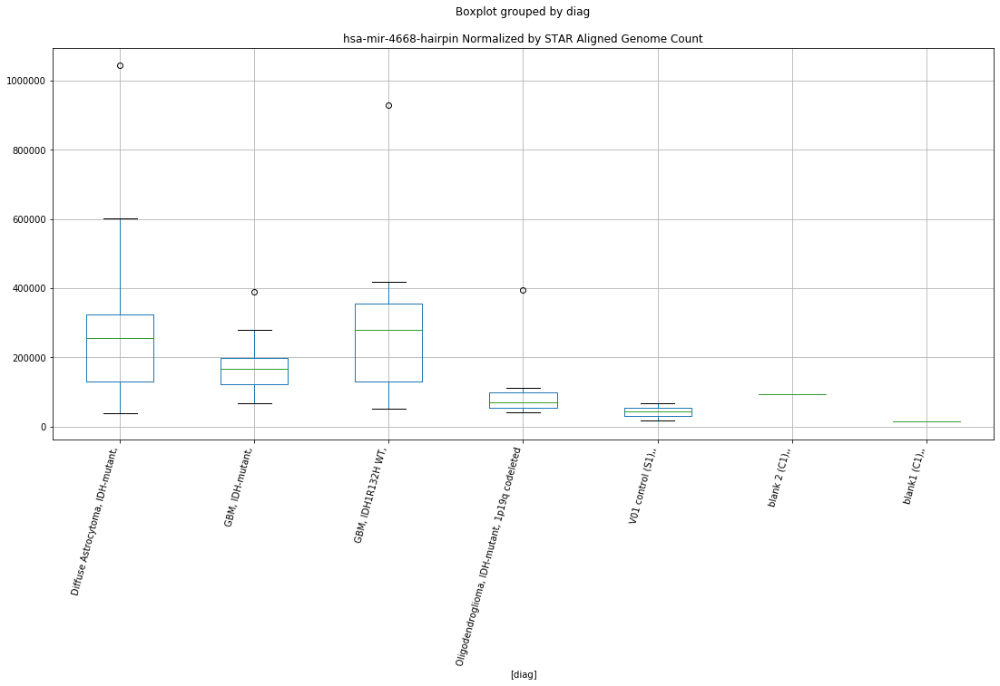

hsa-mir-4668-hairpin D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0808170091379323
	p = 0.052005290121522246
hsa-mir-4668-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.0808170091379323
	p = 0.052005290121522246
hsa-mir-4668-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.2682311452786634
	p = 0.03585589603853507
hsa-mir-4668-hairpin D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2682311452786634
	p = 0.03585589603853507


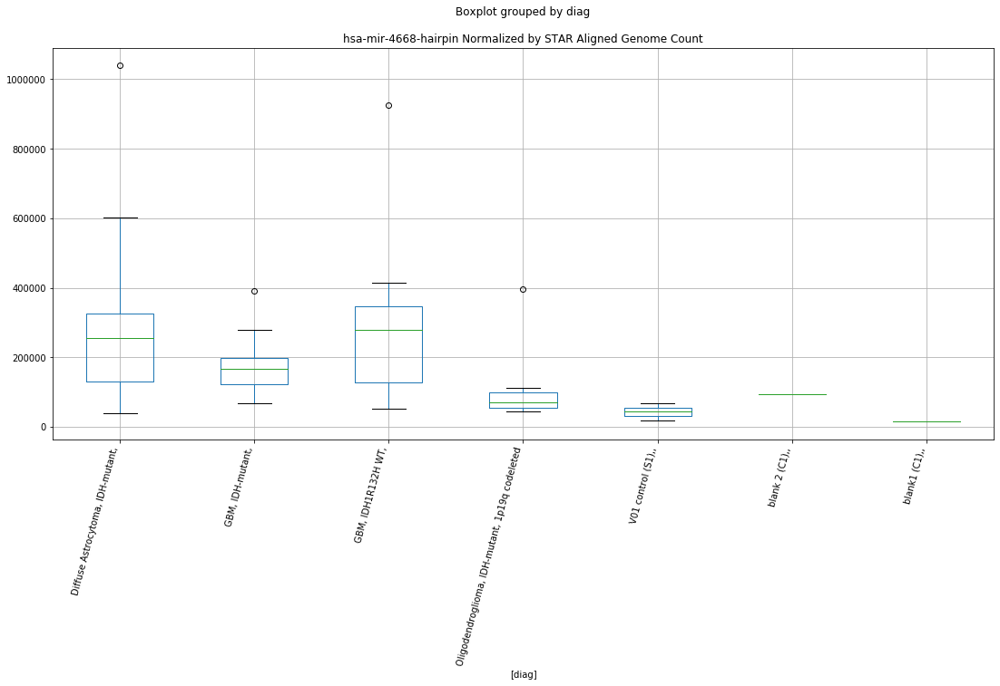

hsa-mir-4668-hairpin D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0807751819674283
	p = 0.05200953699029415
hsa-mir-4668-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.0807751819674283
	p = 0.05200953699029415
hsa-mir-4668-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.268665228949387
	p = 0.03582455759032638
hsa-mir-4668-hairpin D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.268665228949387
	p = 0.03582455759032638


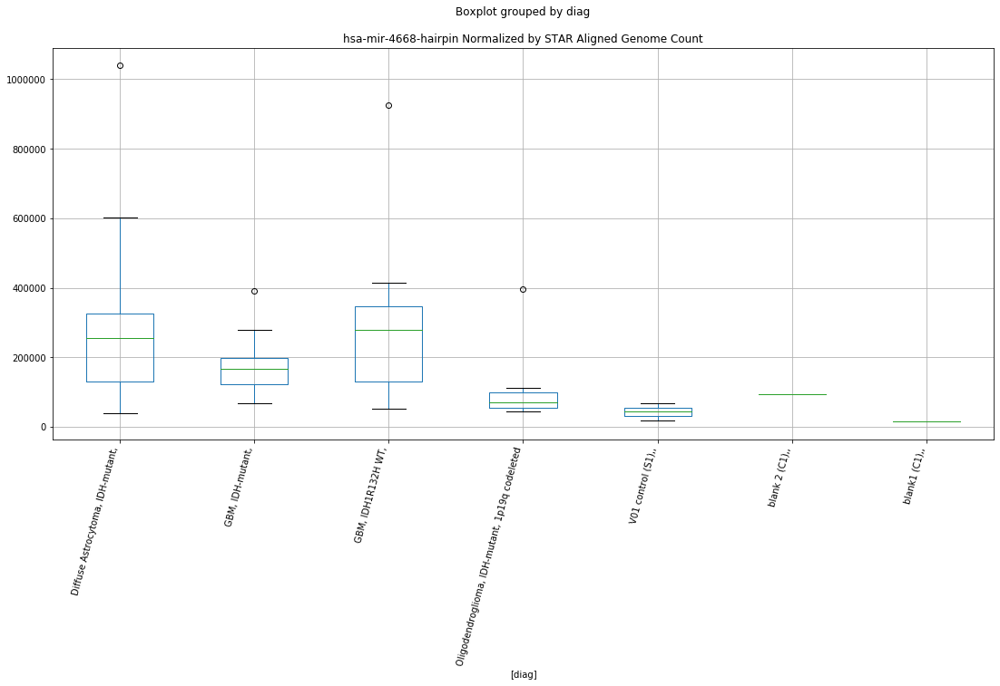

hsa-mir-4668-5p-mature D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.738113365275237
	p = 0.013510492281811441
hsa-mir-4668-5p-mature D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.738113365275237
	p = 0.013510492281811441
hsa-mir-4668-5p-mature D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.478726760940068
	p = 0.023315274932556834
hsa-mir-4668-5p-mature D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.478726760940068
	p = 0.023315274932556834


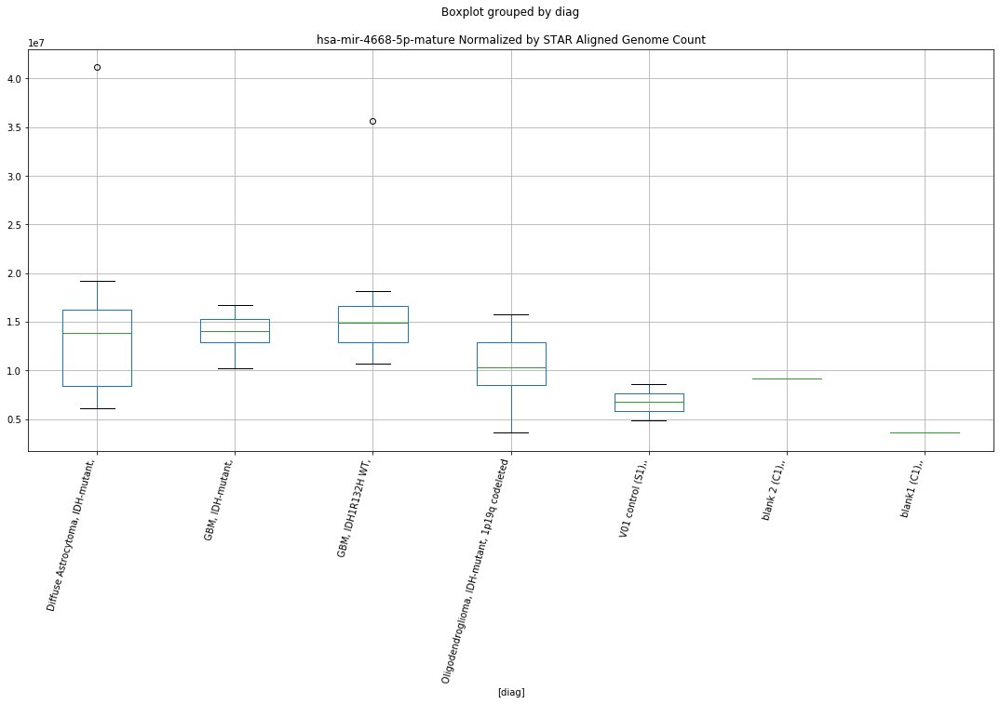

hsa-mir-4668-5p-mature D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.709656943772133
	p = 0.014354102522205632
hsa-mir-4668-5p-mature D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.709656943772133
	p = 0.014354102522205632
hsa-mir-4668-5p-mature D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.528925439136726
	p = 0.02100410037087806
hsa-mir-4668-5p-mature D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.528925439136726
	p = 0.02100410037087806


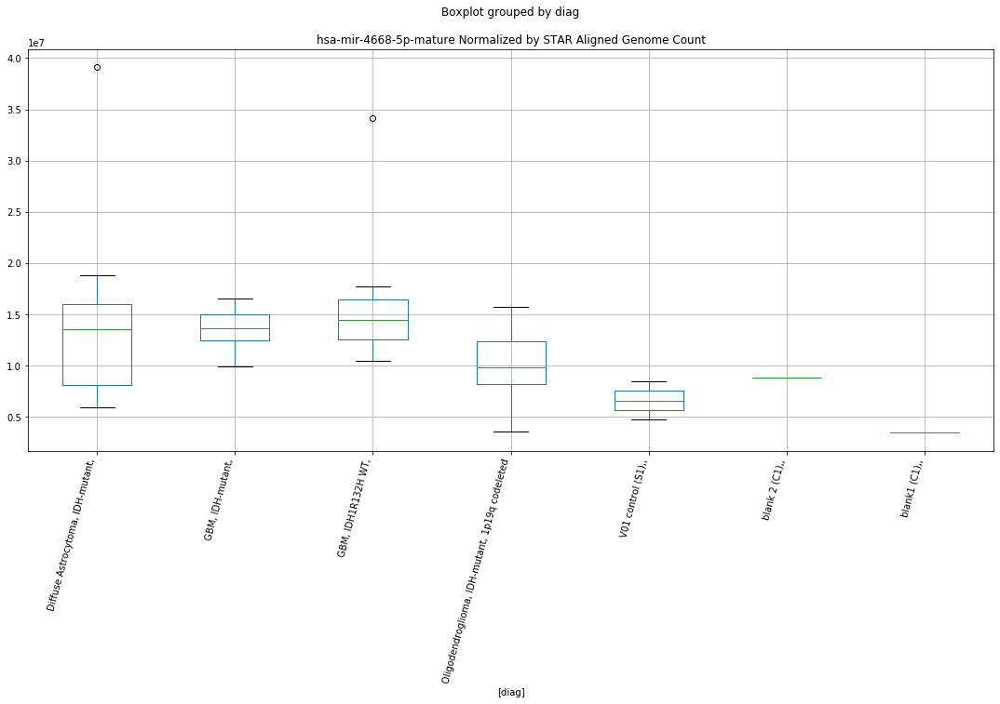

hsa-mir-4668-5p-mature D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.6580876678036867
	p = 0.016012728099960148
hsa-mir-4668-5p-mature D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8883687371191467
	p = 0.0752022900156076
hsa-mir-4668-5p-mature D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.6580876678036867
	p = 0.016012728099960148
hsa-mir-4668-5p-mature D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.8883687371191467
	p = 0.0752022900156076
hsa-mir-4668-5p-mature D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9438143851572989
	p = 0.0677194792929643
hsa-mir-4668-5p-mature D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9438143851572989
	p = 0.0677194792929643


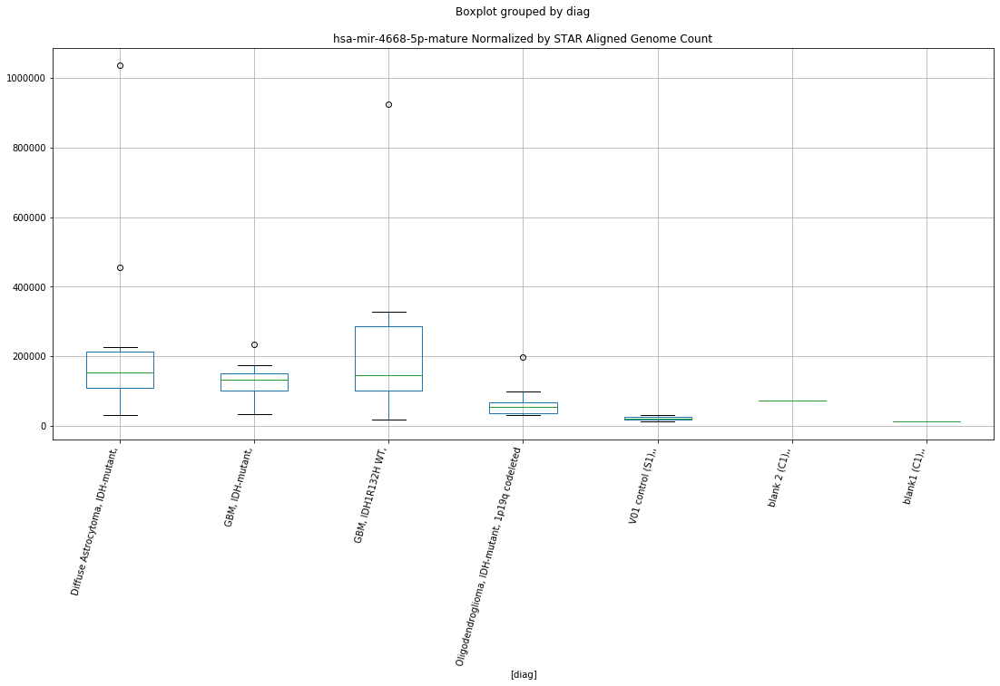

hsa-mir-4668-5p-mature D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.6483890497659206
	p = 0.016344426929985435
hsa-mir-4668-5p-mature D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.886547009054472
	p = 0.0754601255238011
hsa-mir-4668-5p-mature D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.6483890497659206
	p = 0.016344426929985435
hsa-mir-4668-5p-mature D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.886547009054472
	p = 0.0754601255238011
hsa-mir-4668-5p-mature D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.934325431597132
	p = 0.06895106368317987
hsa-mir-4668-5p-mature D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.934325431597132
	p = 0.06895106368317987


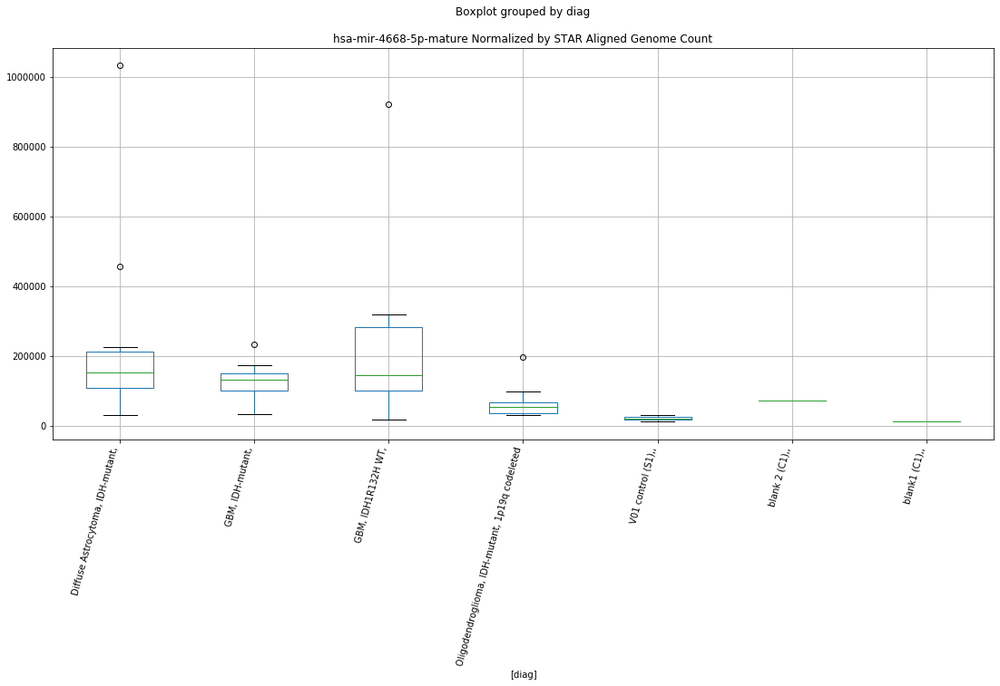

hsa-mir-4668-5p-mature D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.647174860495924
	p = 0.016386410841464267
hsa-mir-4668-5p-mature D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8865049307126922
	p = 0.07546609025207617
hsa-mir-4668-5p-mature D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.647174860495924
	p = 0.016386410841464267
hsa-mir-4668-5p-mature D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.8865049307126922
	p = 0.07546609025207617
hsa-mir-4668-5p-mature D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9347304306049302
	p = 0.06889809327777283
hsa-mir-4668-5p-mature D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9347304306049302
	p = 0.06889809327777283


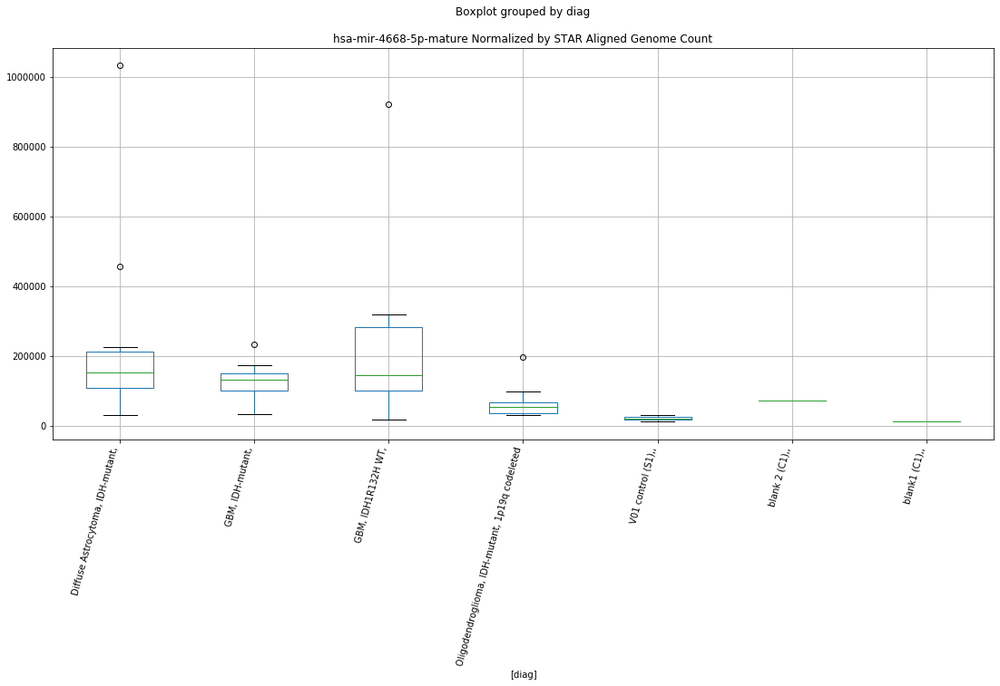

hsa-mir-484-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9047211419994496
	p = 0.07292259271501075
hsa-mir-484-hairpin D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9047211419994496
	p = 0.07292259271501075


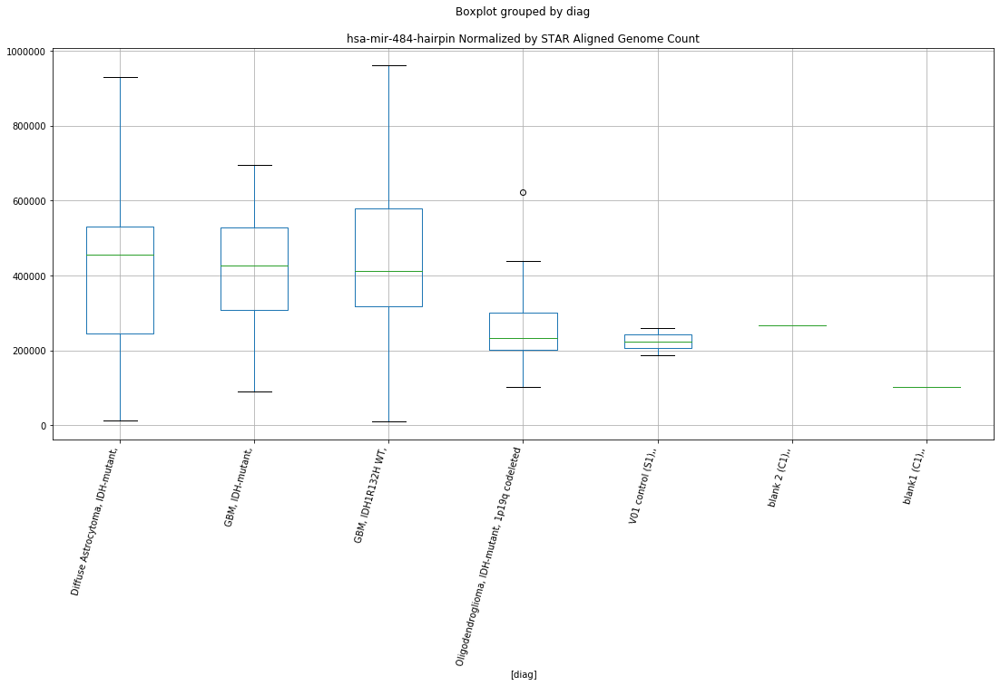

hsa-mir-484-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9050054788531383
	p = 0.07288350127897211
hsa-mir-484-hairpin D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9050054788531383
	p = 0.07288350127897211


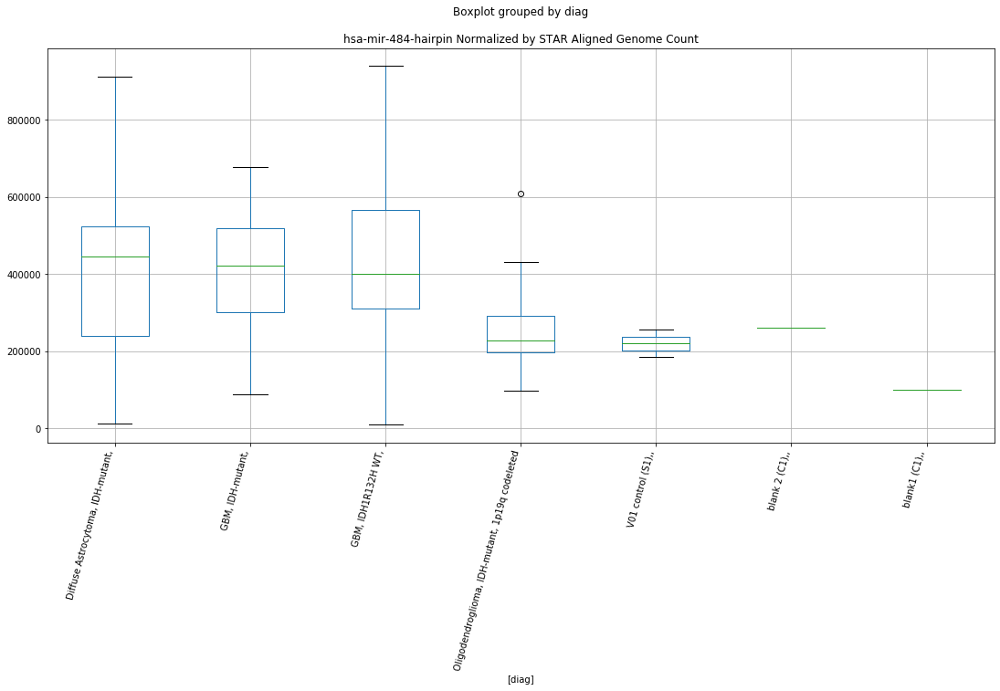

hsa-mir-484-hairpin D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9545761992764745
	p = 0.0663464669765915
hsa-mir-484-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.9545761992764745
	p = 0.0663464669765915


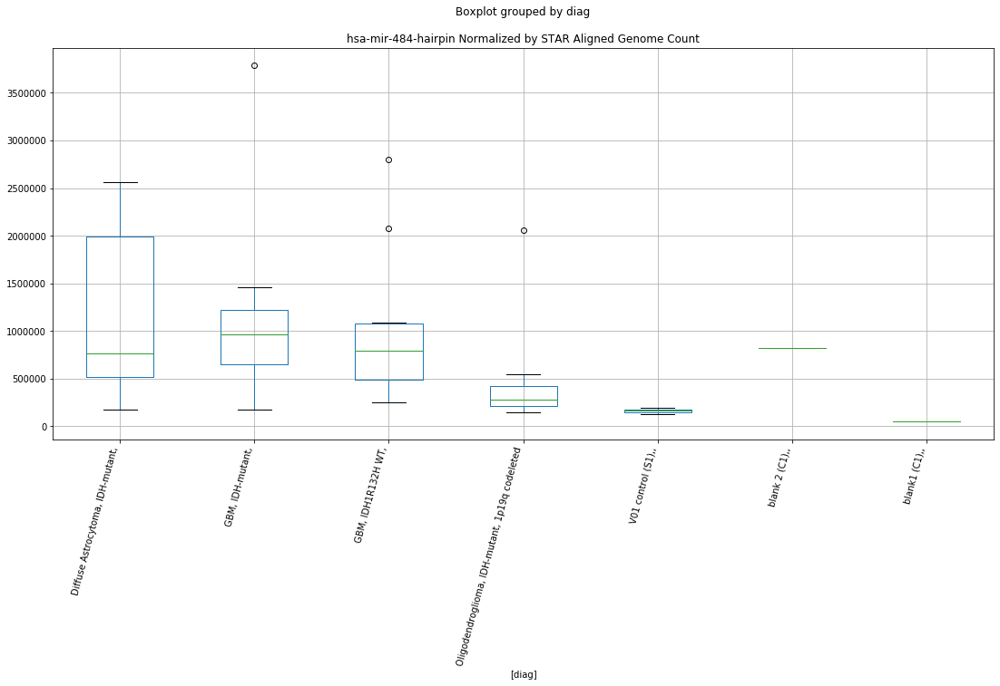

hsa-mir-484-hairpin D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9465469037110454
	p = 0.06736847889307952
hsa-mir-484-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.9465469037110454
	p = 0.06736847889307952


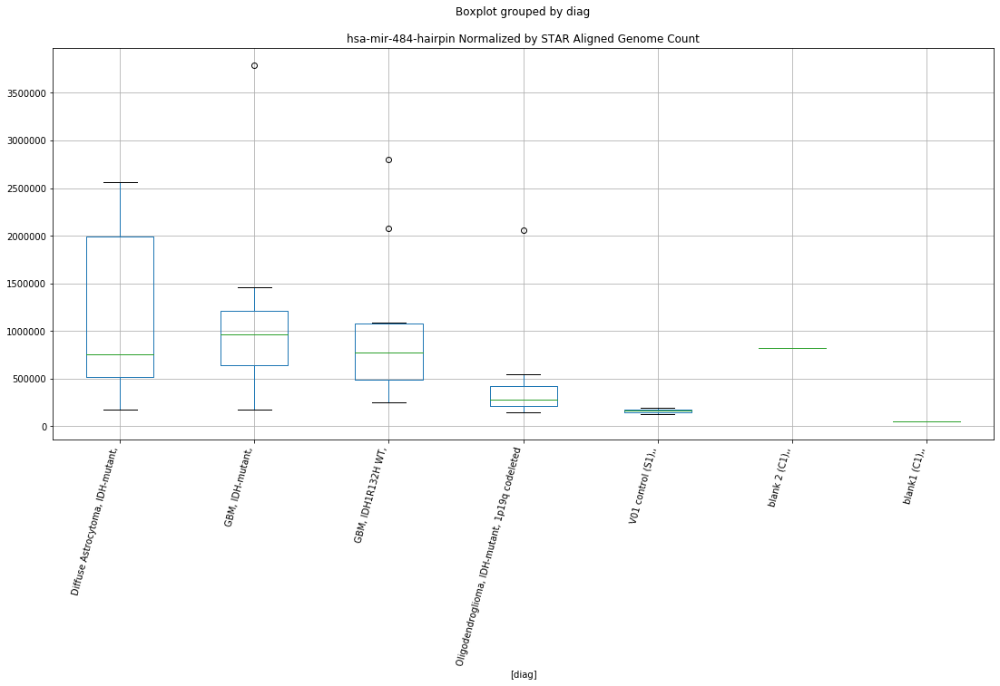

hsa-mir-484-hairpin D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9465174454013443
	p = 0.0673722542318984
hsa-mir-484-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.9465174454013443
	p = 0.0673722542318984


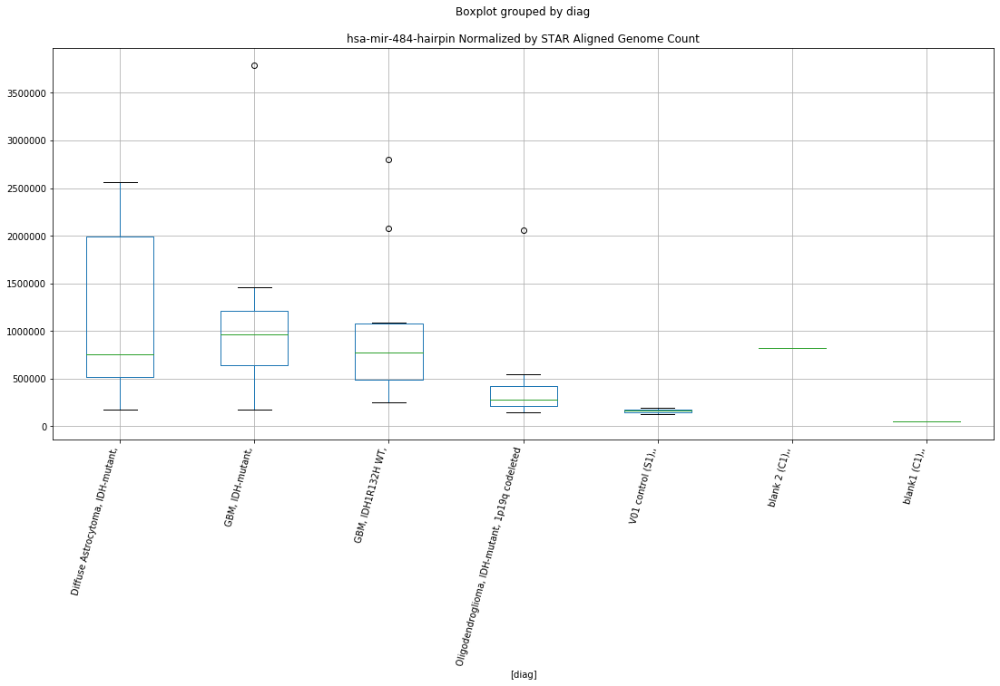

hsa-mir-3658-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.0289497273180466
	p = 0.057519418113371176
hsa-mir-3658-hairpin D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0289497273180466
	p = 0.057519418113371176


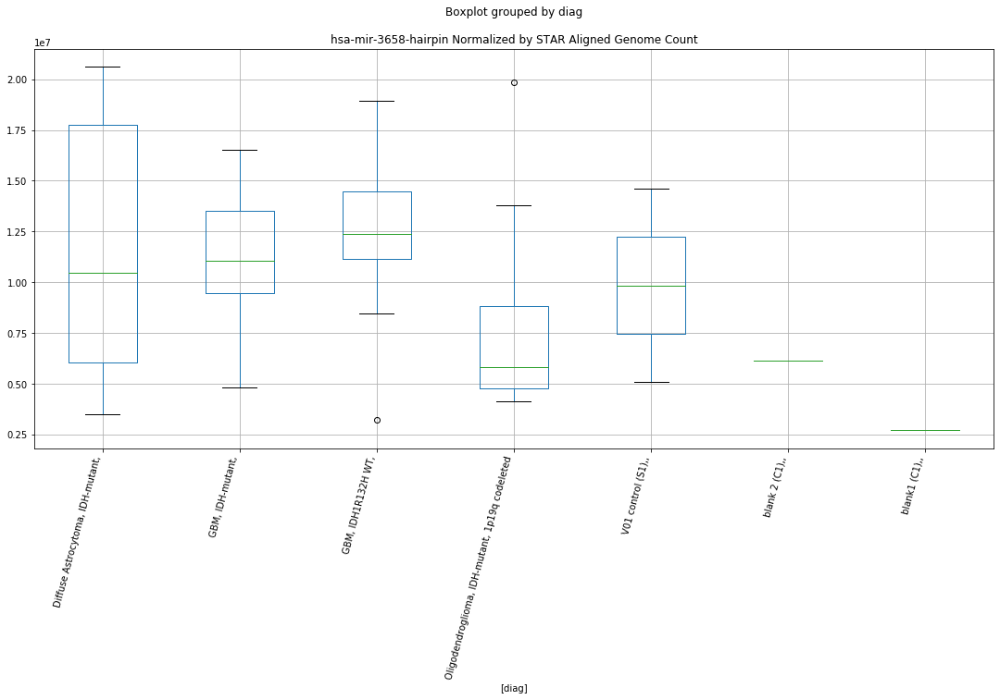

hsa-mir-3658-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.0153141828329506
	p = 0.059054053132859205
hsa-mir-3658-hairpin D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0153141828329506
	p = 0.059054053132859205


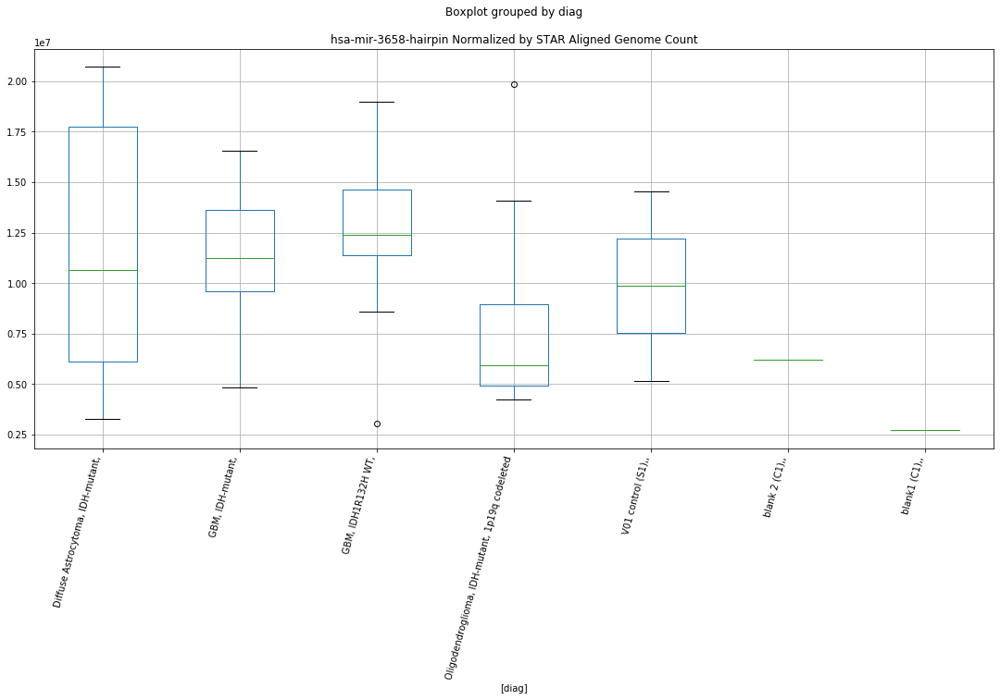

hsa-mir-3658-hairpin D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0014360229320762
	p = 0.06065373695899792
hsa-mir-3658-hairpin D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.03060407117667
	p = 0.05733569305396686
hsa-mir-3658-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.0014360229320762
	p = 0.06065373695899792
hsa-mir-3658-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.03060407117667
	p = 0.05733569305396686
hsa-mir-3658-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.6684698685068655
	p = 0.015664760846075935
hsa-mir-3658-hairpin D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.6684698685068655
	p = 0.015664760846075935


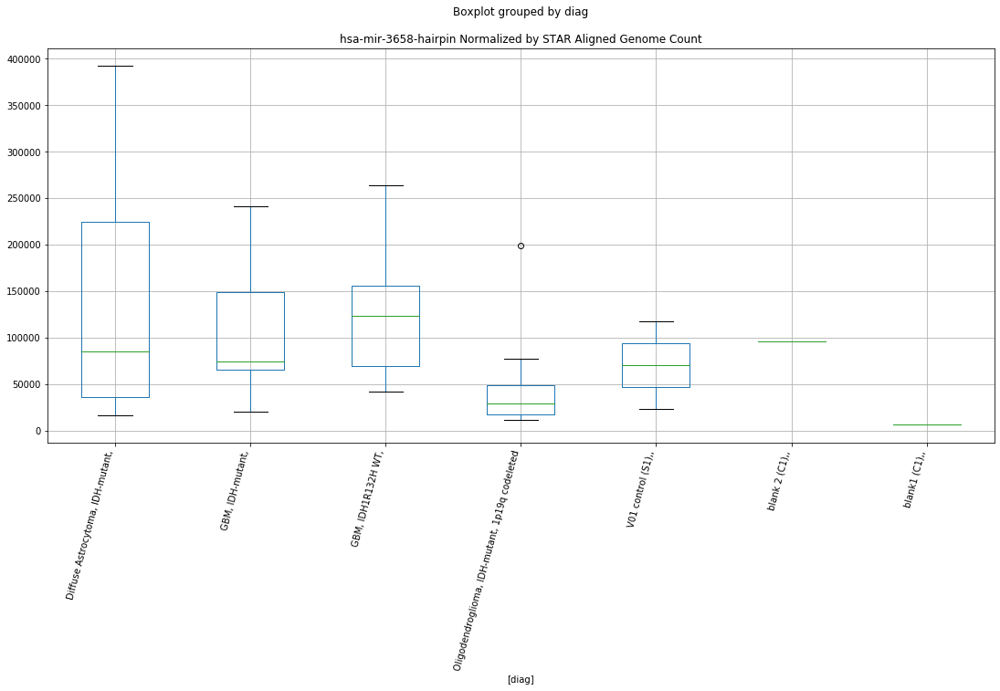

hsa-mir-3658-hairpin D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9913483572056845
	p = 0.06184082954132806
hsa-mir-3658-hairpin D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.022480209329423
	p = 0.058243003847188855
hsa-mir-3658-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9913483572056845
	p = 0.06184082954132806
hsa-mir-3658-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.022480209329423
	p = 0.058243003847188855
hsa-mir-3658-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.63806559589323
	p = 0.01670467844780972
hsa-mir-3658-hairpin D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.63806559589323
	p = 0.01670467844780972


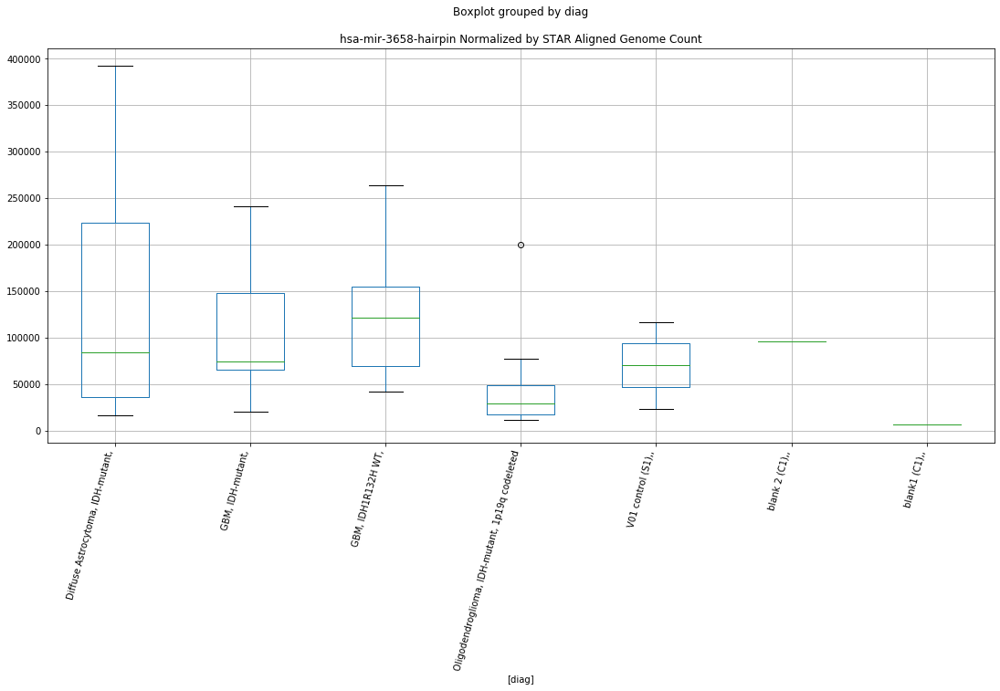

hsa-mir-3658-hairpin D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9976145082324974
	p = 0.061101014288114014
hsa-mir-3658-hairpin D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0258383587210003
	p = 0.057866392954097144
hsa-mir-3658-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9976145082324974
	p = 0.061101014288114014
hsa-mir-3658-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.0258383587210003
	p = 0.057866392954097144
hsa-mir-3658-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.64507854701704
	p = 0.016459138347453557
hsa-mir-3658-hairpin D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.64507854701704
	p = 0.016459138347453557


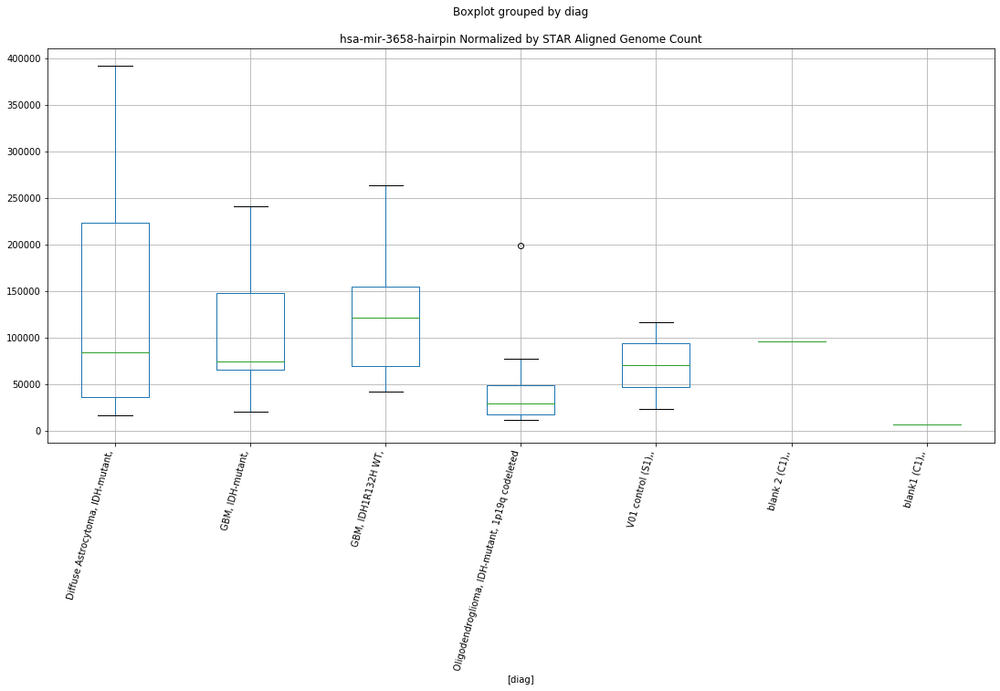

hsa-mir-567-hairpin D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.190400753386492
	p = 0.04190189470261197
hsa-mir-567-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.190400753386492
	p = 0.04190189470261197


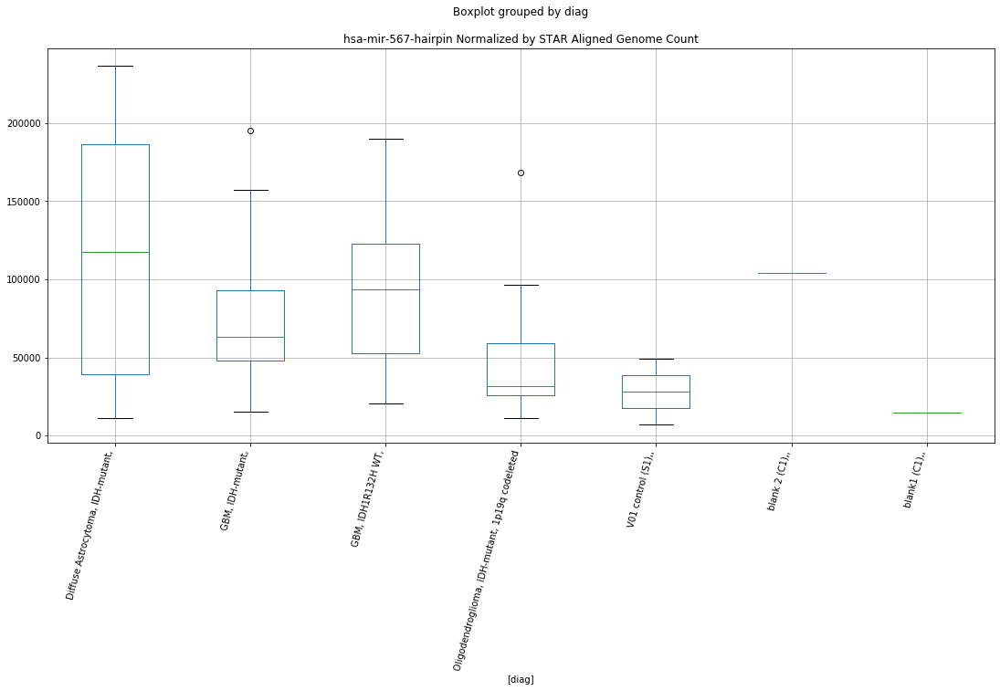

hsa-mir-567-hairpin D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.183808155429602
	p = 0.04245483486981378
hsa-mir-567-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.183808155429602
	p = 0.04245483486981378


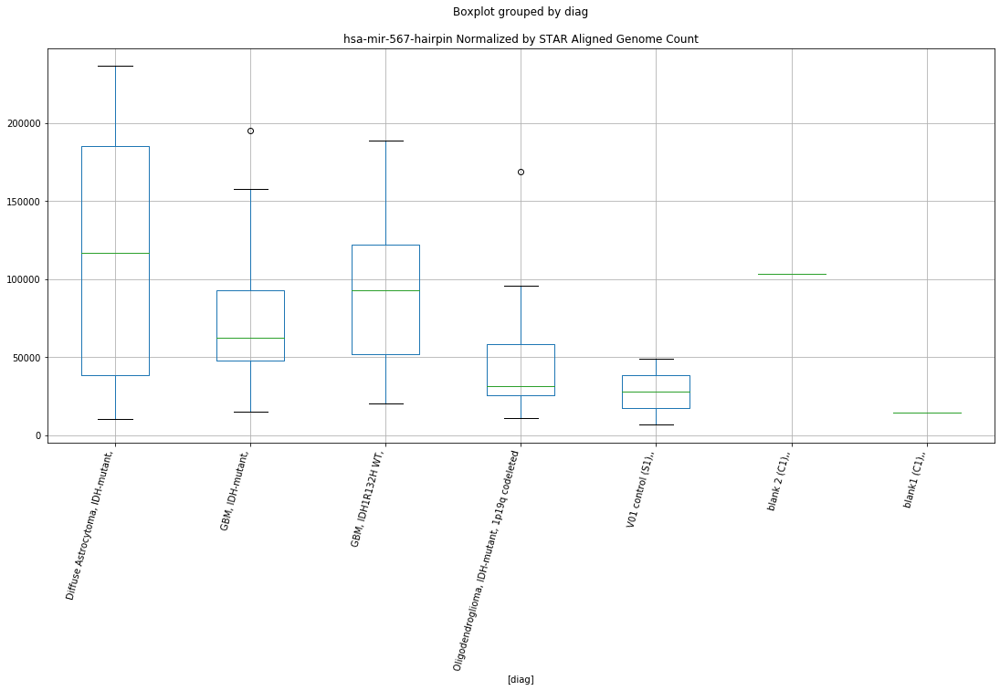

hsa-mir-567-hairpin D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.1837903517815955
	p = 0.04245633713036548
hsa-mir-567-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.1837903517815955
	p = 0.04245633713036548


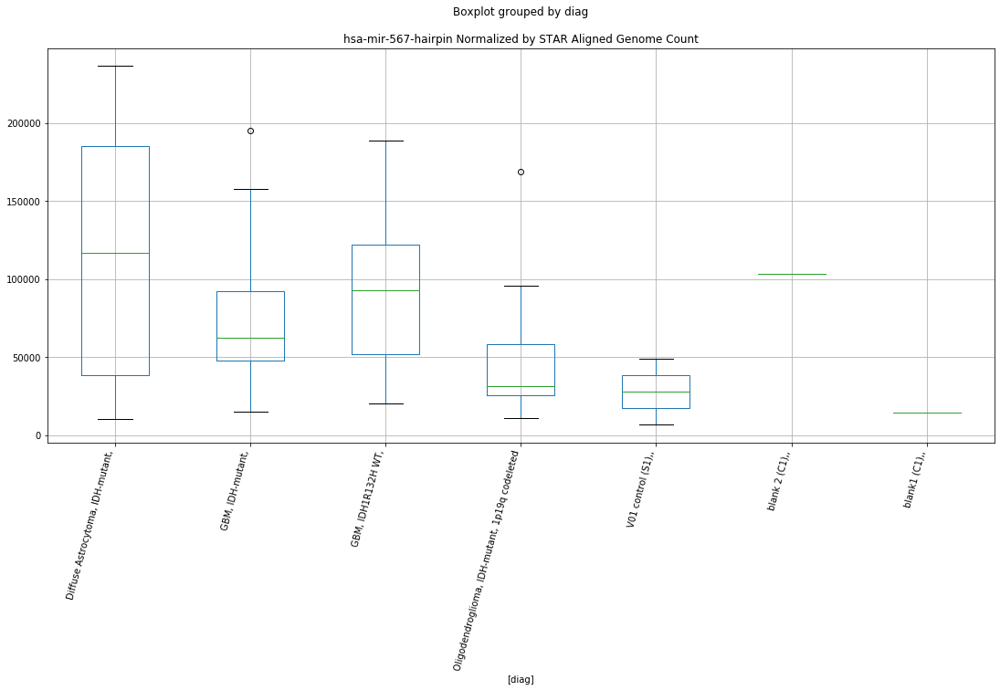

hsa-mir-8052-hairpin D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.939846100290982
	p = 0.0682321222026121
hsa-mir-8052-hairpin D-plex bbduk1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.939846100290982
	p = 0.0682321222026121


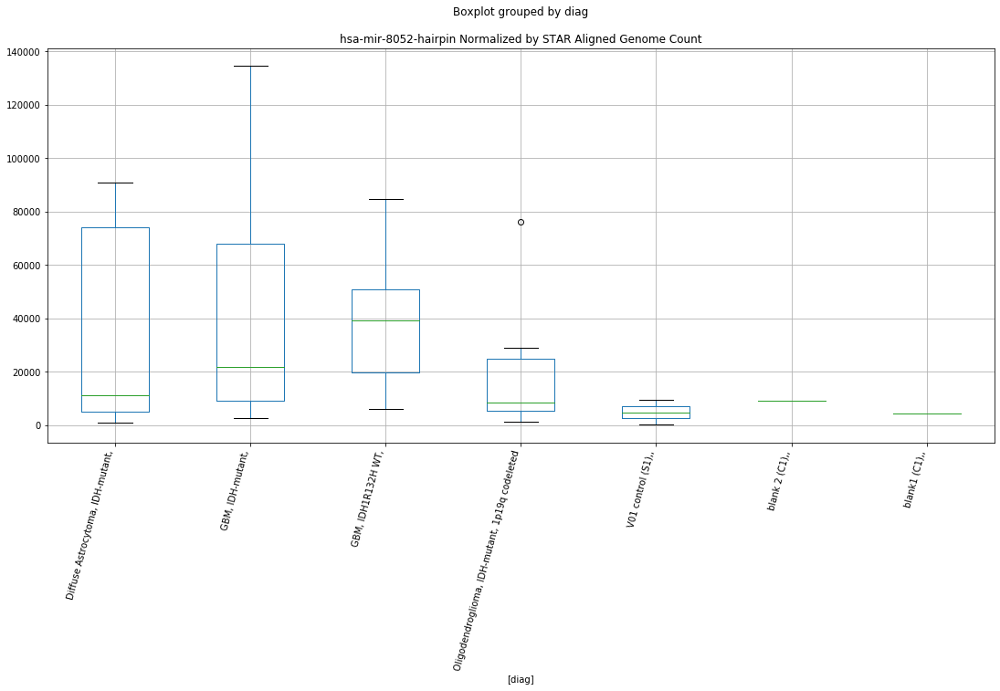

hsa-mir-8052-hairpin D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0004780997099703
	p = 0.06076557699900926
hsa-mir-8052-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.0004780997099703
	p = 0.06076557699900926


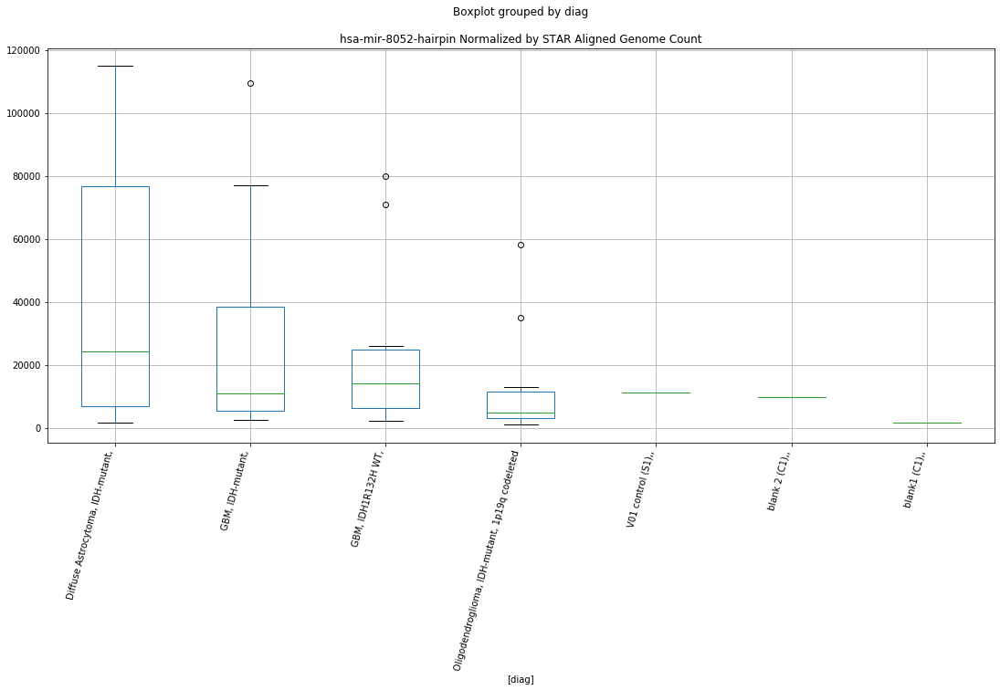

hsa-mir-8052-hairpin D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.998561280896038
	p = 0.06098992702042612
hsa-mir-8052-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.998561280896038
	p = 0.06098992702042612


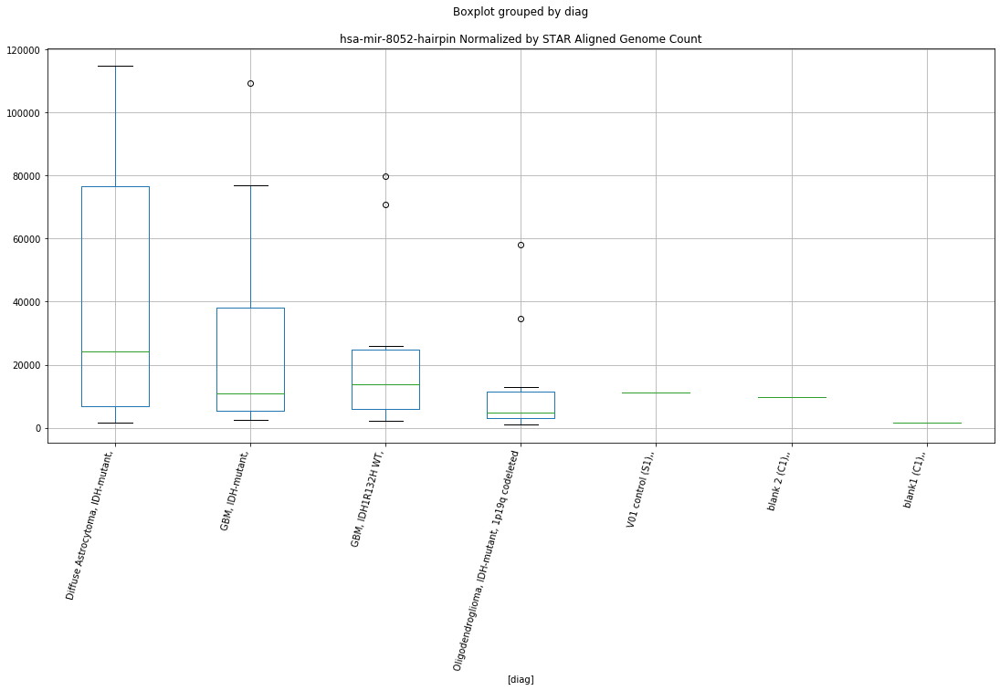

hsa-mir-8052-hairpin D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.998534238138897
	p = 0.06099309749827289
hsa-mir-8052-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.998534238138897
	p = 0.06099309749827289


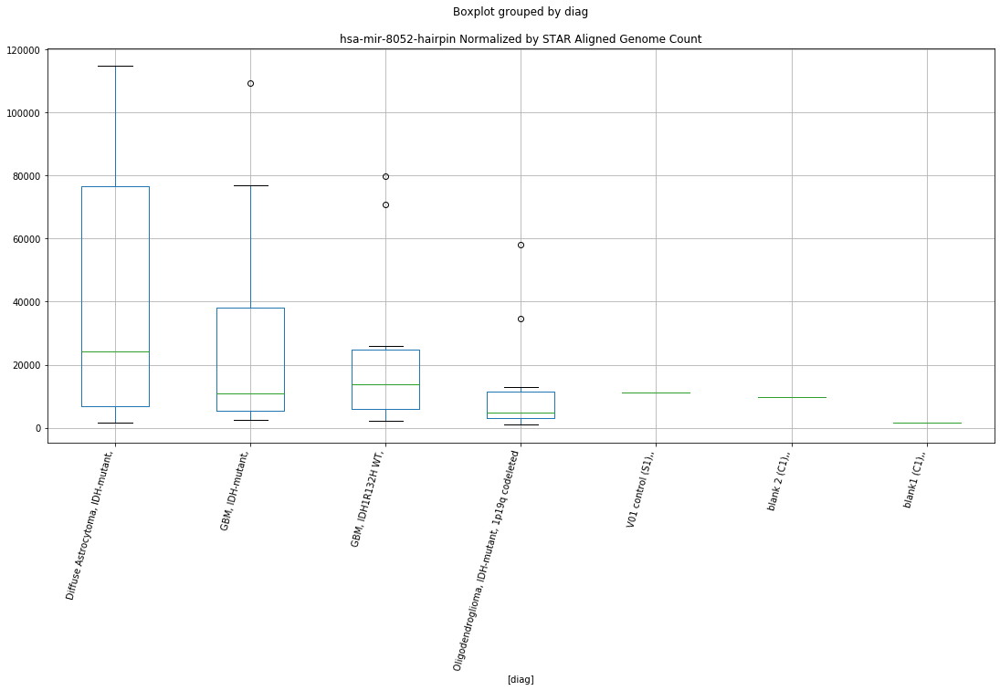

hsa-mir-3613-5p-mature D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.0519141824975775
	p = 0.05501595246619634
hsa-mir-3613-5p-mature D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0519141824975775
	p = 0.05501595246619634


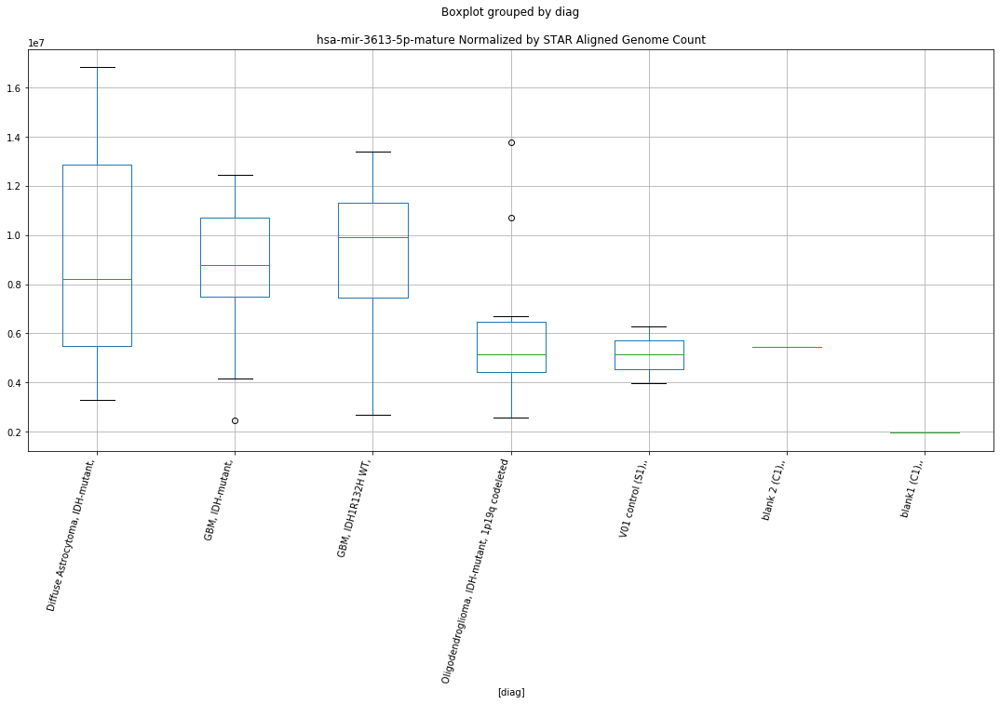

hsa-mir-3613-5p-mature D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.0525330296758497
	p = 0.05494987232478679
hsa-mir-3613-5p-mature D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0525330296758497
	p = 0.05494987232478679


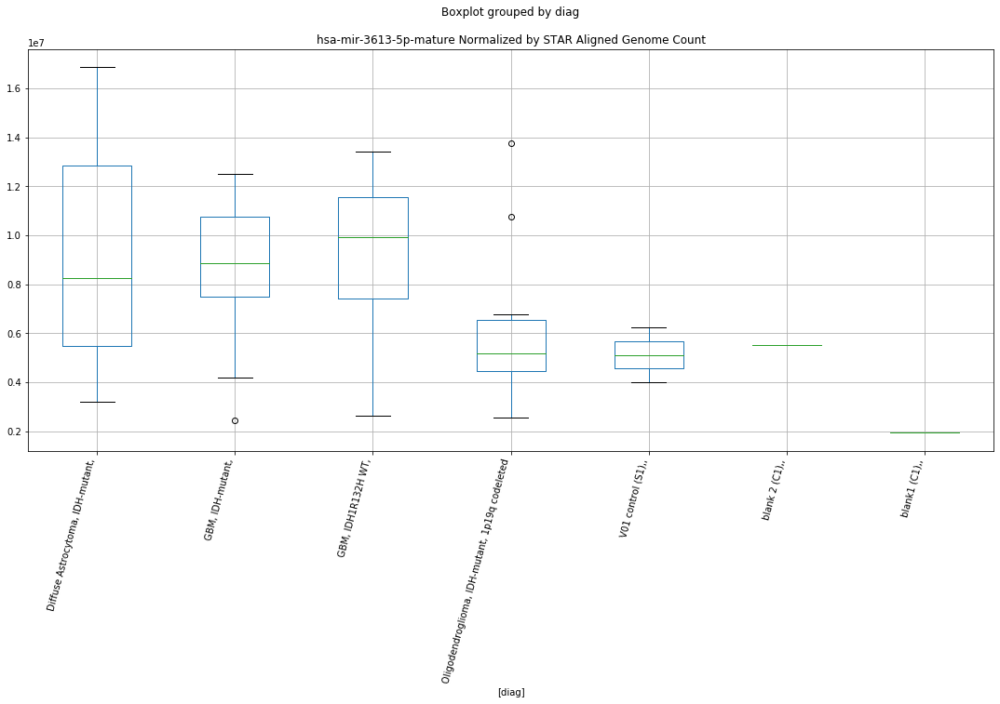

hsa-mir-509-1-hairpin D-plex bbduk2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.260578234565838
	p = 0.03641257173291633
hsa-mir-509-1-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.260578234565838
	p = 0.03641257173291633
hsa-mir-509-1-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9527500966795255
	p = 0.06657767903348569
hsa-mir-509-1-hairpin D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9527500966795255
	p = 0.06657767903348569


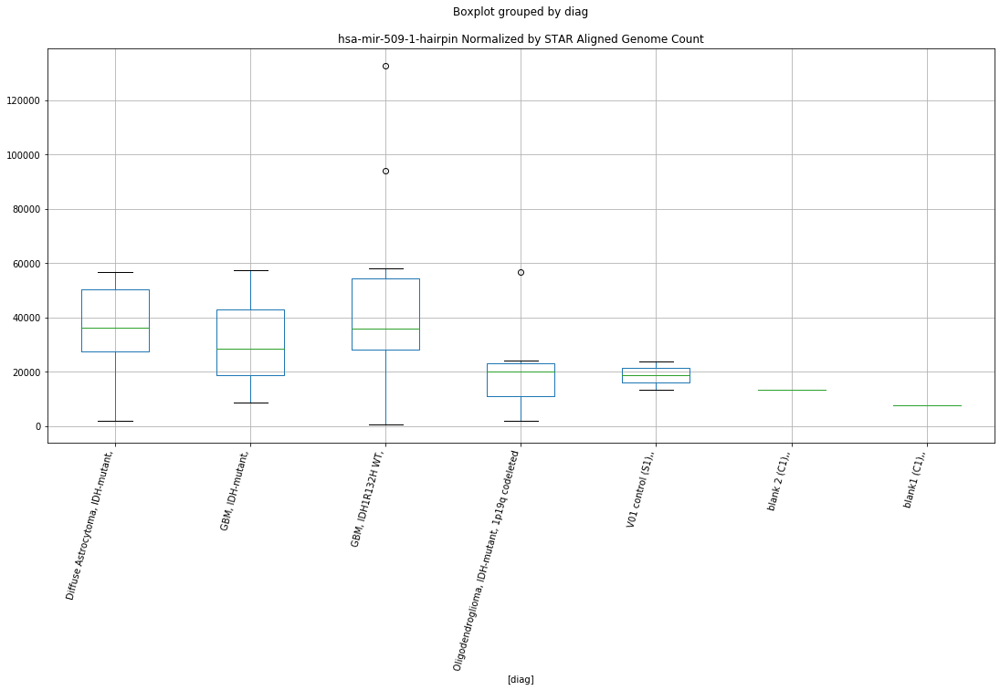

hsa-mir-509-1-hairpin D-plex bbduk3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.256250613648643
	p = 0.03673088788752737
hsa-mir-509-1-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.256250613648643
	p = 0.03673088788752737
hsa-mir-509-1-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9727702230280137
	p = 0.0640817231140169
hsa-mir-509-1-hairpin D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9727702230280137
	p = 0.0640817231140169


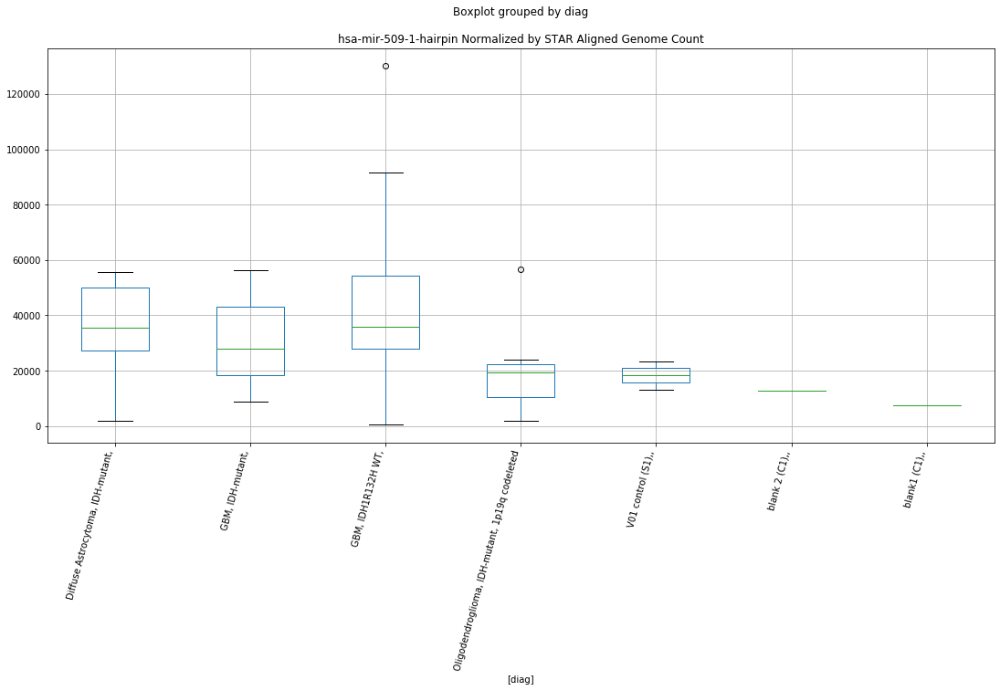

hsa-mir-509-2-hairpin D-plex bbduk2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.265319738336312
	p = 0.036066739381782
hsa-mir-509-2-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.265319738336312
	p = 0.036066739381782
hsa-mir-509-2-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9554572797079592
	p = 0.0662351656521785
hsa-mir-509-2-hairpin D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9554572797079592
	p = 0.0662351656521785


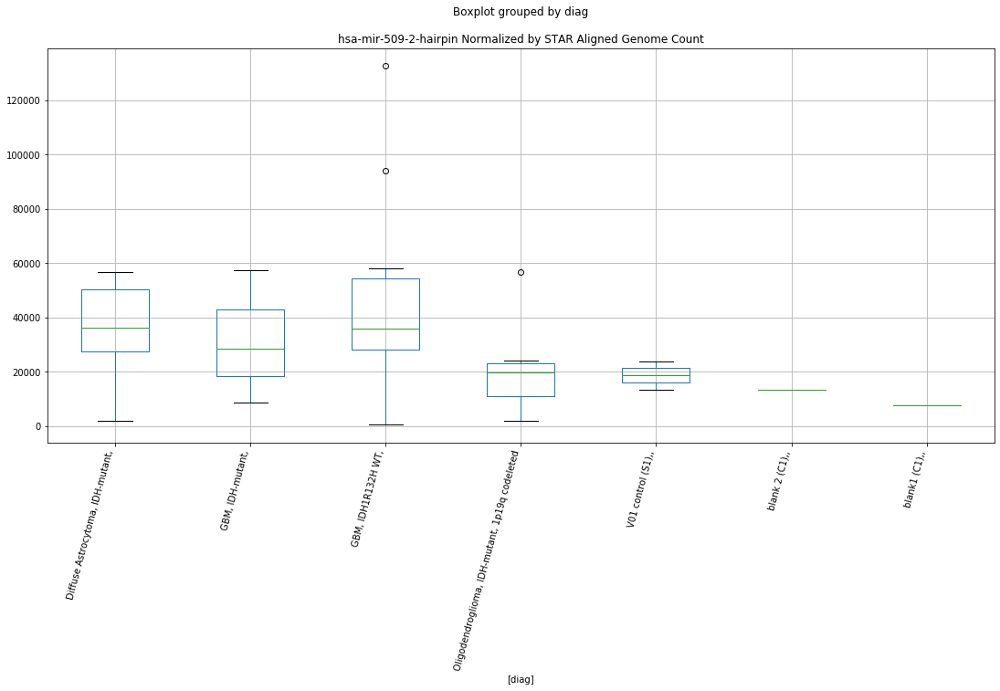

hsa-mir-509-2-hairpin D-plex bbduk3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.261001946248567
	p = 0.03638154315658711
hsa-mir-509-2-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.261001946248567
	p = 0.03638154315658711
hsa-mir-509-2-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9755270979027166
	p = 0.06374465781045886
hsa-mir-509-2-hairpin D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9755270979027166
	p = 0.06374465781045886


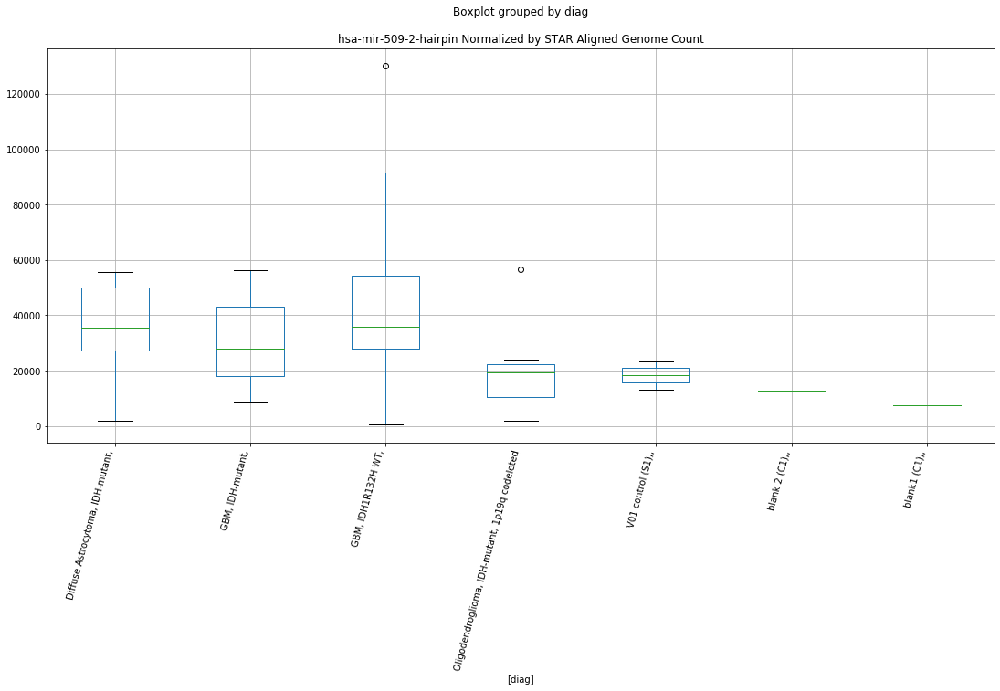

hsa-mir-509-3-hairpin D-plex bbduk2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.261290914579137
	p = 0.03636039590132579
hsa-mir-509-3-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.261290914579137
	p = 0.03636039590132579
hsa-mir-509-3-hairpin D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9829812687733153
	p = 0.06284122234240112
hsa-mir-509-3-hairpin D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9829812687733153
	p = 0.06284122234240112


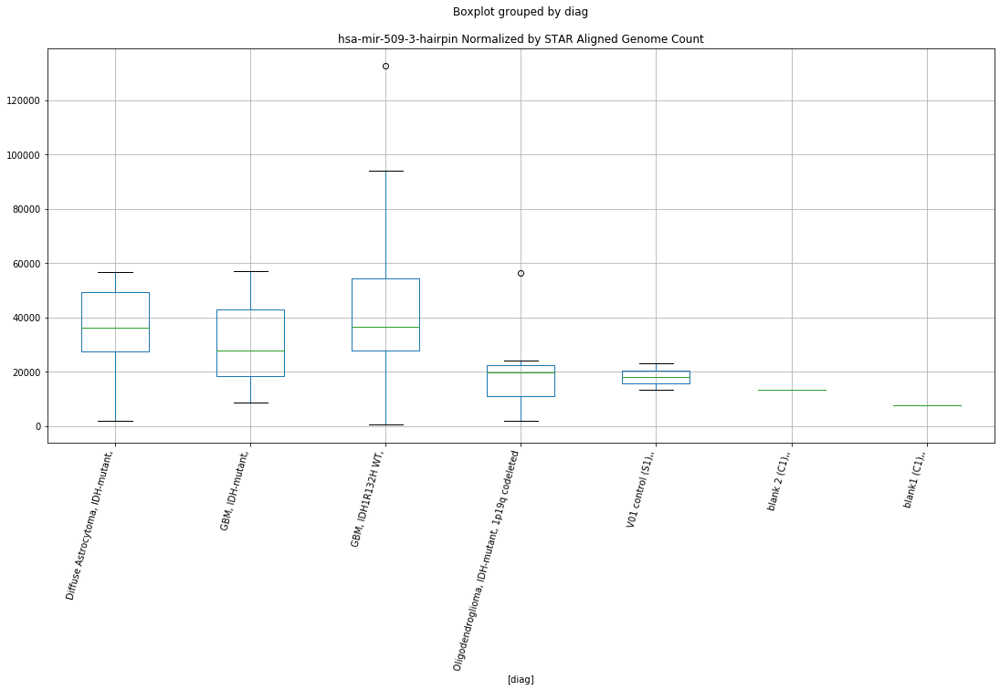

hsa-mir-509-3-hairpin D-plex bbduk3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2386431351841534
	p = 0.03805266417871794
hsa-mir-509-3-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.2386431351841534
	p = 0.03805266417871794
hsa-mir-509-3-hairpin D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.991885668229822
	p = 0.06177707803748997
hsa-mir-509-3-hairpin D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.991885668229822
	p = 0.06177707803748997


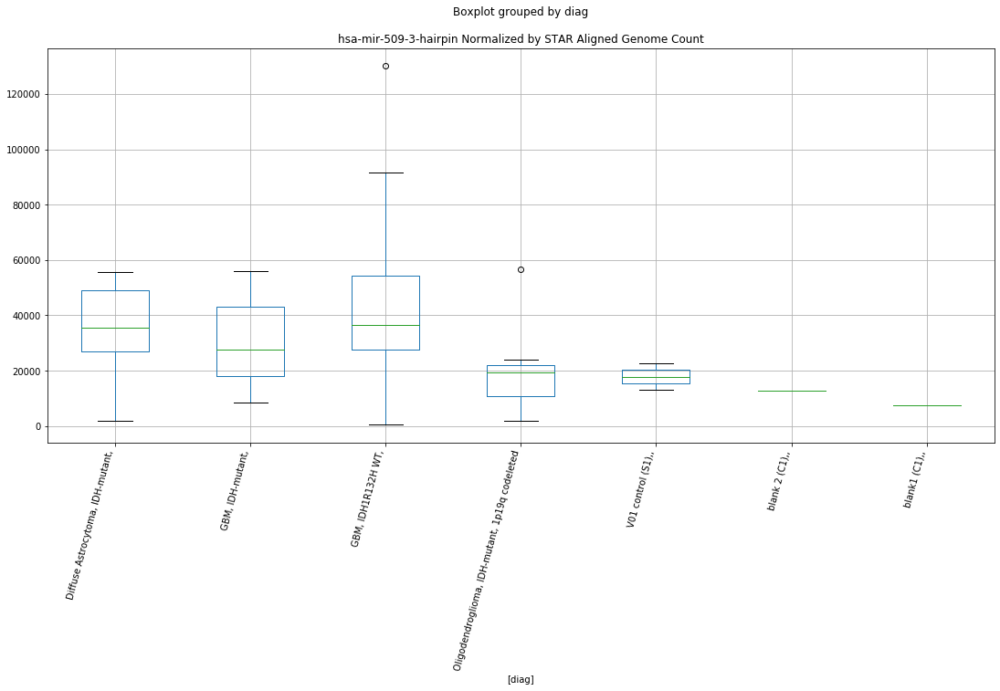

hsa-mir-6887-hairpin D-plex bbduk1 : GBM, IDH-mutant, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.8900500098907076
	p = 0.07496502601943093
hsa-mir-6887-hairpin D-plex bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH-mutant,
	t = -1.8900500098907076
	p = 0.07496502601943093


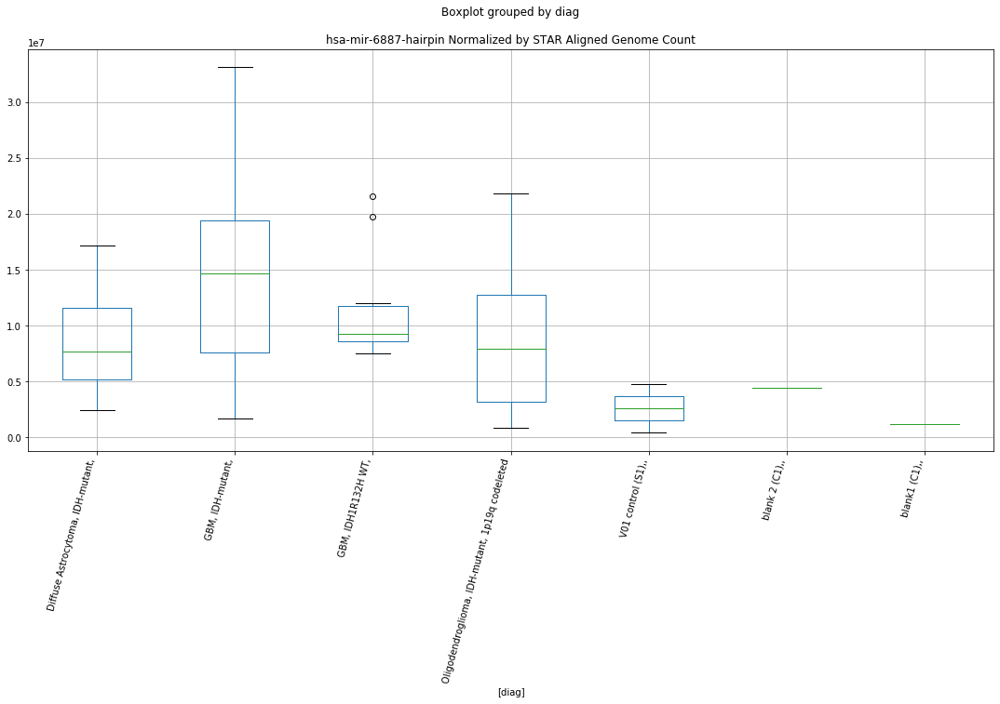

hsa-mir-6887-hairpin D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.365494128149552
	p = 0.02943492084971528
hsa-mir-6887-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.365494128149552
	p = 0.02943492084971528
hsa-mir-6887-hairpin D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.235524095468848
	p = 0.03829133107888506
hsa-mir-6887-hairpin D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.235524095468848
	p = 0.03829133107888506


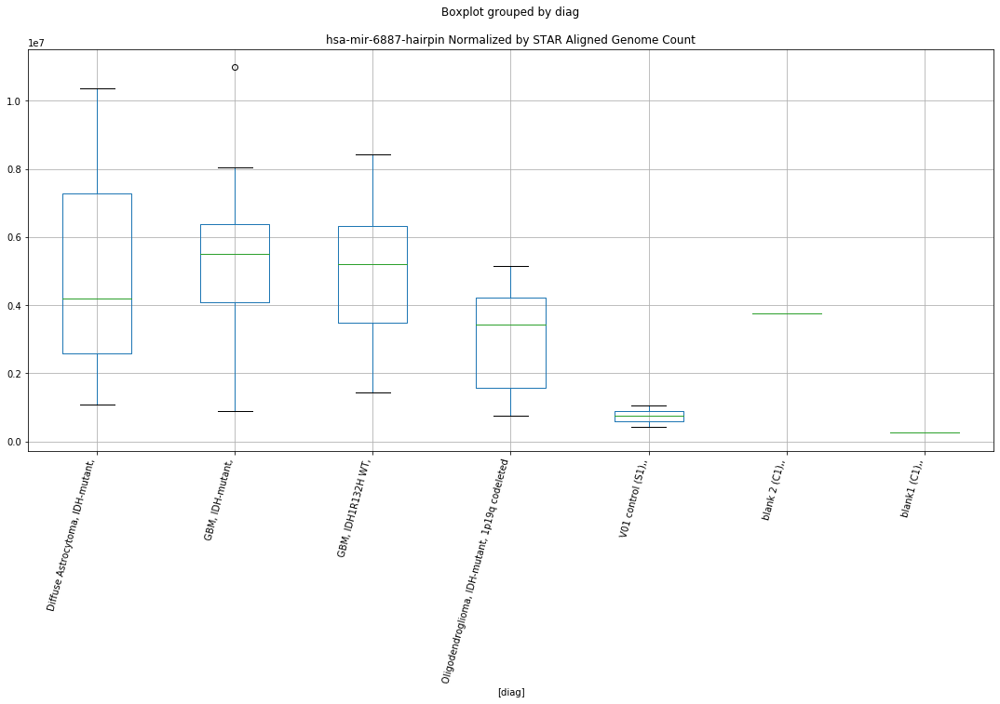

hsa-mir-6887-hairpin D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.3625105134233655
	p = 0.029614844824122032
hsa-mir-6887-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.3625105134233655
	p = 0.029614844824122032
hsa-mir-6887-hairpin D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.2123894238570627
	p = 0.04010508448659733
hsa-mir-6887-hairpin D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2123894238570627
	p = 0.04010508448659733


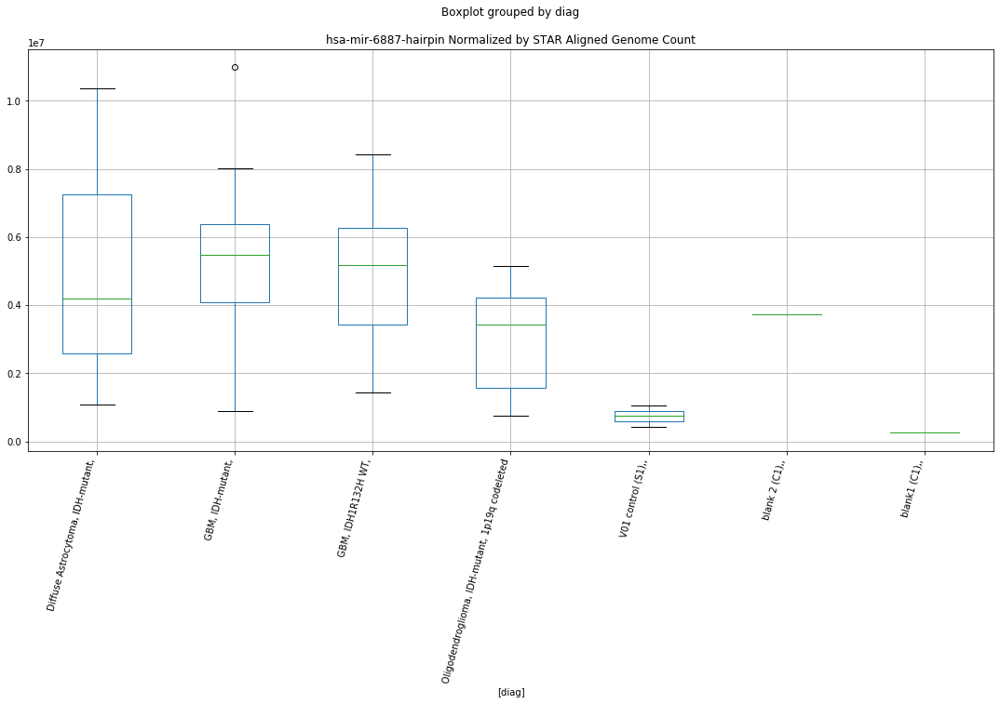

hsa-mir-6887-hairpin D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.3623623458006704
	p = 0.0296238065942151
hsa-mir-6887-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.3623623458006704
	p = 0.0296238065942151
hsa-mir-6887-hairpin D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.2123227256394022
	p = 0.04011042600544351
hsa-mir-6887-hairpin D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2123227256394022
	p = 0.04011042600544351


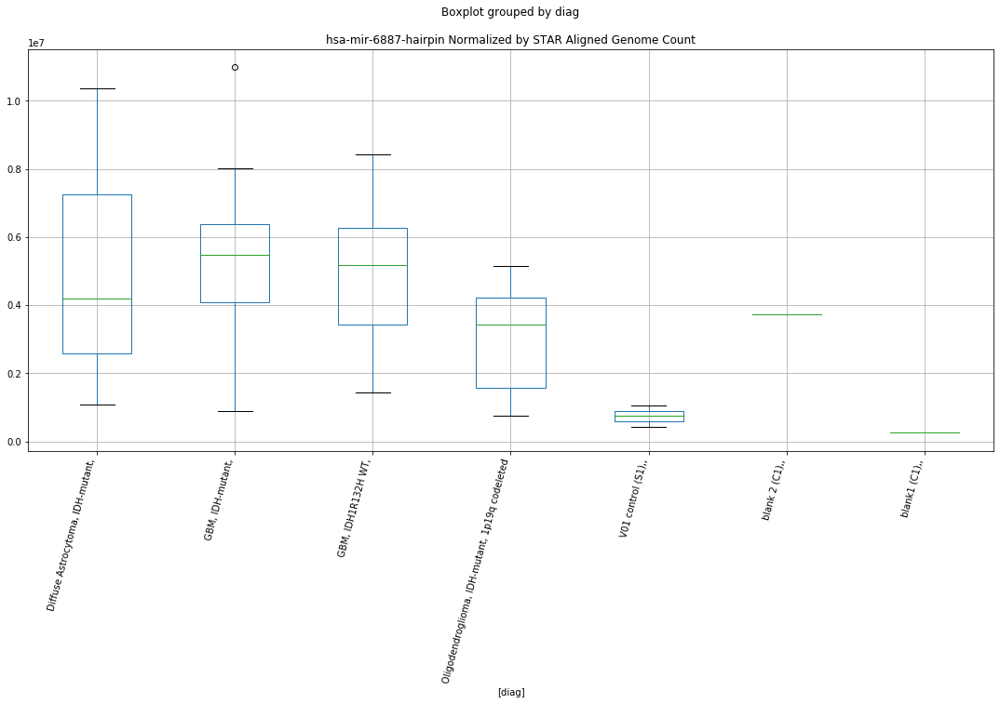

hsa-mir-6887-5p-mature D-plex bbduk1 : GBM, IDH-mutant, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.8992054356194787
	p = 0.07368459680109614
hsa-mir-6887-5p-mature D-plex bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH-mutant,
	t = -1.8992054356194787
	p = 0.07368459680109614


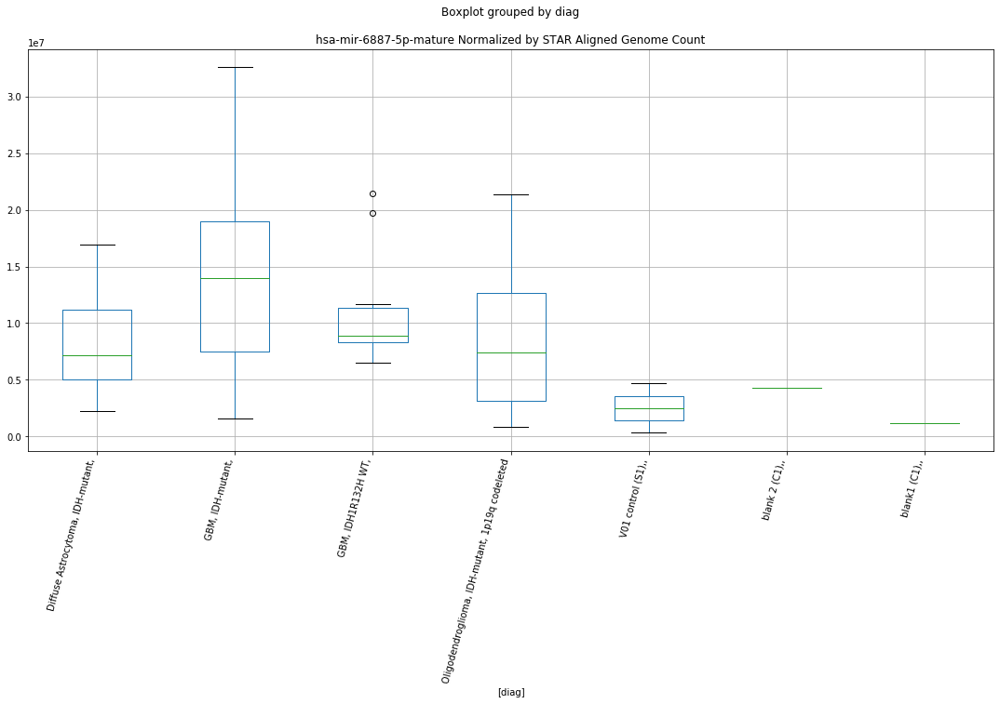

hsa-mir-6887-5p-mature D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.4346364307231325
	p = 0.02554060387048009
hsa-mir-6887-5p-mature D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.4346364307231325
	p = 0.02554060387048009
hsa-mir-6887-5p-mature D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.206225151644211
	p = 0.040601521771833814
hsa-mir-6887-5p-mature D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.206225151644211
	p = 0.040601521771833814


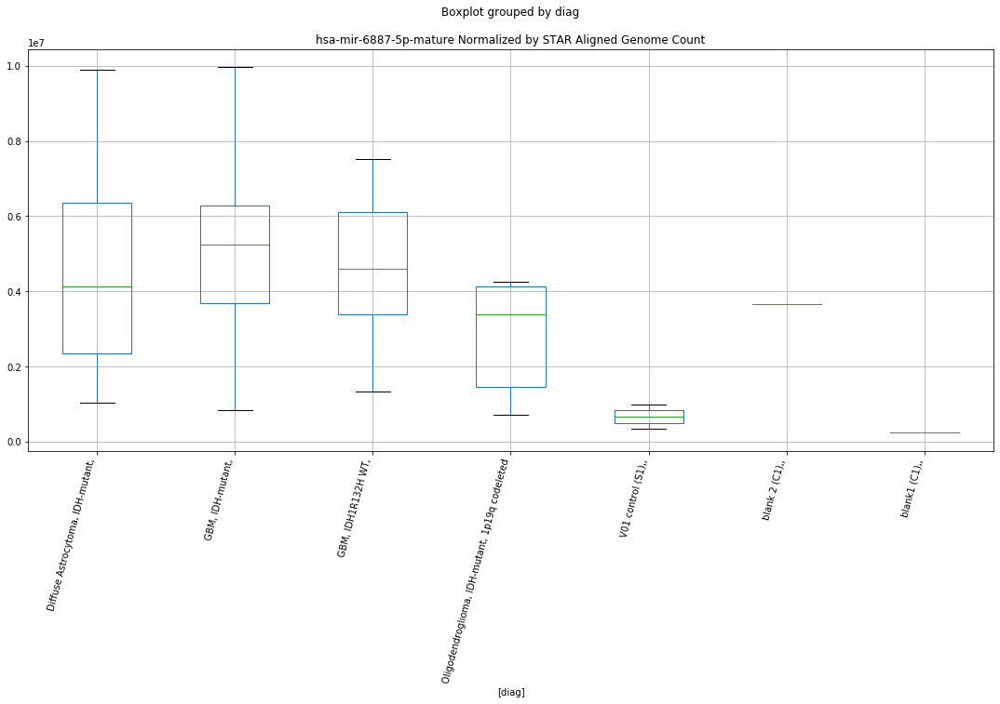

hsa-mir-6887-5p-mature D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.4324164392023895
	p = 0.025657760481098992
hsa-mir-6887-5p-mature D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.4324164392023895
	p = 0.025657760481098992
hsa-mir-6887-5p-mature D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.1845801034100094
	p = 0.04238974524013773
hsa-mir-6887-5p-mature D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.1845801034100094
	p = 0.04238974524013773


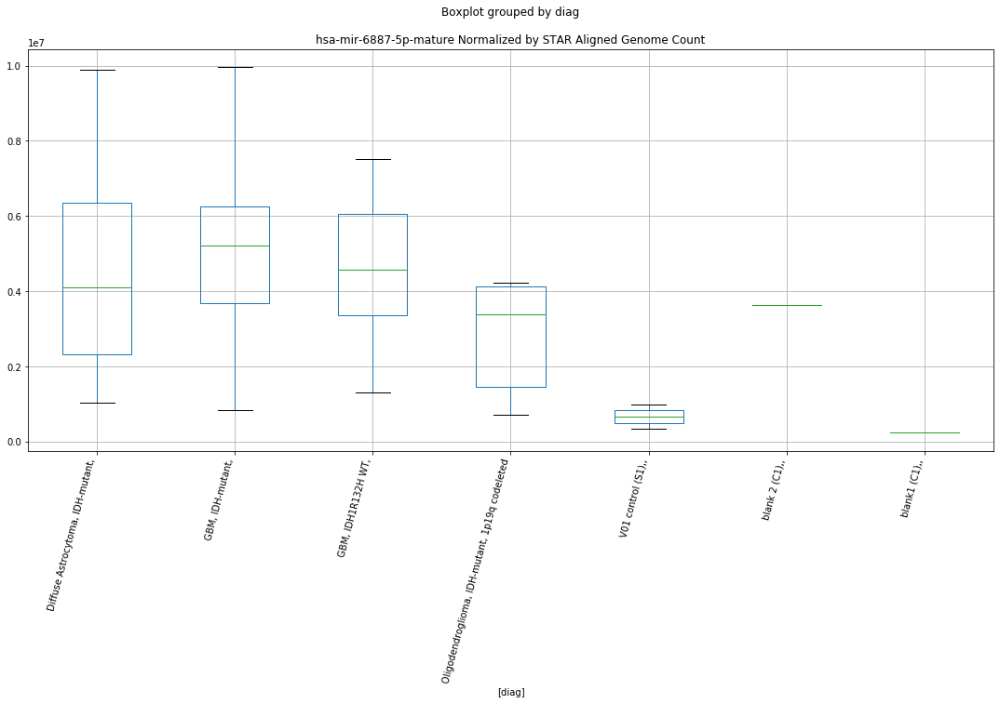

hsa-mir-6887-5p-mature D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.4322538408266126
	p = 0.025666361130711867
hsa-mir-6887-5p-mature D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.4322538408266126
	p = 0.025666361130711867
hsa-mir-6887-5p-mature D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.1845042121022127
	p = 0.04239614023637965
hsa-mir-6887-5p-mature D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.1845042121022127
	p = 0.04239614023637965


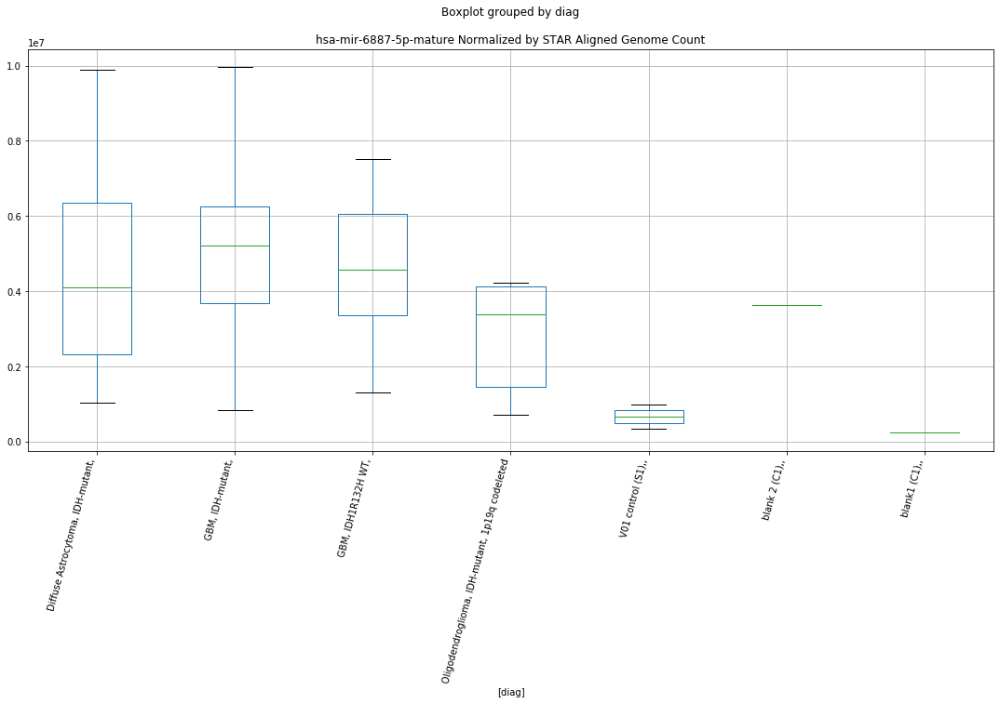

hsa-mir-3613-3p-mature D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.5515684523736777
	p = 0.020033956419316278
hsa-mir-3613-3p-mature D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.5515684523736777
	p = 0.020033956419316278


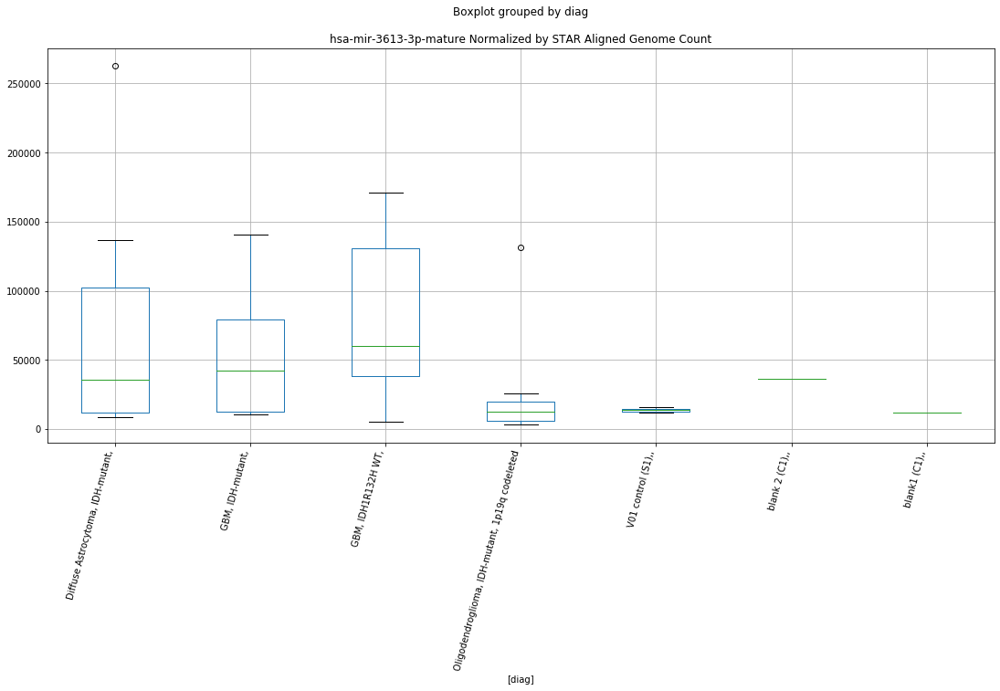

hsa-mir-3613-3p-mature D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.5473862188474627
	p = 0.020209894367362417
hsa-mir-3613-3p-mature D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.5473862188474627
	p = 0.020209894367362417


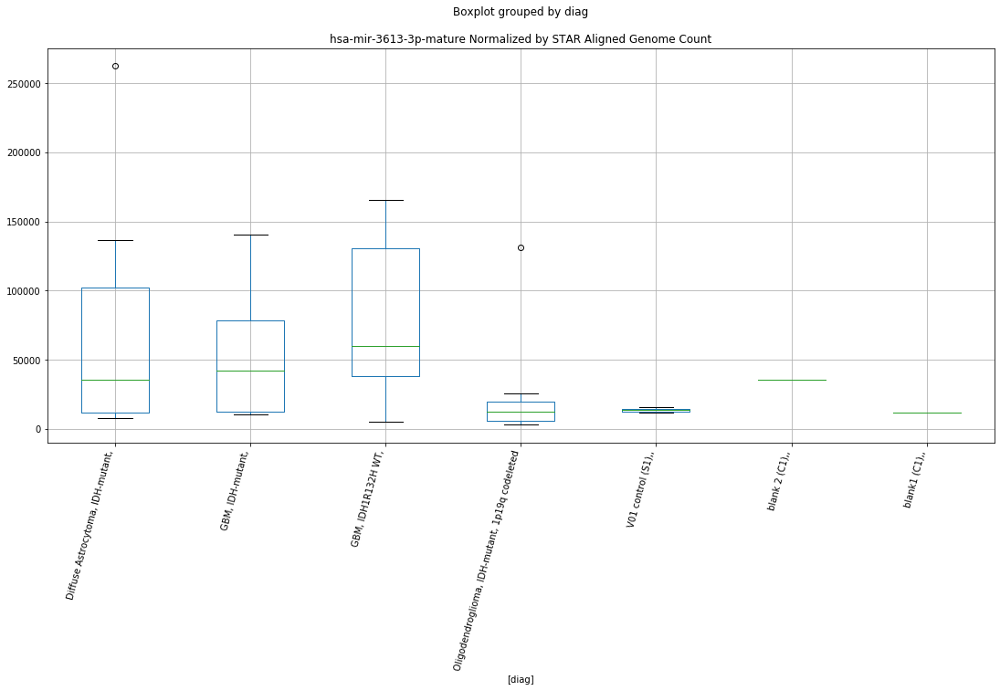

hsa-mir-3613-3p-mature D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.54732281451307
	p = 0.020212572866508335
hsa-mir-3613-3p-mature D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.54732281451307
	p = 0.020212572866508335


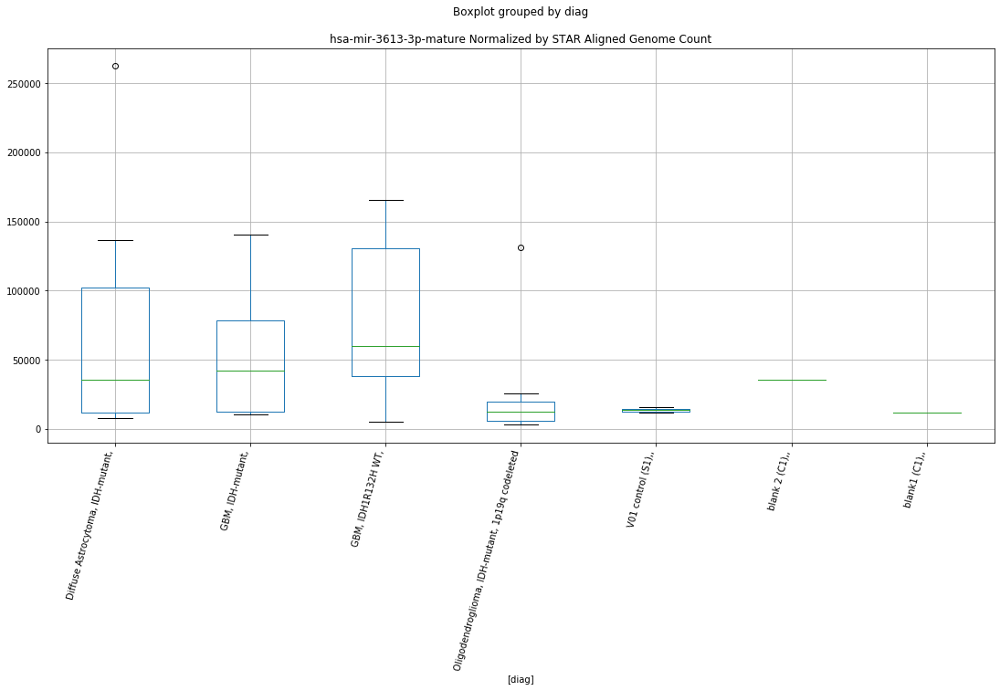

In [93]:
for col in mirnas:
    for labkit in "D-plex","Lexogen":
        for trimmer in "bbduk1","bbduk2","bbduk3","cutadapt1","cutadapt2","cutadapt3":
            ps=[]
            for diag in diags:
                others=diags.copy()
                others.remove(diag)
                for other in others:
                    t, p = stats.ttest_ind(
                        dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
                            (dfn["diag"]==diag))][col],
                        dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
                            (dfn["diag"]==other))][col])
                    if p < 0.08:
                        print(col+" "+labkit+" "+trimmer+" : "+diag+" - "+other)
                        print("\tt = " + str(t))
                        print("\tp = " + str(p))
                    ps=np.append(ps,p)
            if(any(p < 0.08 for p in ps)):
                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer))].boxplot(column=col,by=['diag'])
                plt.title(col + " Normalized by STAR Aligned Genome Count")
                plt.xticks(rotation=75,ha='right')
                plt.show()


LOC102724859 Lexogen bbduk3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.0356623745264084
	p = 0.056777215336004785
LOC102724859 Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.168234878781254
	p = 0.04378767392847783
LOC102724859 Lexogen bbduk3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.0356623745264084
	p = 0.056777215336004785
LOC102724859 Lexogen bbduk3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.168234878781254
	p = 0.04378767392847783


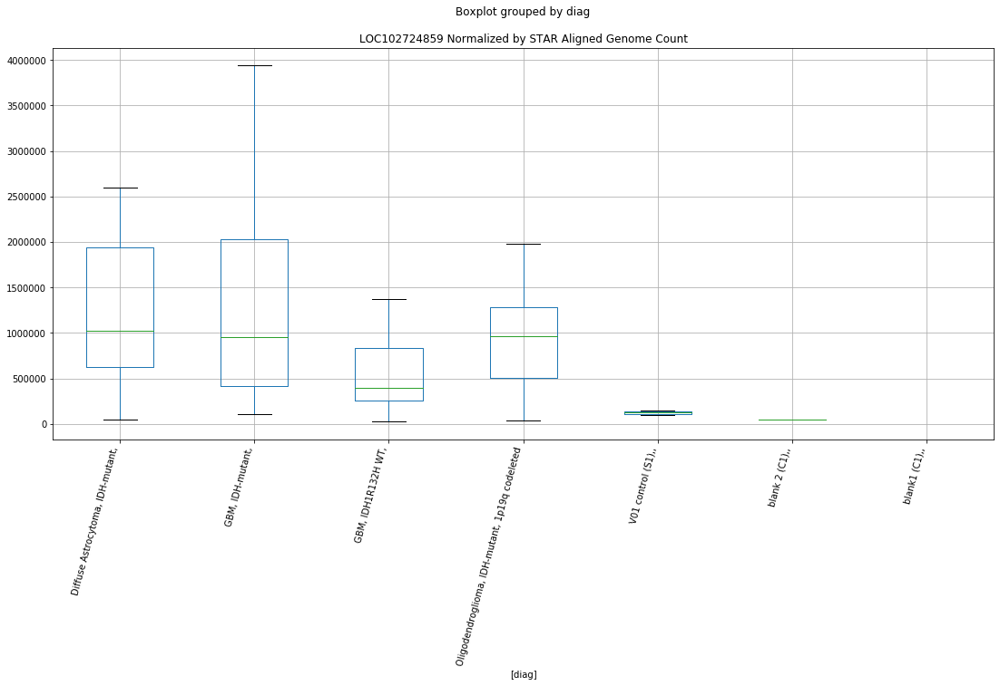

P2RX6 D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.4087341964586853
	p = 0.026939289032942116
P2RX6 D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.931055354649217
	p = 0.06938009245350027
P2RX6 D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.4087341964586853
	p = 0.026939289032942116
P2RX6 D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.931055354649217
	p = 0.06938009245350027
P2RX6 D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.914286141309156
	p = 0.07161773821742204
P2RX6 D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.914286141309156
	p = 0.07161773821742204


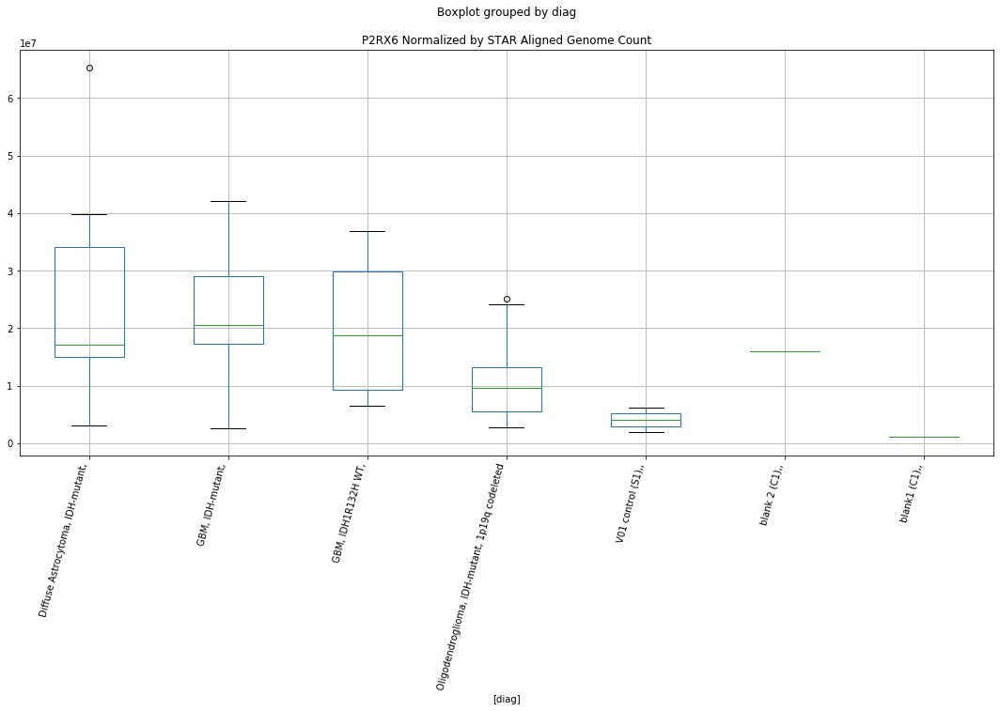

P2RX6 D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.406236516890424
	p = 0.02707788545704195
P2RX6 D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9250560798945264
	p = 0.07017337179341243
P2RX6 D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.406236516890424
	p = 0.02707788545704195
P2RX6 D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.9250560798945264
	p = 0.07017337179341243
P2RX6 D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.898112252286662
	p = 0.07383645758099047
P2RX6 D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.898112252286662
	p = 0.07383645758099047


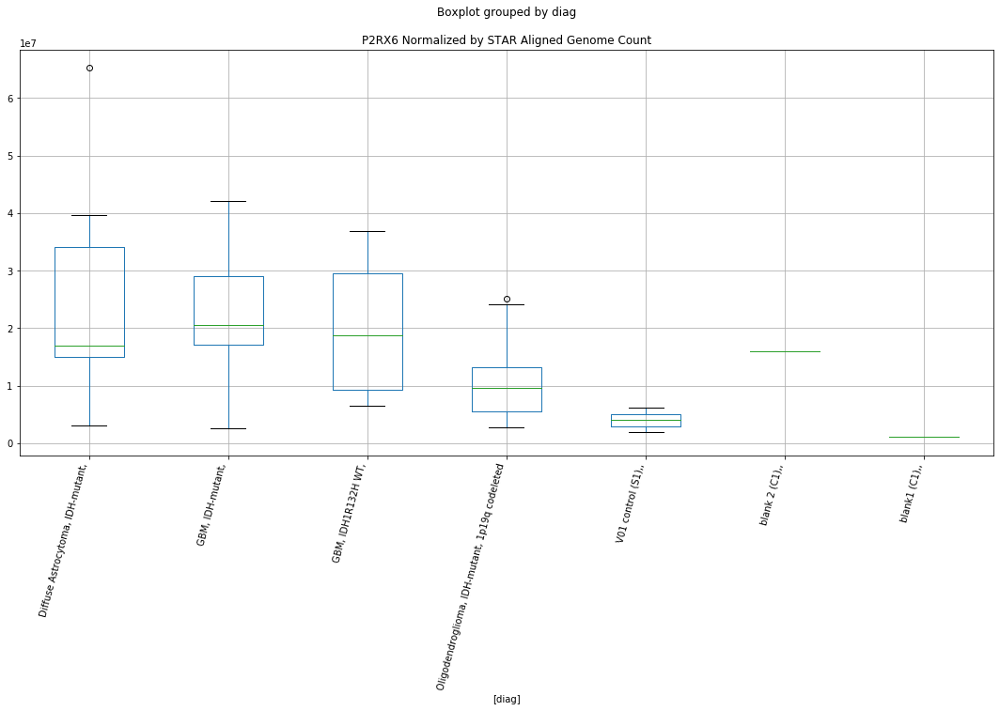

P2RX6 D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.406133735220687
	p = 0.027083603085401534
P2RX6 D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9250219932830137
	p = 0.0701779020055468
P2RX6 D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.406133735220687
	p = 0.027083603085401534
P2RX6 D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.9250219932830137
	p = 0.0701779020055468
P2RX6 D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.8980638013354576
	p = 0.07384319461555384
P2RX6 D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8980638013354576
	p = 0.07384319461555384


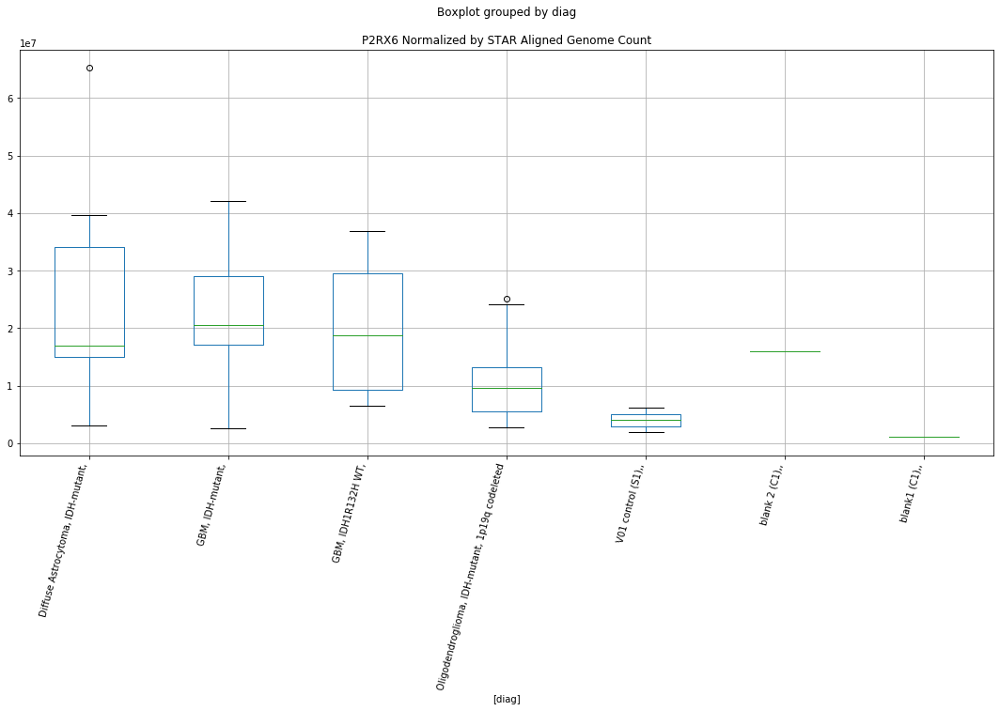

RARS2 Lexogen bbduk2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.868551011118478
	p = 0.0780494837759739
RARS2 Lexogen bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.868551011118478
	p = 0.0780494837759739


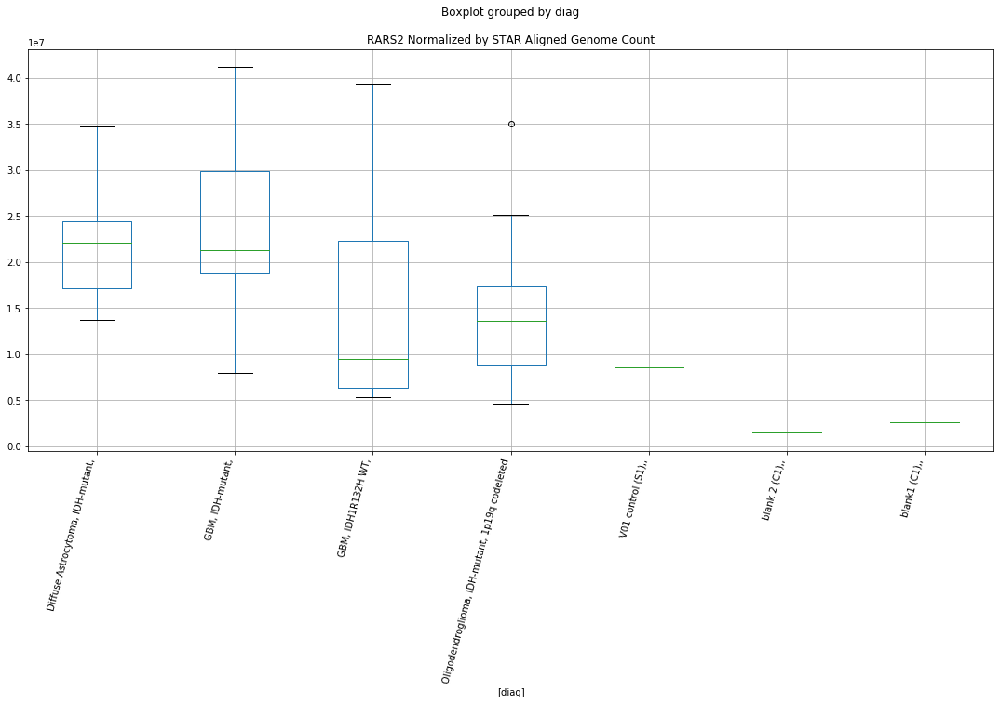

RARS2 Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8601177730188647
	p = 0.07928967698080915
RARS2 Lexogen bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.8601177730188647
	p = 0.07928967698080915


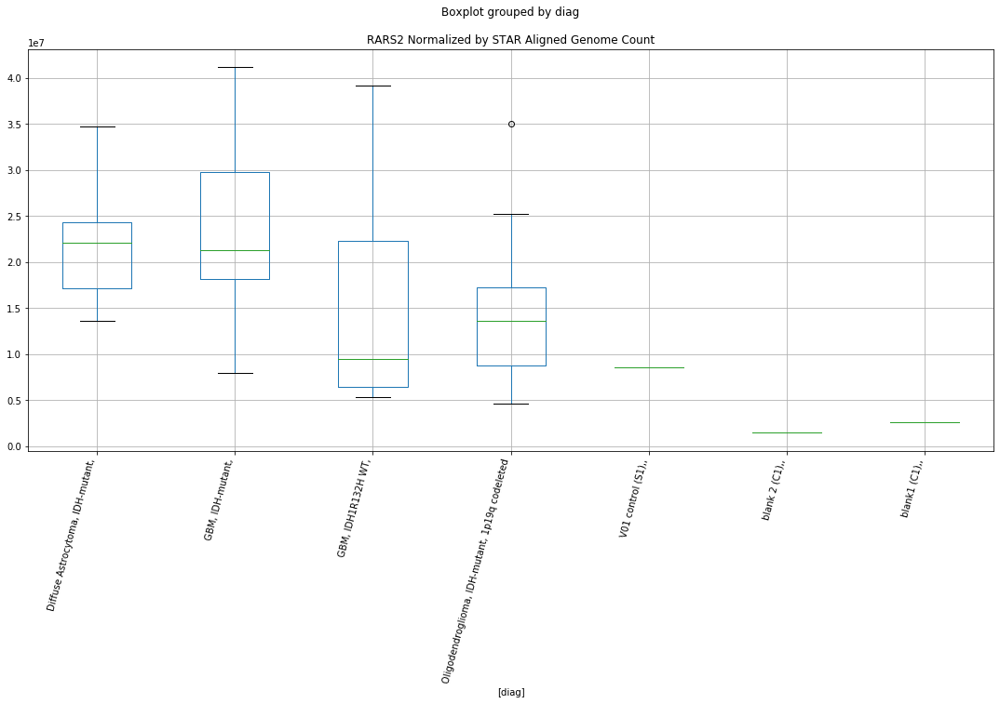

RARS2 Lexogen cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.892772071353433
	p = 0.07458228949962536
RARS2 Lexogen cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.892772071353433
	p = 0.07458228949962536


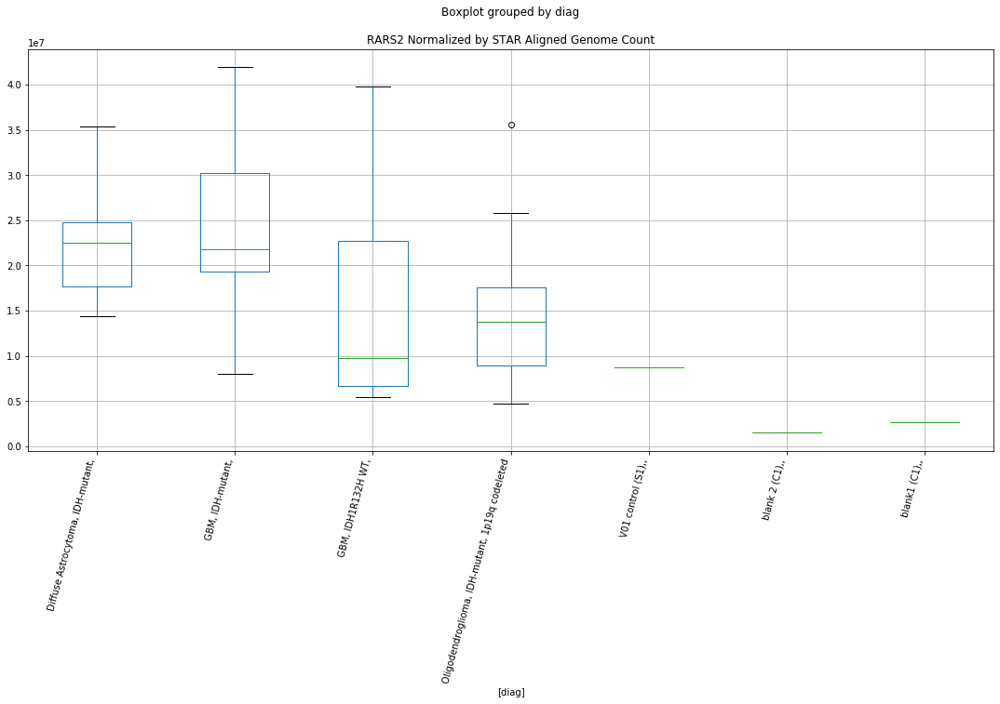

RARS2 Lexogen cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8894224966712534
	p = 0.07505350408293146
RARS2 Lexogen cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.8894224966712534
	p = 0.07505350408293146


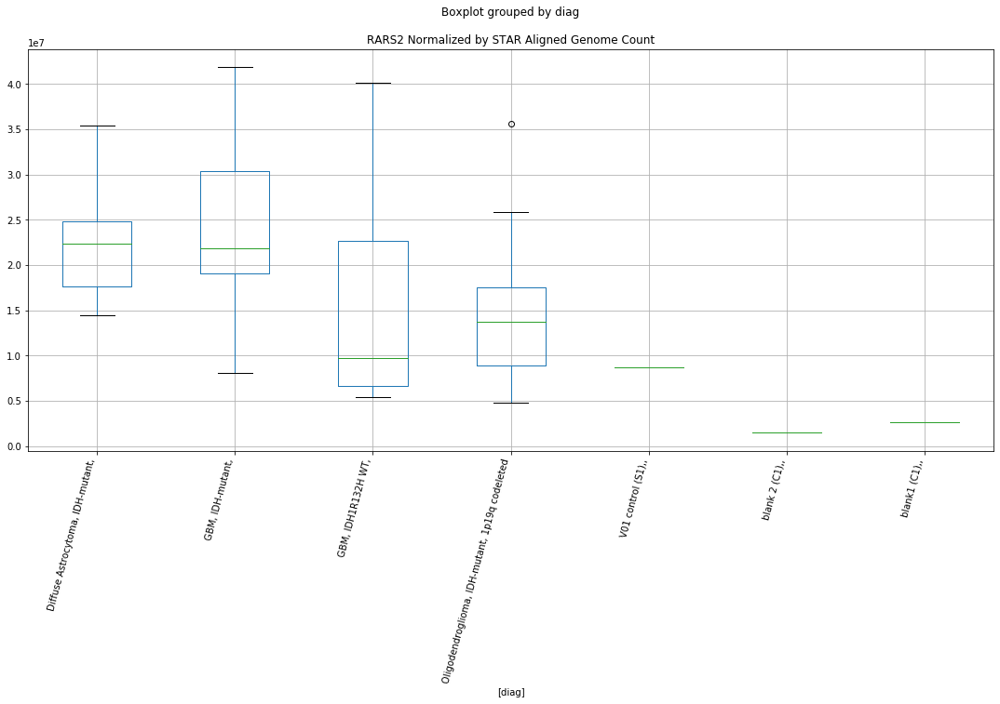

RARS2 Lexogen cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8882949155330129
	p = 0.07521272306029042
RARS2 Lexogen cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.8882949155330129
	p = 0.07521272306029042


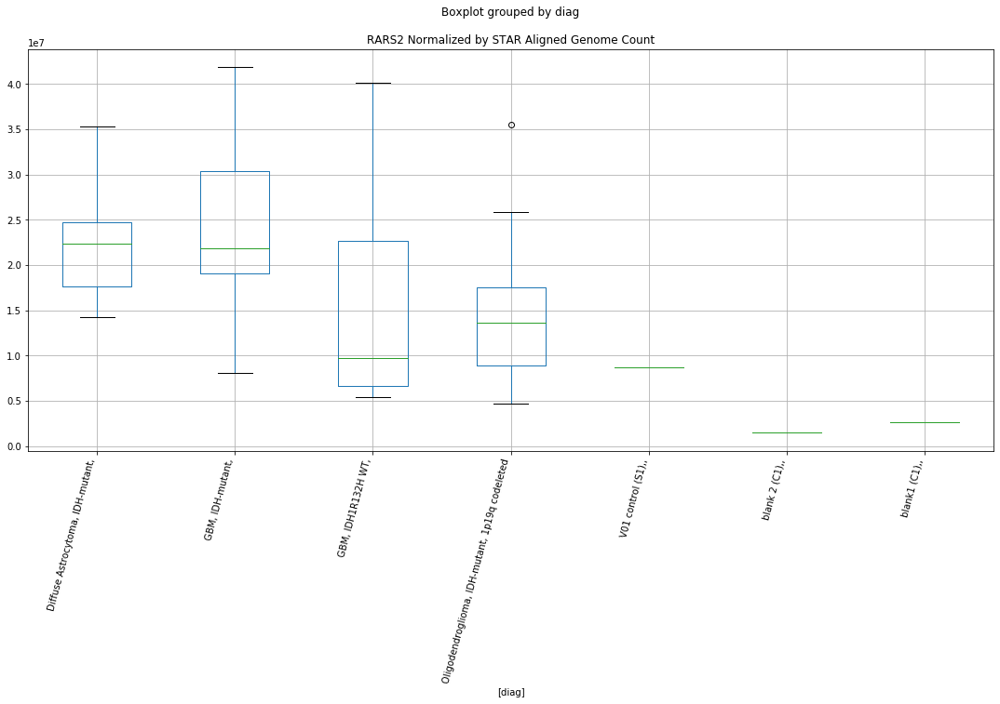

LOC100335030 Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.9206079950546195
	p = 0.07076673837981798
LOC100335030 Lexogen bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -1.9206079950546195
	p = 0.07076673837981798


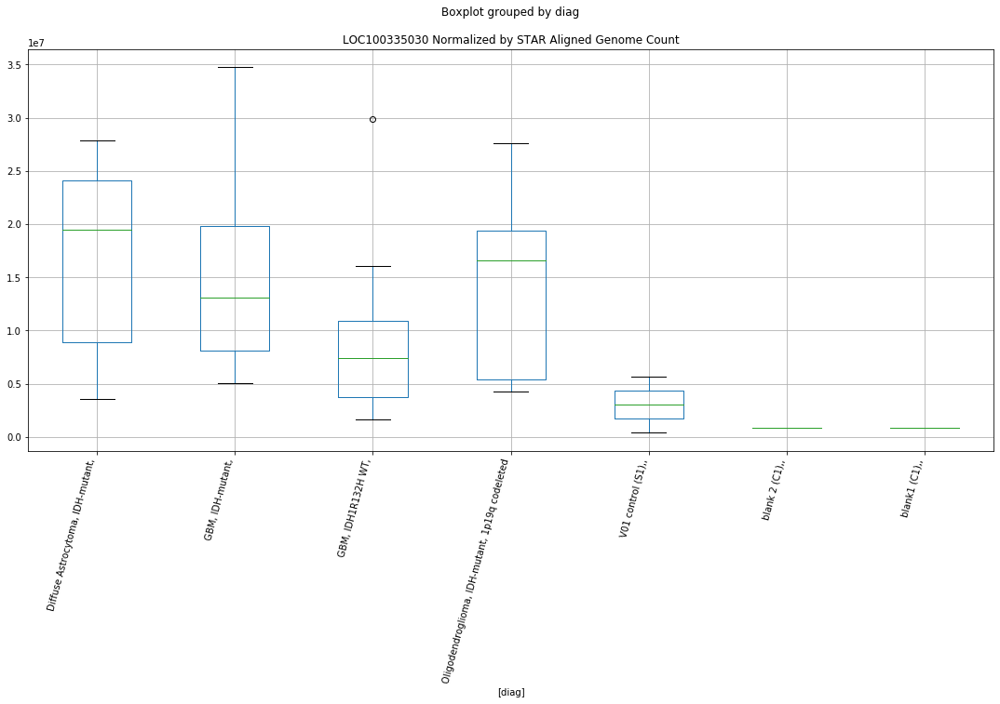

LOC100335030 Lexogen bbduk2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.047646090153064
	p = 0.055473656128405754
LOC100335030 Lexogen bbduk2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.047646090153064
	p = 0.055473656128405754


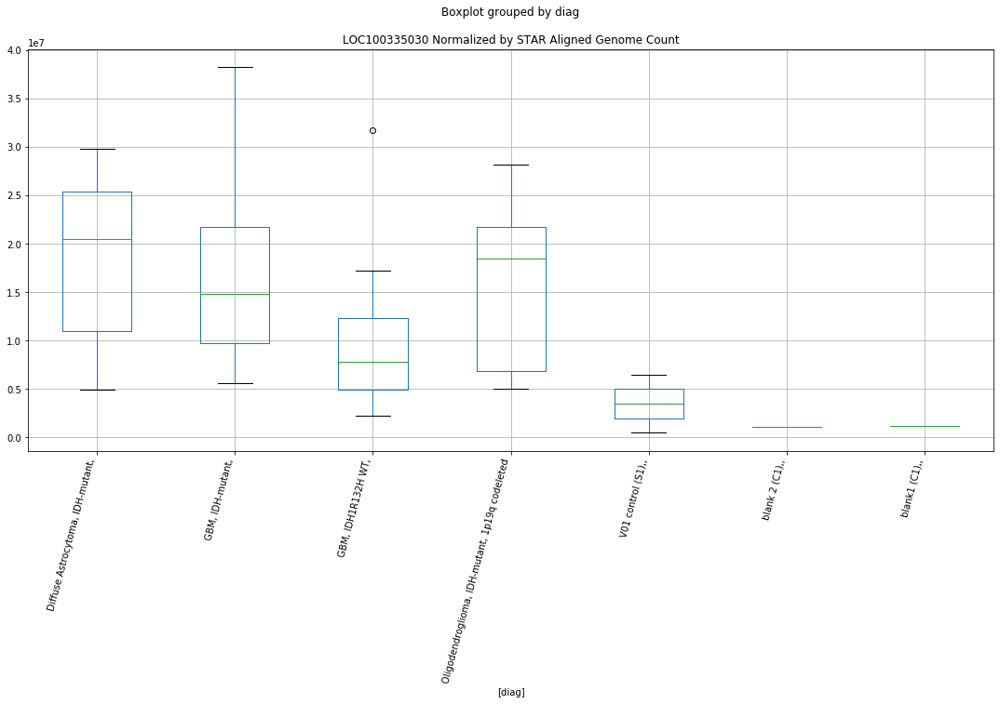

LOC100335030 Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.04932699846618
	p = 0.05529298897307245
LOC100335030 Lexogen bbduk3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.04932699846618
	p = 0.05529298897307245


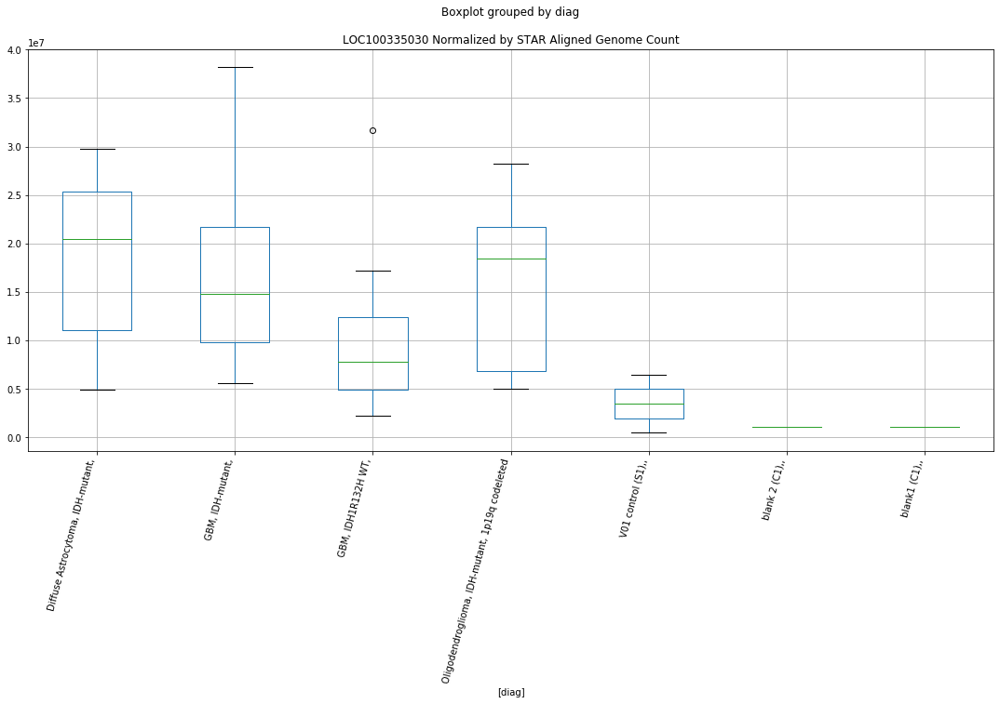

LOC100335030 Lexogen cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.039566323683875
	p = 0.0563495483053835
LOC100335030 Lexogen cutadapt1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.039566323683875
	p = 0.0563495483053835


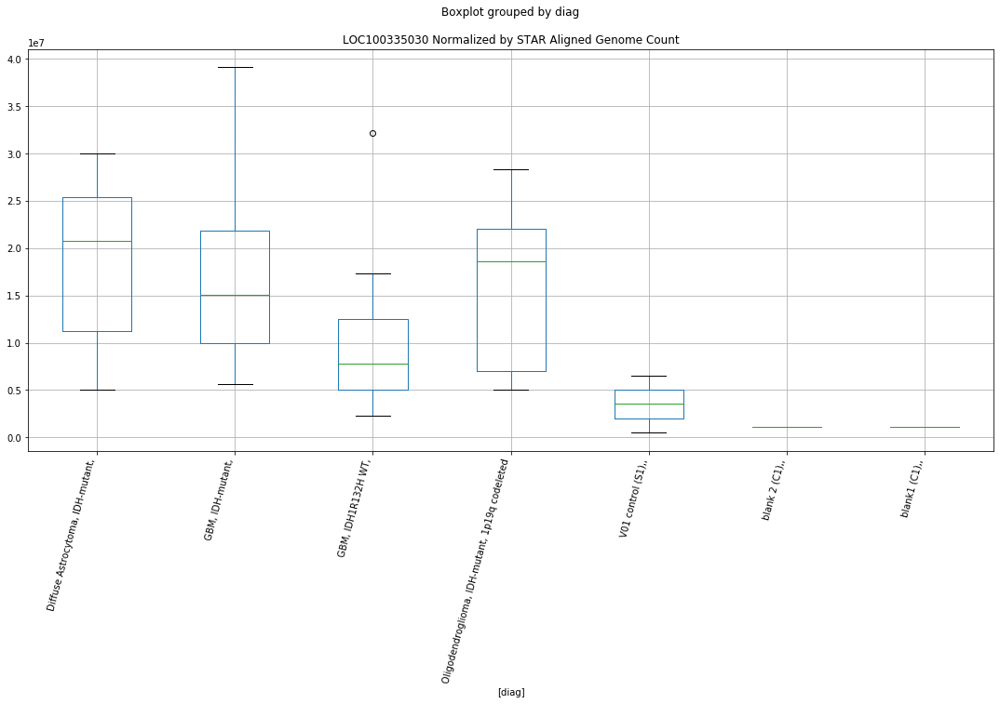

LOC100335030 Lexogen cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.043142577226084
	p = 0.05596033346168051
LOC100335030 Lexogen cutadapt2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.043142577226084
	p = 0.05596033346168051


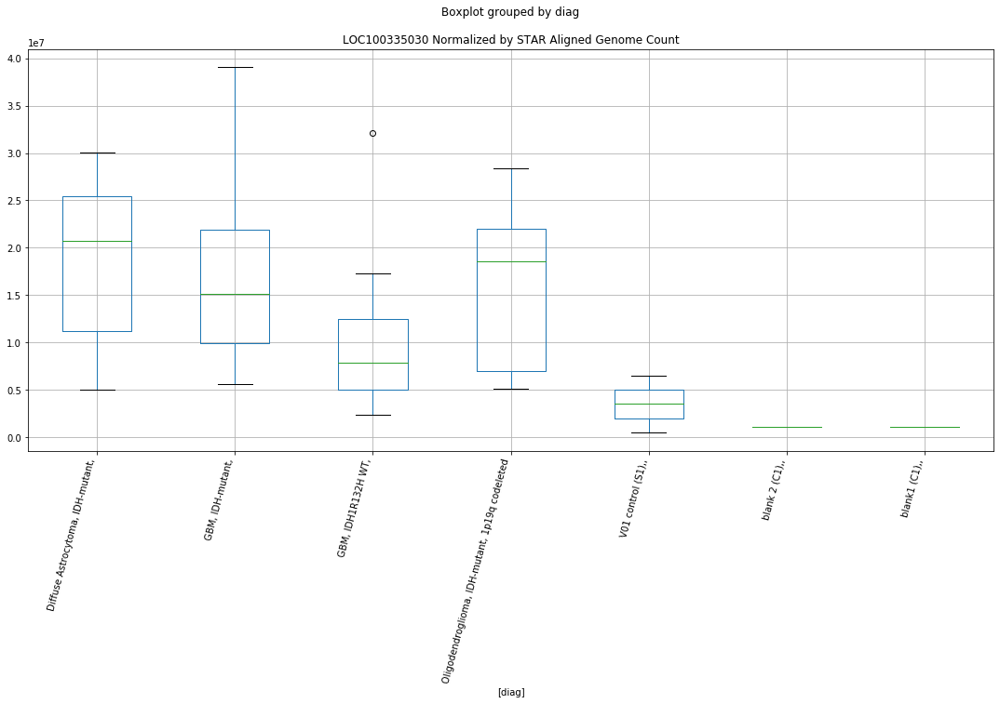

LOC100335030 Lexogen cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.043585108882609
	p = 0.0559123405069067
LOC100335030 Lexogen cutadapt3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.043585108882609
	p = 0.0559123405069067


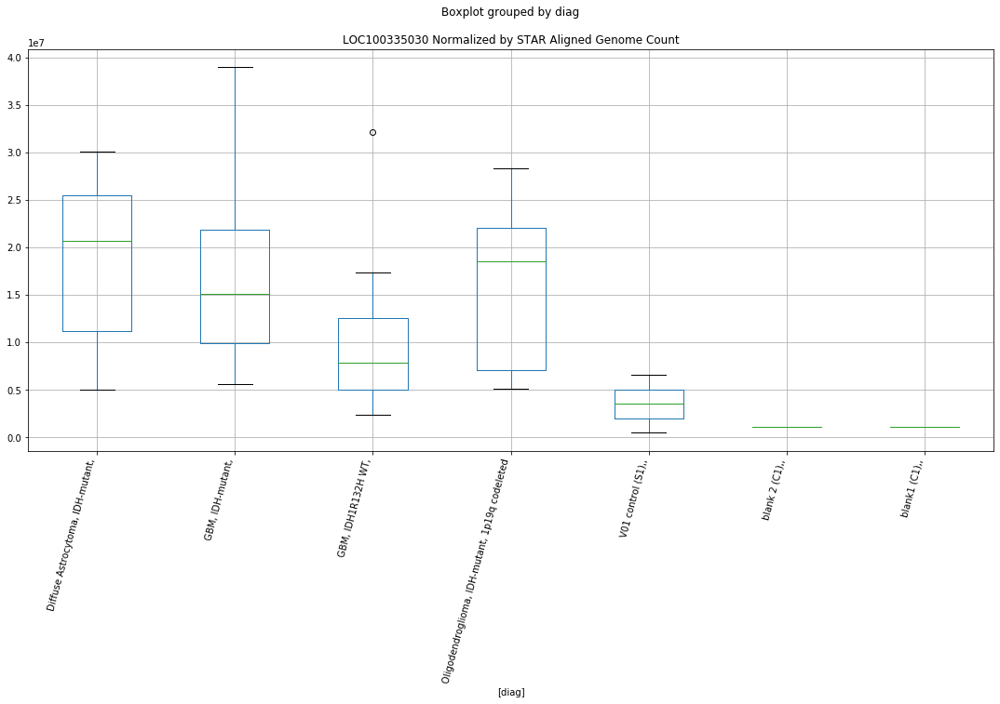

NAALADL2 D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0192829233080554
	p = 0.058603624469312714
NAALADL2 D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.0192829233080554
	p = 0.058603624469312714


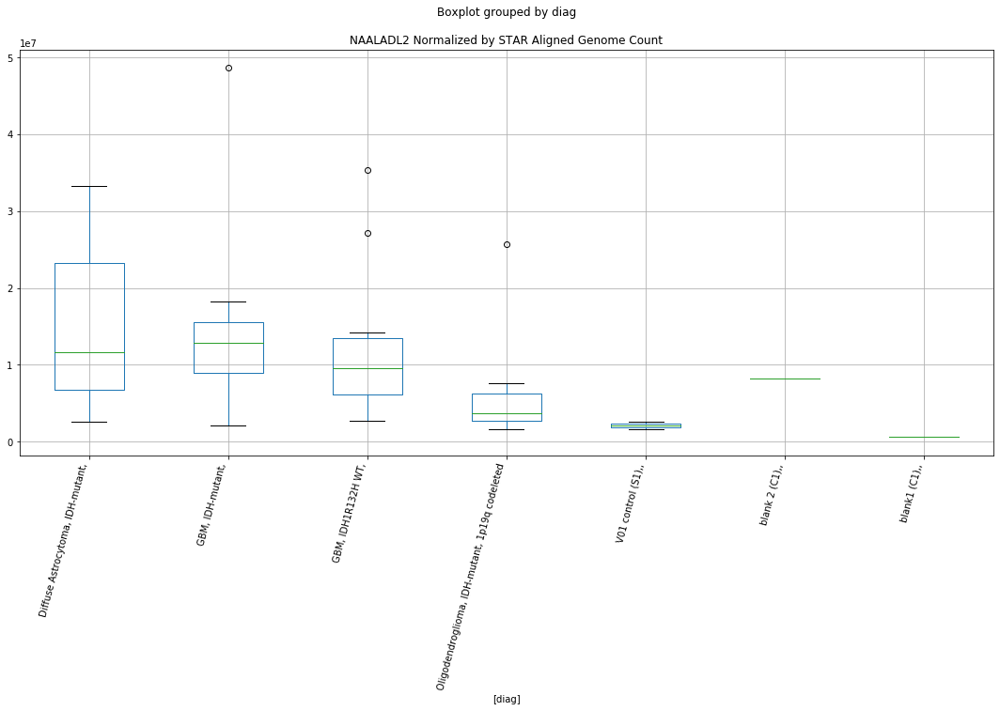

NAALADL2 D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0102179131694524
	p = 0.05963701801081105
NAALADL2 D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.0102179131694524
	p = 0.05963701801081105


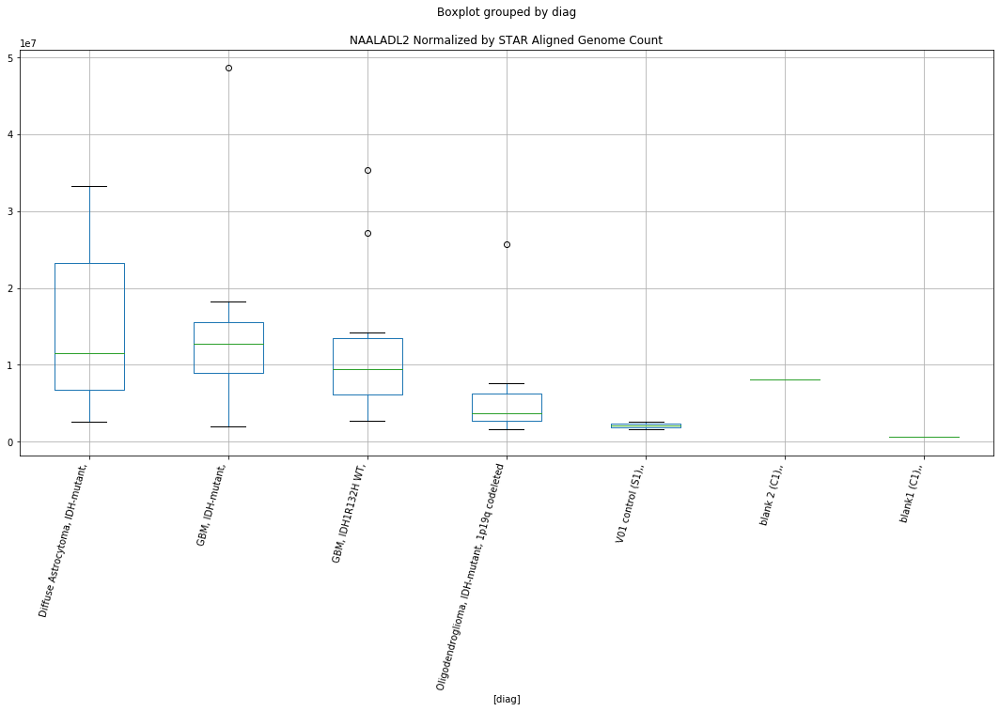

NAALADL2 D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0101890732728953
	p = 0.059640331700353724
NAALADL2 D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.0101890732728953
	p = 0.059640331700353724


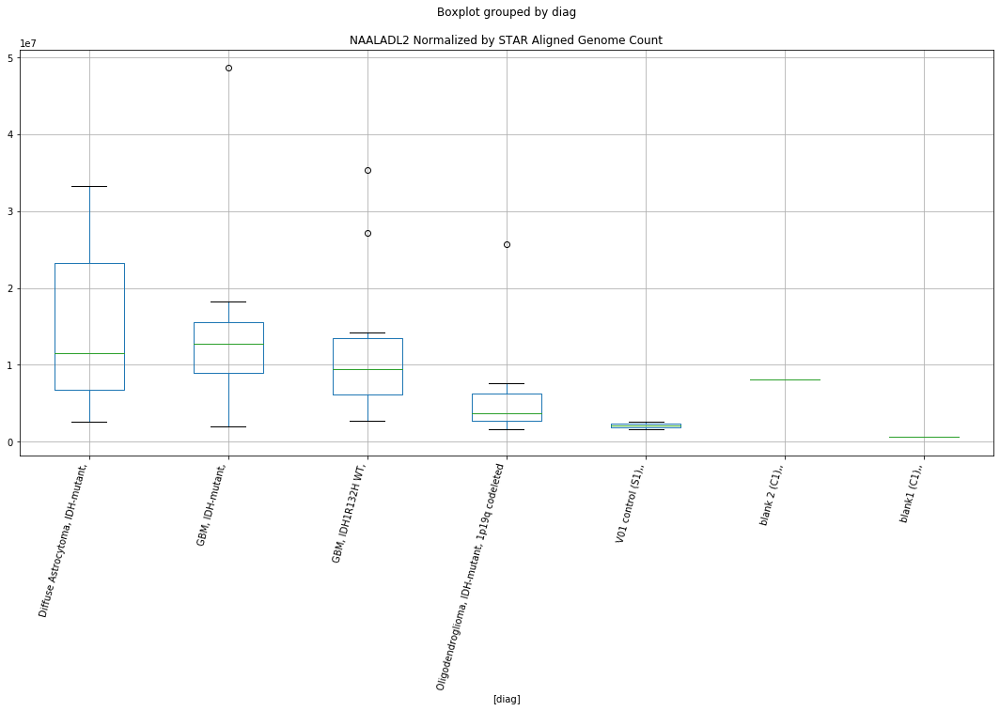

GOLGA2P10 D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9162996463602346
	p = 0.07134571368720358
GOLGA2P10 D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9162996463602346
	p = 0.07134571368720358


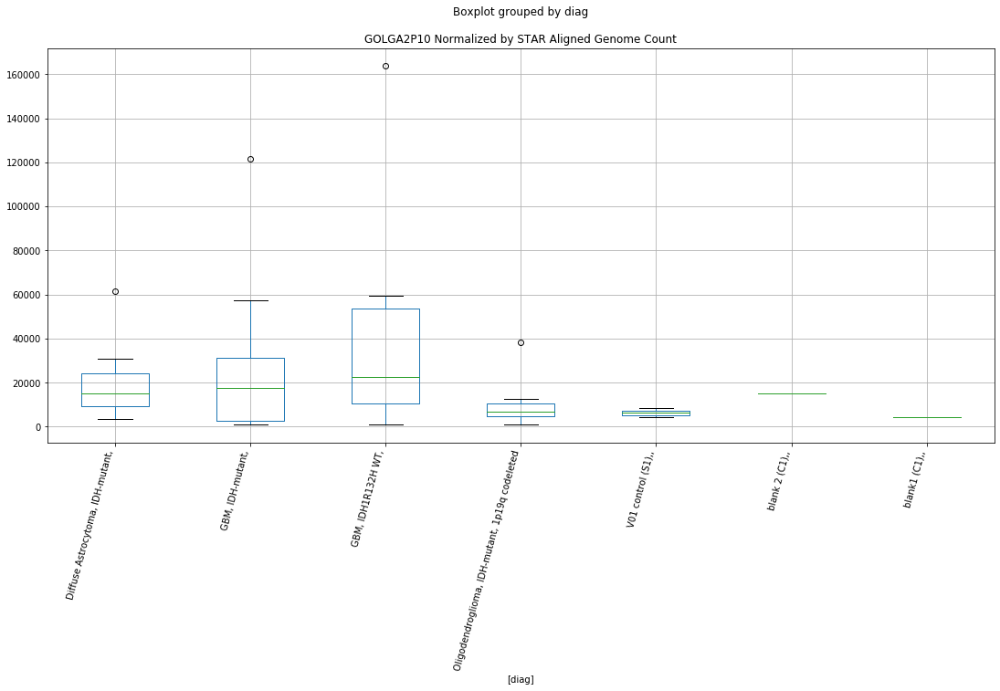

GOLGA2P10 D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9009755733850486
	p = 0.07343928336872774
GOLGA2P10 D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9009755733850486
	p = 0.07343928336872774


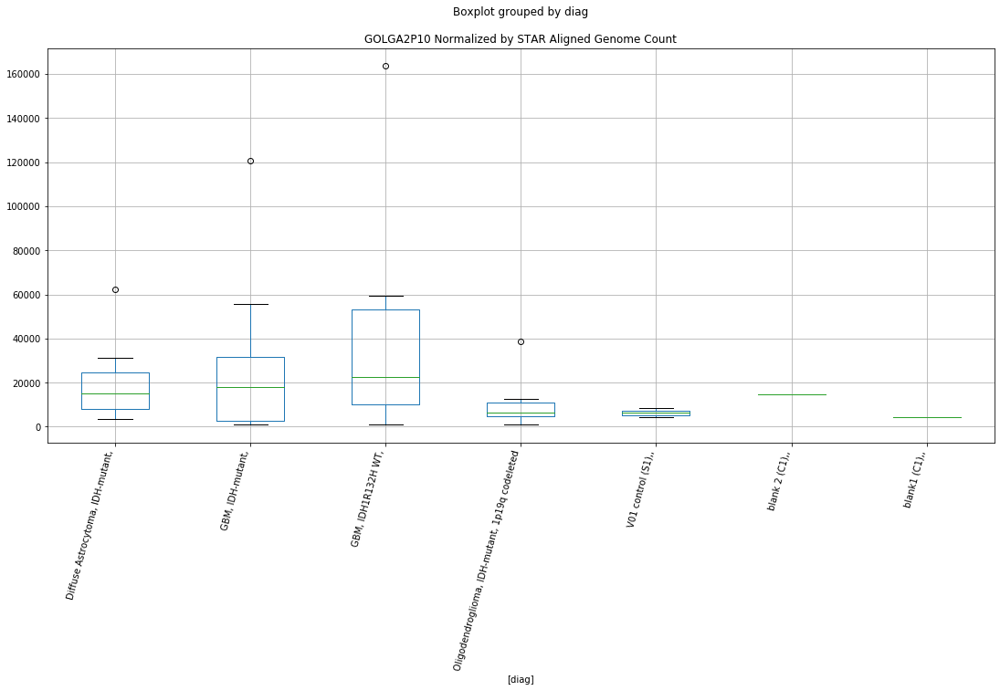

GOLGA2P10 Lexogen bbduk1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.2831854973528327
	p = 0.034790754515040094
GOLGA2P10 Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.673570443961342
	p = 0.01549646302695433
GOLGA2P10 Lexogen bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = 2.016348083820785
	p = 0.05893641228100191
GOLGA2P10 Lexogen bbduk1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.2831854973528327
	p = 0.034790754515040094
GOLGA2P10 Lexogen bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.673570443961342
	p = 0.01549646302695433
GOLGA2P10 Lexogen bbduk1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -2.016348083820785
	p = 0.05893641228100191


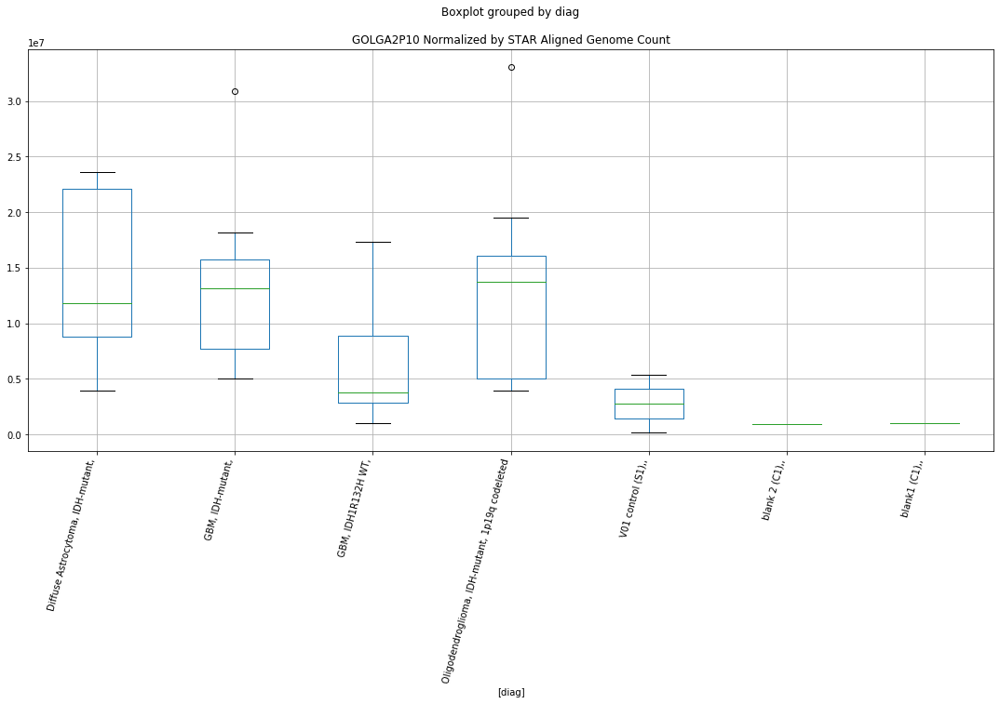

GOLGA2P10 Lexogen bbduk2 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.4500748175985927
	p = 0.024739639028133503
GOLGA2P10 Lexogen bbduk2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.8517103943910316
	p = 0.010592689541770513
GOLGA2P10 Lexogen bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = 2.1419458468065855
	p = 0.04612478295935612
GOLGA2P10 Lexogen bbduk2 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.4500748175985927
	p = 0.024739639028133503
GOLGA2P10 Lexogen bbduk2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.8517103943910316
	p = 0.010592689541770513
GOLGA2P10 Lexogen bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -2.1419458468065855
	p = 0.04612478295935612


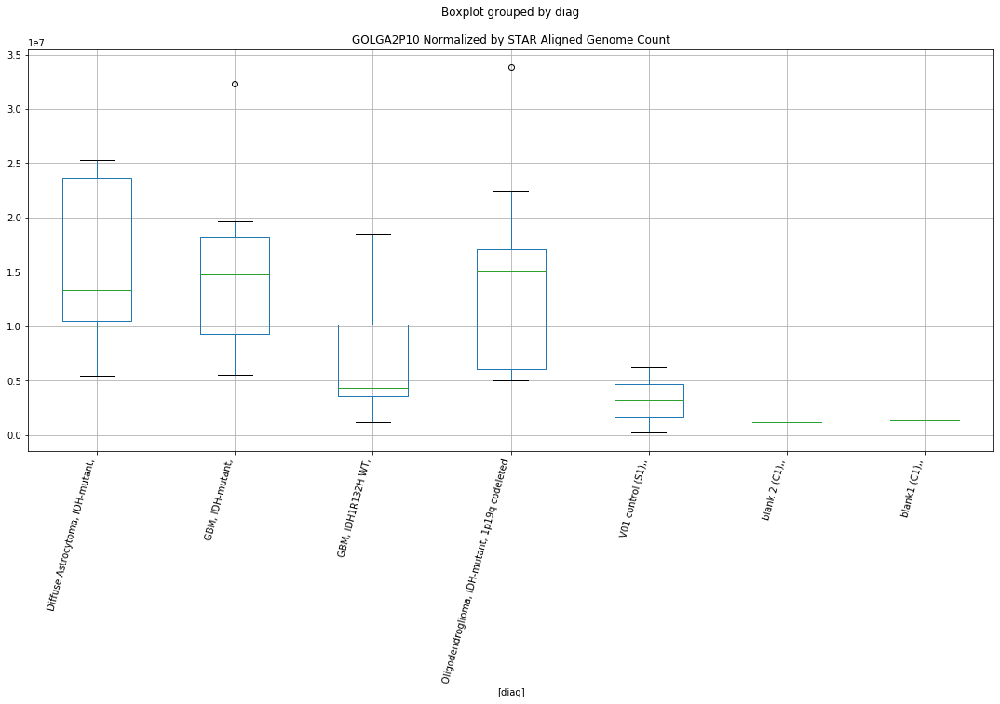

GOLGA2P10 Lexogen bbduk3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.4414451542787368
	p = 0.02518440502278144
GOLGA2P10 Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.84755099027404
	p = 0.010687908826582125
GOLGA2P10 Lexogen bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = 2.1426660561266515
	p = 0.046059266476136465
GOLGA2P10 Lexogen bbduk3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.4414451542787368
	p = 0.02518440502278144
GOLGA2P10 Lexogen bbduk3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.84755099027404
	p = 0.010687908826582125
GOLGA2P10 Lexogen bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -2.1426660561266515
	p = 0.046059266476136465


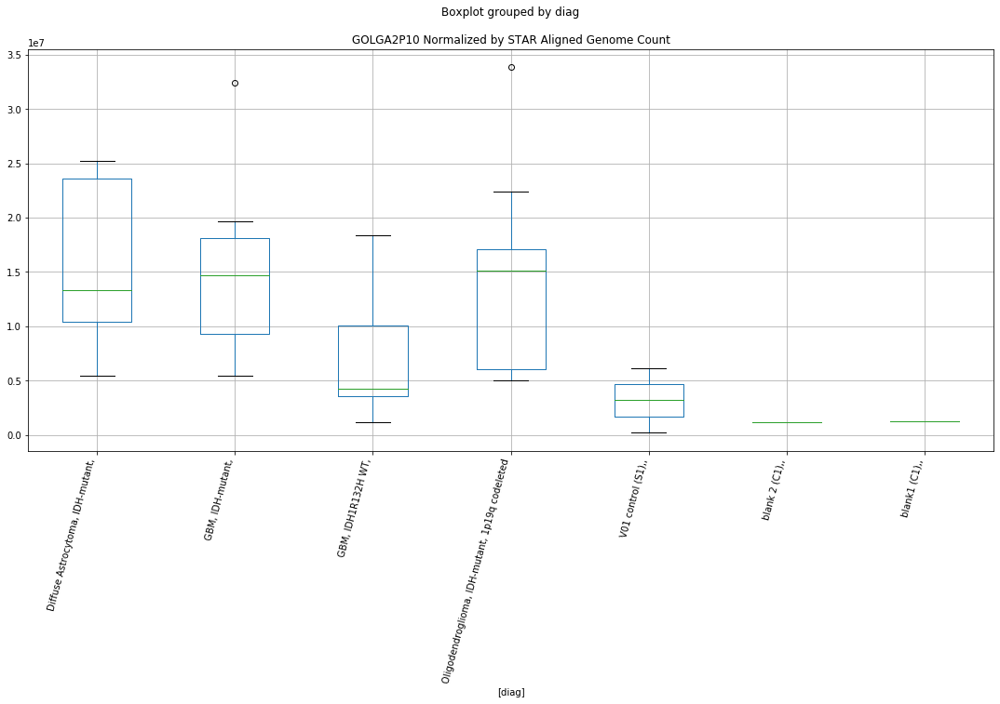

GOLGA2P10 Lexogen cutadapt1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.4830888713655184
	p = 0.02310530965176352
GOLGA2P10 Lexogen cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.862251784271156
	p = 0.01035501735763104
GOLGA2P10 Lexogen cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = 2.143583632071352
	p = 0.045975918899515925
GOLGA2P10 Lexogen cutadapt1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.4830888713655184
	p = 0.02310530965176352
GOLGA2P10 Lexogen cutadapt1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.862251784271156
	p = 0.01035501735763104
GOLGA2P10 Lexogen cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -2.143583632071352
	p = 0.045975918899515925


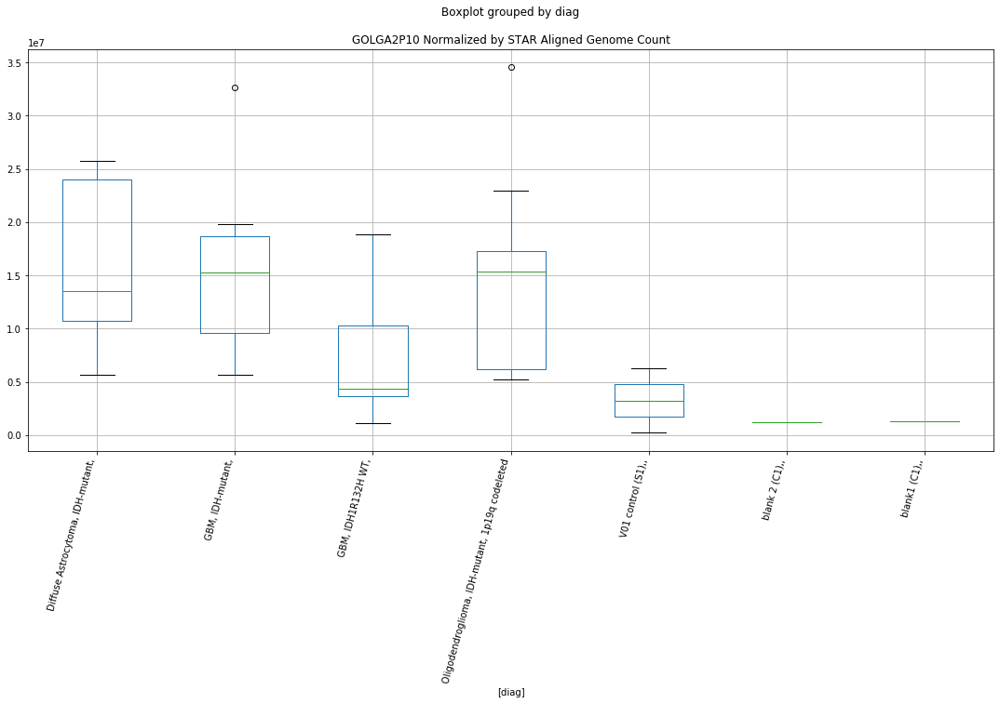

GOLGA2P10 Lexogen cutadapt2 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.480242504304335
	p = 0.023242113624921158
GOLGA2P10 Lexogen cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.86235380232879
	p = 0.010352742509497925
GOLGA2P10 Lexogen cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = 2.1400636572122456
	p = 0.04629640514608553
GOLGA2P10 Lexogen cutadapt2 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.480242504304335
	p = 0.023242113624921158
GOLGA2P10 Lexogen cutadapt2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.86235380232879
	p = 0.010352742509497925
GOLGA2P10 Lexogen cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -2.1400636572122456
	p = 0.04629640514608553


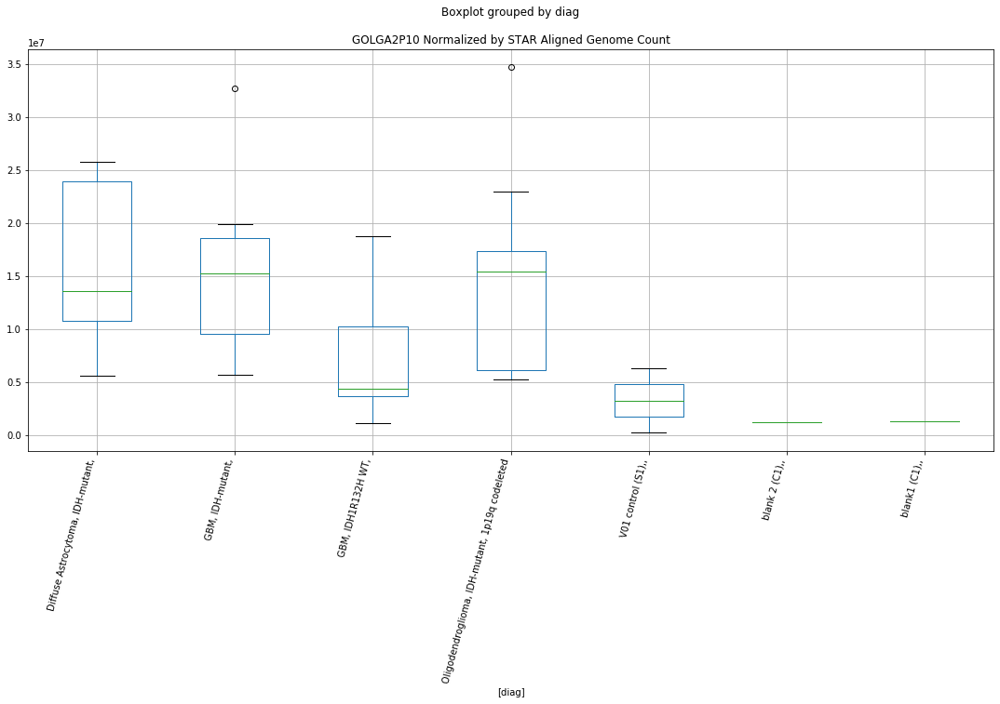

GOLGA2P10 Lexogen cutadapt3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.4796592042913526
	p = 0.02327024251626262
GOLGA2P10 Lexogen cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.863358398194426
	p = 0.010330367260779018
GOLGA2P10 Lexogen cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = 2.139793157578864
	p = 0.04632111774597726
GOLGA2P10 Lexogen cutadapt3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.4796592042913526
	p = 0.02327024251626262
GOLGA2P10 Lexogen cutadapt3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.863358398194426
	p = 0.010330367260779018
GOLGA2P10 Lexogen cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -2.139793157578864
	p = 0.04632111774597726


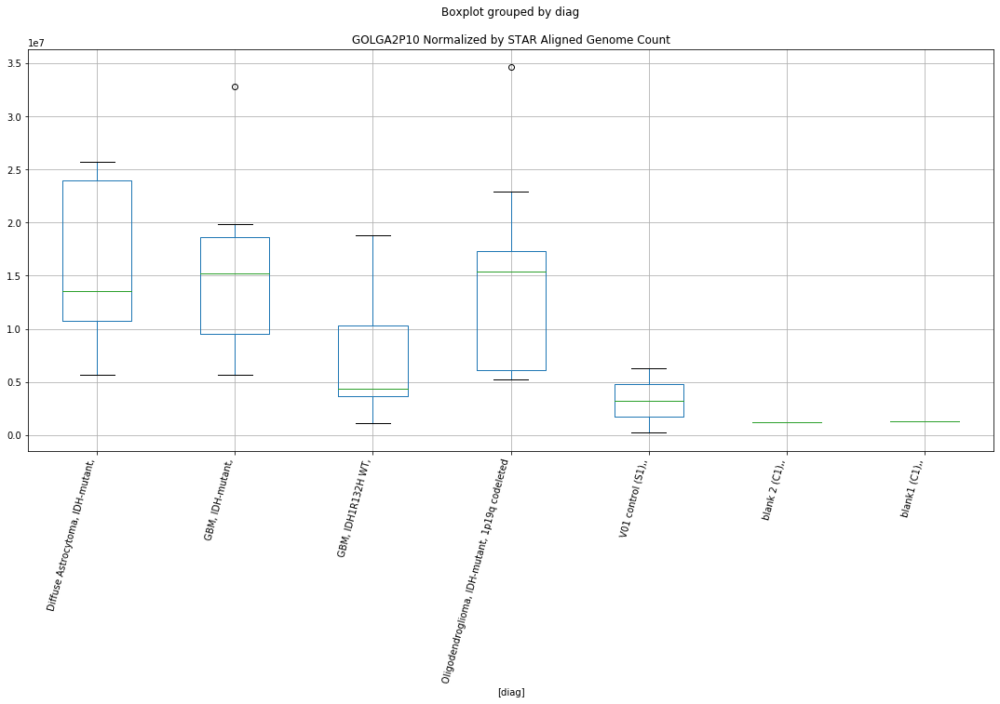

RNA45SN2 D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8835321928506827
	p = 0.07588854204189402
RNA45SN2 D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8835321928506827
	p = 0.07588854204189402


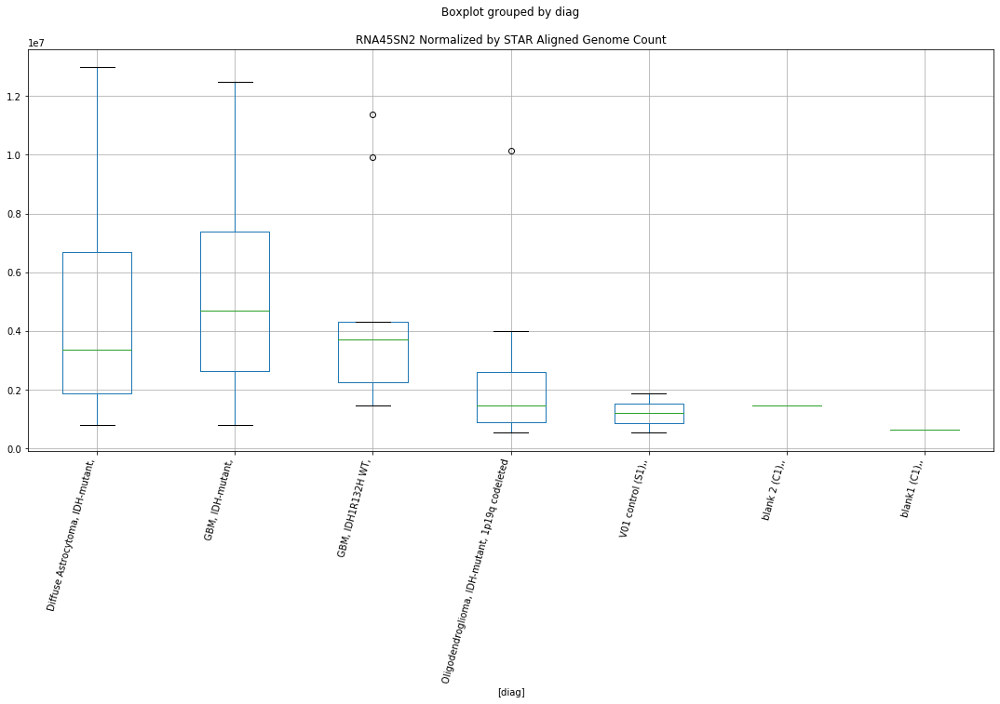

RNA45SN3 D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.861720161547352
	p = 0.07905270050514313
RNA45SN3 D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.861720161547352
	p = 0.07905270050514313


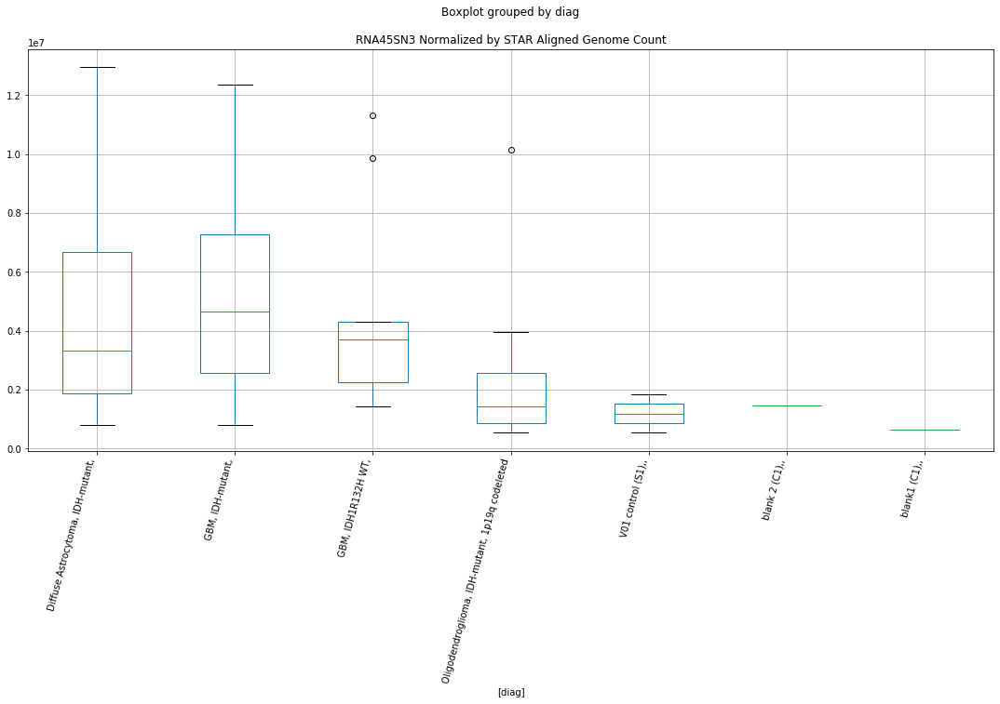

RNA45SN4 D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.889733343721767
	p = 0.0750096637421456
RNA45SN4 D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.889733343721767
	p = 0.0750096637421456


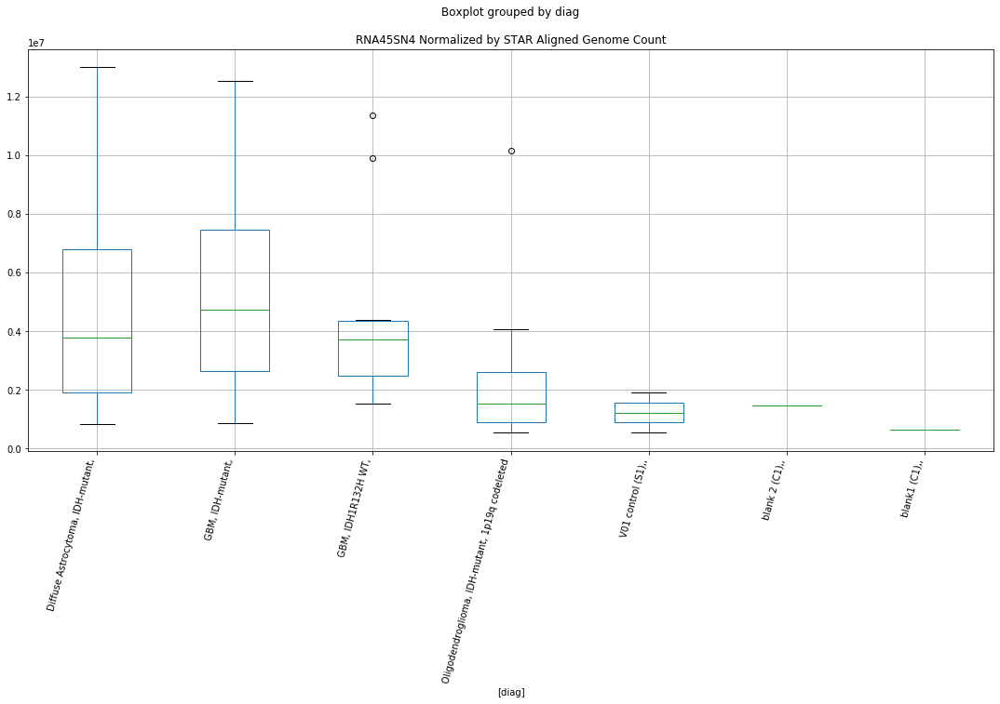

RNA45SN1 D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8876280338237197
	p = 0.07530703009465586
RNA45SN1 D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8876280338237197
	p = 0.07530703009465586


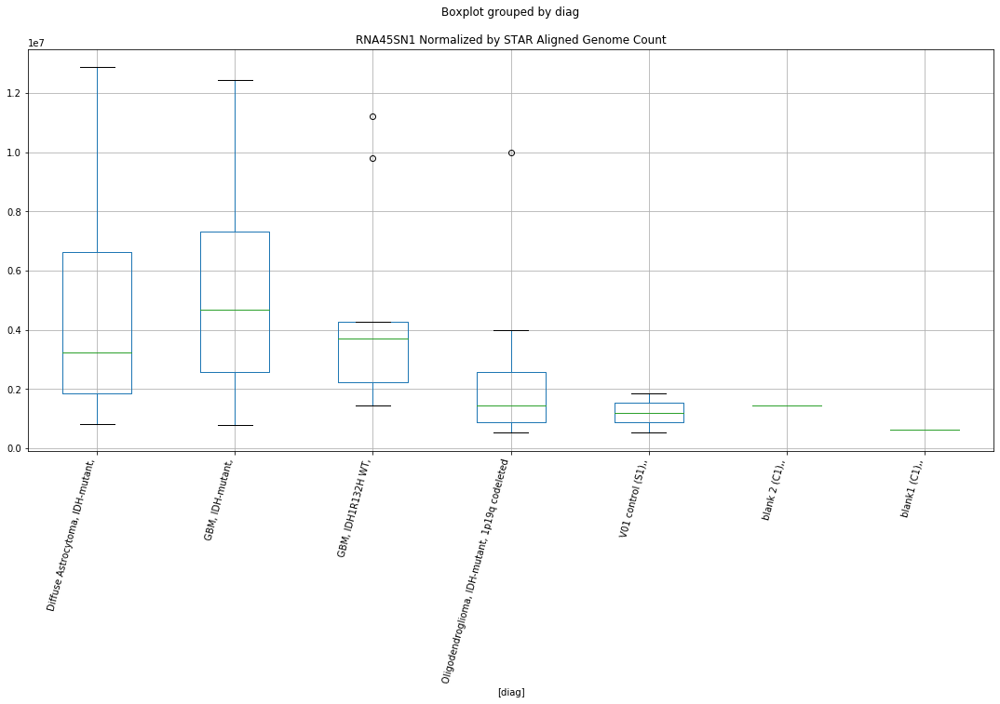

RNA45SN5 D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8867428582691645
	p = 0.0754323688141516
RNA45SN5 D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8867428582691645
	p = 0.0754323688141516


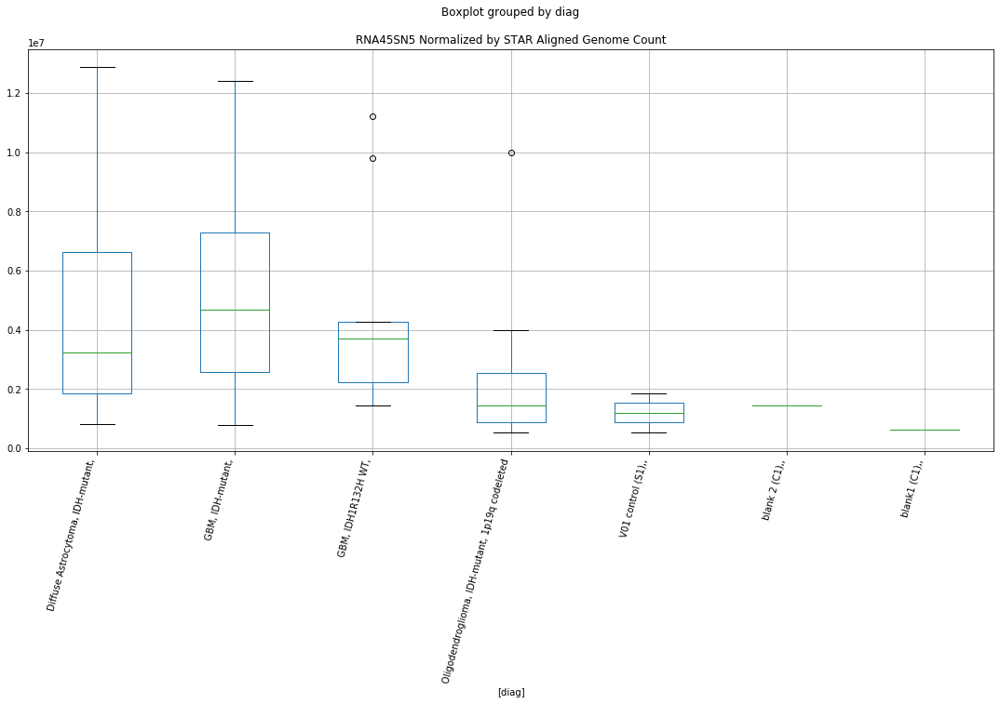

AHDC1 D-plex bbduk1 : GBM, IDH-mutant, - Diffuse Astrocytoma, IDH-mutant,
	t = 2.142588916553055
	p = 0.04606627969544185
AHDC1 D-plex bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH-mutant,
	t = -2.142588916553055
	p = 0.04606627969544185


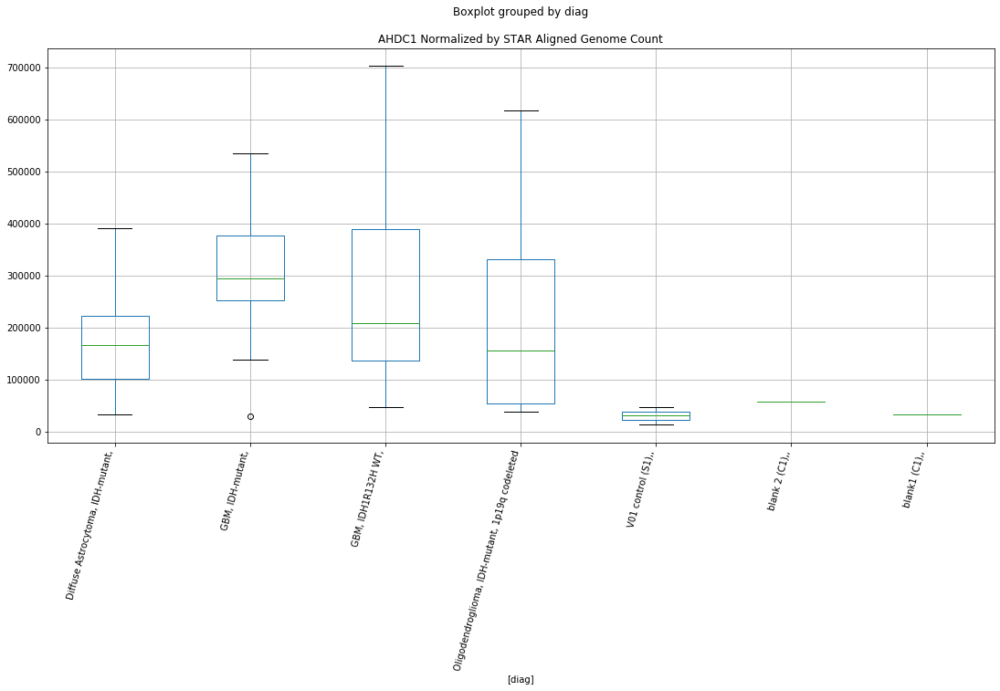

AHDC1 D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.883848450510387
	p = 0.07584349984373254
AHDC1 D-plex bbduk2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8708598010400554
	p = 0.07771295228316885
AHDC1 D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.883848450510387
	p = 0.07584349984373254
AHDC1 D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.8708598010400554
	p = 0.07771295228316885
AHDC1 D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.798152052545653
	p = 0.011883684781122226
AHDC1 D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.798152052545653
	p = 0.011883684781122226


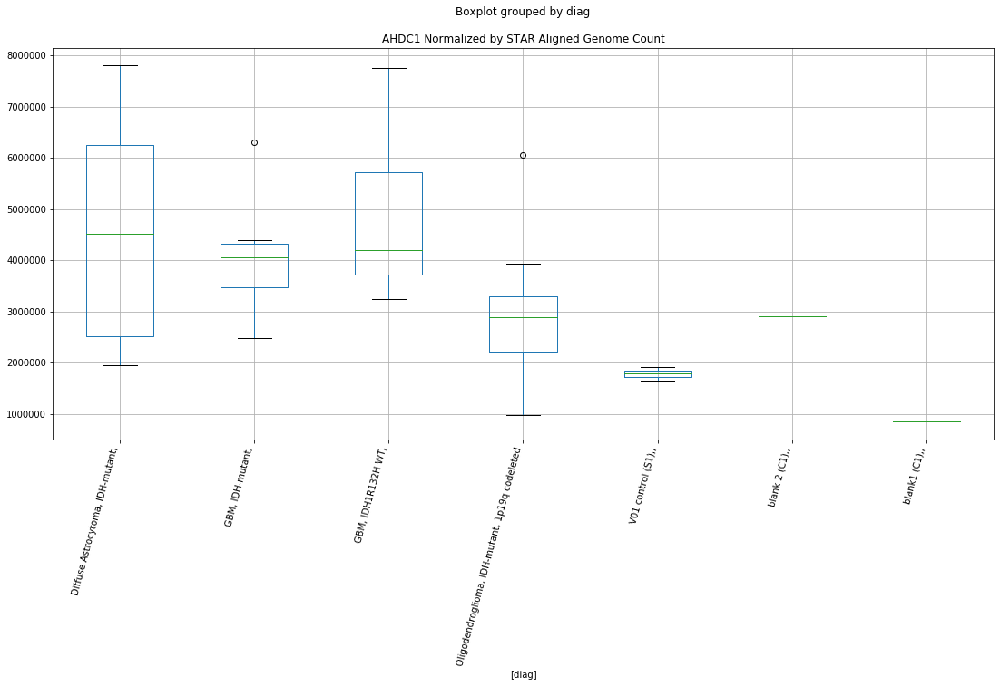

AHDC1 D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9192449089847063
	p = 0.07094946266062938
AHDC1 D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9192449089847063
	p = 0.07094946266062938
AHDC1 D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.3224225934194536
	p = 0.032133783023225934
AHDC1 D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.3224225934194536
	p = 0.032133783023225934


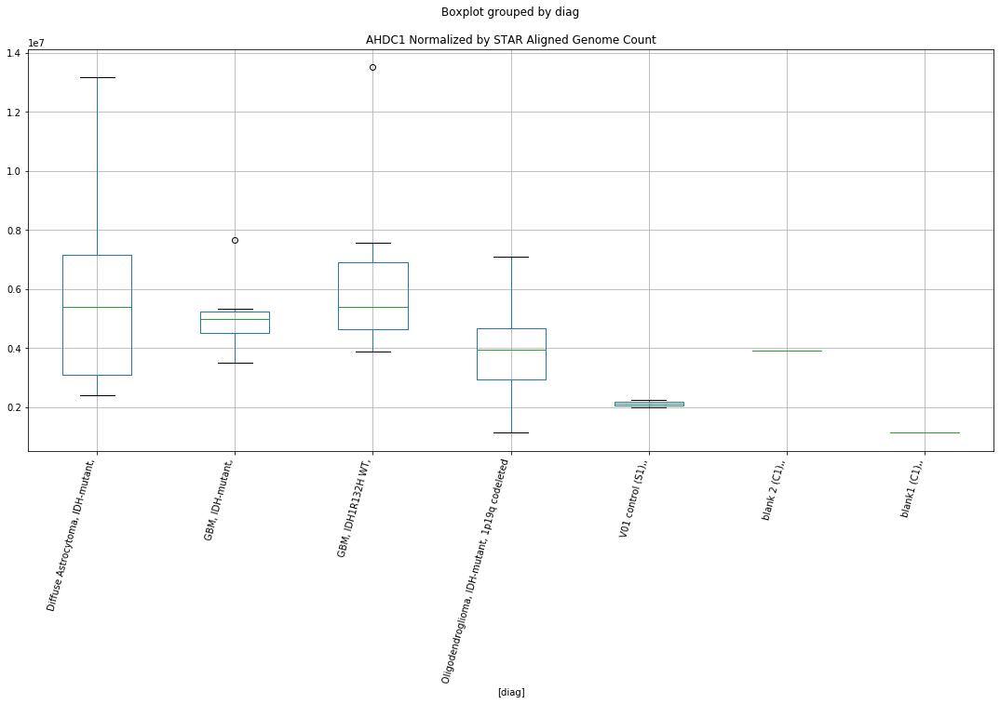

AHDC1 D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.620253452920623
	p = 0.017344083810348663
AHDC1 D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.620253452920623
	p = 0.017344083810348663


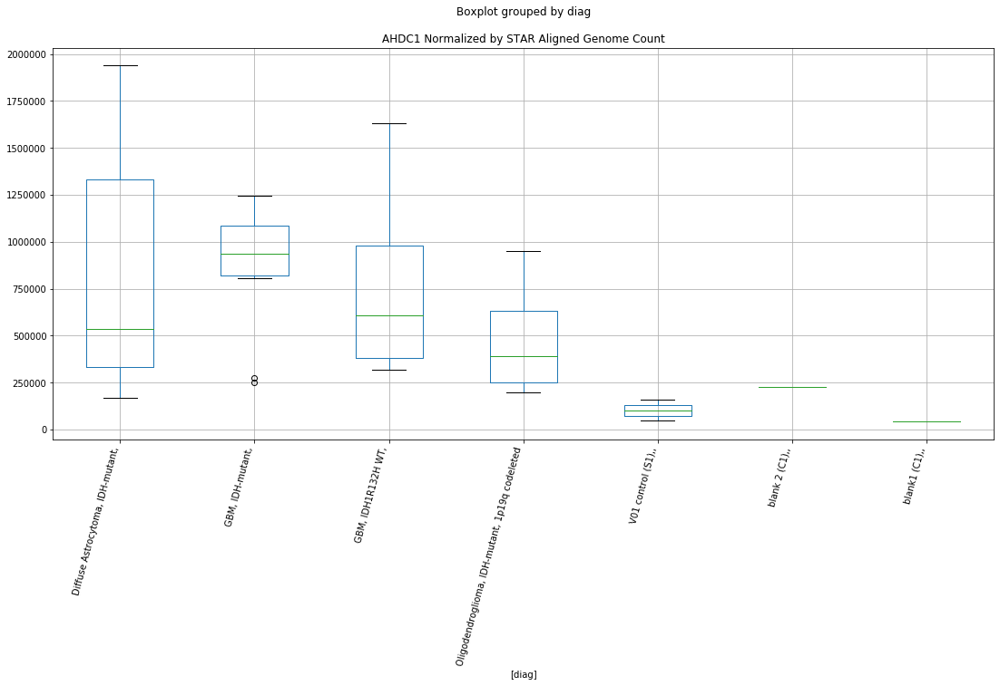

AHDC1 D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.6193064829667403
	p = 0.017378720534217785
AHDC1 D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.6193064829667403
	p = 0.017378720534217785


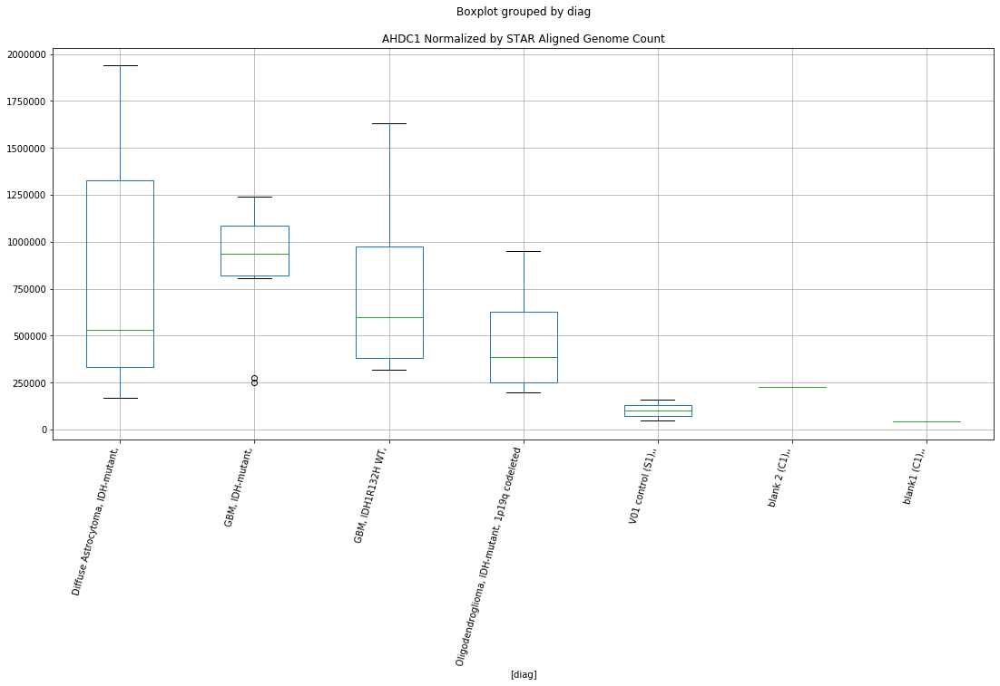

AHDC1 D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.6191022913152464
	p = 0.017386197733353686
AHDC1 D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.6191022913152464
	p = 0.017386197733353686


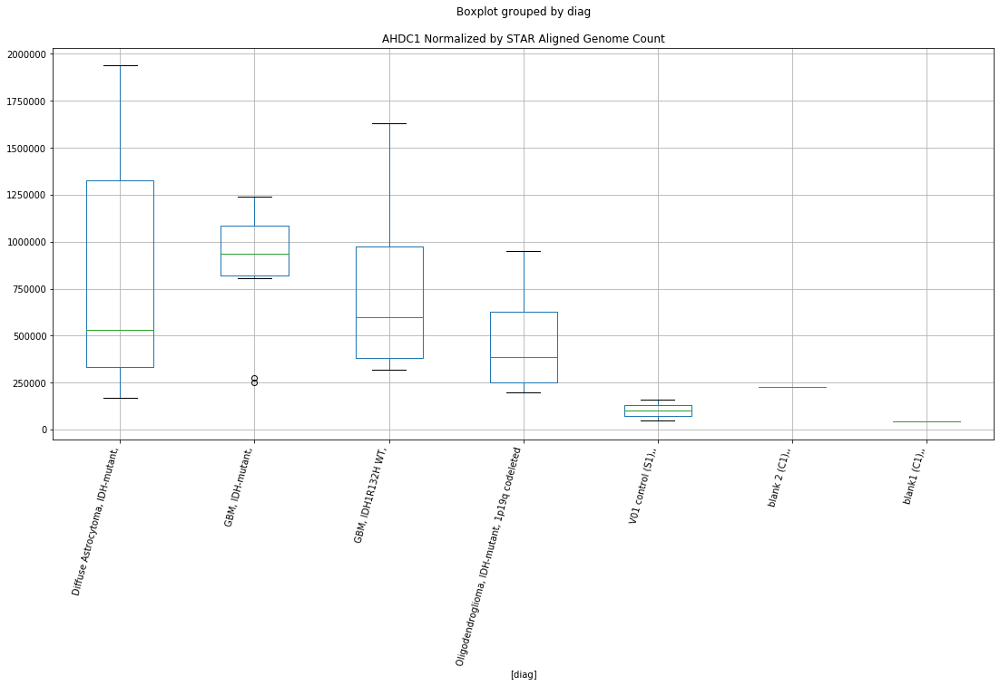

EDEM3 D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.548722218707262
	p = 0.020153533395303534
EDEM3 D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.548722218707262
	p = 0.020153533395303534
EDEM3 D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.957050508921646
	p = 0.0660343265109011
EDEM3 D-plex bbduk1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.957050508921646
	p = 0.0660343265109011


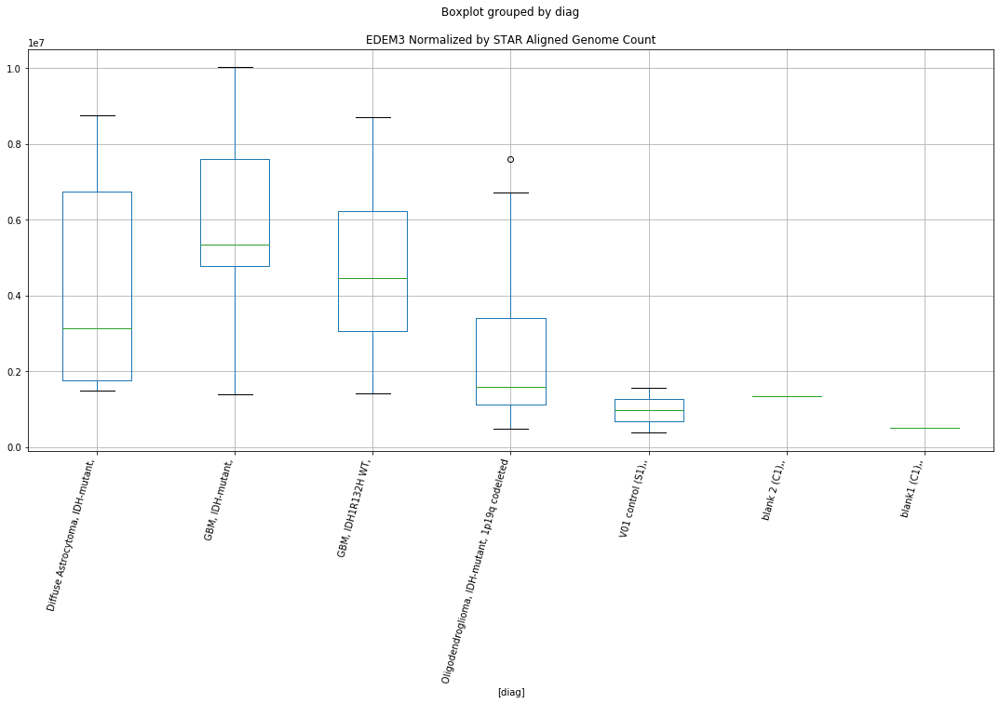

EDEM3 D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.542024225069456
	p = 0.020437600187725148
EDEM3 D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.542024225069456
	p = 0.020437600187725148


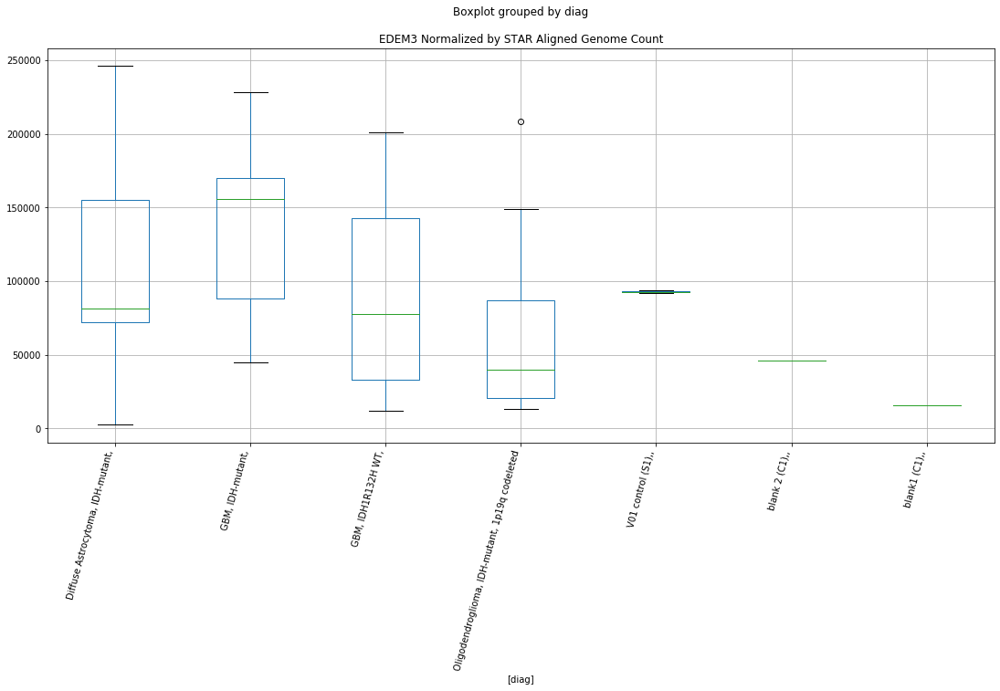

EDEM3 D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.451045064919525
	p = 0.024690096928978205
EDEM3 D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.451045064919525
	p = 0.024690096928978205


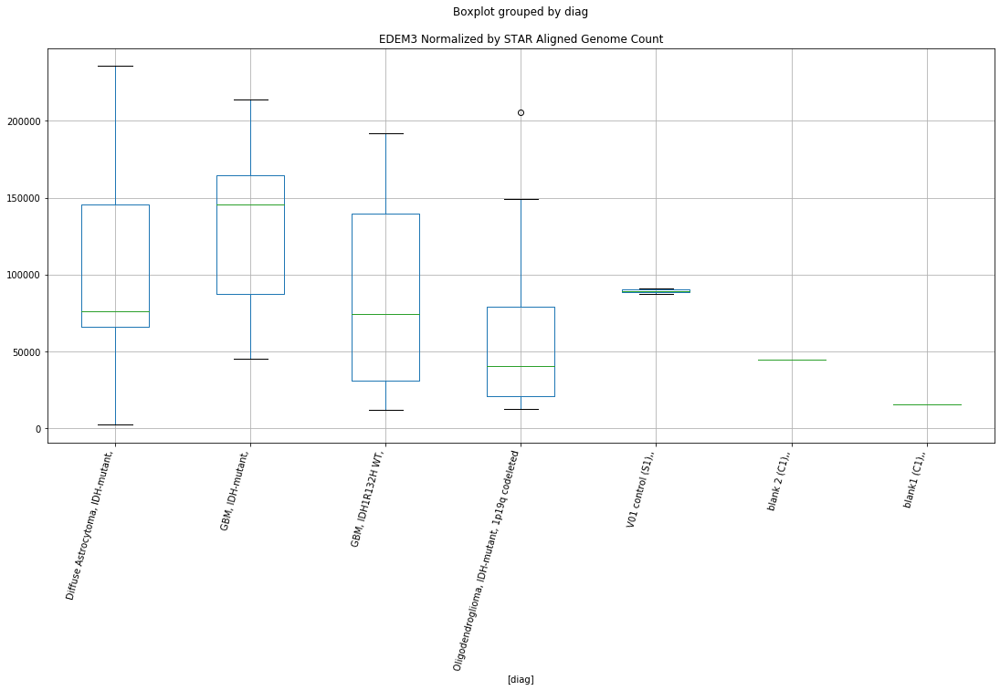

In [94]:
for col in genes:
    for labkit in "D-plex","Lexogen":
        for trimmer in "bbduk1","bbduk2","bbduk3","cutadapt1","cutadapt2","cutadapt3":
            ps=[]
            for diag in diags:
                others=diags.copy()
                others.remove(diag)
                for other in others:
                    t, p = stats.ttest_ind(
                        dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
                            (dfn["diag"]==diag))][col],
                        dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
                            (dfn["diag"]==other))][col])
                    if p < 0.08:
                        print(col+" "+labkit+" "+trimmer+" : "+diag+" - "+other)
                        print("\tt = " + str(t))
                        print("\tp = " + str(p))
                    ps=np.append(ps,p)
            if(any(p < 0.08 for p in ps)):
                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer))].boxplot(column=col,by=['diag'])
                plt.title(col + " Normalized by STAR Aligned Genome Count")
                plt.xticks(rotation=75,ha='right')
                plt.show()


In [95]:
pd.set_option('display.max_columns', default_max_columns)

In [96]:
pd.set_option('display.max_rows',default_max_rows)

In [97]:
pd.set_option('display.precision', default_precision)